LIF model based on https://aip.scitation.org/doi/10.1063/5.0015196

In [1]:
import matplotlib.pyplot as plt   # MatPlotLib is a plotting package. 
import numpy as np                # NumPy is a numerical types package.
from scipy import stats           # ScPy is a scientific computing package. We just want the stats, because Ca2+ imaging is always calculated in z-score.
import math
%matplotlib inline

In [33]:
from posixpath import join
#@title LIF model

# Define LIF neurons:
class LIF_Network:
  def __init__(self, n_neurons = 1000, dimensions = [[0,100],[0,100],[0,100]]):
    # Neuron count
    self.n_neurons = n_neurons
    
    # spatial organization.
    self.dimensions = dimensions;
    self.x = np.random.uniform(low=self.dimensions[0][0], high=self.dimensions[0][1], size=(self.n_neurons,))
    self.y = np.random.uniform(low=self.dimensions[1][0], high=self.dimensions[1][1], size=(self.n_neurons,))
    self.z = np.random.uniform(low=self.dimensions[2][0], high=self.dimensions[2][1], size=(self.n_neurons,))

    # internal time trackers
    self.t = 0                 # current time [ms]
    self.dt = .1               # time step [ms]
    self.t_itt = 0             # time index
    self.relax_time = 10000    # length of relaxation phase [ms]

    # electrophysiology values
    self.v = np.random.uniform(low=-10, high=10, size=(self.n_neurons,)) - 45               #  internal voltage [mV]
    self.v_rest = -38                                                                       #  the resting voltage, equilibrium [mV] def: -38

    self.v_thr = np.ones([self.n_neurons,]) * -40                                           #  reversal potential for spiking [mV]
    self.v_rf_thr = np.ones([self.n_neurons,]) * -40                                        #  reversal potential for spiking during refractory period [mV]
    self.v_rf_tau = 5                                                                       #  the relaxation tau between refractory and normal thresholds.

    self.v_reset = -67                                                                      #  the reset, overshoot voltage [mV]
    self.v_spike = 20                                                                       #  the voltage that spikes rise to [mV]
    self.v_rf_spike = 0                                                                     #  the threshold that changes in the refractory period [mV]
    self.spike_length = 1
    self.spike_flag = np.zeros([self.n_neurons,])
    self.t_spike1 = np.zeros([self.n_neurons,]) - 10000
    self.t_spike2 = np.zeros([self.n_neurons,]) - 10000

    self.g_leak = 10                                                                        #  the conductance of the leak channels [nS]

    tau_c1 = np.sqrt(-2 * np.log(np.random.random(size=(self.n_neurons,))))                 #  membrane time-constant component 1
    tau_c2 = np.cos(2 * np.pi * np.random.random(size=(self.n_neurons,)))                   #  membrane time-constant component 2                                               
    self.m_tau = 7.5 * tau_c1 * tau_c2 + 150                                                #  the membrane time-constant [ms]

    self.syn_tau = 1                                                                        #  the synaptic time-constant [ms]
    self.v_syn = 0                                                                          #  the voltage synapses push the cell membrane towards [mV]
    self.syn_g = np.zeros([self.n_neurons,])                                                #  dynamic tracker of synaptic conductance.
    
    self.g_poisson = 1.3                                                                    #  the conductance of the extrinsic poisson inputs.
    self.poisson_freq = 20 * self.dt * .001                                                 #  poisson input frequency
    self.poisson_input = np.zeros([self.n_neurons,])                                        #  the input vector from external noise
    self.noise_g = np.zeros([self.n_neurons,])                                              #  dynamic tracker of noise conductance.

    # STDP paramters
    self.stdp_beta = 1.4                                                                    #  the balance factor for LTP and LTD
    self.stdp_tau_R = 4                                                                     #  used for the negative half of STDP
    self.stdp_tau_plus = 10                                                                 #  used for the postive half of STDP
    self.stdp_tau_neg = self.stdp_tau_R * self.stdp_tau_plus                                #  used for the negative half of STDP

    self.lamda = 0.02
    self.w_flag = np.zeros([self.n_neurons,])
    
    # Connectivity parameters
    self.p_conn = .07                                                                       #  probability of presynaptic connections from other neurons.
    self.mean_w = 0.5                                                                       #  mean conductance of synapses.
    self.synaptic_delay = 3                                                                 #  the amount of time an AP takes to propogate [ms]. def: 3
    C = 400
    self.network_capacitance = C/self.n_neurons                                             #  I think this capacitance, but I'm not sure.
    self.external_strength = C/5
    self.network_input = np.zeros([self.n_neurons,])                                        #  dynamic tracker of synaptic inputs
    self.network_conn = np.zeros([self.n_neurons,self.n_neurons])                           #  network connectivity
    self.network_W = np.random.random(size=(self.n_neurons,self.n_neurons)) 
    self.random_conn()

  def random_conn(self,):
    pc = np.random.random(size=(self.n_neurons,self.n_neurons))
    self.network_conn = pc < self.p_conn
    self.network_W = np.random.random(size=(self.n_neurons,self.n_neurons))
    self.network_W[self.network_conn == 0] = 0
    self.network_W = self.network_W/np.mean(self.network_W[self.network_W > 0]) * self.mean_w
    self.network_W[self.network_W > 1] = 1
    self.network_W[self.network_W < 0] = 0
    
  def simulate_poisson(self,):
    self.poisson_input = 1 * (np.random.rand(self.n_neurons,) < self.poisson_freq)
  
  def assaySTDP(self):
    %matplotlib inline
    fig = plt.figure()

    for i in range(-100,100,1):
      plt.scatter(i,self.Delta_W_tau(i,0,0),s=2,c='k')

    plt.ylabel('dW')
    plt.xlabel('time offset (pre - post)')
    plt.title('STDP curve')
    plt.show()
    self.random_conn()
    
  def Delta_W_tau(self,time_diff,i,j):
    dW = 0
    if time_diff < -0.01:
      dW = self.lamda * np.exp( time_diff / self.stdp_tau_plus )
    
    if time_diff > 0.01:
      dW = -(self.stdp_beta/self.stdp_tau_R) * self.lamda * np.exp( -time_diff / self.stdp_tau_neg)

    self.network_W[i][j] = self.network_W[i][j] + dW
    self.network_W[self.network_W > 1] = 1
    self.network_W[self.network_W < 0] = 0
    return dW

  def simulate(self, timesteps = 1, I = None):
    if I is None:
      I = []
    n_time = int(timesteps/self.dt)

    # Varaible exporters:
    #t_holder = np.zeros([n_time,])
    #v_holder = np.zeros([n_time,self.n_neurons])
    #gsyn_holder = np.zeros([n_time,self.n_neurons])
    #pois_holder = np.zeros([n_time,self.n_neurons])
    #in_holder = np.zeros([n_time,self.n_neurons])
    #dW_holder = np.zeros([n_time,])

    # Time loop:
    for t in range(n_time):

      # Get poisson inputs:
      self.simulate_poisson()

      # Integrate inputs from noise and synapses
      # Updating to exp decay...
      # self.noise_g = (1-self.dt) * self.noise_g + self.g_poisson * self.poisson_input
      self.noise_g = self.noise_g * np.exp(-self.dt/self.syn_tau) + self.g_poisson * self.poisson_input
      # Updating to exp decay...
      # self.syn_g = (1-self.dt) * self.syn_g + self.network_capacitance * self.network_input
      self.syn_g = self.syn_g * np.exp(-self.dt/self.syn_tau) + self.network_capacitance * self.network_input + self.external_strength*I[t][:]

      # Input reset
      self.network_input = np.zeros([self.n_neurons,])
      self.w_flag = np.zeros([self.n_neurons,])
      dW = 0

      # Update V and Thr
      self.v = self.v + self.dt * ( ( (self.v_rest - self.v) - (self.noise_g + self.syn_g) * self.v) / self.m_tau )
      self.v_thr = self.v_thr + self.dt * (self.v_rf_thr - self.v_thr) / self.v_rf_tau

      # Do spike calculations:
      sp = (self.v >= self.v_thr) * (self.spike_flag == 0)
      self.spike_flag[sp] = 1
      self.w_flag[sp] = 1
      self.t_spike1[sp] = self.t_spike2[sp]
      self.t_spike2[sp] = self.t

      f = (self.spike_flag == 1)
      self.v[f] = self.v_spike
      self.v_thr[f] = self.v_rf_spike

      t_offset = self.t_spike2+self.spike_length <= self.t
      self.spike_flag[t_offset * f] = 0
      self.v[t_offset * f] = self.v_reset

      s_difference = self.t-(self.t_spike2+self.synaptic_delay)
      s_flag = 1.0 * (abs(s_difference) < .01)
      self.network_input = np.matmul(s_flag.T, self.network_W * self.network_conn)

      # STDP:
      if self.w_flag.any():
        for i in range(self.n_neurons):
          if (self.w_flag[i] == 1):
            for j in range(self.n_neurons):

              # Check for last spike of pre-synaptic partners:
              if self.network_conn[i][j] == 1:
                
                # TD       =   (post-synaptic spike - pre-synaptic spike (+) offset by delay)
                temporal_diff = self.t_spike2[i] - self.t_spike2[j]   + self.synaptic_delay
                if temporal_diff > 0:
                  dW = dW + self.Delta_W_tau(temporal_diff,i,j)
                else:
                  temporal_diff = self.t_spike2[i] - self.t_spike1[j] + self.synaptic_delay
                  dW = dW + self.Delta_W_tau(temporal_diff,i,j)

              # Now inform post-synaptic parters about spike.
              if self.network_conn[j][i] == 1: 
                temporal_diff =  self.t_spike2[j] - self.t_spike2[i] + self.synaptic_delay
                dW = dW + self.Delta_W_tau(temporal_diff,j,i)

      # End of Epoch:
      #t_holder[self.t_itt] = self.t
      #v_holder[:][self.t_itt] = self.v   
      #gsyn_holder[:][self.t_itt] = self.syn_g + self.noise_g
      #pois_holder[:][self.t_itt] = self.poisson_input
      #in_holder[:][self.t_itt] = self.network_input
      #dW_holder[self.t_itt] = dW

      self.t_itt += 1
      self.t += self.dt
      
    #return v_holder, gsyn_holder, pois_holder, t_holder, in_holder, dW_holder
 

1


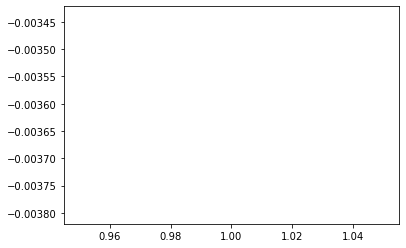

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [10]:
x = []
y = []

for o in range(1, 500, 2):
  for i in range(10):
    nof = 5
    n = 200
    d=[]
    LIF = LIF_Network(n_neurons=n)
    dt = LIF.dt

    T = 1000
    I = np.zeros(shape = [T,n])
    # add impulses to the outside actvity
    stim = np.zeros([T,nof]) 
    ConnStimNetwork = np.zeros([nof,n])
    probability = 0.2

    for c in range(n):
      for c2 in range(nof):
        Q = np.random.randint(0, high=99)
        if Q/100 < probability:
          ConnStimNetwork[c2,c] = 1

    stimorder = np.arange(nof)
    np.random.shuffle(stimorder)

    freq = o
    num = int((T/freq)/dt)
    stim_length = int(T/nof)

    for j in range(0,nof):
      for i in range(j*stim_length,(j+1)*stim_length,num): 
        if i<T:
          stim[i][stimorder[j]] = 1 
          I[i] [ConnStimNetwork[j,:]>0] = 1

    %matplotlib inline
    fig = plt.figure()
    #fig.set_size_inches(22, 15)
    #ax = fig.add_subplot()
    #plt.imshow(I.T,aspect='equal',interpolation='none')
    #ax.set_aspect('auto')
    #plt.ylabel('Neuron index')
    #plt.xlabel('Connectivity to other neurons')
    #plt.title('Connectivity map')
    #plt.colorbar()
    #plt.show()

    for i in range(100):
        W1 = np.copy(LIF.network_W)
        mean_W1 = np.mean(W1[W1 > 0].flatten())

        plotter2(LIF,T*dt, I, pN = 5)

        W2 = np.copy(LIF.network_W)
        mean_W2 = np.mean(W2[W1 > 0].flatten())

        mean_W3 = mean_W2-mean_W1
        d.append(mean_W3)

  #print(o,  mean_W3)
  h=sum(d) / len(d)
  x.append(o)
  y.append(h)
  print(o)
  plt.plot(x,y)
  plt.show()

In [43]:
pip install datetime

Note: you may need to restart the kernel to use updated packages.


In [ ]:
#Really long simulation time cell:

now = 2022-11-30 15:02:31.926358
now = 2022-11-30 15:03:26.139015
1 0.5328076614359043


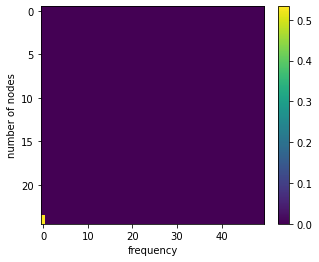

now = 2022-11-30 15:04:19.986523
2 0.5264018404162979


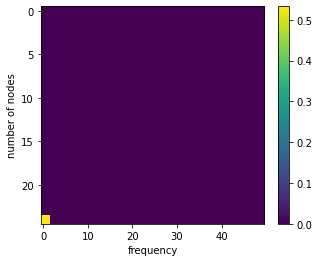

now = 2022-11-30 15:05:14.069916
3 0.5243087415500935


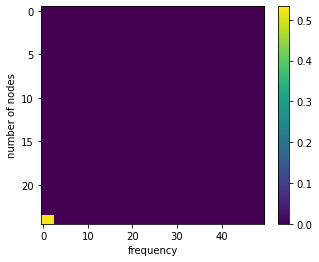

now = 2022-11-30 15:06:09.509279
4 0.5265589903380518


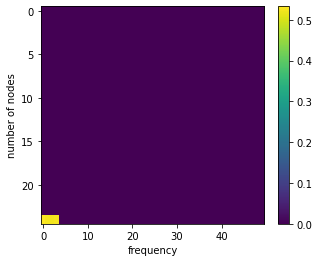

now = 2022-11-30 15:07:07.739888
5 0.5242686377637249


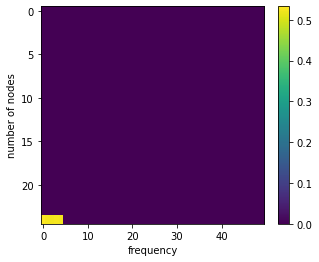

now = 2022-11-30 15:08:04.292712
6 0.5252032334533644


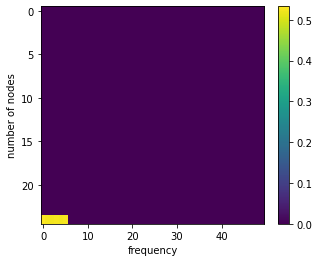

now = 2022-11-30 15:09:02.185220
7 0.5327204113404381


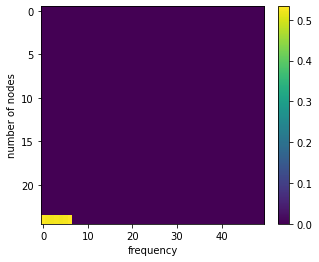

now = 2022-11-30 15:10:00.015063
8 0.529027423023446


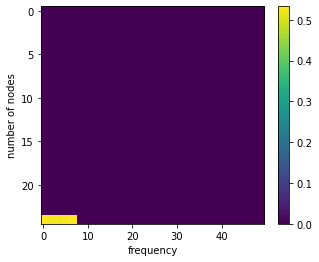

now = 2022-11-30 15:10:58.207170
9 0.5316625316244572


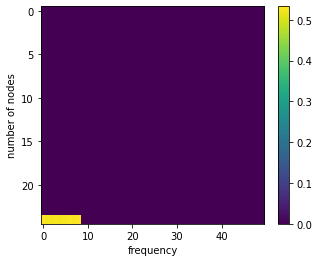

now = 2022-11-30 15:11:54.933068
10 0.538655990202626


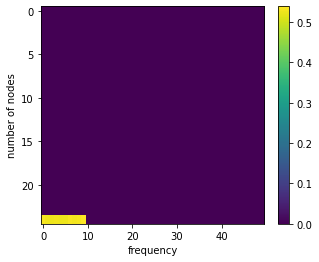

now = 2022-11-30 15:12:50.977725
11 0.5322310569195501


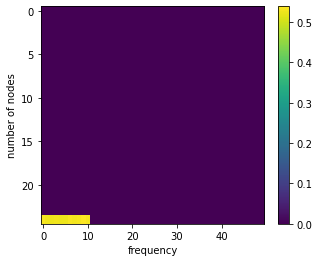

now = 2022-11-30 15:13:49.194047
12 0.5284997680889585


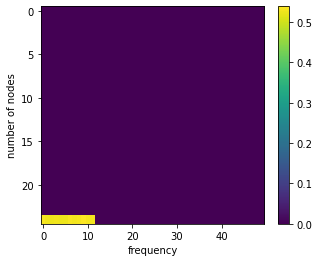

now = 2022-11-30 15:14:47.374702
13 0.5226770100147201


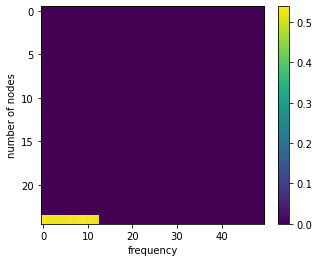

now = 2022-11-30 15:16:40.622951
14 0.5300545546179809


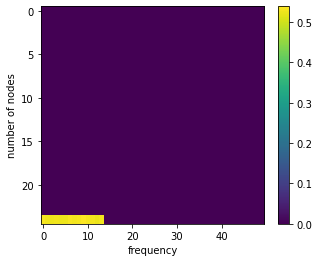

now = 2022-11-30 15:19:05.885375
15 0.5240689065849647


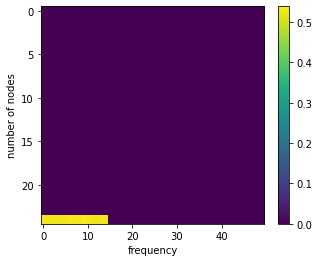

now = 2022-11-30 15:22:01.069802
16 0.519936801747545


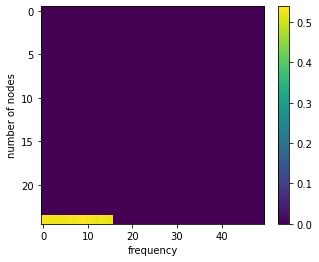

now = 2022-11-30 15:24:38.720353
17 0.5177723581972531


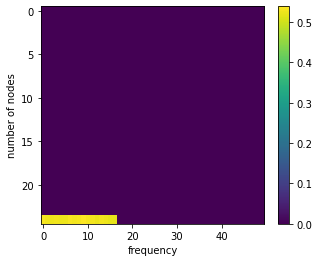

now = 2022-11-30 15:27:24.535533
18 0.5329766004497041


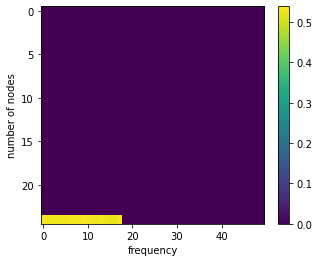

now = 2022-11-30 15:30:20.918620
19 0.5261417150293682


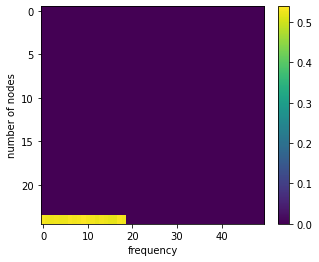

now = 2022-11-30 15:35:26.207770
20 0.5367764978656502


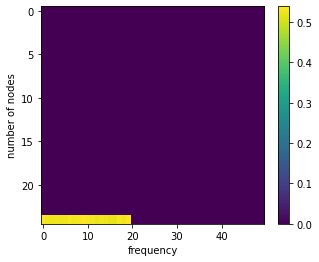

now = 2022-11-30 15:37:57.296113
21 0.5277039402451809


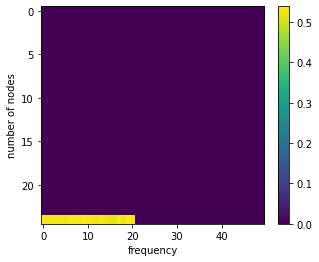

now = 2022-11-30 15:40:26.490229
22 0.528556141047821


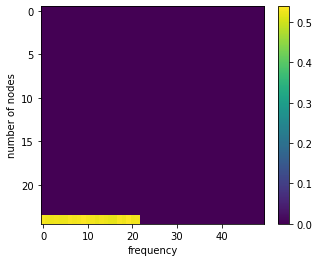

now = 2022-11-30 15:42:58.995090
23 0.5276796108588967


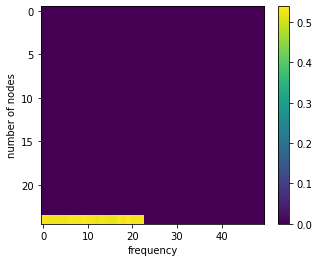

now = 2022-11-30 15:45:23.598023
24 0.5302563908625021


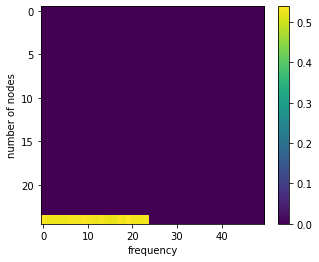

now = 2022-11-30 15:47:42.670694
25 0.5289347027268179


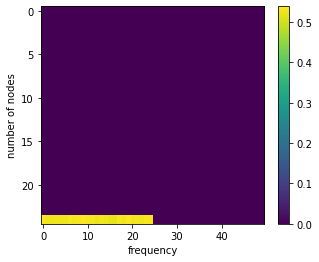

now = 2022-11-30 15:49:51.801459
26 0.5326933993181792


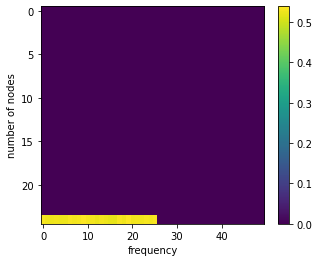

now = 2022-11-30 15:52:25.883783
27 0.5278030544139652


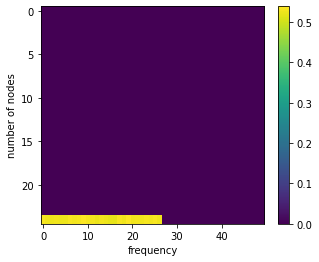

now = 2022-11-30 15:55:11.989523
28 0.5213990896015306


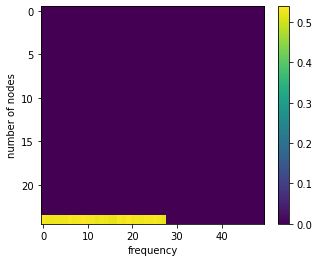

now = 2022-11-30 15:57:39.084278
29 0.5313691990525059


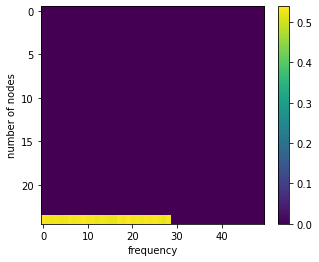

now = 2022-11-30 16:00:15.753508
30 0.5281034278943278


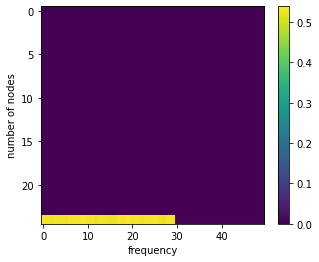

now = 2022-11-30 16:03:33.376904
31 0.5310958090555944


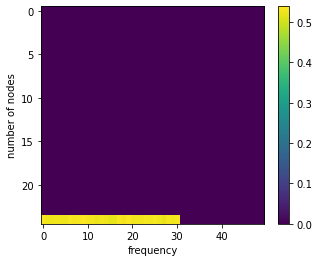

now = 2022-11-30 16:06:20.025349
32 0.5246204980489801


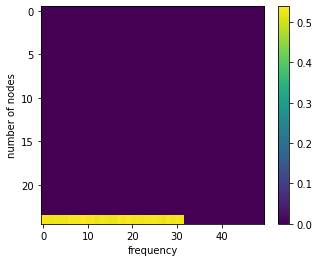

now = 2022-11-30 16:09:08.019589
33 0.5358276728087541


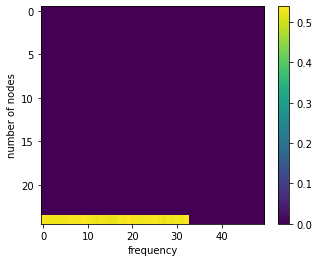

now = 2022-11-30 16:11:47.948963
34 0.5308276457681237


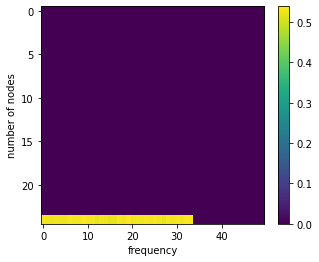

now = 2022-11-30 16:14:54.136152
35 0.5301980574636147


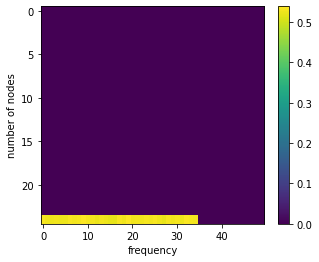

now = 2022-11-30 16:16:35.478774
36 0.5261345767357837


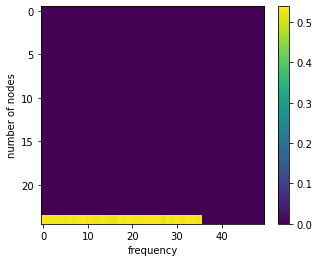

now = 2022-11-30 16:17:40.836966
37 0.5257541401732402


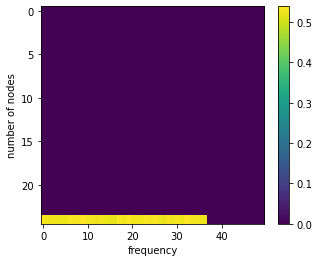

now = 2022-11-30 16:18:49.859252
38 0.5201477898019173


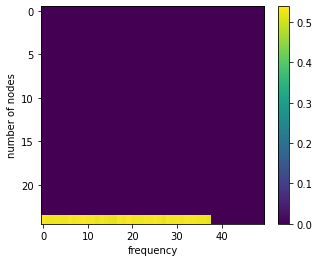

now = 2022-11-30 16:19:55.602069
39 0.5215890223696737


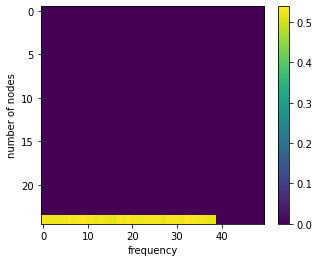

now = 2022-11-30 16:20:55.902547
40 0.5260651917157289


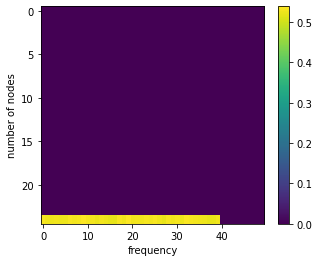

now = 2022-11-30 16:22:03.539270
41 0.5259277896767927


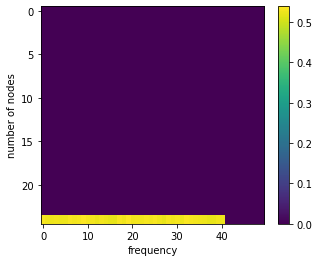

now = 2022-11-30 16:23:08.675467
42 0.5304082936757906


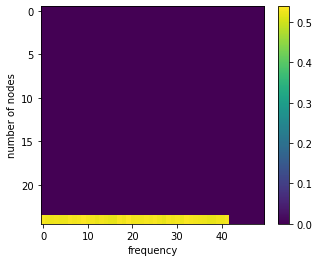

now = 2022-11-30 16:24:08.276849
43 0.5381277819698759


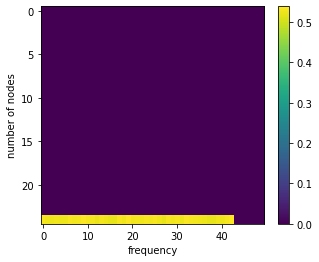

now = 2022-11-30 16:25:08.673697
44 0.528075558603428


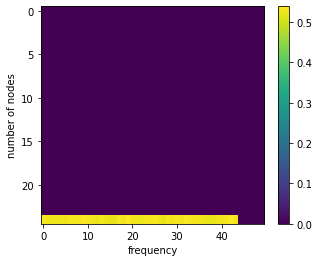

now = 2022-11-30 16:26:10.802446
45 0.5273047122441618


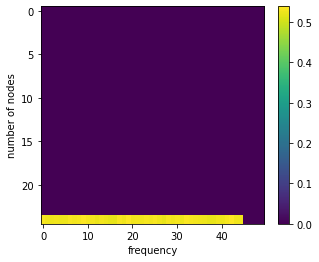

now = 2022-11-30 16:27:13.859871
46 0.5179505939216725


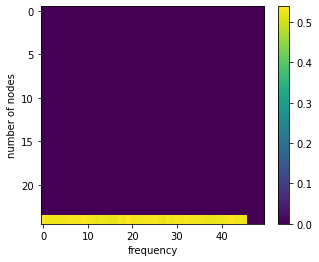

now = 2022-11-30 16:28:15.460683
47 0.5309366772503169


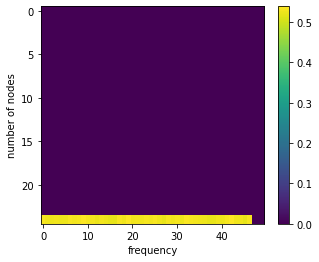

now = 2022-11-30 16:29:18.805772
48 0.5268943383690692


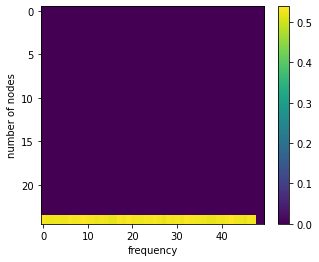

now = 2022-11-30 16:30:21.310433
49 0.5271408489489915


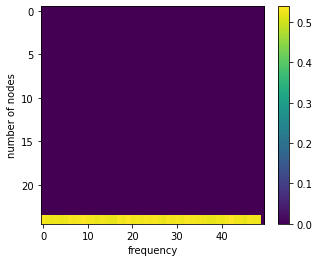

now = 2022-11-30 16:31:21.644298
50 0.5358868721307574


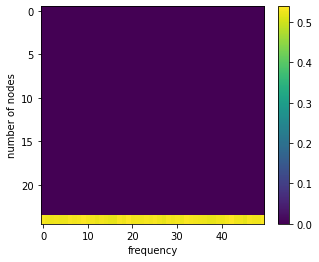

now = 2022-11-30 16:32:22.202371
51 0.53119202203243


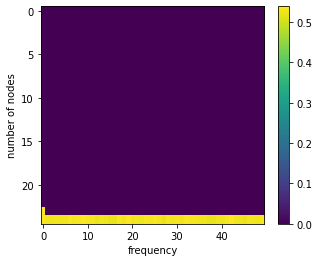

now = 2022-11-30 16:33:23.204067
52 0.5203174169126301


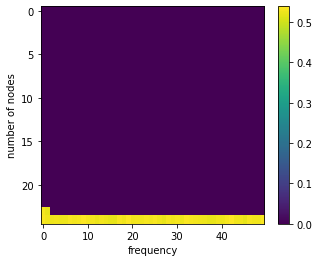

now = 2022-11-30 16:34:25.333971
53 0.5214621641833217


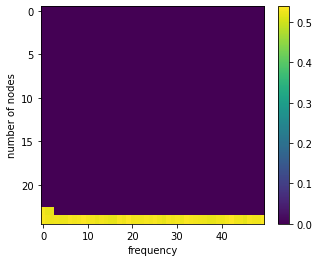

now = 2022-11-30 16:35:25.751416
54 0.5206469940490039


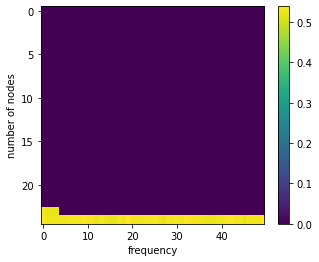

now = 2022-11-30 16:36:25.027064
55 0.5311020516272554


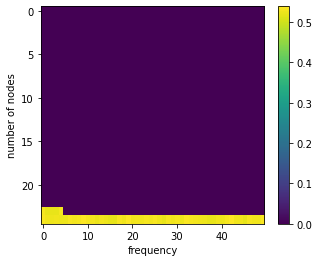

now = 2022-11-30 16:37:24.473750
56 0.5266491570586199


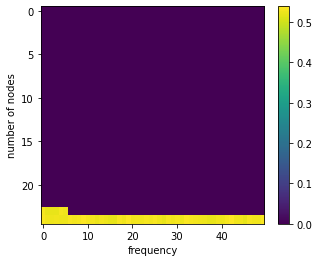

now = 2022-11-30 16:38:25.704042
57 0.526384124796616


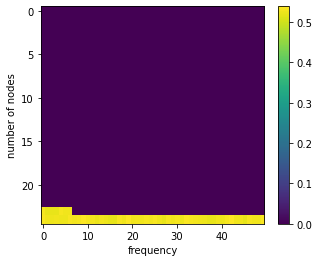

now = 2022-11-30 16:39:29.247405
58 0.5267538522112507


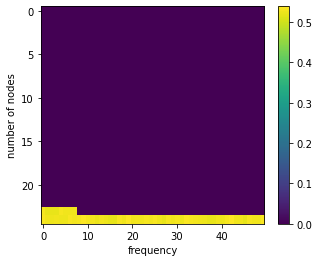

now = 2022-11-30 16:40:34.090552
59 0.5299513124630805


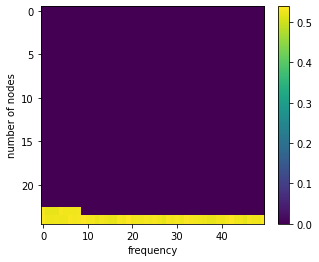

now = 2022-11-30 16:41:34.999478
60 0.5305231331935615


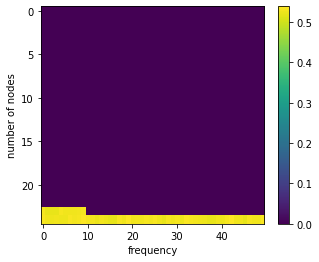

now = 2022-11-30 16:42:34.740310
61 0.5345280001314149


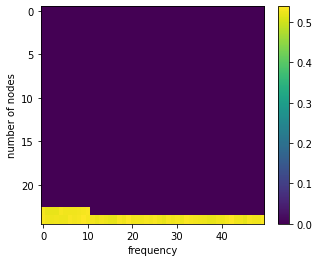

now = 2022-11-30 16:43:34.478570
62 0.5287861221567737


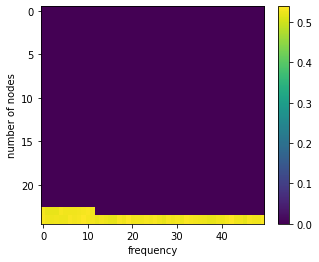

now = 2022-11-30 16:57:33.331279
63 0.5300518438964765


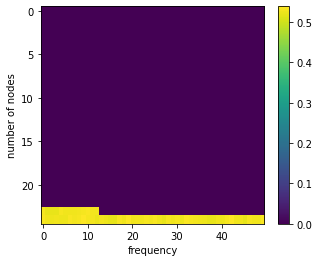

now = 2022-11-30 17:10:46.567618
64 0.5291799082652274


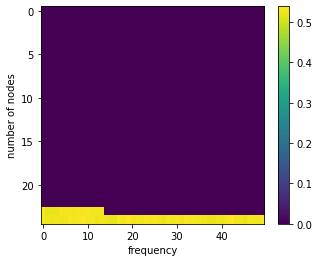

now = 2022-11-30 17:11:46.567129
65 0.5223921730171692


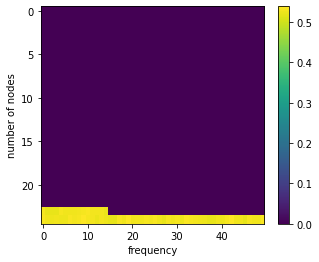

now = 2022-11-30 17:12:49.155825
66 0.5327483682244241


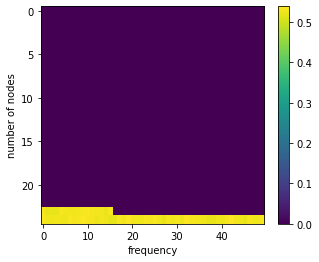

now = 2022-11-30 17:13:50.633039
67 0.5263671356086532


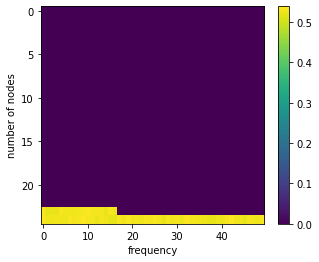

now = 2022-11-30 17:14:51.007376
68 0.5237352102502939


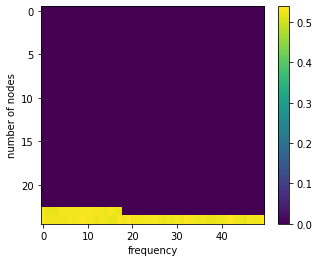

now = 2022-11-30 17:15:51.038587
69 0.5275368645319455


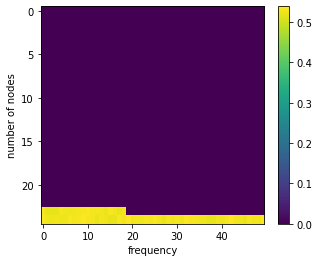

now = 2022-11-30 17:16:49.701497
70 0.5360712677234515


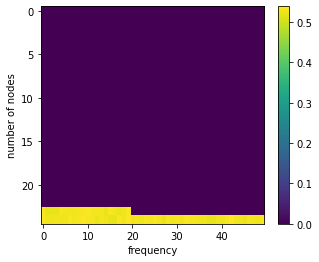

now = 2022-11-30 17:17:52.793079
71 0.5275033123413132


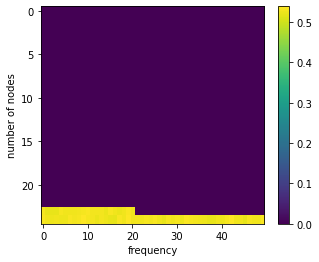

now = 2022-11-30 17:18:54.053391
72 0.5244393115739138


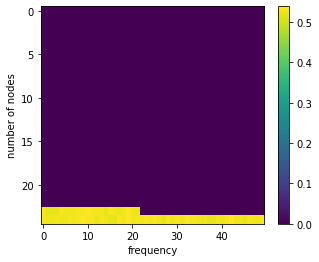

now = 2022-11-30 17:19:55.456005
73 0.5347261173053246


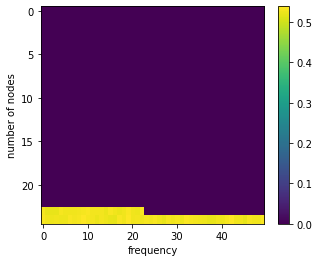

now = 2022-11-30 17:20:54.423176
74 0.5234652479208126


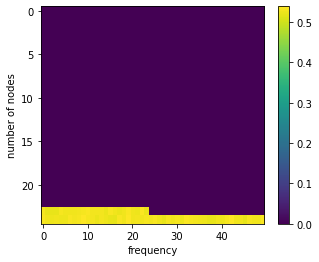

now = 2022-11-30 17:21:54.033688
75 0.5305649875582705


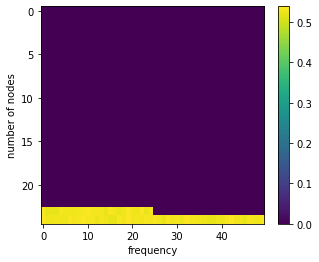

now = 2022-11-30 17:22:48.098826
76 0.5321455012745121


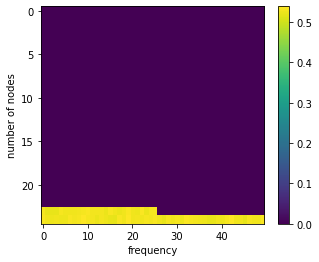

now = 2022-11-30 17:23:42.685748
77 0.5262409575375362


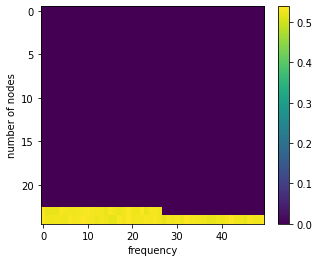

now = 2022-11-30 17:24:37.740242
78 0.5326974221237396


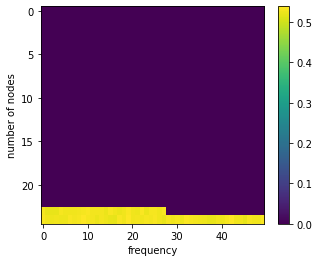

now = 2022-11-30 17:25:32.383341
79 0.5327532020411102


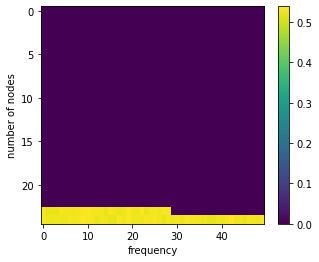

now = 2022-11-30 17:26:26.691569
80 0.525191893811186


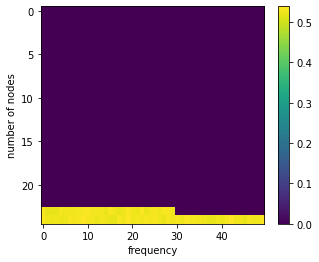

now = 2022-11-30 17:27:21.858584
81 0.5310977731211057


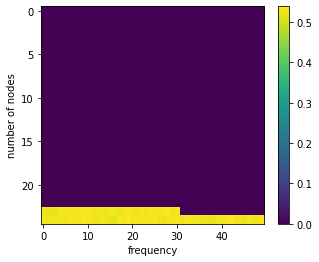

now = 2022-11-30 17:28:15.597447
82 0.5315096058371859


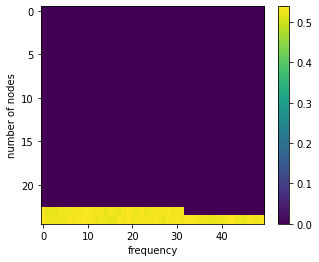

now = 2022-11-30 17:29:10.199893
83 0.5249251982608724


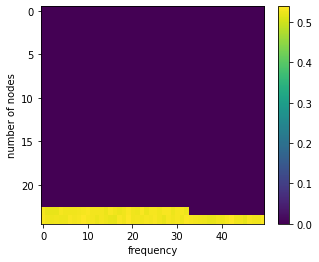

now = 2022-11-30 17:30:04.687284
84 0.5257199001188494


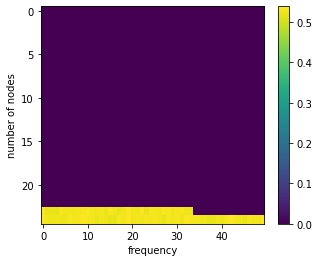

now = 2022-11-30 17:30:59.482291
85 0.5273095792079789


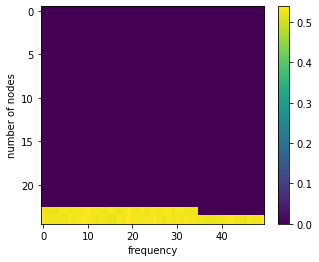

now = 2022-11-30 17:31:54.827905
86 0.5296701736485956


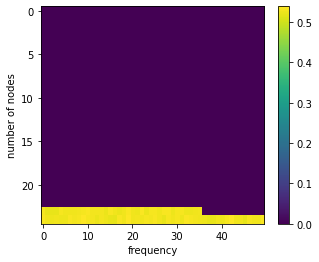

now = 2022-11-30 17:32:49.678235
87 0.5289249863613759


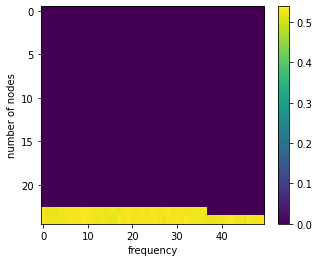

now = 2022-11-30 17:33:44.250323
88 0.5374254559563273


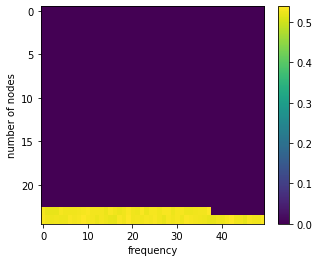

now = 2022-11-30 17:34:38.701914
89 0.5322240579381513


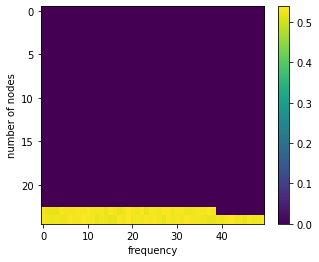

now = 2022-11-30 17:35:33.546821
90 0.531651678827159


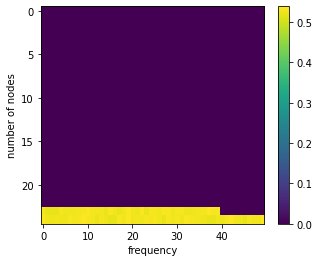

now = 2022-11-30 17:36:27.973297
91 0.5237581640291522


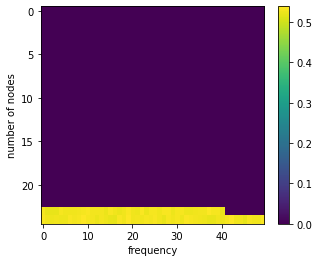

now = 2022-11-30 17:37:23.566307
92 0.5306187953370869


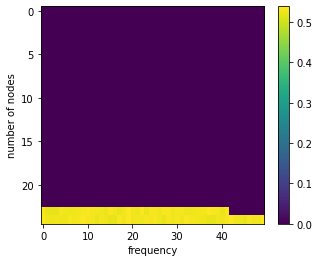

now = 2022-11-30 17:38:19.532286
93 0.5276599797798082


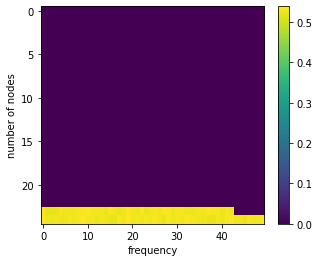

now = 2022-11-30 17:39:14.733892
94 0.5167920601741791


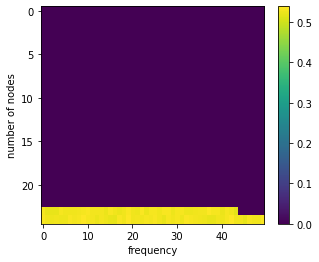

now = 2022-11-30 17:40:08.632120
95 0.5299736395792368


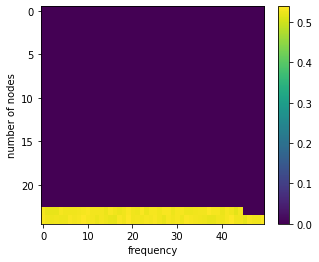

now = 2022-11-30 17:41:04.142649
96 0.5307438421098869


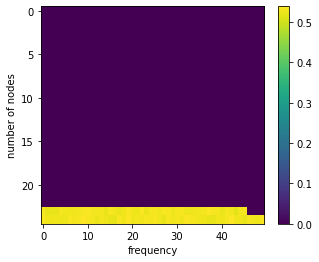

now = 2022-11-30 17:41:59.502404
97 0.5319239871082357


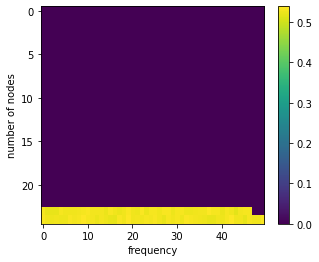

now = 2022-11-30 17:42:53.648811
98 0.5271199323315633


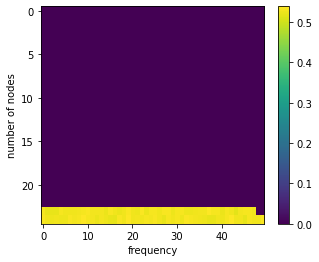

now = 2022-11-30 17:43:48.708162
99 0.5346627773625534


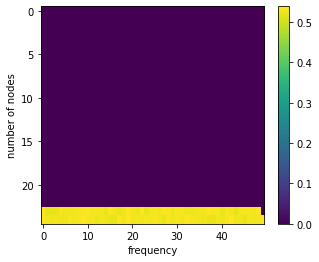

now = 2022-11-30 17:44:42.961506
100 0.5302646463123516


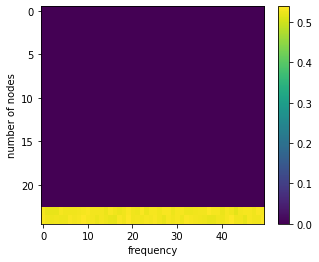

now = 2022-11-30 17:45:36.509524
101 0.5288589453638205


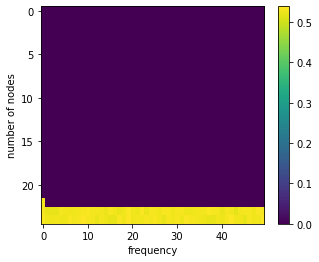

now = 2022-11-30 17:46:32.446818
102 0.5276150577796793


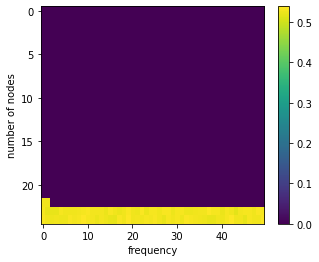

now = 2022-11-30 17:47:27.718862
103 0.5401732592866755


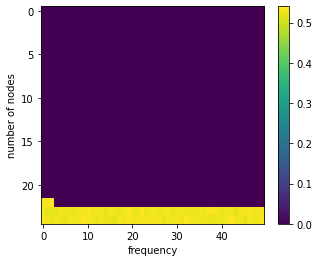

now = 2022-11-30 17:48:21.343347
104 0.5357709645376698


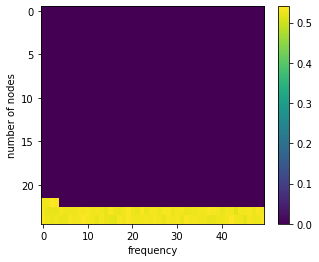

now = 2022-11-30 17:49:16.213082
105 0.5229586265026887


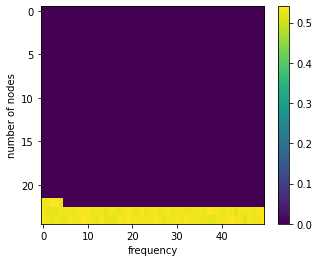

now = 2022-11-30 17:50:10.274535
106 0.5366845859442327


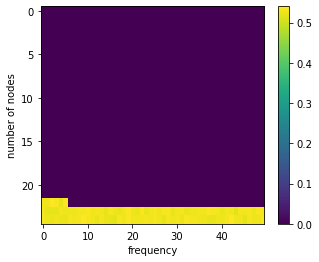

now = 2022-11-30 17:51:04.693268
107 0.5224169030289999


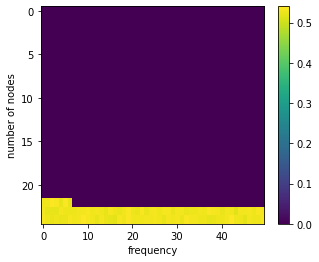

now = 2022-11-30 17:51:58.983503
108 0.5236297121611246


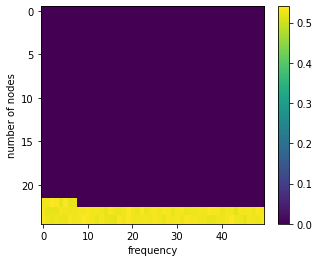

now = 2022-11-30 17:52:54.619141
109 0.5239165716345785


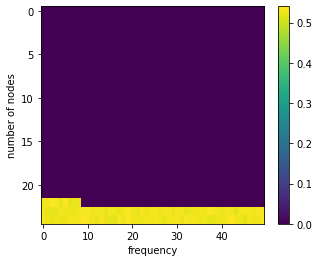

now = 2022-11-30 17:53:49.171605
110 0.5305688294835339


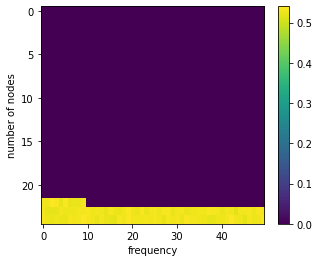

now = 2022-11-30 17:54:43.844345
111 0.5259051656230357


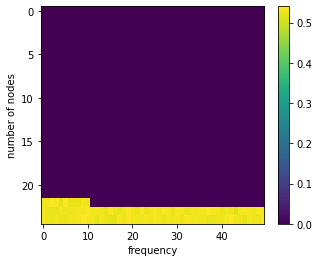

now = 2022-11-30 17:55:38.023585
112 0.5301813771213741


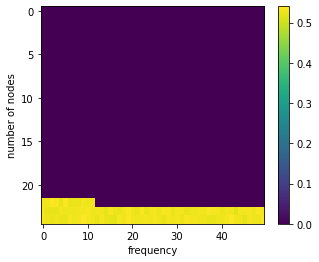

now = 2022-11-30 17:56:32.441247
113 0.5274936399305974


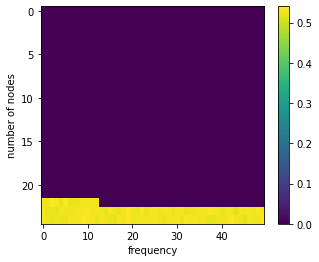

now = 2022-11-30 17:57:27.980888
114 0.530210907122024


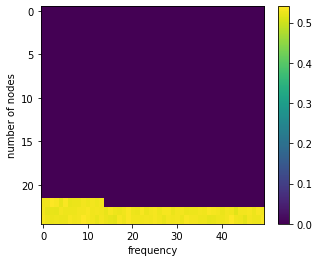

now = 2022-11-30 17:58:21.851672
115 0.5303954439967599


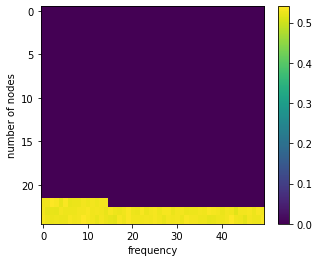

now = 2022-11-30 17:59:16.658921
116 0.5279299407513909


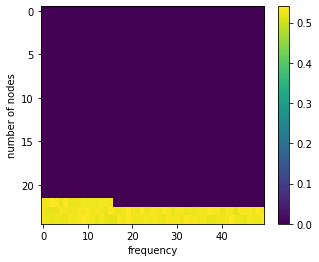

now = 2022-11-30 18:00:12.090654
117 0.5369693354092736


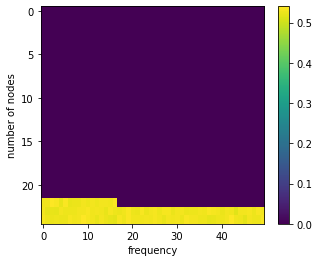

now = 2022-11-30 18:01:06.417042
118 0.5326952775523858


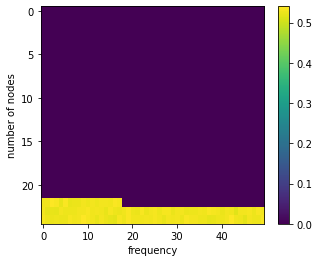

now = 2022-11-30 18:02:00.187594
119 0.5193493634889358


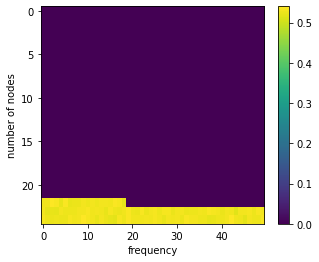

now = 2022-11-30 18:02:54.540279
120 0.5310095756734343


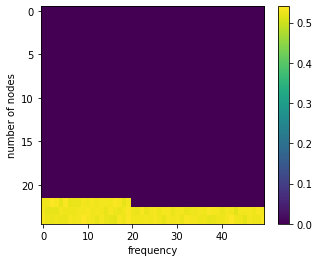

now = 2022-11-30 18:03:49.405482
121 0.5291611955259441


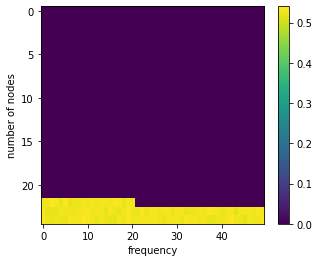

now = 2022-11-30 18:04:44.542169
122 0.5308413388244061


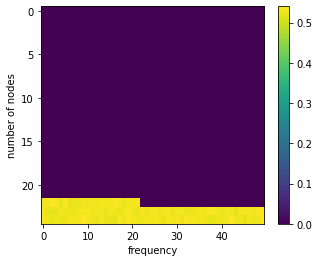

now = 2022-11-30 18:05:39.447538
123 0.5286936326819728


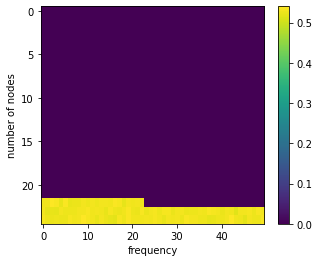

now = 2022-11-30 18:06:34.273734
124 0.5262987752631512


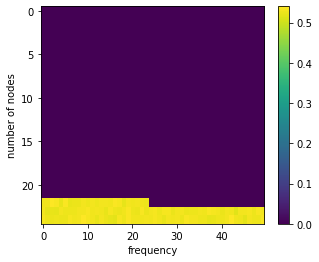

now = 2022-11-30 18:07:28.136196
125 0.5238123316950452


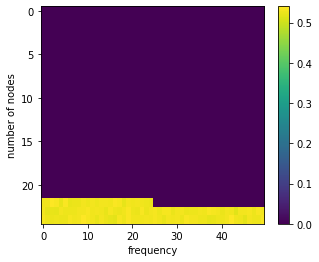

now = 2022-11-30 18:08:24.466709
126 0.534796945923282


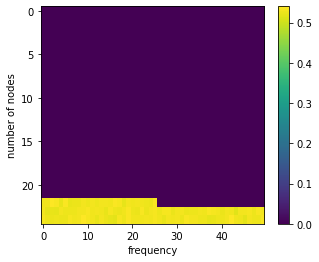

now = 2022-11-30 18:09:19.488202
127 0.52455608648398


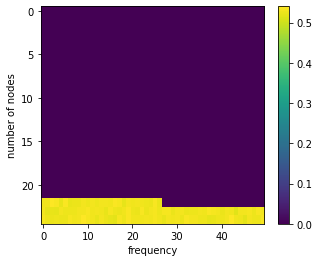

now = 2022-11-30 18:10:14.321876
128 0.530309704386113


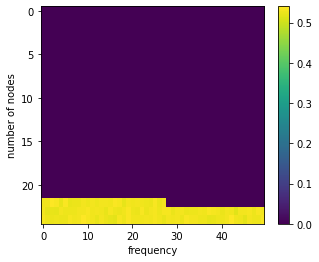

now = 2022-11-30 18:11:09.595010
129 0.5276102446709923


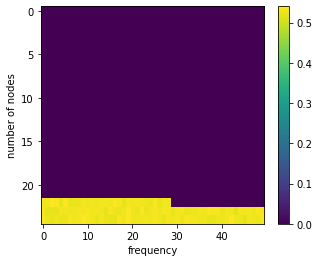

now = 2022-11-30 18:12:04.346482
130 0.5334632421427394


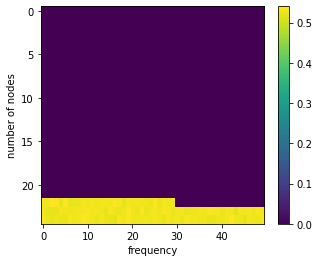

now = 2022-11-30 18:12:58.884998
131 0.5296526830079606


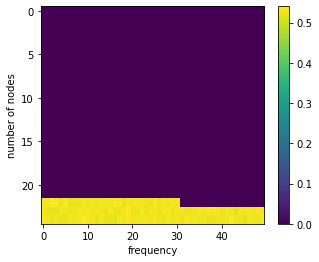

now = 2022-11-30 18:13:53.631355
132 0.5339198797310716


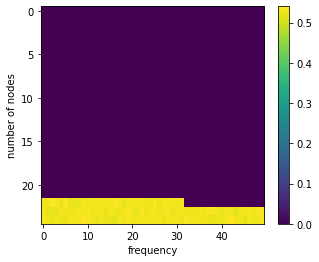

now = 2022-11-30 18:14:49.053943
133 0.5249545007589651


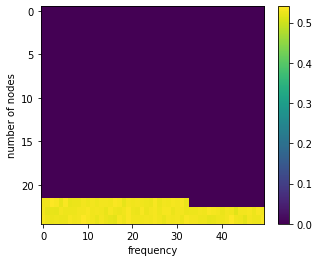

now = 2022-11-30 18:15:42.647972
134 0.5338400556002771


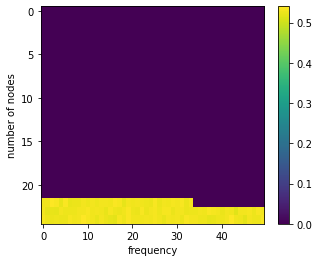

now = 2022-11-30 18:16:36.151908
135 0.5267690886508126


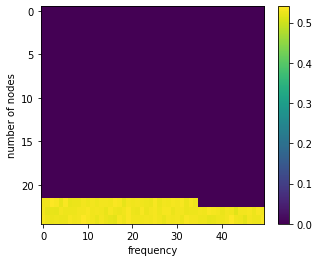

now = 2022-11-30 18:17:30.697625
136 0.524268394425818


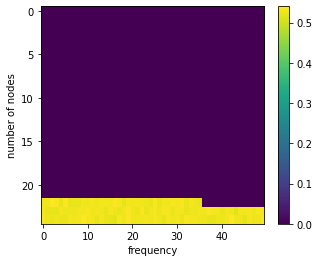

now = 2022-11-30 18:18:25.781958
137 0.5294863196730332


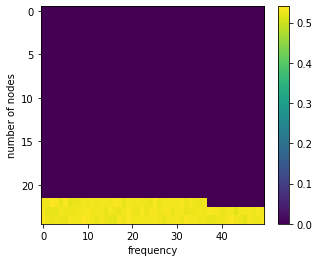

now = 2022-11-30 18:19:20.071933
138 0.5281518435482758


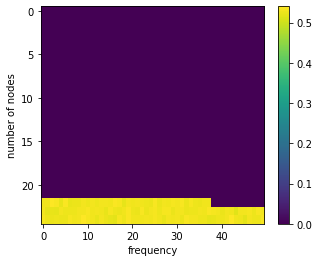

now = 2022-11-30 18:20:14.191302
139 0.534124660445656


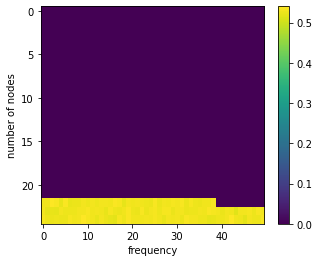

now = 2022-11-30 18:21:09.938618
140 0.5325830424954218


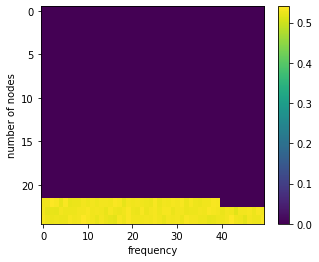

now = 2022-11-30 18:22:05.914719
141 0.5256779469310039


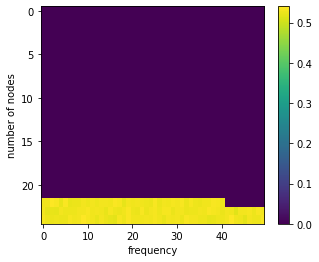

now = 2022-11-30 18:23:01.089993
142 0.5247855972545792


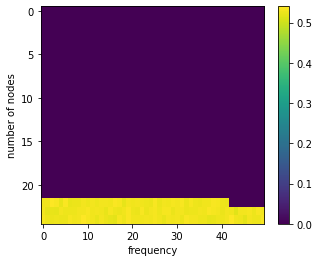

now = 2022-11-30 18:23:55.682577
143 0.535148737552606


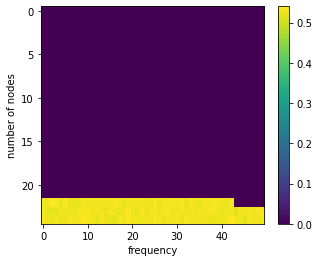

now = 2022-11-30 18:24:50.840860
144 0.532093201222325


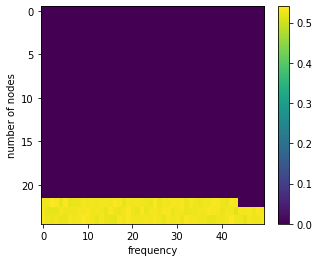

now = 2022-11-30 18:25:45.472326
145 0.5346645952749083


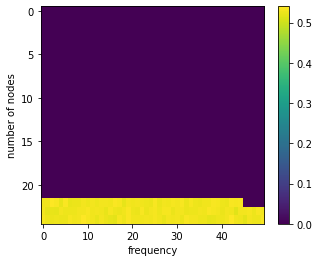

now = 2022-11-30 18:26:40.521583
146 0.5361337536122642


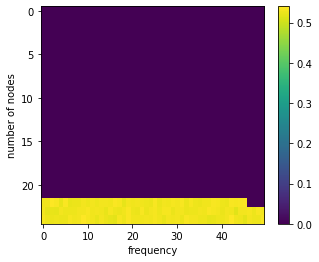

now = 2022-11-30 18:27:35.133591
147 0.5294984946482412


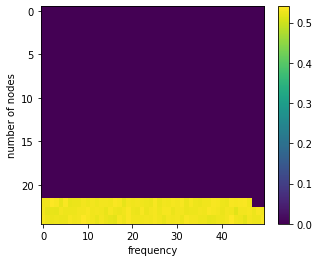

now = 2022-11-30 18:28:29.847748
148 0.5267793086708654


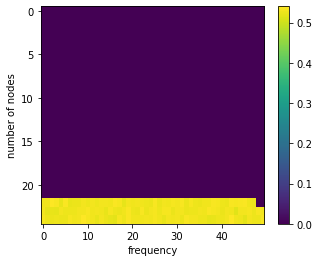

now = 2022-11-30 18:29:24.565642
149 0.5273864227905694


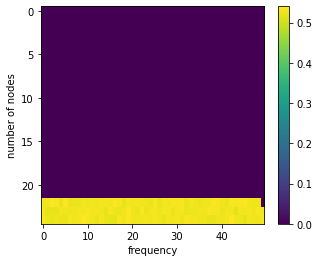

now = 2022-11-30 18:30:19.163439
150 0.5313924127566807


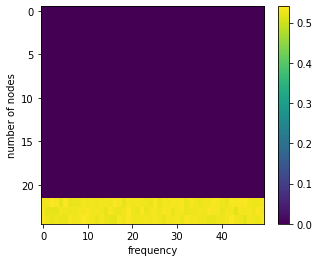

now = 2022-11-30 18:31:13.439382
151 0.5337679550494782


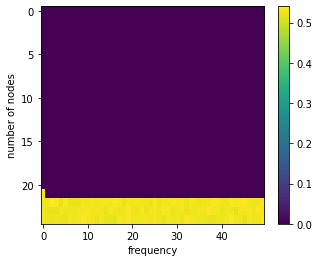

now = 2022-11-30 18:32:07.466518
152 0.5285578132881565


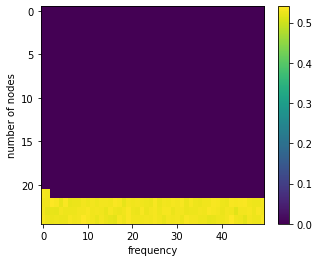

now = 2022-11-30 18:33:02.307668
153 0.5332694546314565


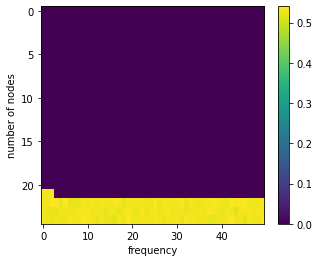

now = 2022-11-30 18:33:55.844128
154 0.529359277872521


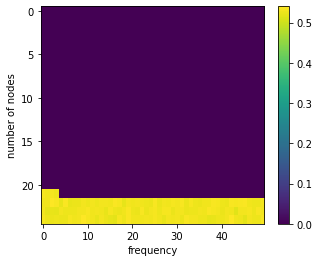

now = 2022-11-30 18:34:50.041631
155 0.5276370154817968


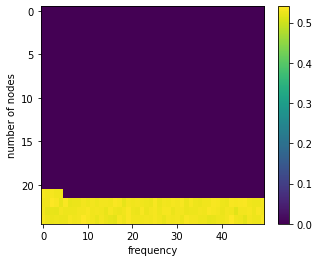

now = 2022-11-30 18:35:43.861645
156 0.5209280887001324


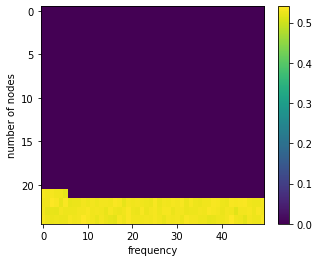

now = 2022-11-30 18:36:38.806361
157 0.5329598566646726


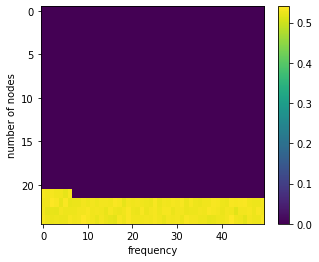

now = 2022-11-30 18:37:33.434296
158 0.526332585759399


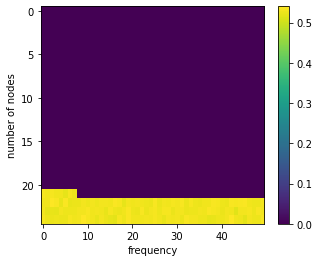

now = 2022-11-30 18:38:27.181159
159 0.5346998564066963


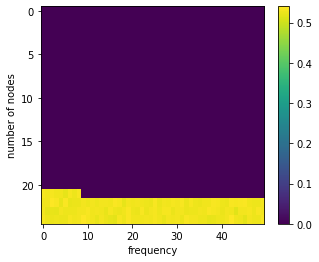

now = 2022-11-30 18:39:22.175454
160 0.5327338677705316


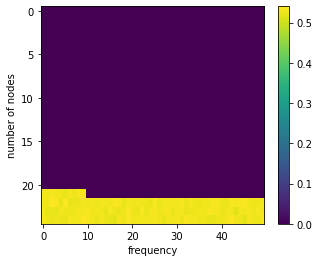

now = 2022-11-30 18:40:18.085052
161 0.5310394020018087


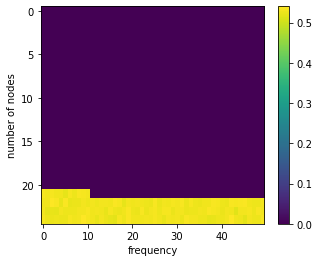

now = 2022-11-30 18:41:13.287608
162 0.5225048260923031


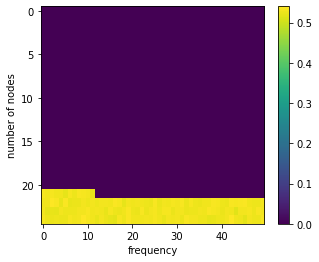

now = 2022-11-30 18:42:07.719543
163 0.5310089944632711


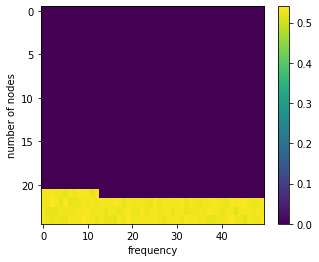

now = 2022-11-30 18:43:03.099238
164 0.5268103246012882


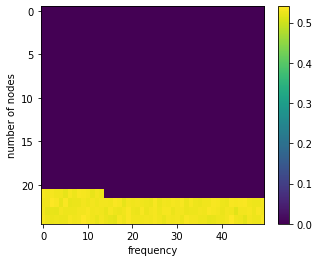

now = 2022-11-30 18:43:58.440548
165 0.5289448406256412


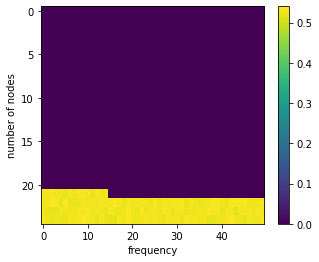

now = 2022-11-30 18:44:52.424664
166 0.5312385730680196


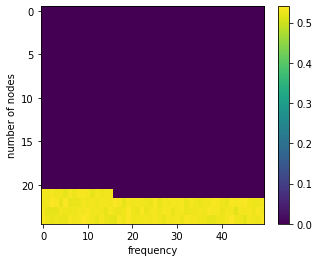

now = 2022-11-30 18:45:45.887754
167 0.5246171516844979


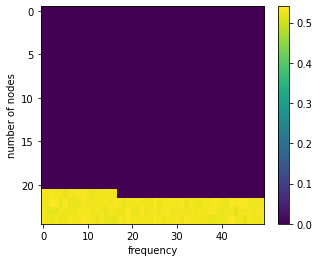

now = 2022-11-30 18:46:41.286536
168 0.520503844054236


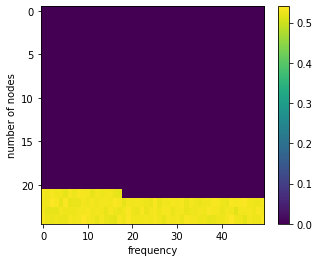

now = 2022-11-30 18:47:35.927149
169 0.5339281354883936


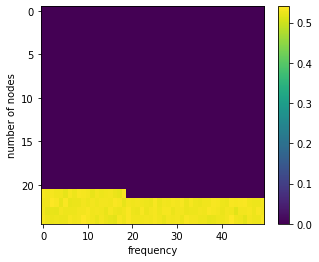

now = 2022-11-30 18:48:31.204151
170 0.5256091343234475


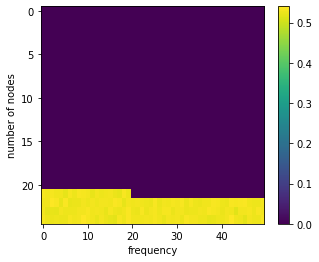

now = 2022-11-30 18:49:25.531048
171 0.531011431257936


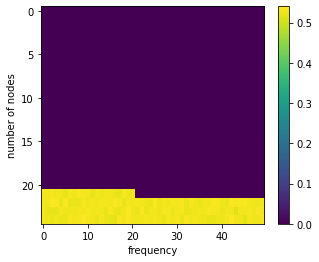

now = 2022-11-30 18:50:19.821551
172 0.5294737780272462


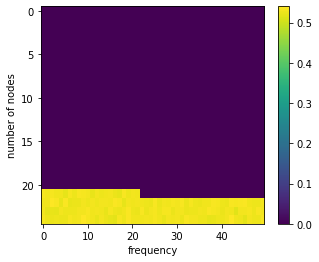

now = 2022-11-30 18:51:13.499880
173 0.5319011882051607


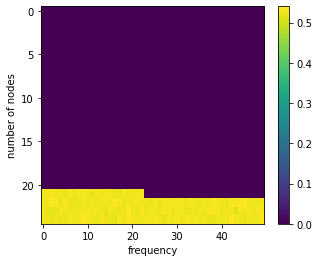

now = 2022-11-30 18:52:08.426603
174 0.5310876168910912


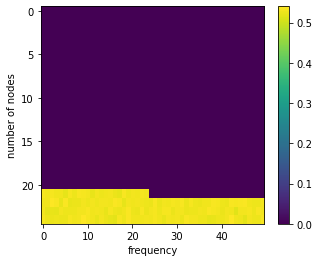

now = 2022-11-30 18:53:04.281769
175 0.5289664103888746


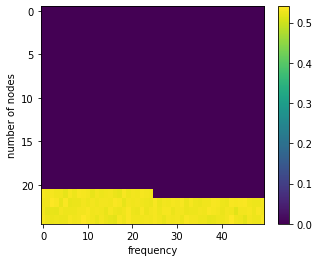

now = 2022-11-30 18:53:59.246453
176 0.5270781191043121


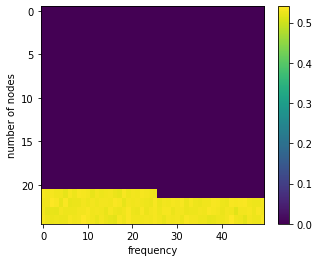

now = 2022-11-30 18:54:53.688379
177 0.5231636533175188


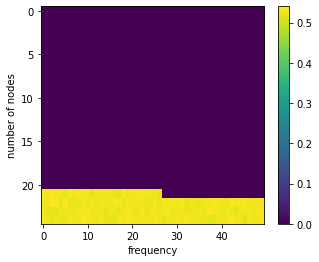

now = 2022-11-30 18:55:47.080955
178 0.5278781336464438


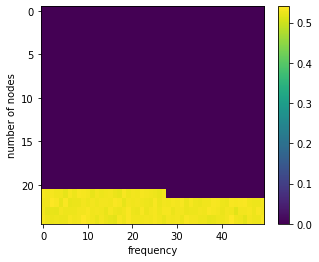

now = 2022-11-30 18:56:42.763051
179 0.5343735341172717


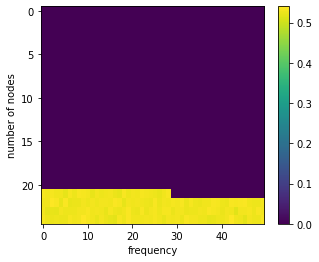

now = 2022-11-30 18:57:38.219814
180 0.5319113461841806


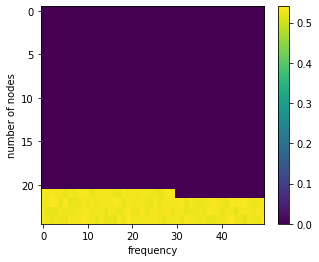

now = 2022-11-30 18:58:33.416240
181 0.5335843614100517


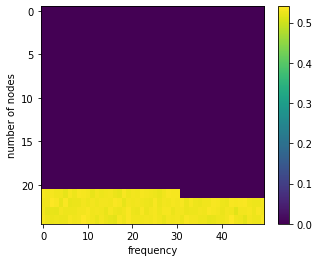

now = 2022-11-30 18:59:28.806504
182 0.5266985537461186


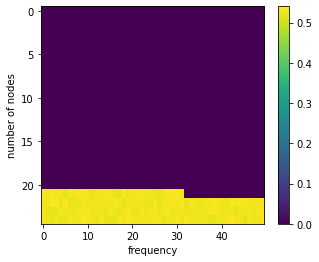

now = 2022-11-30 19:00:22.993514
183 0.5298807018443441


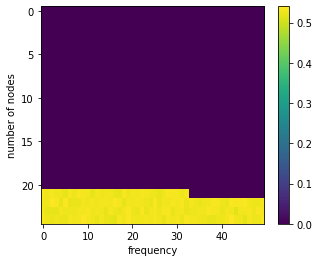

now = 2022-11-30 19:01:18.641091
184 0.5278318253145522


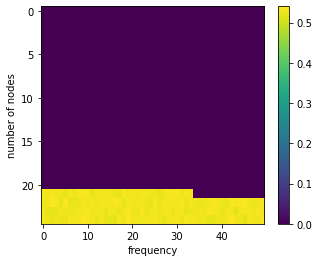

now = 2022-11-30 19:02:14.453757
185 0.5339573754462932


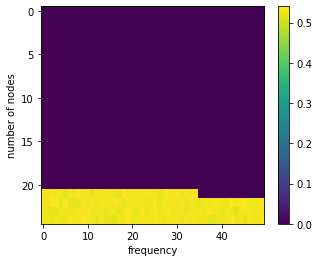

now = 2022-11-30 19:03:10.974115
186 0.5277448852137392


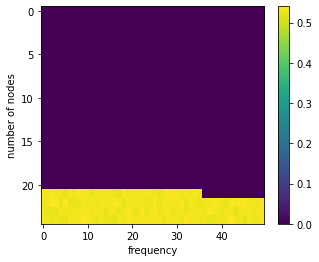

now = 2022-11-30 19:04:06.296595
187 0.5296682439594642


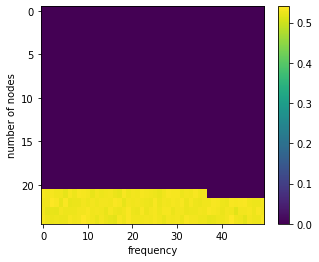

now = 2022-11-30 19:05:01.282737
188 0.5254645510170005


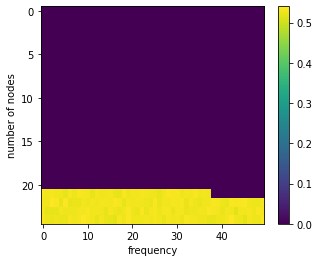

now = 2022-11-30 19:05:55.805239
189 0.5217736947126427


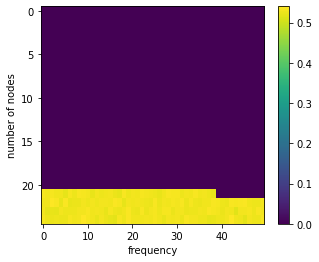

now = 2022-11-30 19:06:50.201723
190 0.5282225815046218


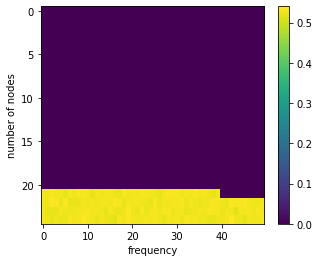

now = 2022-11-30 19:07:44.343756
191 0.5245379266065157


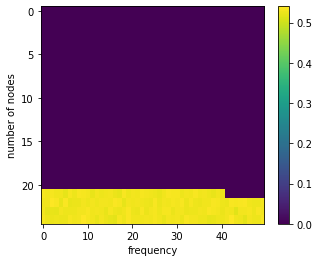

now = 2022-11-30 19:08:38.844535
192 0.5353015658431483


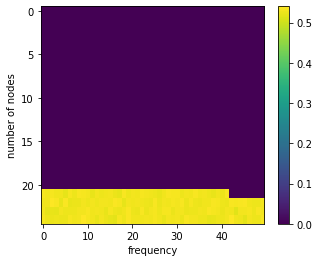

now = 2022-11-30 19:09:34.033056
193 0.5302285119588768


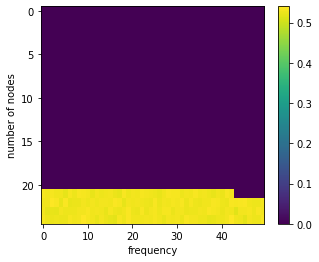

now = 2022-11-30 19:10:28.134729
194 0.534030918799525


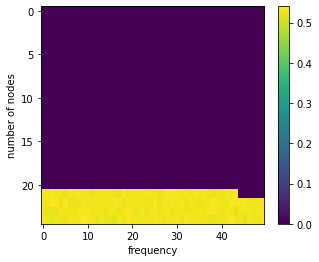

now = 2022-11-30 19:11:22.499635
195 0.5283470029243774


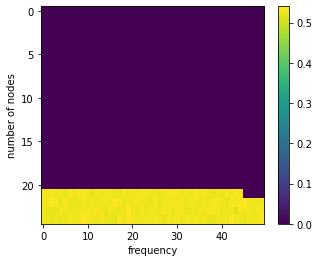

now = 2022-11-30 19:12:17.723292
196 0.5391541252105653


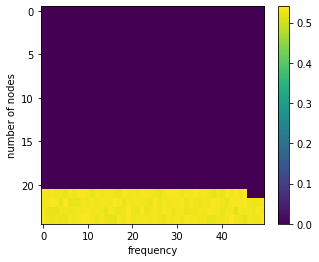

now = 2022-11-30 19:13:12.000952
197 0.5144032399724926


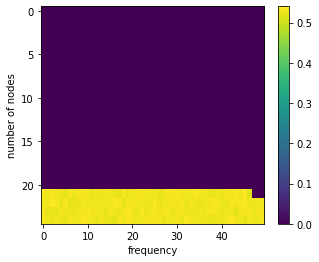

now = 2022-11-30 19:14:05.659811
198 0.5330455282839914


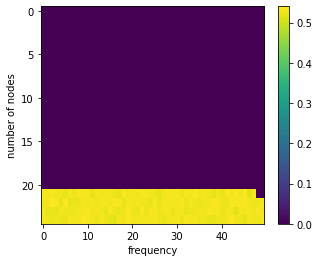

now = 2022-11-30 19:15:02.262846
199 0.5291512777880479


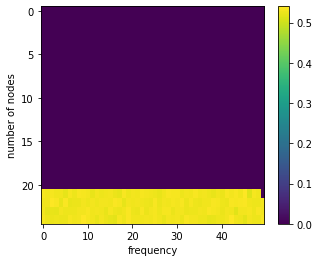

now = 2022-11-30 19:15:57.533108
200 0.5379294020701437


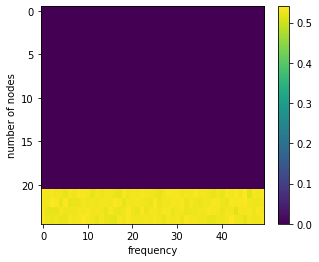

now = 2022-11-30 19:16:52.107100
201 0.5337063989981258


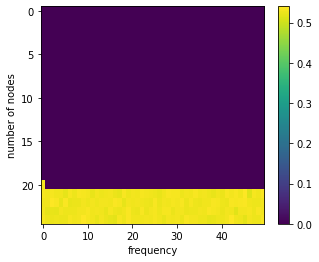

now = 2022-11-30 19:17:46.554482
202 0.5320054950994558


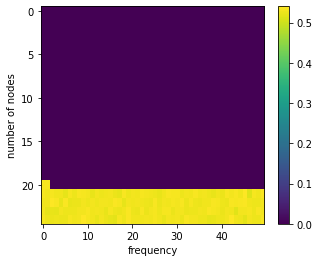

now = 2022-11-30 19:18:40.788515
203 0.5298874599218409


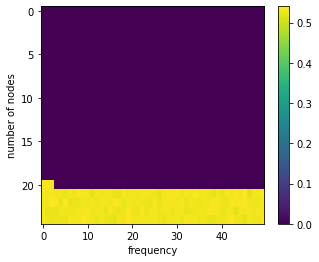

now = 2022-11-30 19:19:35.523593
204 0.5306781122893962


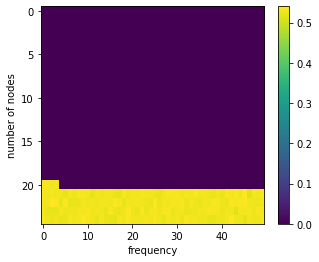

now = 2022-11-30 19:20:30.196460
205 0.533756884124615


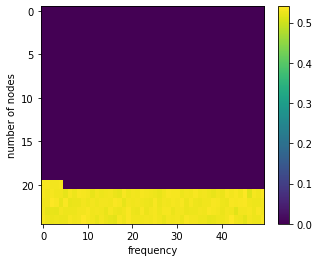

now = 2022-11-30 19:21:24.440256
206 0.534110236855291


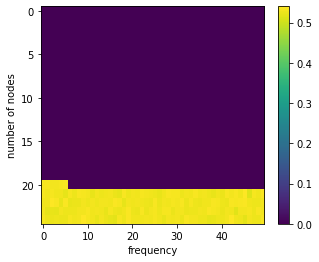

now = 2022-11-30 19:22:18.793544
207 0.5342756147022136


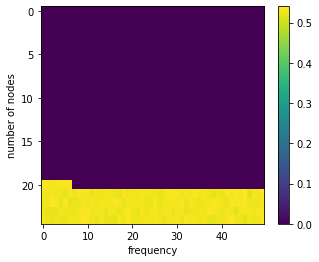

now = 2022-11-30 19:23:14.148436
208 0.5358090585323633


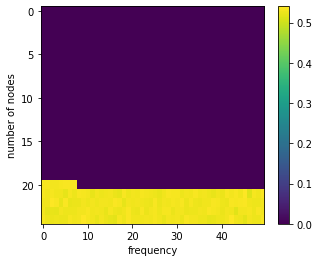

now = 2022-11-30 19:24:09.305819
209 0.5282337217866145


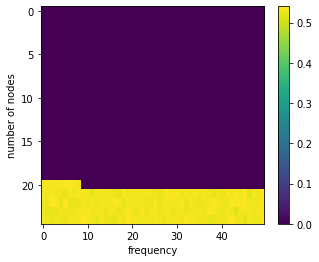

now = 2022-11-30 19:25:03.306397
210 0.5269044361833024


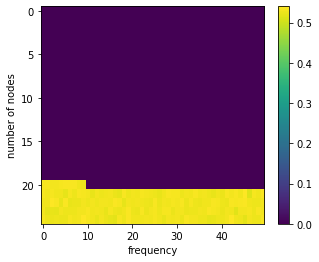

now = 2022-11-30 19:25:58.758184
211 0.5326104910435787


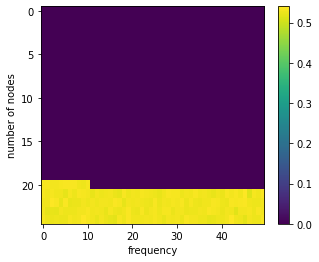

now = 2022-11-30 19:26:54.089709
212 0.51998648088112


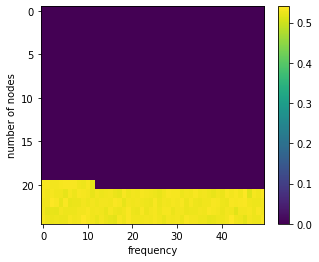

now = 2022-11-30 19:27:48.110162
213 0.5252869023763337


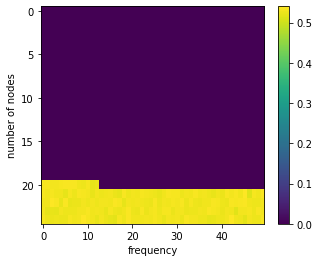

now = 2022-11-30 19:28:42.642754
214 0.5352867019446835


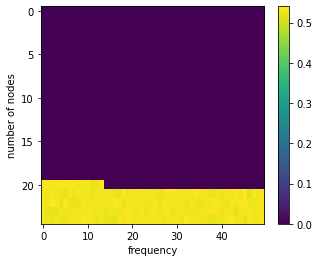

now = 2022-11-30 19:29:37.957146
215 0.5256885202767084


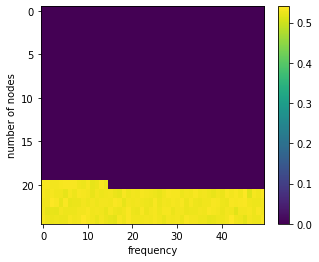

now = 2022-11-30 19:30:32.950989
216 0.533512554576298


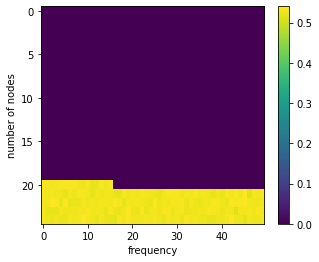

now = 2022-11-30 19:31:28.033369
217 0.537513283562128


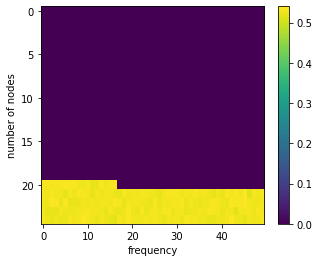

now = 2022-11-30 19:32:23.263742
218 0.5294350829847517


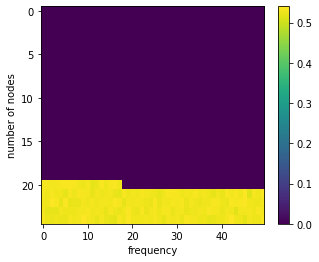

now = 2022-11-30 19:33:17.073734
219 0.5227873473550724


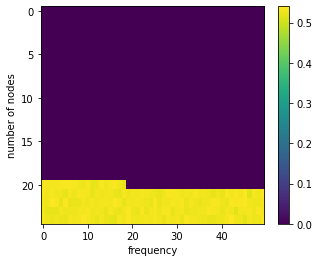

now = 2022-11-30 19:34:12.362746
220 0.5298658885249695


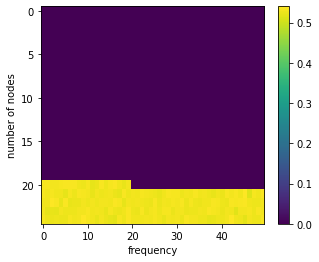

now = 2022-11-30 19:35:07.084977
221 0.5271291239458176


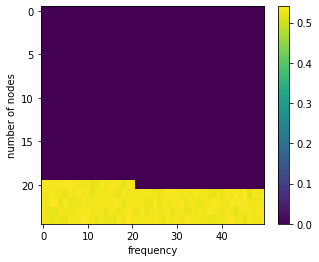

now = 2022-11-30 19:36:01.924302
222 0.5287933518249844


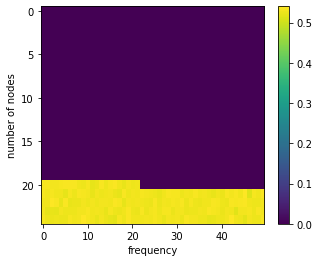

now = 2022-11-30 19:36:57.794626
223 0.5265259546173281


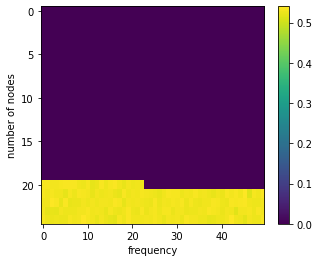

now = 2022-11-30 19:37:52.404812
224 0.530088358763672


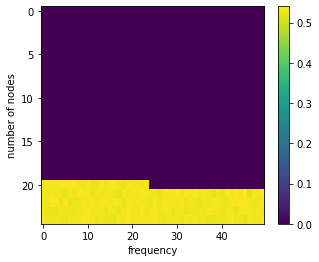

now = 2022-11-30 19:38:46.213312
225 0.539782222336842


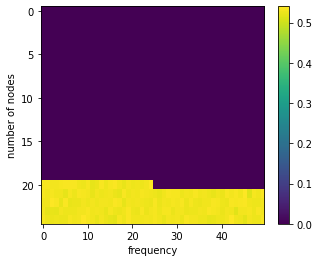

now = 2022-11-30 19:39:40.513045
226 0.5277248068416278


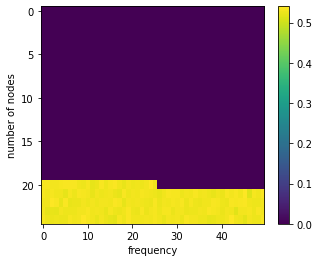

now = 2022-11-30 19:40:36.080369
227 0.5224299846736368


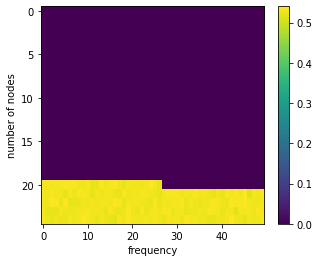

now = 2022-11-30 19:41:31.077588
228 0.5295281790981874


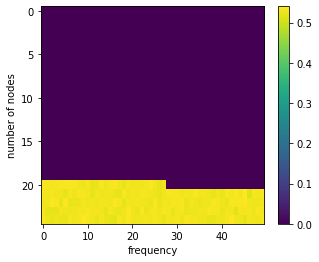

now = 2022-11-30 19:42:25.191958
229 0.5276289041471758


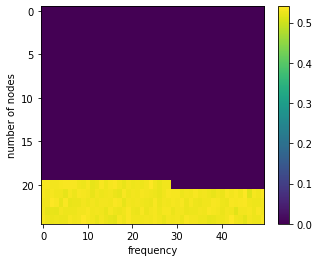

now = 2022-11-30 19:43:19.101525
230 0.5312927498177935


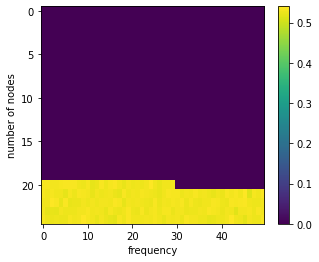

now = 2022-11-30 19:44:13.540388
231 0.5255047783065568


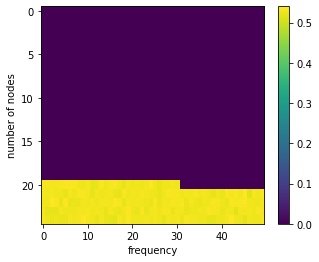

now = 2022-11-30 19:45:08.284989
232 0.5281008755920226


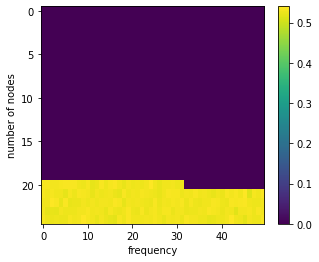

now = 2022-11-30 19:46:02.695081
233 0.530022194274805


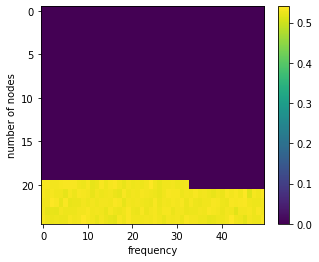

now = 2022-11-30 19:46:56.902966
234 0.5319704540367546


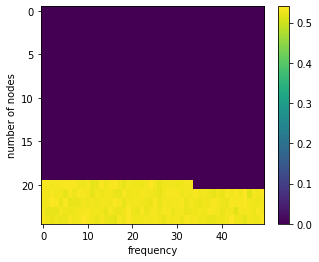

now = 2022-11-30 19:47:51.314215
235 0.5188729643858434


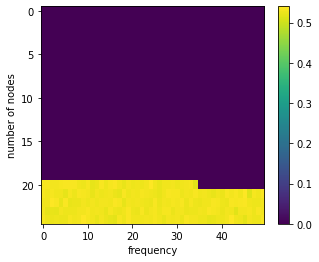

now = 2022-11-30 19:48:46.592638
236 0.5308545851730049


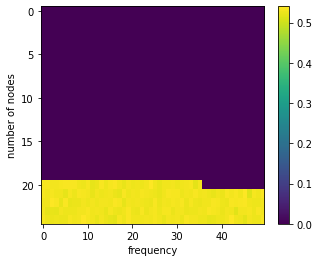

now = 2022-11-30 19:49:41.346947
237 0.5357182535470572


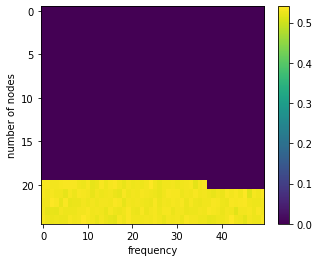

now = 2022-11-30 19:50:36.258502
238 0.5325537042809406


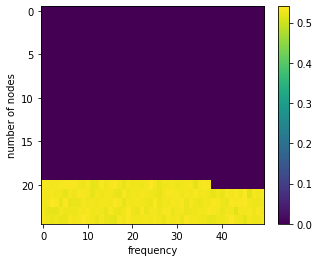

now = 2022-11-30 19:51:31.397927
239 0.5350485148230876


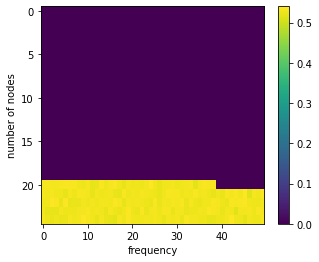

now = 2022-11-30 19:52:26.862125
240 0.5254785167474154


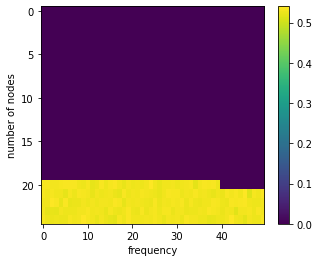

now = 2022-11-30 19:53:21.509827
241 0.5203325499158602


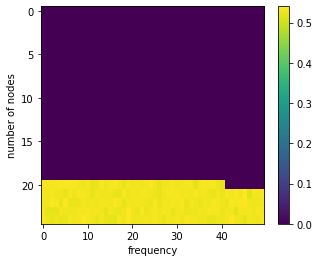

now = 2022-11-30 19:54:16.172692
242 0.5361453214346369


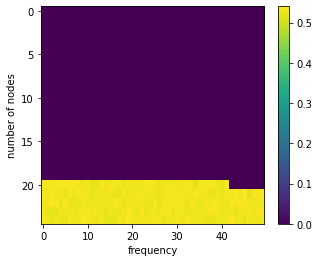

now = 2022-11-30 19:55:10.674825
243 0.5314803928294755


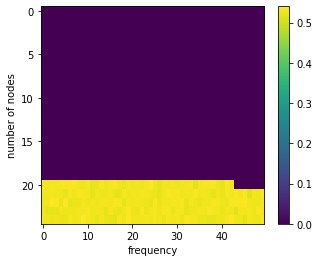

now = 2022-11-30 19:56:05.517347
244 0.5272287043060172


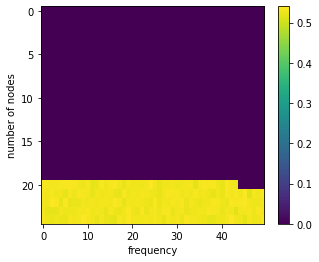

now = 2022-11-30 19:57:00.471441
245 0.5237232001941753


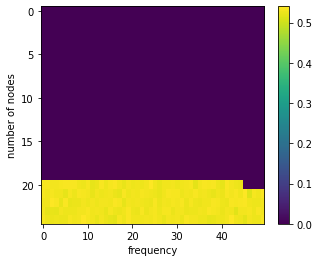

now = 2022-11-30 19:57:55.472825
246 0.5385415152184645


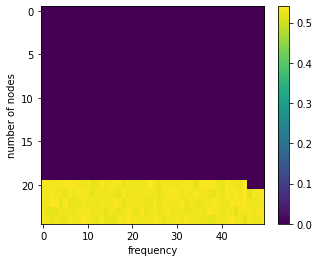

now = 2022-11-30 19:58:51.836007
247 0.5205901335256675


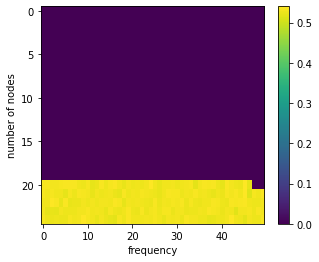

now = 2022-11-30 19:59:47.626825
248 0.5366378181893456


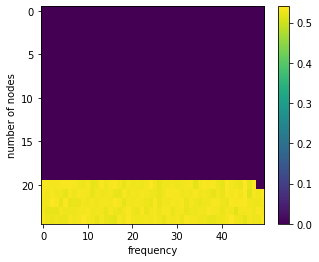

now = 2022-11-30 20:00:42.466400
249 0.5290991340094796


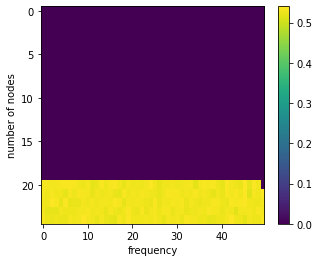

now = 2022-11-30 20:01:36.667296
250 0.5281448799636683


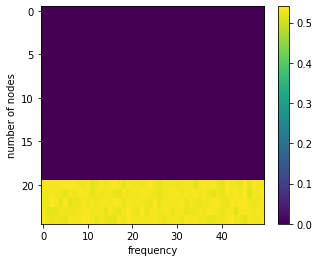

now = 2022-11-30 20:02:30.748649
251 0.5201468043651803


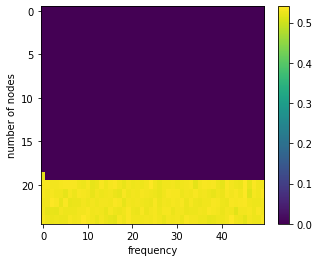

now = 2022-11-30 20:03:26.023960
252 0.5318357284232584


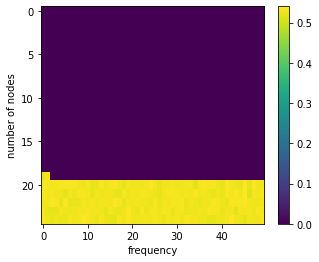

now = 2022-11-30 20:04:20.431994
253 0.5351299670963963


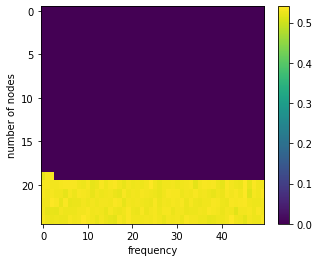

now = 2022-11-30 20:05:14.463020
254 0.5296645605516163


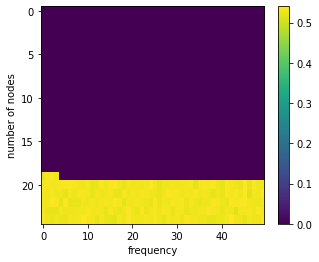

now = 2022-11-30 20:06:09.081231
255 0.5323490505384892


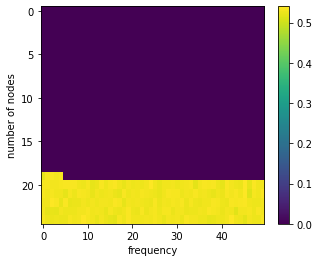

now = 2022-11-30 20:07:04.253861
256 0.534351910529816


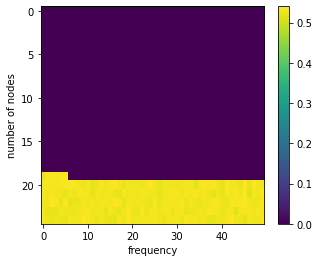

now = 2022-11-30 20:07:58.932775
257 0.5290917741706203


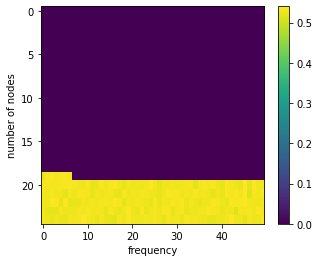

now = 2022-11-30 20:08:54.496059
258 0.5288767634499643


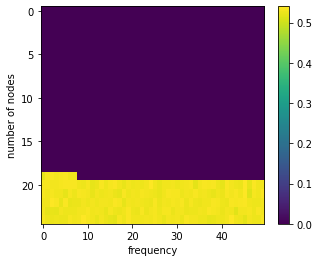

now = 2022-11-30 20:09:49.254468
259 0.5382747588620217


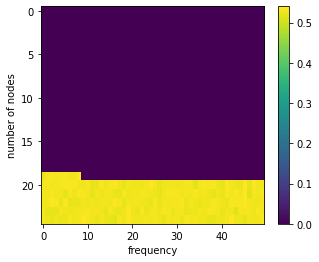

now = 2022-11-30 20:10:44.385155
260 0.5275758090417626


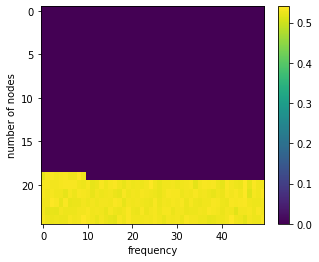

now = 2022-11-30 20:11:42.732394
261 0.5417676192370746


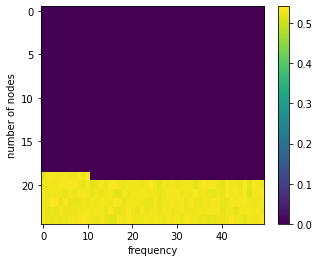

now = 2022-11-30 20:12:41.312614
262 0.5301022708809305


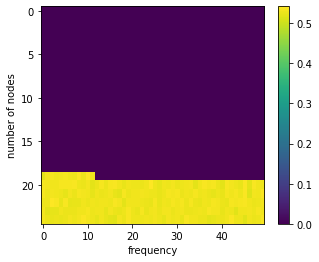

now = 2022-11-30 20:13:38.426249
263 0.5221185121929777


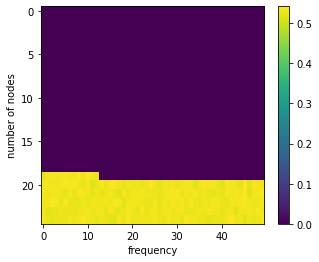

now = 2022-11-30 20:14:33.177430
264 0.5341608433320081


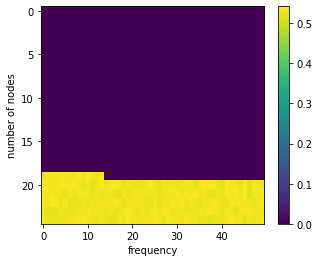

now = 2022-11-30 20:15:28.069103
265 0.5334970119687019


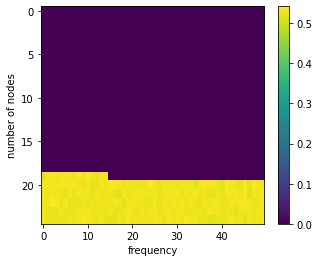

now = 2022-11-30 20:16:24.239576
266 0.5352844026572148


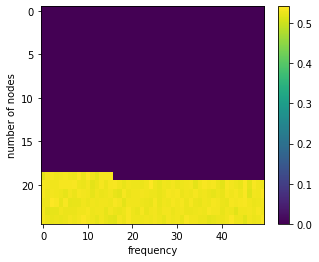

now = 2022-11-30 20:17:20.689224
267 0.5263323208936861


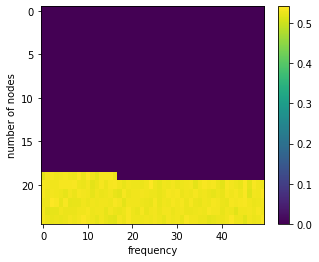

now = 2022-11-30 20:18:34.065751
268 0.5293075818715532


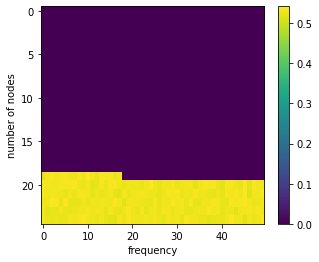

now = 2022-11-30 20:19:28.931857
269 0.5313468948901645


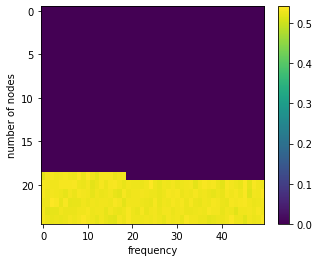

now = 2022-11-30 20:20:24.686646
270 0.5345078990764148


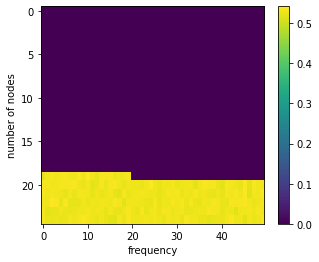

now = 2022-11-30 20:21:19.914037
271 0.5329207562953429


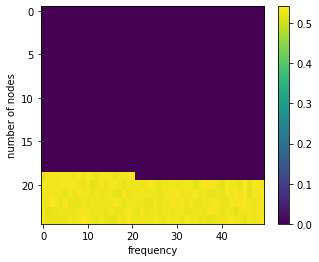

now = 2022-11-30 20:22:15.491064
272 0.5289626070946717


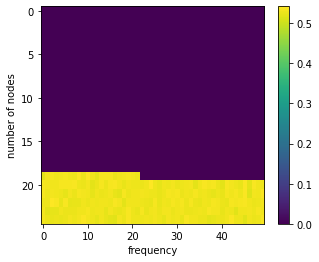

now = 2022-11-30 20:23:10.737453
273 0.5237342325957244


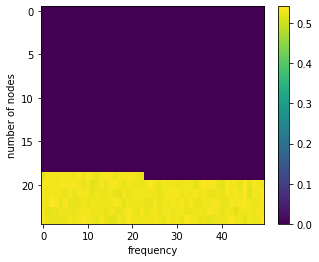

now = 2022-11-30 20:24:06.001272
274 0.5300101026669499


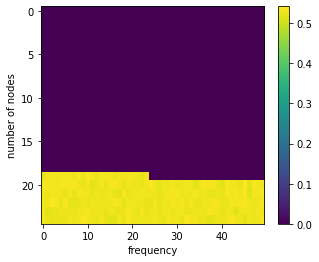

now = 2022-11-30 20:25:01.691863
275 0.5368723625489027


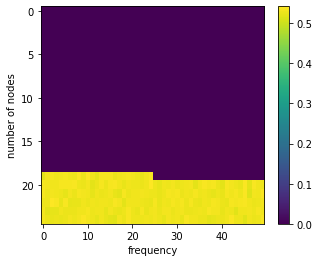

now = 2022-11-30 20:25:57.144135
276 0.5335333047152211


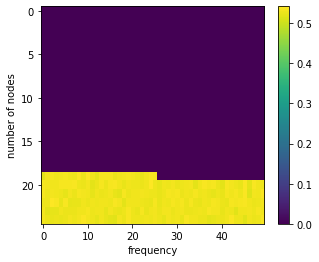

now = 2022-11-30 20:26:51.357347
277 0.52316023205456


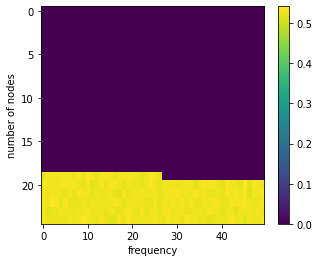

now = 2022-11-30 20:27:45.800044
278 0.5299090095320704


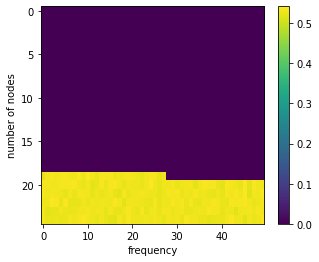

now = 2022-11-30 20:28:41.466912
279 0.5330370866662513


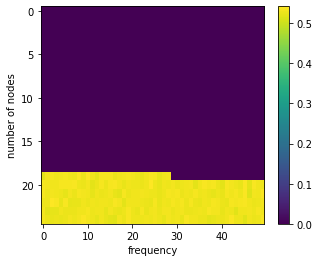

now = 2022-11-30 20:29:37.416917
280 0.5328675634540337


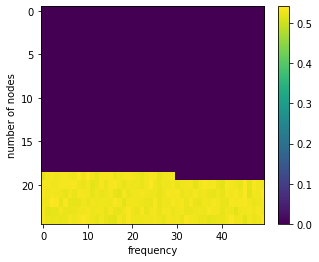

now = 2022-11-30 20:30:32.413845
281 0.5174844707638538


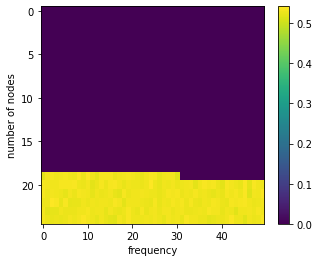

now = 2022-11-30 20:31:27.595495
282 0.5368107949133814


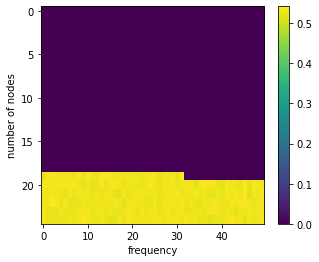

now = 2022-11-30 20:32:22.210382
283 0.5284806340377507


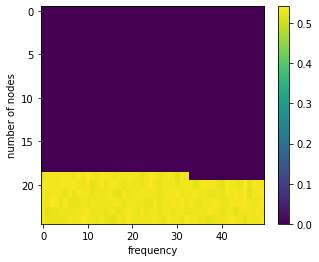

now = 2022-11-30 20:33:17.333873
284 0.5209047058389632


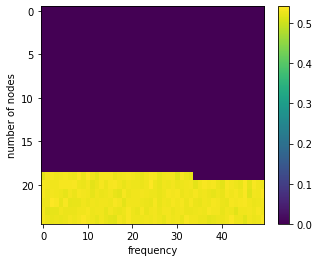

now = 2022-11-30 20:34:14.608217
285 0.5323149939402817


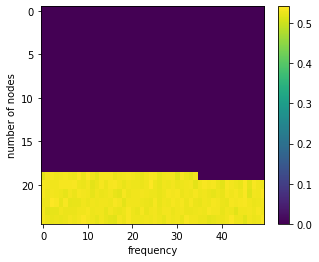

now = 2022-11-30 20:35:10.259868
286 0.523299594197588


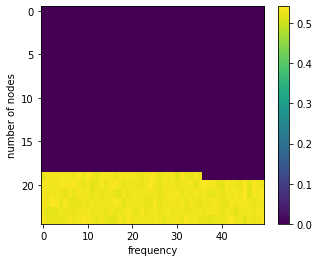

now = 2022-11-30 20:36:05.765879
287 0.5356093516793762


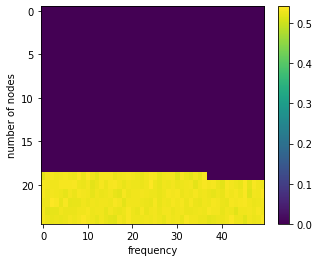

now = 2022-11-30 20:37:00.225312
288 0.5318839552531597


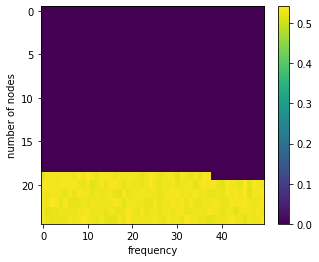

now = 2022-11-30 20:37:55.826936
289 0.5346500210253111


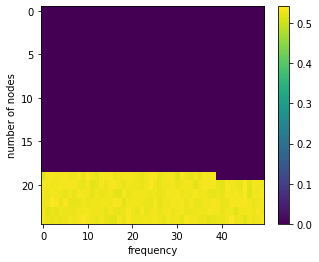

now = 2022-11-30 20:38:51.052443
290 0.5398501332822551


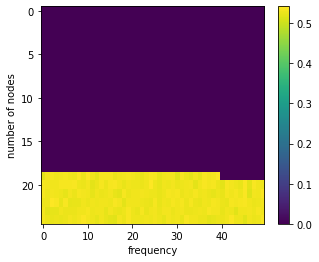

now = 2022-11-30 20:39:45.774966
291 0.5345661812516452


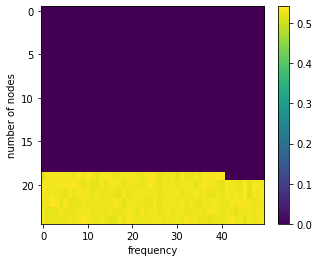

now = 2022-11-30 20:40:40.073700
292 0.5279147174115782


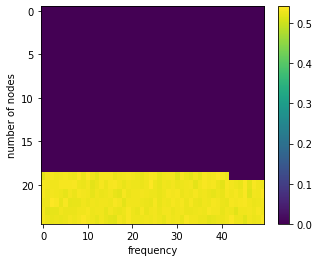

now = 2022-11-30 20:41:36.619734
293 0.5286022911642443


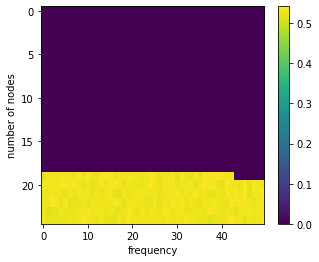

now = 2022-11-30 20:42:31.159289
294 0.5190633139747886


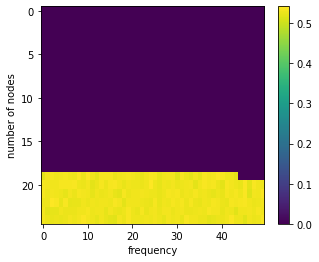

now = 2022-11-30 20:43:26.338839
295 0.5170265331610245


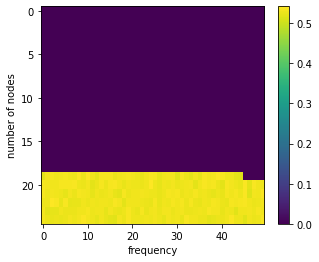

now = 2022-11-30 20:44:21.381478
296 0.531267399757641


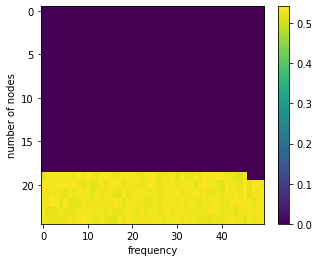

now = 2022-11-30 20:45:17.544129
297 0.5321350617517342


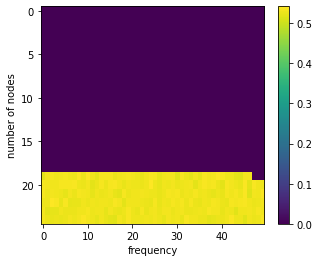

now = 2022-11-30 20:46:13.002918
298 0.5321832671063552


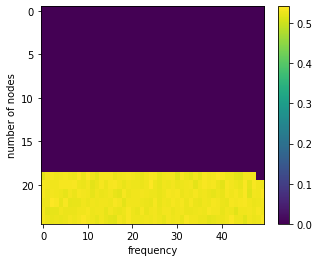

now = 2022-11-30 20:47:08.743128
299 0.5273925960366259


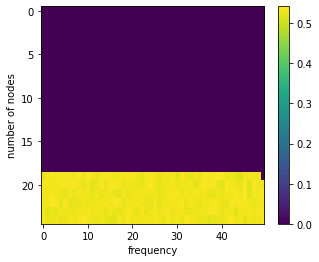

now = 2022-11-30 20:48:03.408519
300 0.5293957761423416


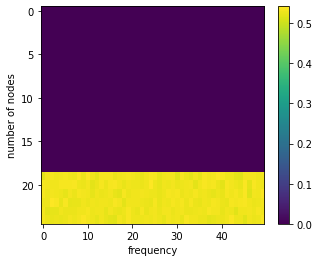

now = 2022-11-30 20:48:58.674610
301 0.5288983372194077


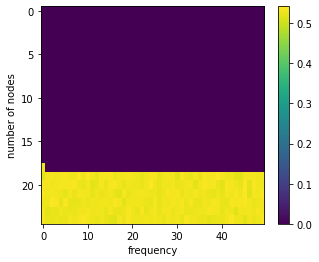

now = 2022-11-30 20:49:53.489956
302 0.5294472737145586


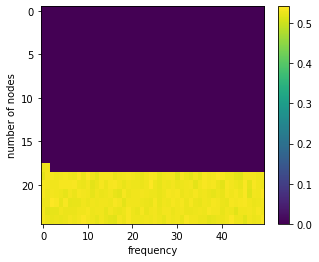

now = 2022-11-30 20:50:48.866306
303 0.5313347456529622


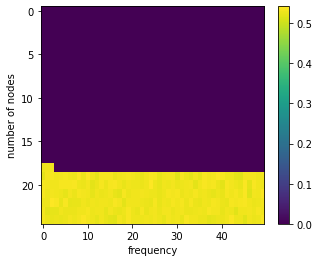

now = 2022-11-30 20:51:44.013184
304 0.5268773359012255


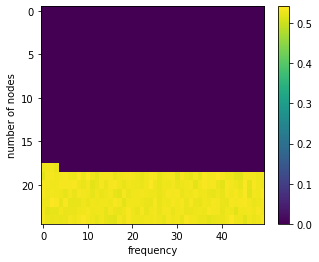

now = 2022-11-30 20:52:39.117740
305 0.5205207355206448


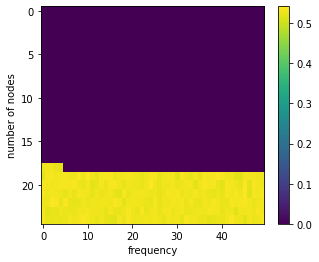

now = 2022-11-30 20:53:32.233457
306 0.5370654205293866


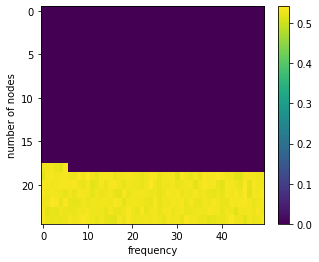

now = 2022-11-30 20:54:26.346537
307 0.534804963147145


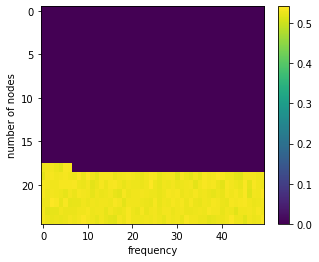

now = 2022-11-30 20:55:21.855895
308 0.5222705830566238


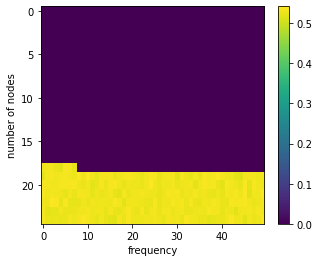

now = 2022-11-30 20:56:17.819542
309 0.5322184060743023


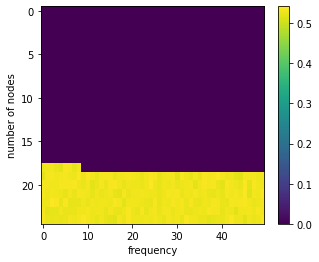

now = 2022-11-30 20:57:13.990531
310 0.5246431730000558


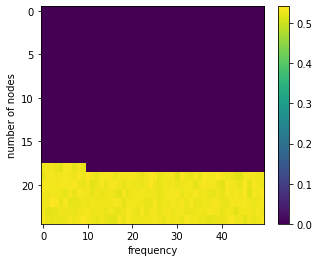

now = 2022-11-30 20:58:09.611796
311 0.5379318216277322


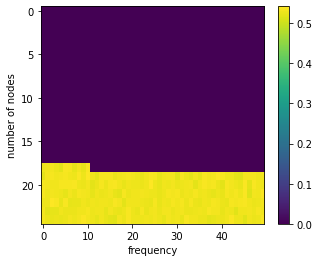

now = 2022-11-30 20:59:03.614274
312 0.5384006754688807


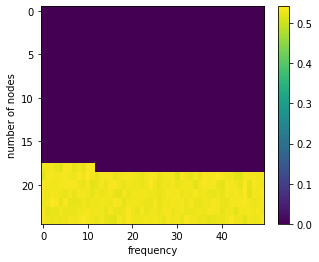

now = 2022-11-30 20:59:59.213865
313 0.5325187990522163


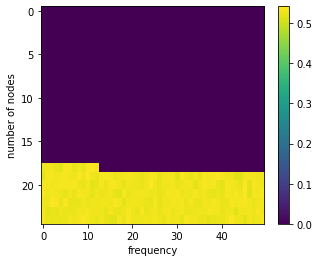

now = 2022-11-30 21:00:55.388578
314 0.528469573274848


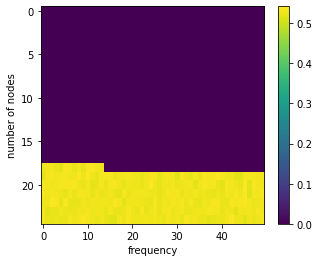

now = 2022-11-30 21:01:50.913402
315 0.5353932360321679


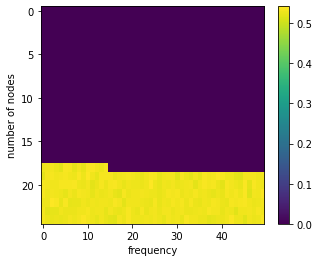

now = 2022-11-30 21:02:46.415812
316 0.5304222391155975


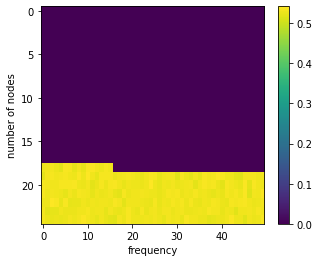

now = 2022-11-30 21:03:43.017681
317 0.526835467236829


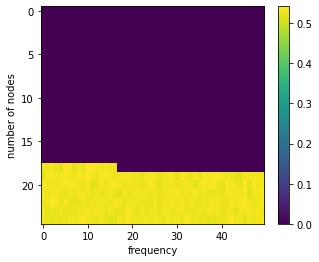

now = 2022-11-30 21:04:38.181290
318 0.5334633490067054


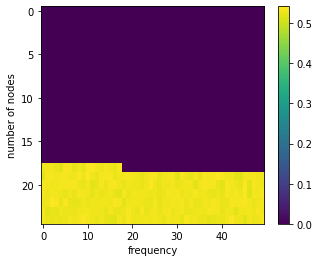

now = 2022-11-30 21:05:33.434797
319 0.5194111775713279


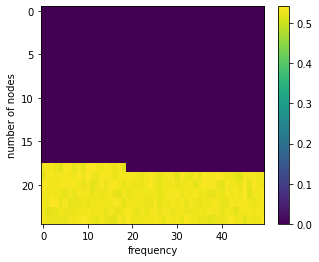

now = 2022-11-30 21:06:29.545074
320 0.5307883471210195


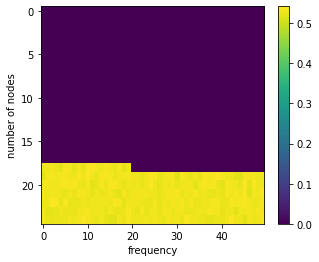

now = 2022-11-30 21:07:23.632534
321 0.5416448109961899


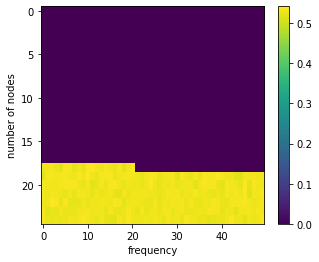

now = 2022-11-30 21:08:18.744498
322 0.5351761192483981


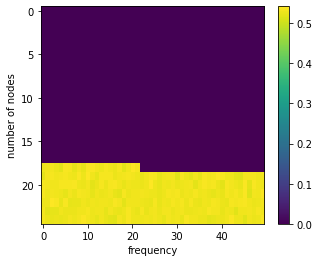

now = 2022-11-30 21:09:13.764034
323 0.5296425144567606


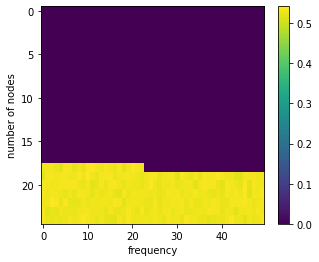

now = 2022-11-30 21:10:08.890328
324 0.5236312112672968


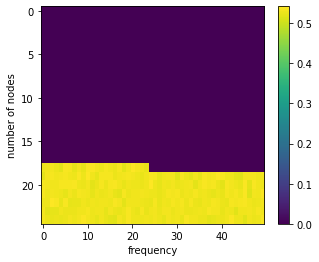

now = 2022-11-30 21:11:04.069520
325 0.5315340180573274


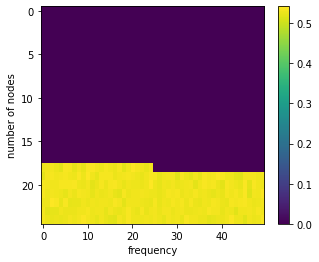

now = 2022-11-30 21:11:58.191269
326 0.5346884858475806


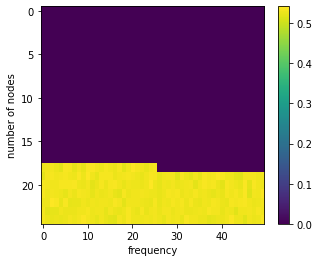

now = 2022-11-30 21:12:52.103176
327 0.5340477772937253


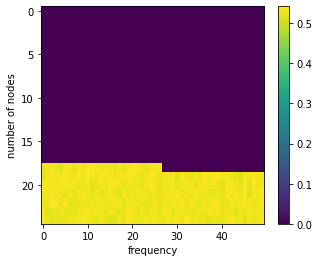

now = 2022-11-30 21:13:47.004675
328 0.5271506999560637


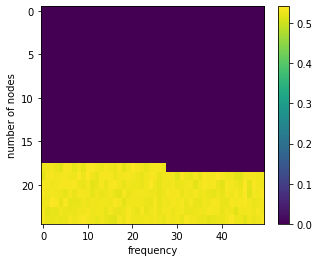

now = 2022-11-30 21:14:42.240107
329 0.5300879166475998


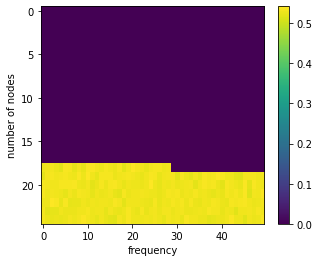

now = 2022-11-30 21:15:36.077465
330 0.5332922852757344


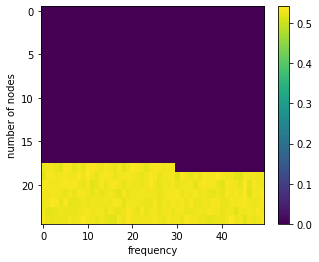

now = 2022-11-30 21:16:30.973856
331 0.5327675739697647


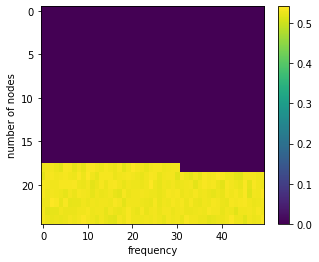

now = 2022-11-30 21:17:26.354739
332 0.5297271346859127


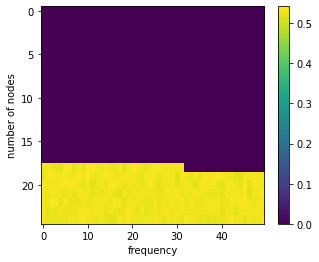

now = 2022-11-30 21:18:22.690111
333 0.5201354090829341


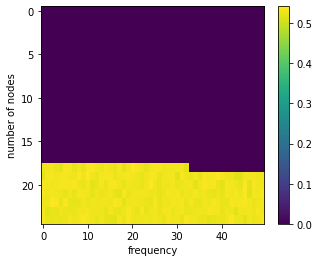

now = 2022-11-30 21:19:18.508138
334 0.5247208021995585


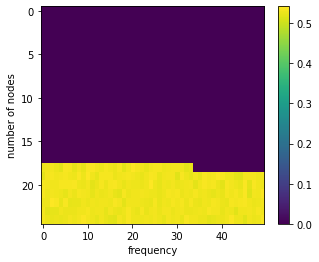

now = 2022-11-30 21:20:12.507350
335 0.5366360253639793


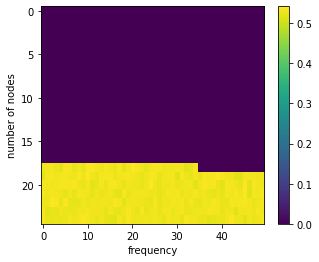

now = 2022-11-30 21:21:07.973234
336 0.5311937218106058


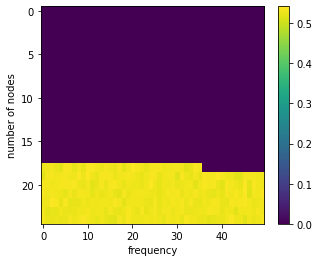

now = 2022-11-30 21:22:05.426952
337 0.5337104980553948


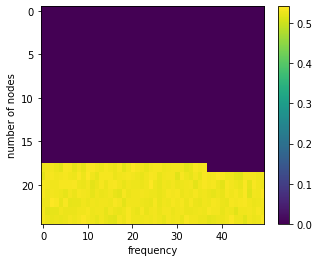

now = 2022-11-30 21:23:01.214271
338 0.5270055683468552


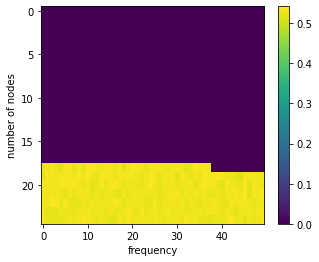

now = 2022-11-30 21:23:56.385854
339 0.5324510551115074


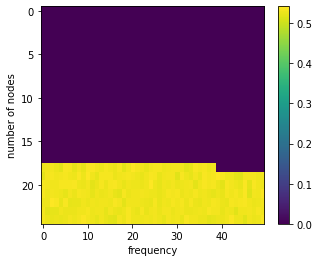

now = 2022-11-30 21:24:52.181735
340 0.5205777197401263


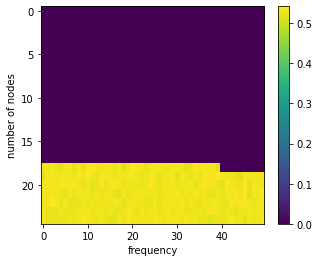

now = 2022-11-30 21:25:47.139389
341 0.5370015389728625


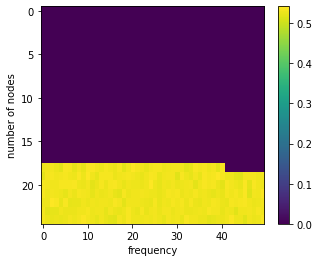

now = 2022-11-30 21:26:41.930881
342 0.5309598512530487


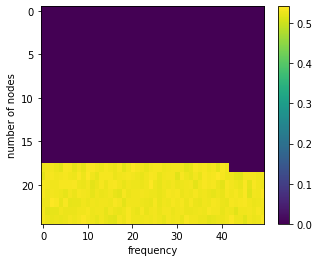

now = 2022-11-30 21:27:36.823604
343 0.5317163936170025


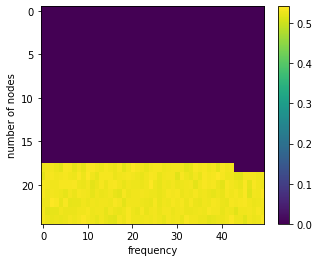

now = 2022-11-30 21:28:32.796027
344 0.5299487564015328


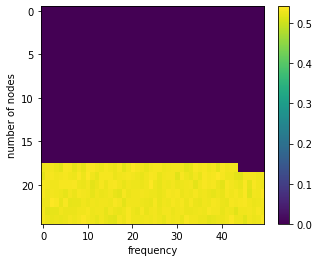

now = 2022-11-30 21:29:27.540811
345 0.5341575455668163


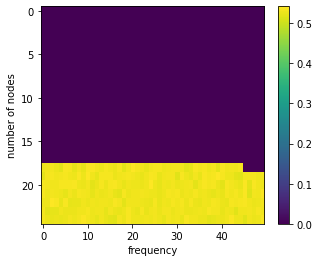

now = 2022-11-30 21:30:22.278759
346 0.5348513571494958


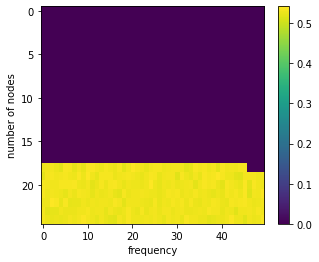

now = 2022-11-30 21:31:16.860695
347 0.5301307359804082


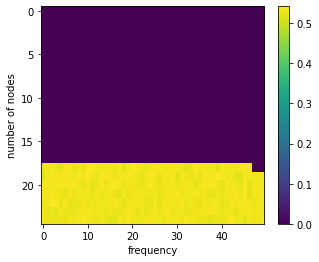

now = 2022-11-30 21:32:11.802910
348 0.5348909237436827


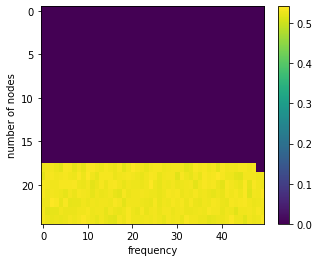

now = 2022-11-30 21:33:07.674652
349 0.5257510360983967


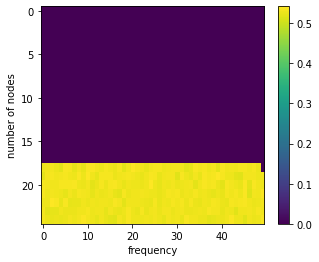

now = 2022-11-30 21:34:02.541825
350 0.5380557253323981


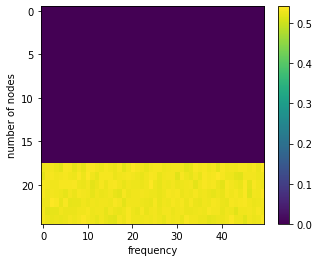

now = 2022-11-30 21:34:59.328383
351 0.5319450360436832


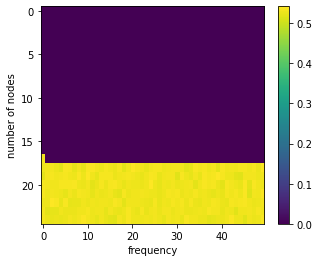

now = 2022-11-30 21:35:55.241709
352 0.5285376329769734


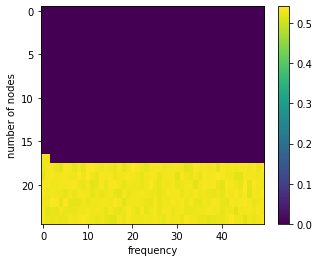

now = 2022-11-30 21:36:51.385848
353 0.5373022248577514


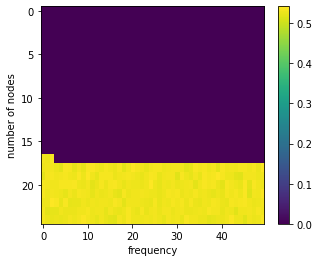

now = 2022-11-30 21:37:46.984420
354 0.5314818263143007


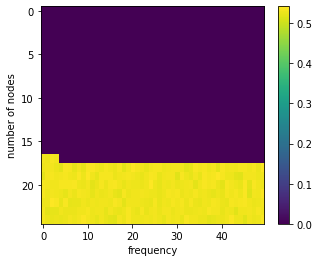

now = 2022-11-30 21:38:42.168857
355 0.5363786533434738


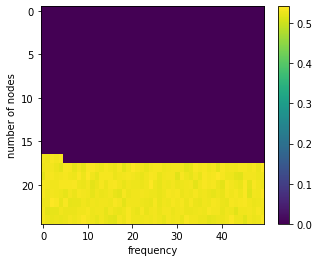

now = 2022-11-30 21:39:37.161837
356 0.5358106196285899


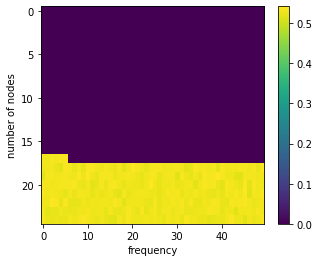

now = 2022-11-30 21:40:33.710593
357 0.5355233331971267


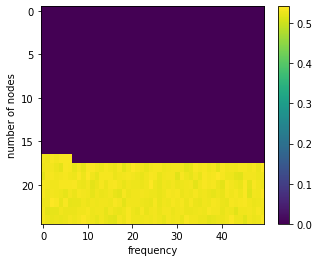

now = 2022-11-30 21:41:28.590697
358 0.5203332216860159


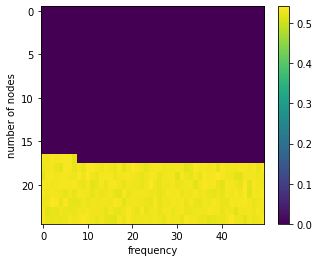

now = 2022-11-30 21:42:22.794546
359 0.53068144988575


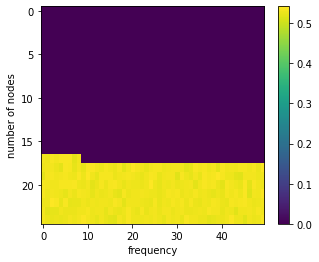

now = 2022-11-30 21:43:17.816466
360 0.5345796527595728


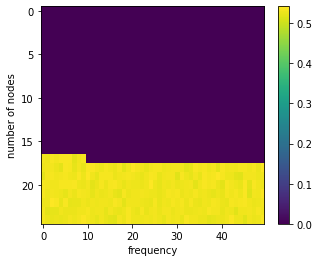

now = 2022-11-30 21:44:13.521871
361 0.5338743413088696


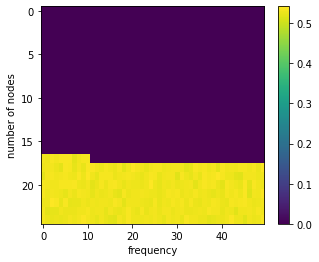

now = 2022-11-30 21:45:08.856827
362 0.5297141670346859


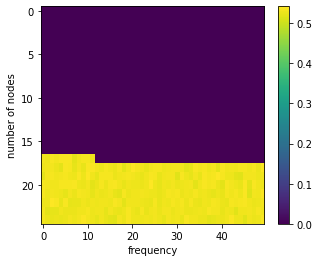

now = 2022-11-30 21:46:04.214885
363 0.5321431481280586


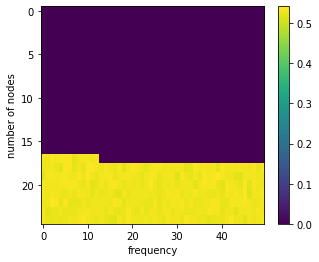

now = 2022-11-30 21:46:58.511654
364 0.5242983718980253


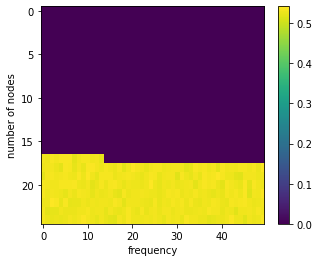

now = 2022-11-30 21:47:52.448287
365 0.5346512017853647


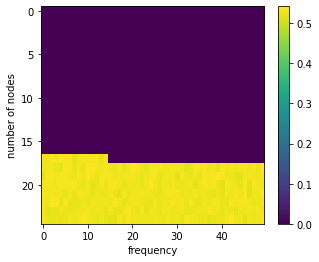

now = 2022-11-30 21:48:47.265081
366 0.5319671680502777


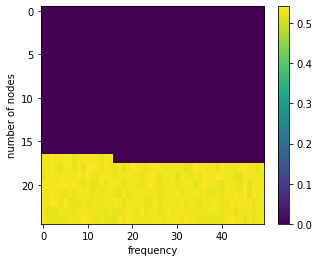

now = 2022-11-30 21:49:43.150516
367 0.5350131132350692


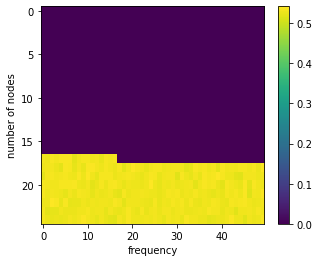

now = 2022-11-30 21:50:38.844732
368 0.5326361577609677


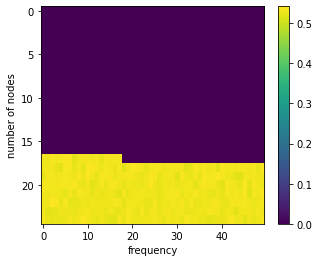

now = 2022-11-30 21:51:34.014013
369 0.5320798912102105


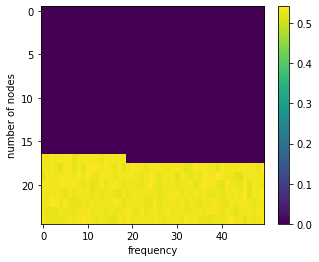

now = 2022-11-30 21:52:30.634838
370 0.5382282011245895


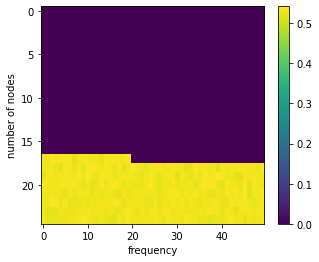

now = 2022-11-30 21:53:25.898439
371 0.5361107245210722


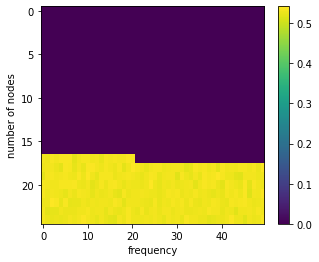

now = 2022-11-30 21:54:20.726008
372 0.5354361655347374


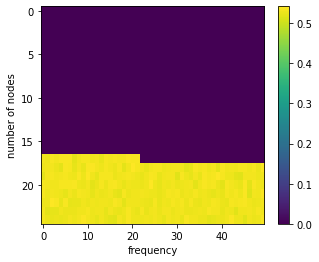

now = 2022-11-30 21:55:16.398737
373 0.542151633616577


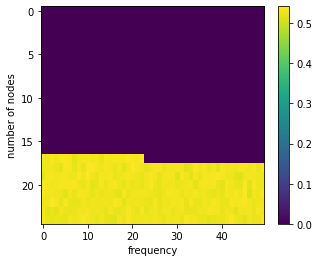

now = 2022-11-30 21:56:11.462416
374 0.5444754879262733


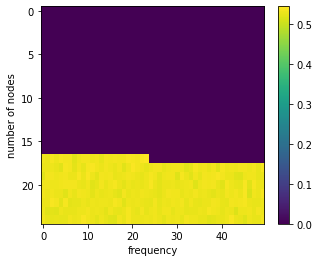

now = 2022-11-30 21:57:07.339677
375 0.5313406333932853


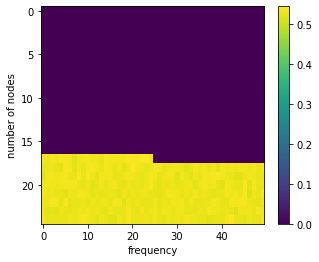

now = 2022-11-30 21:58:01.681096
376 0.5230479700471329


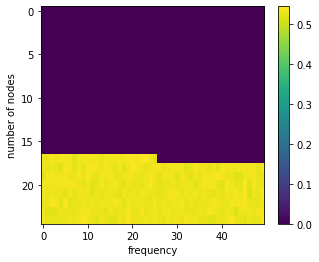

now = 2022-11-30 21:58:57.069954
377 0.5307243584216568


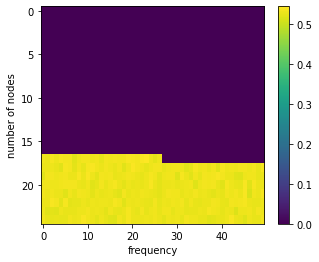

now = 2022-11-30 21:59:52.295864
378 0.5391202614828922


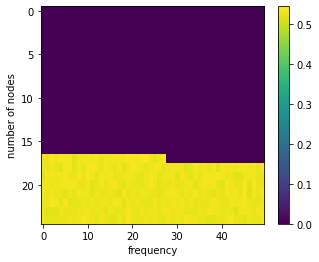

now = 2022-11-30 22:00:47.664683
379 0.5328608938350137


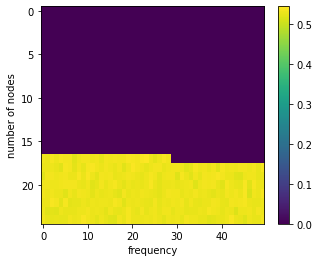

now = 2022-11-30 22:01:42.220663
380 0.5443203449823107


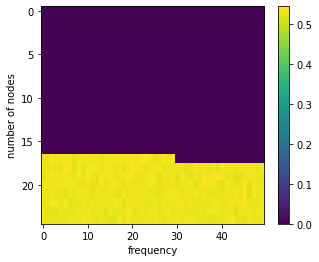

now = 2022-11-30 22:02:37.717014
381 0.5369268247901104


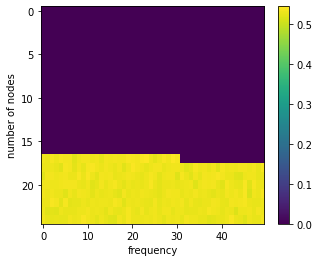

now = 2022-11-30 22:03:32.854073
382 0.5260905733149751


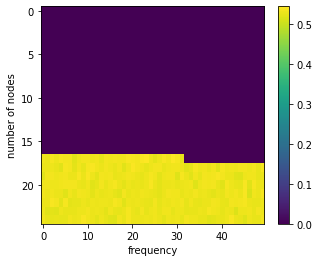

now = 2022-11-30 22:04:27.056897
383 0.5327817425458848


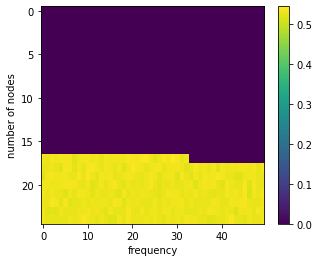

now = 2022-11-30 22:05:21.998387
384 0.5375588020639089


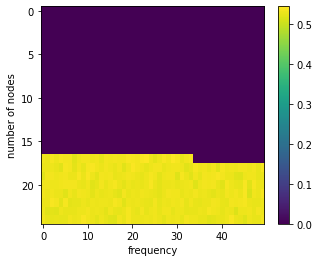

now = 2022-11-30 22:06:16.869623
385 0.5340149174809519


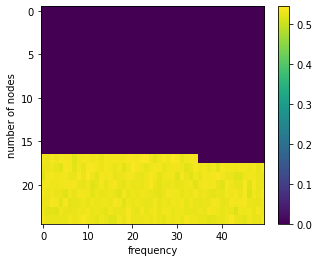

now = 2022-11-30 22:07:12.032973
386 0.5329548402744054


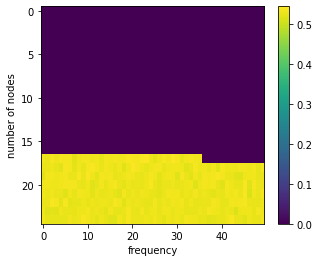

now = 2022-11-30 22:08:07.200229
387 0.5470520596466683


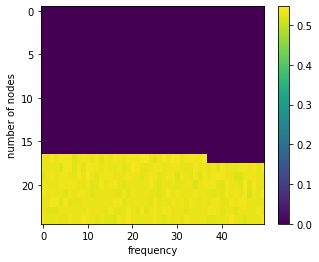

now = 2022-11-30 22:09:02.913154
388 0.5419972267299263


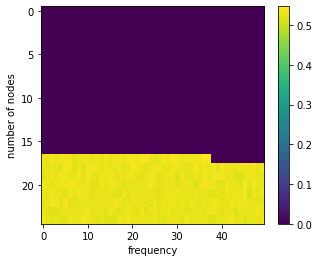

now = 2022-11-30 22:09:58.088093
389 0.5372138508175625


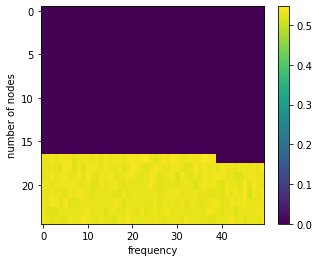

now = 2022-11-30 22:10:52.547268
390 0.5288625071392785


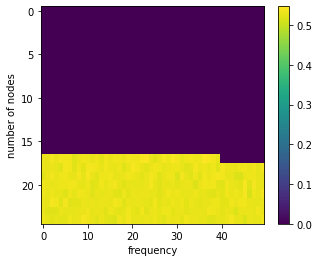

now = 2022-11-30 22:11:49.407930
391 0.527470142709788


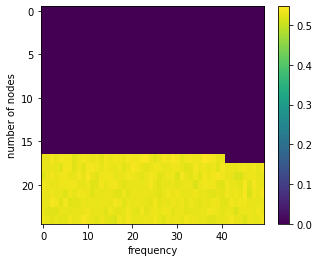

now = 2022-11-30 22:12:45.515670
392 0.534719134409251


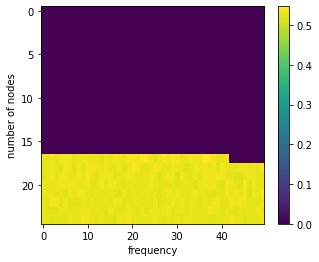

now = 2022-11-30 22:13:40.172673
393 0.5335519220598013


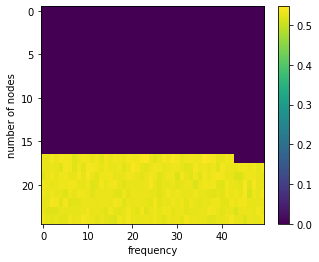

now = 2022-11-30 22:14:34.588503
394 0.5384069956803911


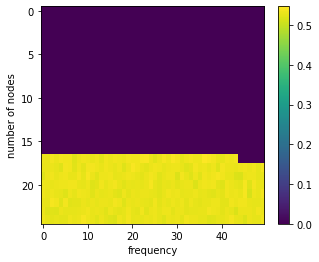

now = 2022-11-30 22:15:30.006758
395 0.538383515335571


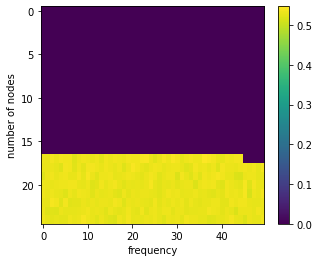

now = 2022-11-30 22:16:41.344959
396 0.538347885289818


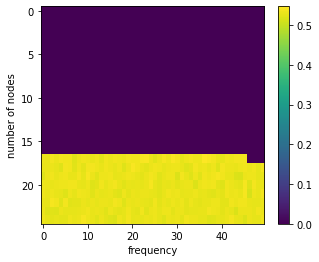

now = 2022-11-30 22:17:37.024893
397 0.5342686836182802


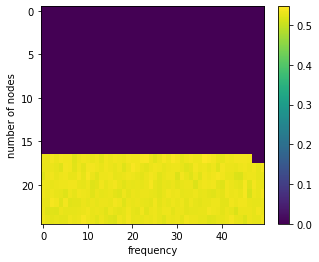

now = 2022-11-30 22:18:31.524563
398 0.5353242840869055


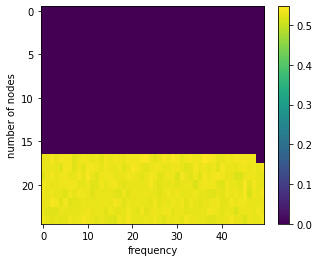

now = 2022-11-30 22:19:26.105550
399 0.536741873791306


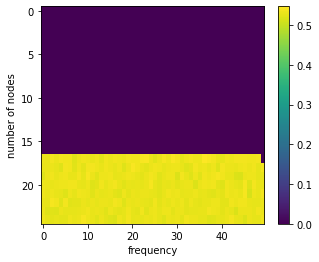

now = 2022-11-30 22:20:19.847099
400 0.5342251292211164


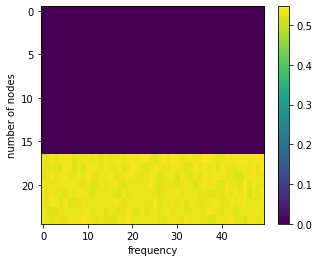

now = 2022-11-30 22:21:14.459555
401 0.540906108726599


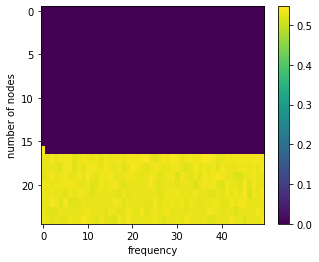

now = 2022-11-30 22:22:09.456041
402 0.529130641405357


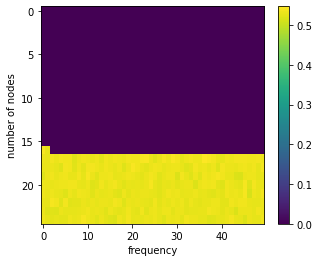

now = 2022-11-30 22:23:04.035375
403 0.5400532375891356


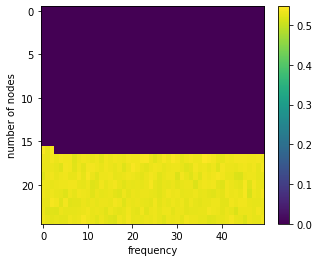

now = 2022-11-30 22:23:59.138751
404 0.5424913604413647


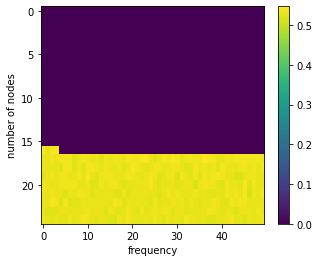

now = 2022-11-30 22:24:55.188759
405 0.528669934421735


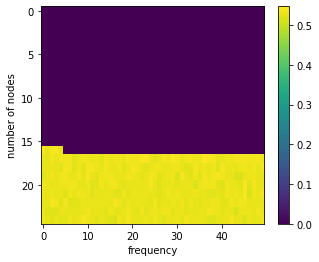

now = 2022-11-30 22:25:49.417650
406 0.5354628990954243


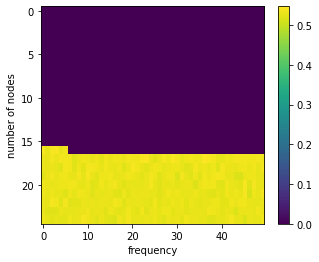

now = 2022-11-30 22:26:44.653700
407 0.5205662321820029


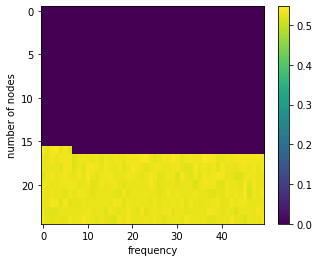

now = 2022-11-30 22:27:39.054309
408 0.5387589242504343


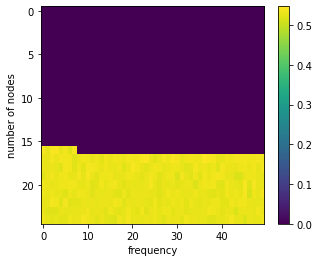

now = 2022-11-30 22:28:35.451143
409 0.5331062579407374


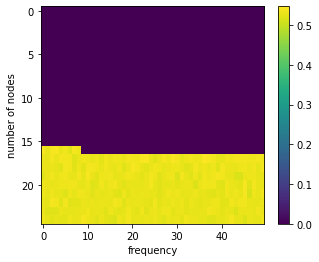

now = 2022-11-30 22:29:29.966613
410 0.5391443150987717


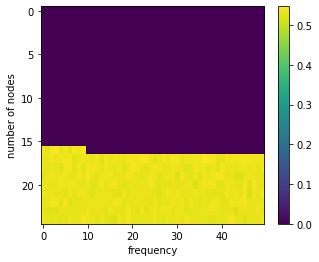

now = 2022-11-30 22:30:25.423132
411 0.5310806520399258


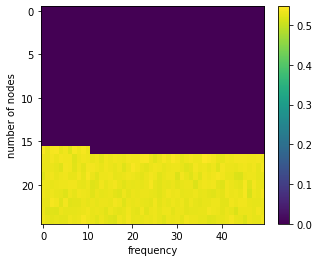

now = 2022-11-30 22:31:20.252798
412 0.5385362865290493


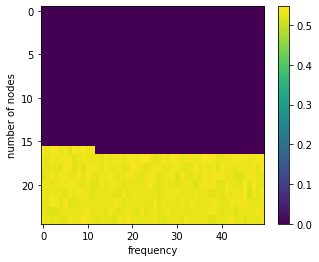

now = 2022-11-30 22:32:14.610268
413 0.5389450610723796


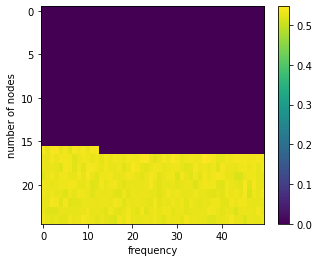

now = 2022-11-30 22:33:09.788145
414 0.5347659996914588


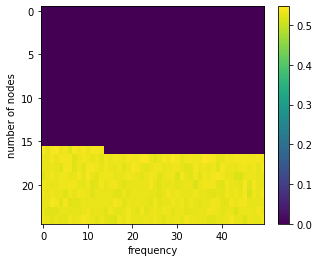

now = 2022-11-30 22:34:05.202120
415 0.534869597028126


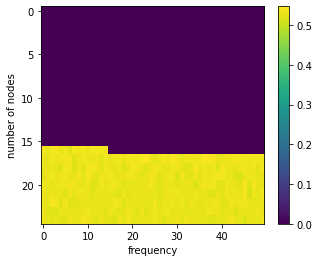

now = 2022-11-30 22:35:00.691430
416 0.5327395151842895


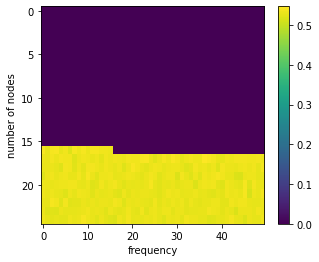

now = 2022-11-30 22:35:55.708745
417 0.5260080542865905


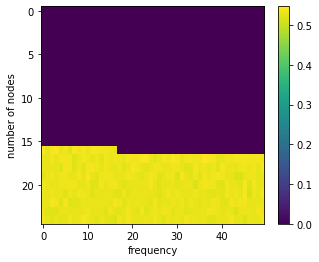

now = 2022-11-30 22:36:50.211984
418 0.5378091334737349


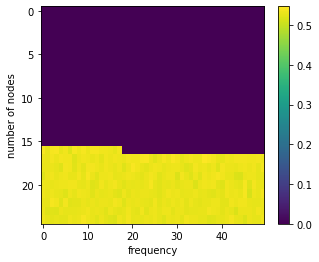

now = 2022-11-30 22:37:45.404235
419 0.5385841333318666


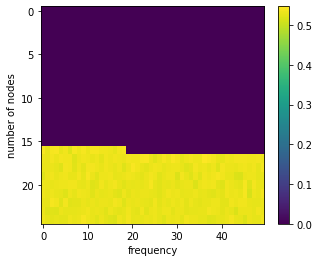

now = 2022-11-30 22:38:40.326115
420 0.5385862125741306


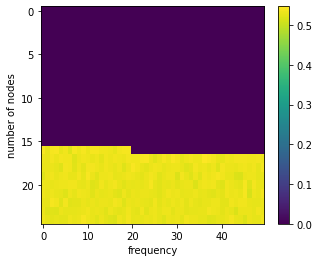

now = 2022-11-30 22:39:36.719907
421 0.5308111184615479


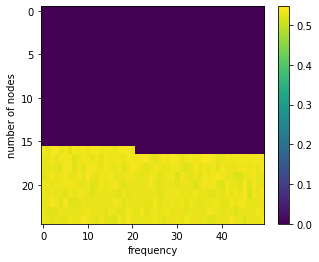

now = 2022-11-30 22:40:31.437227
422 0.5356658404065053


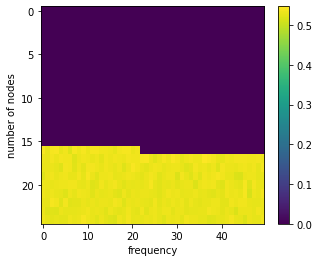

now = 2022-11-30 22:41:27.125481
423 0.5321876784075055


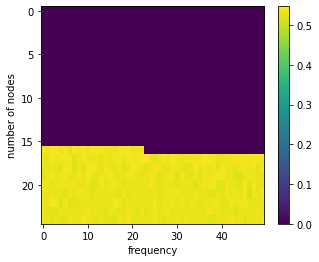

now = 2022-11-30 22:42:22.088360
424 0.5385548779677751


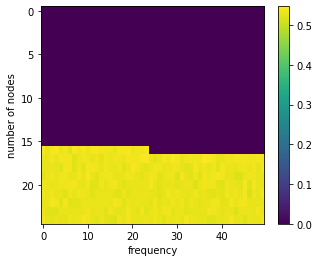

now = 2022-11-30 22:43:16.656262
425 0.5301881417117201


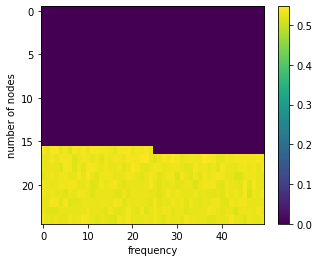

now = 2022-11-30 22:44:12.440041
426 0.5394582427447834


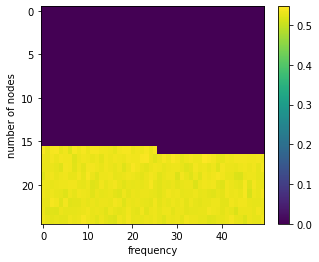

now = 2022-11-30 22:45:07.882457
427 0.5306666653425167


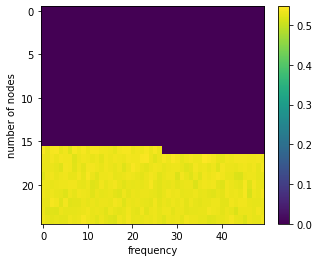

now = 2022-11-30 22:46:03.359210
428 0.543703699274985


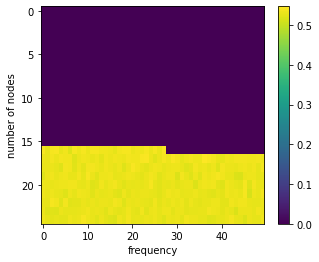

now = 2022-11-30 22:46:58.407714
429 0.5451994970738194


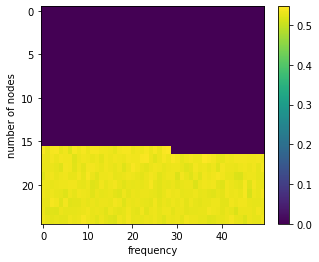

now = 2022-11-30 22:47:53.150256
430 0.5440942880610329


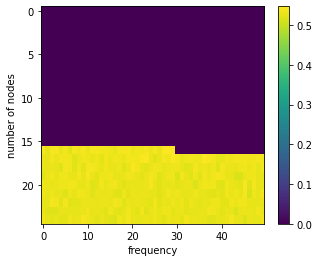

now = 2022-11-30 22:48:49.584370
431 0.5188880839089499


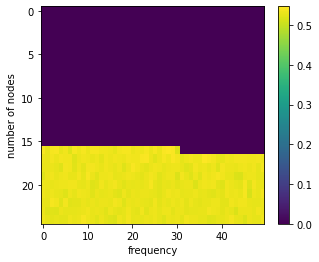

now = 2022-11-30 22:49:43.938730
432 0.5428991657252568


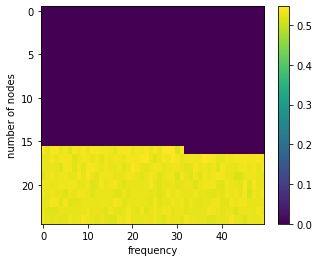

now = 2022-11-30 22:50:38.941343
433 0.5389318319614945


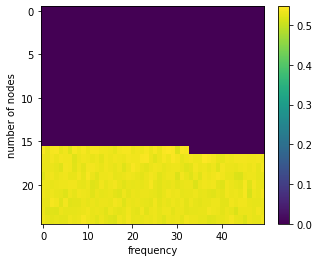

now = 2022-11-30 22:51:34.378014
434 0.538741815346008


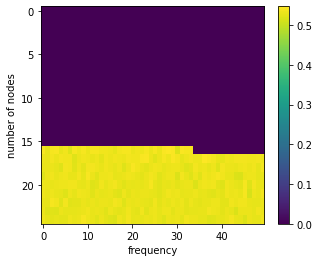

now = 2022-11-30 22:52:29.943410
435 0.5344607107797568


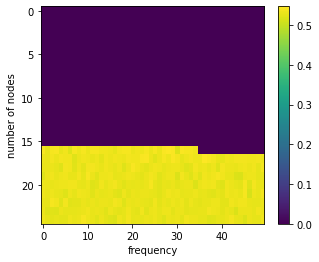

now = 2022-11-30 22:53:25.303420
436 0.5410396032399728


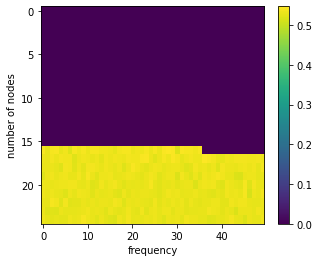

now = 2022-11-30 22:54:19.483780
437 0.5384733616422013


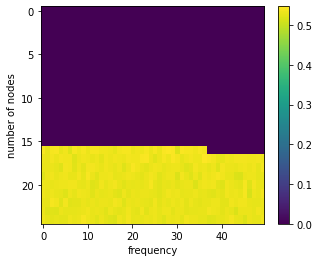

now = 2022-11-30 22:55:14.375806
438 0.5328659039560308


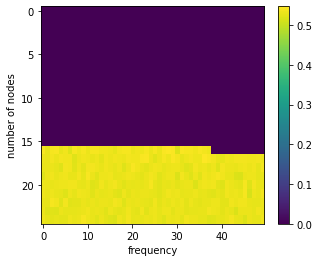

now = 2022-11-30 22:56:10.238262
439 0.5440285028202315


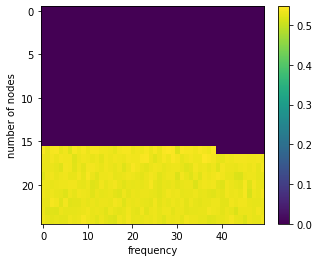

now = 2022-11-30 22:57:05.519404
440 0.5349812422033474


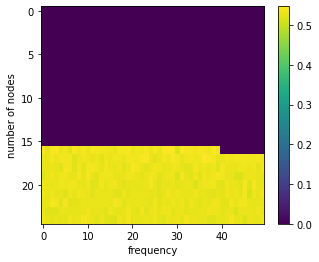

now = 2022-11-30 22:58:00.254649
441 0.5404071493883804


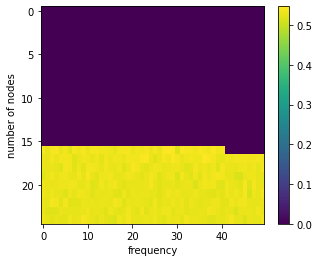

now = 2022-11-30 22:58:55.214086
442 0.5437790434870382


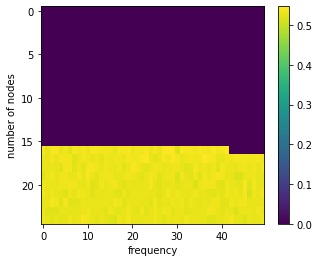

now = 2022-11-30 22:59:50.581732
443 0.5372699400233875


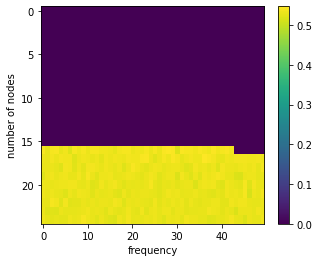

now = 2022-11-30 23:00:45.448452
444 0.5324131204956998


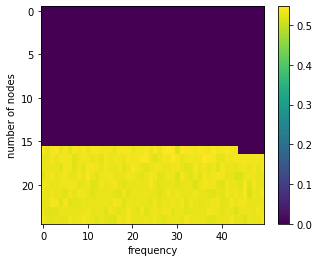

now = 2022-11-30 23:01:40.793128
445 0.5358303679845142


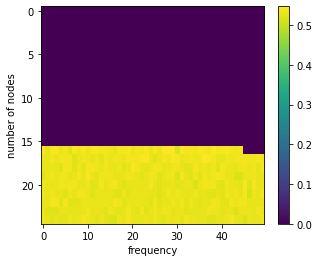

now = 2022-11-30 23:02:36.783124
446 0.5350559894473446


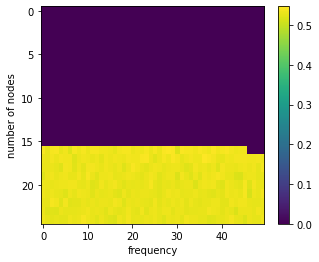

now = 2022-11-30 23:03:32.594437
447 0.5380633128382604


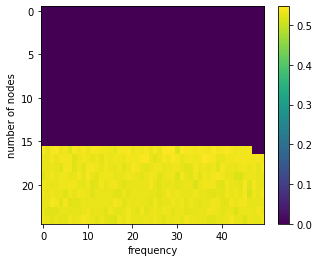

now = 2022-11-30 23:04:27.873698
448 0.5332911867402037


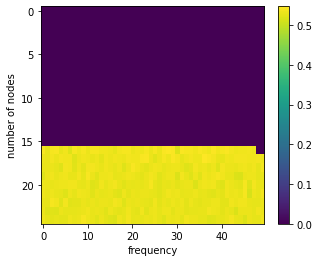

now = 2022-11-30 23:05:23.537403
449 0.5414787062606606


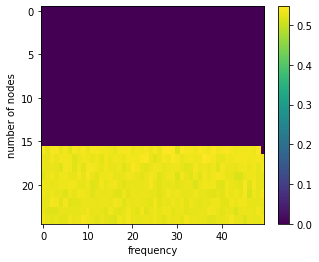

now = 2022-11-30 23:06:19.392182
450 0.5401554594262673


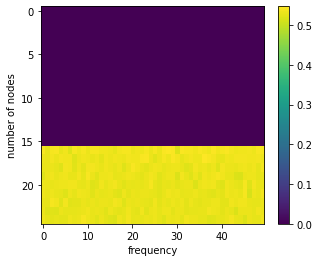

now = 2022-11-30 23:07:14.799703
451 0.5296614581218636


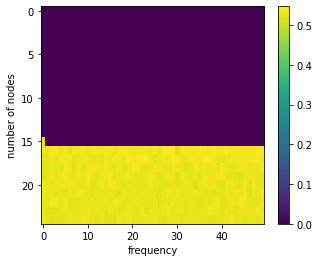

now = 2022-11-30 23:08:11.180696
452 0.5310690753140138


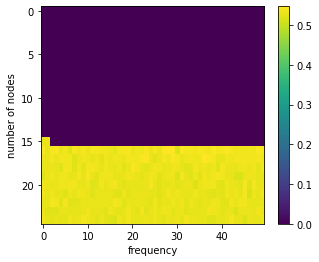

now = 2022-11-30 23:09:06.064614
453 0.530903986240027


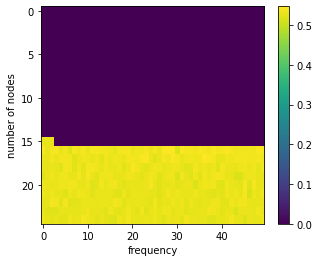

now = 2022-11-30 23:10:01.958205
454 0.5185485743361767


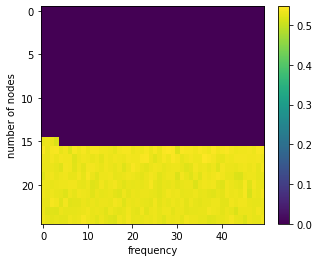

now = 2022-11-30 23:10:58.003005
455 0.5233654307342425


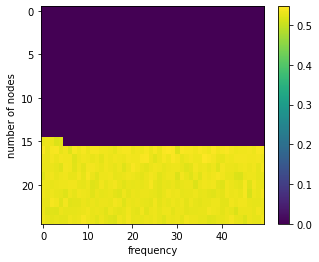

now = 2022-11-30 23:11:52.794711
456 0.515888795888399


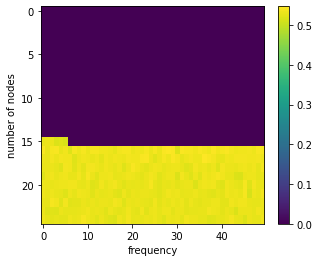

now = 2022-11-30 23:12:47.821291
457 0.5174495604106182


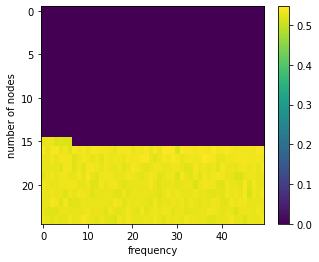

now = 2022-11-30 23:13:43.301288
458 0.5265051631452833


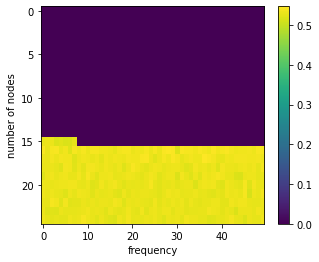

now = 2022-11-30 23:14:39.659594
459 0.5227396090662437


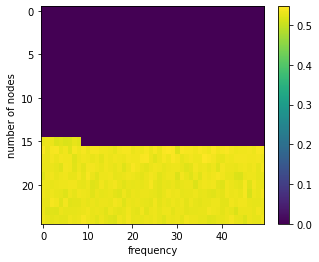

now = 2022-11-30 23:15:34.056274
460 0.5347515622682941


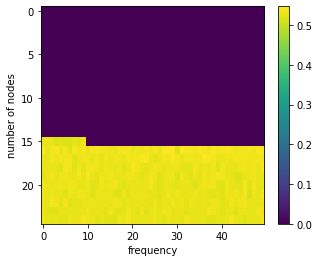

now = 2022-11-30 23:16:28.832139
461 0.5230737217037641


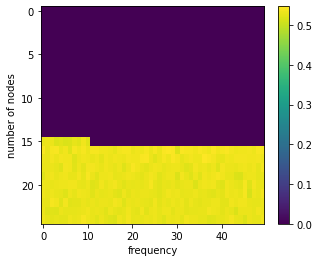

now = 2022-11-30 23:17:25.377025
462 0.5159562973473064


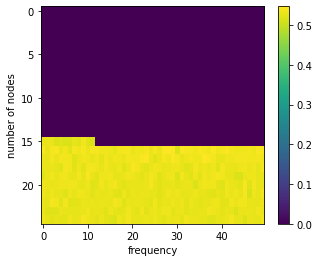

now = 2022-11-30 23:18:21.099896
463 0.5247995296898271


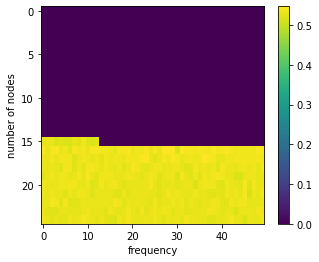

now = 2022-11-30 23:19:17.287946
464 0.5167432972390075


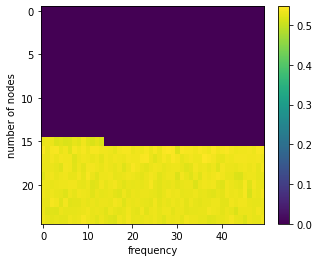

now = 2022-11-30 23:20:12.221180
465 0.5287296847134915


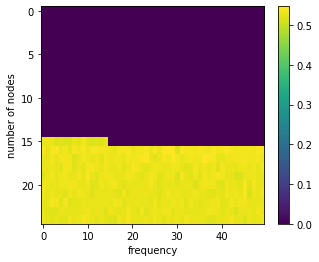

now = 2022-11-30 23:21:08.017643
466 0.5327692984002597


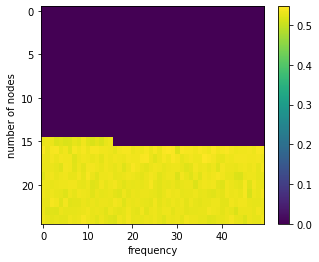

now = 2022-11-30 23:22:03.701912
467 0.5169325750179931


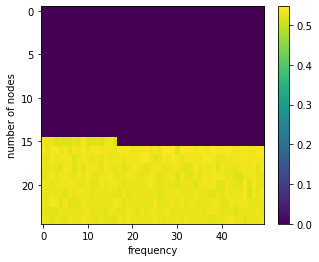

now = 2022-11-30 23:22:58.546320
468 0.5282622246751851


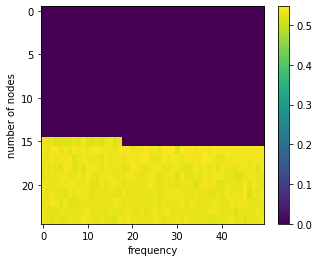

now = 2022-11-30 23:23:54.679881
469 0.5226388041908501


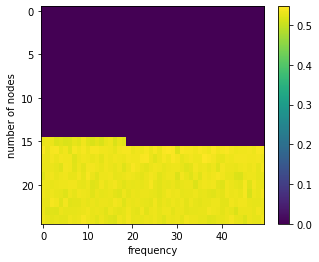

now = 2022-11-30 23:24:49.616787
470 0.5193136694160556


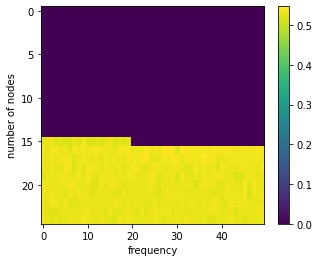

now = 2022-11-30 23:25:45.308244
471 0.5258946277344411


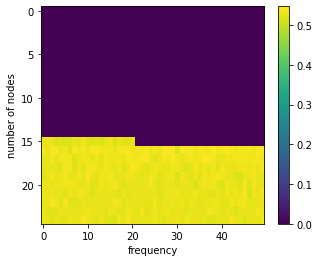

now = 2022-11-30 23:26:40.887501
472 0.528438470130132


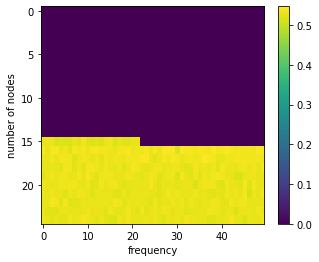

now = 2022-11-30 23:27:36.005532
473 0.5268487145828242


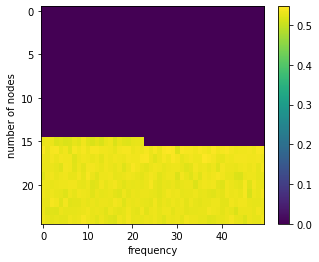

now = 2022-11-30 23:28:31.589165
474 0.5233868135773828


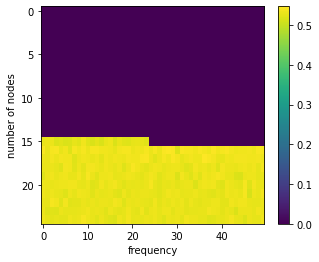

now = 2022-11-30 23:29:26.421482
475 0.5353455244945299


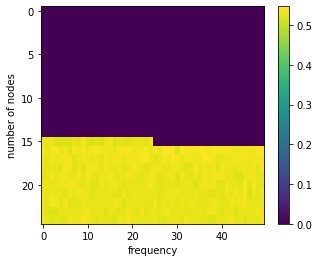

now = 2022-11-30 23:30:22.110133
476 0.5300230297275378


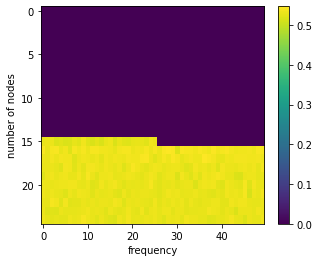

now = 2022-11-30 23:31:16.632127
477 0.5223621455682678


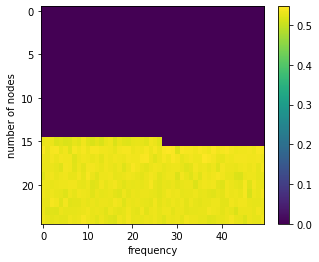

now = 2022-11-30 23:32:11.215422
478 0.5195472269547652


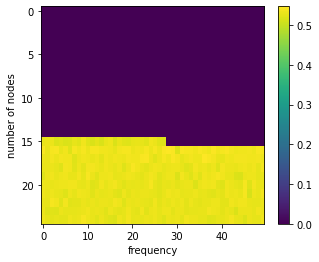

now = 2022-11-30 23:33:07.036917
479 0.5302607272812994


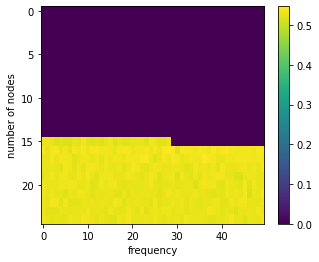

now = 2022-11-30 23:34:01.637155
480 0.5392202979748132


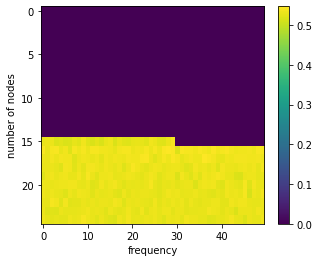

now = 2022-11-30 23:34:56.909745
481 0.51909455523688


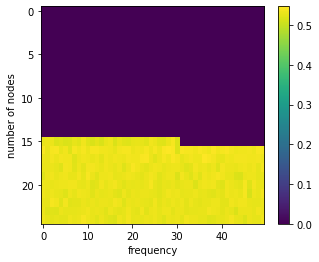

now = 2022-11-30 23:35:52.992306
482 0.5262975453417212


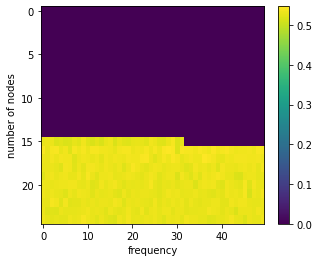

now = 2022-11-30 23:36:47.645532
483 0.532265724337378


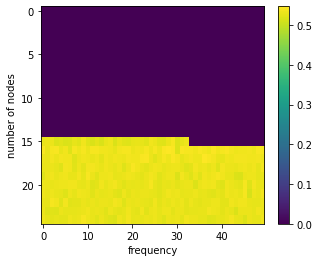

now = 2022-11-30 23:37:42.916048
484 0.5318443263253917


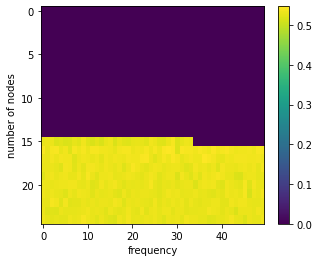

now = 2022-11-30 23:38:37.599326
485 0.527576174811246


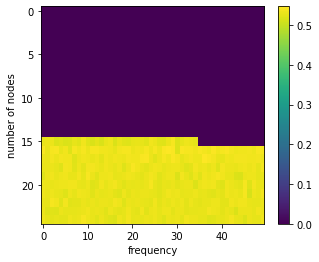

now = 2022-11-30 23:39:33.646948
486 0.5301060836036426


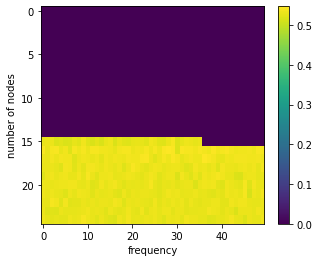

now = 2022-11-30 23:40:28.217933
487 0.525905652717477


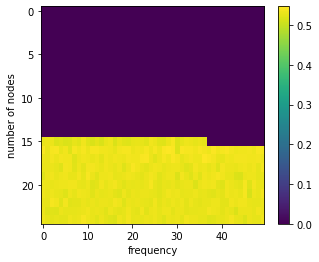

now = 2022-11-30 23:41:23.490106
488 0.5331578500085089


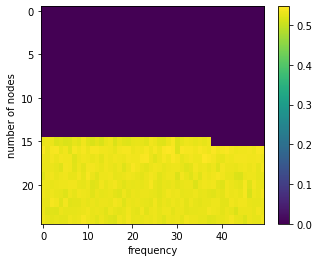

now = 2022-11-30 23:42:19.241070
489 0.530384078364786


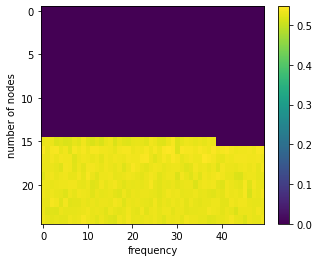

now = 2022-11-30 23:43:15.375634
490 0.5308286362918653


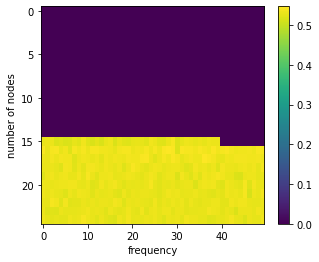

now = 2022-11-30 23:44:10.712290
491 0.5196121199774852


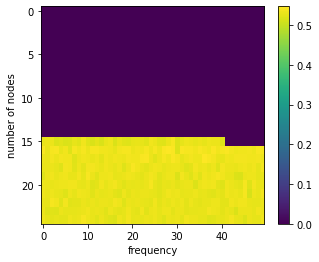

now = 2022-11-30 23:45:05.760043
492 0.520434695122581


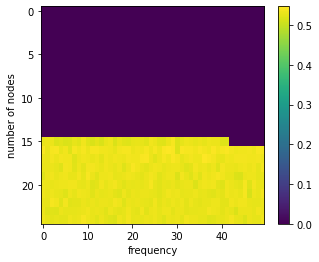

now = 2022-11-30 23:46:00.824045
493 0.5222116990128925


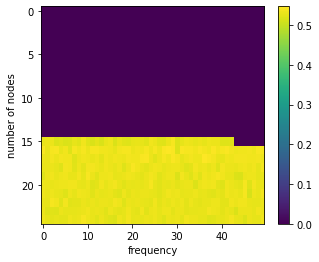

now = 2022-11-30 23:46:55.740775
494 0.5198375479726149


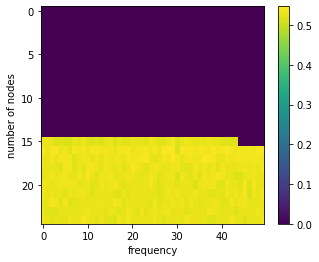

now = 2022-11-30 23:47:49.816052
495 0.5226319073691006


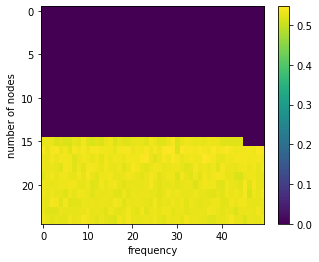

now = 2022-11-30 23:48:45.059914
496 0.5169191211100229


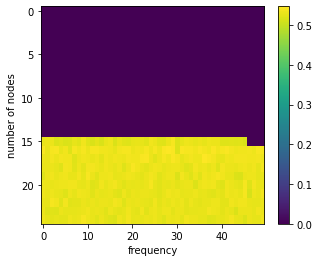

now = 2022-11-30 23:49:41.207506
497 0.5173359735074284


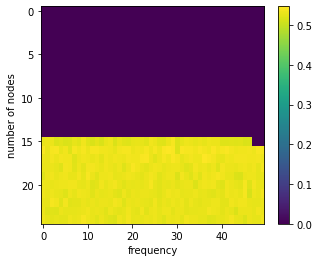

now = 2022-11-30 23:50:36.397852
498 0.53039579365935


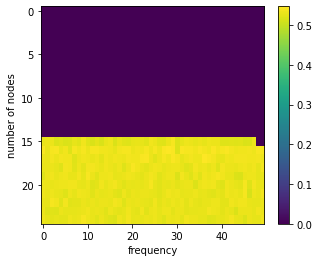

now = 2022-11-30 23:51:31.847950
499 0.5178558381654396


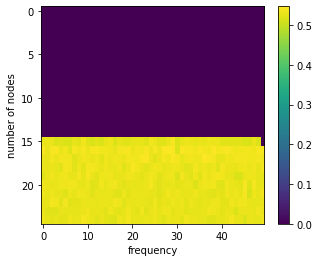

now = 2022-11-30 23:52:26.550340
500 0.5262549944323947


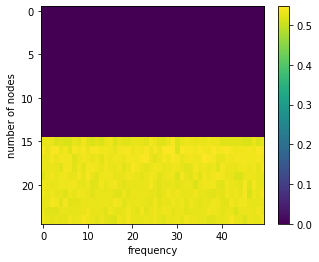

now = 2022-11-30 23:53:21.186349
501 0.5378844235277722


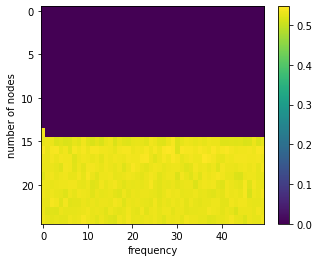

now = 2022-11-30 23:54:17.258680
502 0.5286212314187299


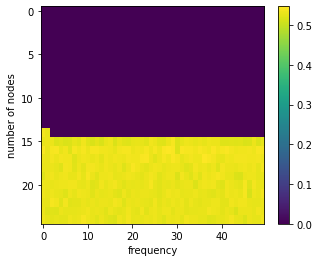

now = 2022-11-30 23:55:12.096214
503 0.5255151283611882


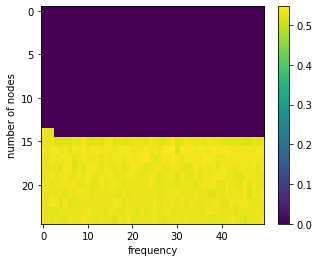

now = 2022-11-30 23:56:06.677654
504 0.516841169339197


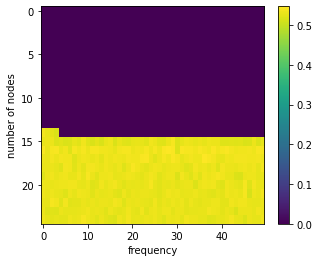

now = 2022-11-30 23:57:01.519415
505 0.5212828431292156


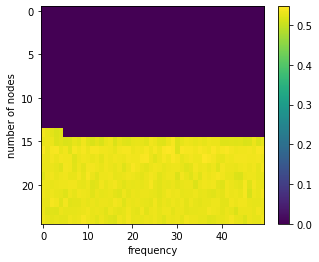

now = 2022-11-30 23:57:57.271838
506 0.5283164100957667


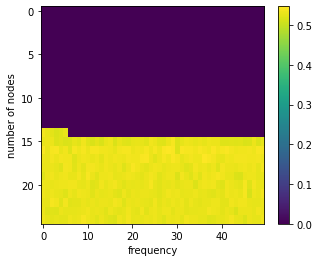

now = 2022-11-30 23:58:52.592359
507 0.5279061392255556


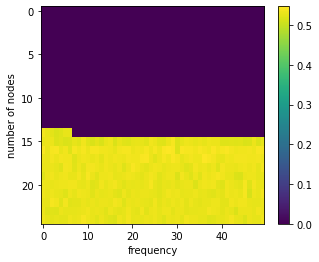

now = 2022-11-30 23:59:47.767343
508 0.5258364931723445


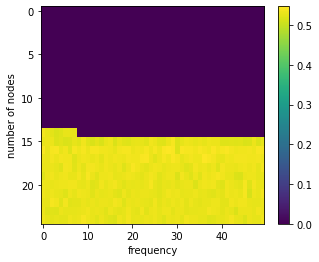

now = 2022-12-01 00:00:43.902252
509 0.5280725345237584


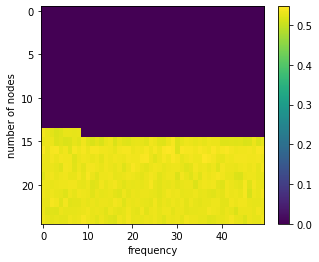

now = 2022-12-01 00:01:39.575703
510 0.5338535667567628


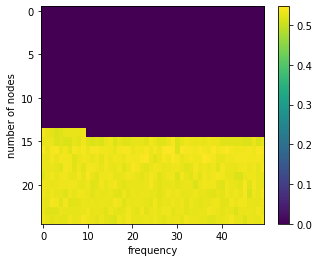

now = 2022-12-01 00:02:34.751093
511 0.5237844885011831


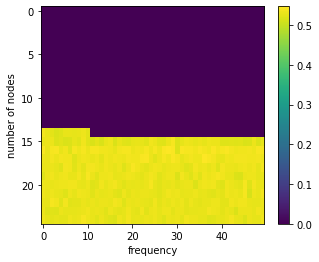

now = 2022-12-01 00:03:29.587722
512 0.5235597296314206


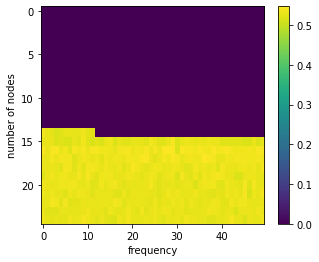

now = 2022-12-01 00:04:25.299850
513 0.531185616985979


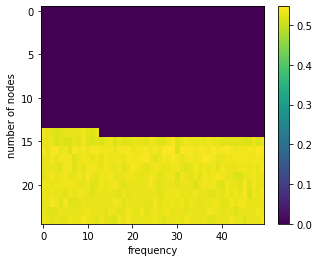

now = 2022-12-01 00:05:19.886236
514 0.5217921151452587


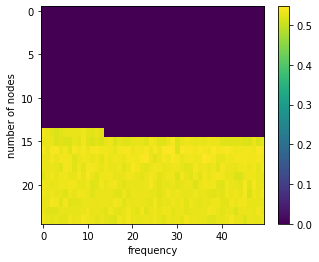

now = 2022-12-01 00:06:14.851764
515 0.5294006874191836


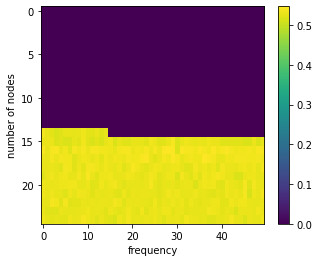

now = 2022-12-01 00:07:10.616828
516 0.5241234762866329


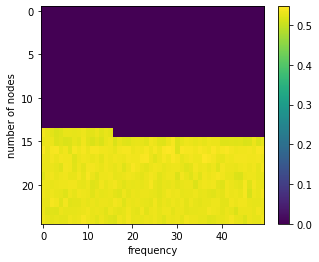

now = 2022-12-01 00:08:06.177067
517 0.5226220833767656


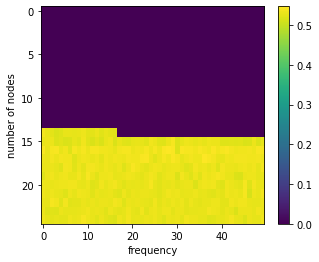

now = 2022-12-01 00:09:00.885802
518 0.5218821283538028


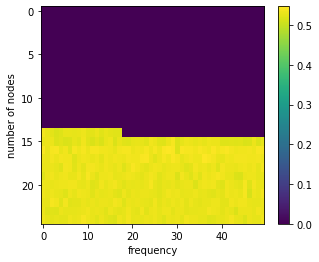

now = 2022-12-01 00:09:55.367526
519 0.5209991279967565


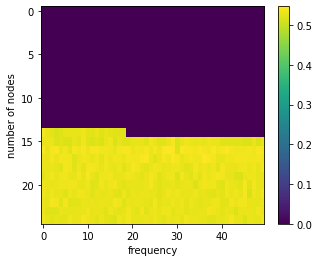

now = 2022-12-01 00:10:51.489653
520 0.5255403477887806


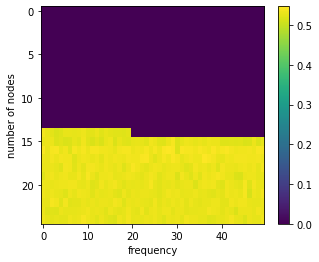

now = 2022-12-01 00:11:46.884629
521 0.52495609748765


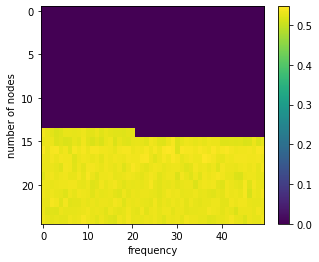

now = 2022-12-01 00:12:42.727333
522 0.5203973978766612


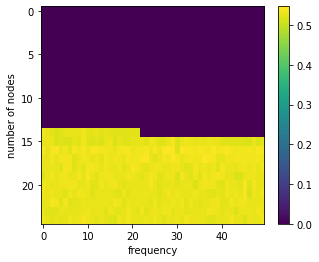

now = 2022-12-01 00:13:37.176217
523 0.5271627127172281


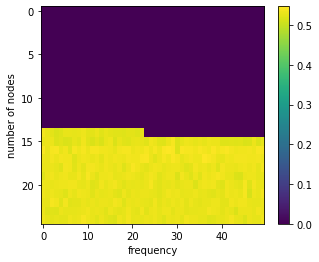

now = 2022-12-01 00:14:33.012033
524 0.529139700604425


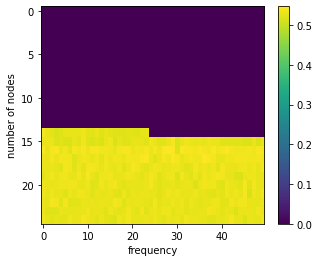

now = 2022-12-01 00:15:29.161049
525 0.5249649828540194


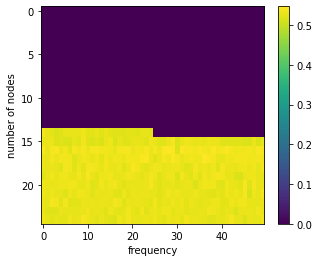

now = 2022-12-01 00:16:25.269039
526 0.5250449721531308


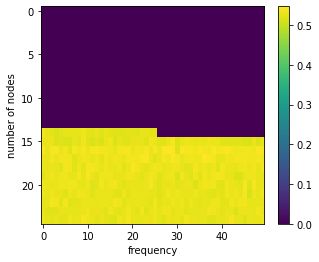

now = 2022-12-01 00:17:20.176532
527 0.5161354363630133


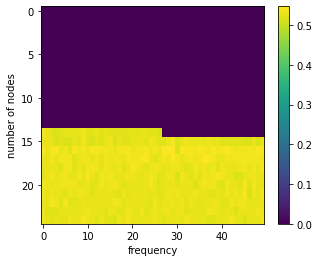

now = 2022-12-01 00:18:16.177635
528 0.5203899727046762


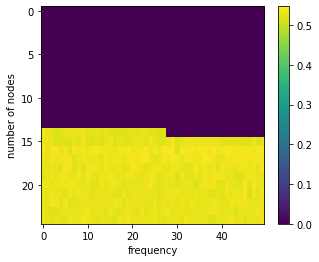

now = 2022-12-01 00:19:11.471336
529 0.5268513875555311


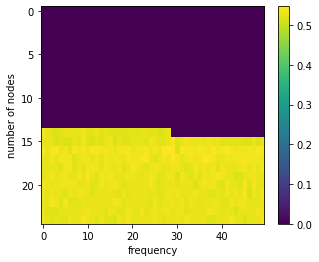

now = 2022-12-01 00:20:07.567909
530 0.5314562865133449


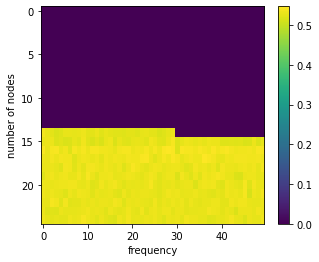

now = 2022-12-01 00:21:02.887581
531 0.5181548457935821


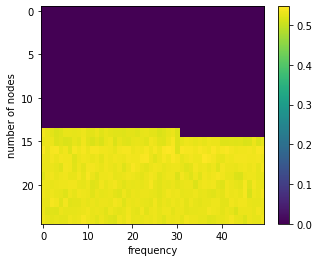

now = 2022-12-01 00:21:58.432014
532 0.5335313040675878


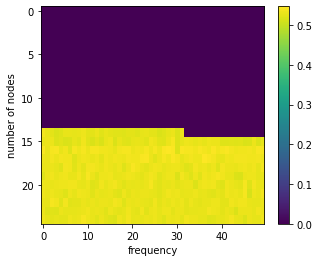

now = 2022-12-01 00:22:54.383024
533 0.529861983961991


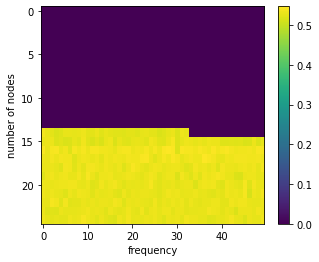

now = 2022-12-01 00:23:49.484668
534 0.5135622415913161


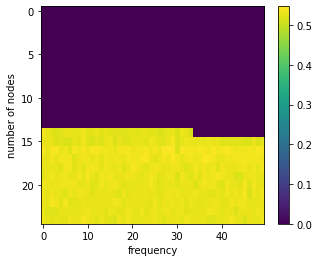

now = 2022-12-01 00:24:43.964825
535 0.5337443702627476


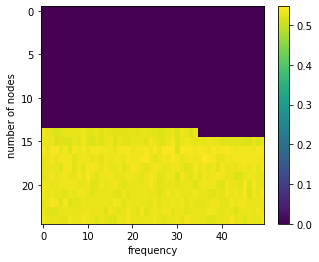

now = 2022-12-01 00:25:38.746018
536 0.5262238654419462


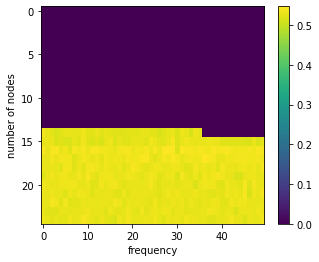

now = 2022-12-01 00:26:34.259309
537 0.5238466372701477


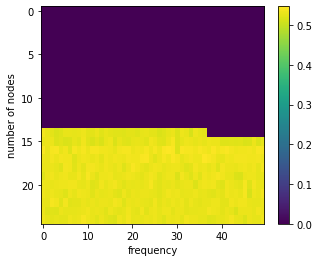

now = 2022-12-01 00:27:28.525229
538 0.5202467234426139


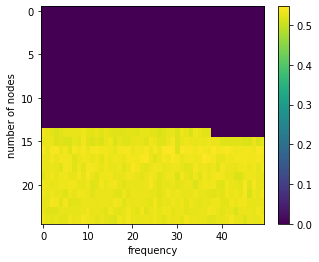

now = 2022-12-01 00:28:24.696652
539 0.5226303873357668


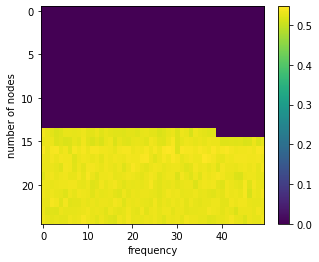

now = 2022-12-01 00:29:20.147925
540 0.5226509880911079


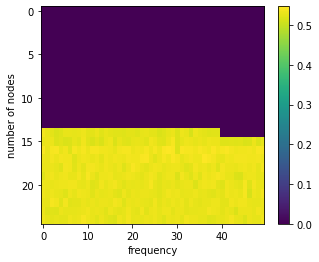

now = 2022-12-01 00:30:16.132260
541 0.5246119204041302


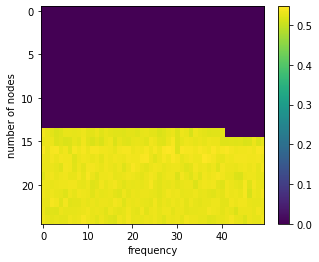

now = 2022-12-01 00:31:11.321235
542 0.5202361272551543


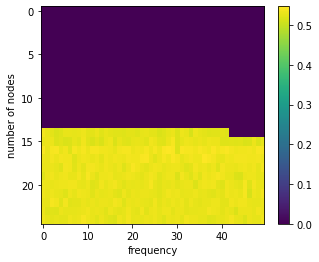

now = 2022-12-01 00:32:06.764464
543 0.5193234010865806


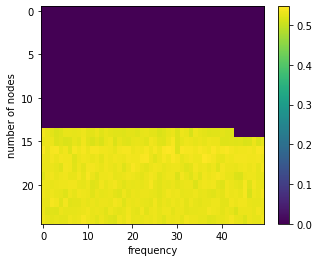

now = 2022-12-01 00:33:02.033483
544 0.5223879159819184


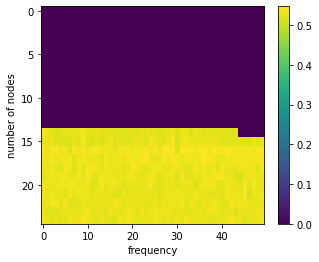

now = 2022-12-01 00:33:57.503088
545 0.5202205860240324


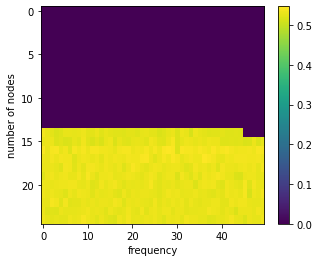

now = 2022-12-01 00:34:52.615764
546 0.521106878145587


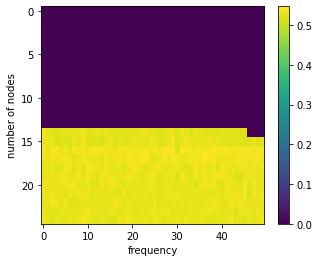

now = 2022-12-01 00:35:47.785003
547 0.5199032184799807


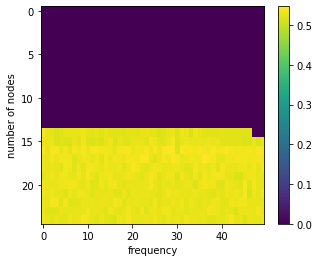

now = 2022-12-01 00:36:43.776484
548 0.5242041392621097


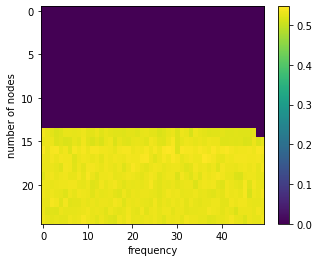

now = 2022-12-01 00:37:39.135850
549 0.520375336835121


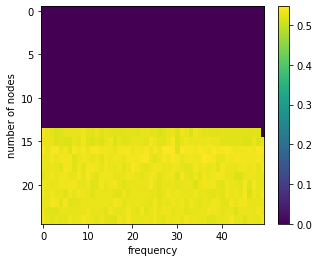

now = 2022-12-01 00:38:34.558612
550 0.5242102098025657


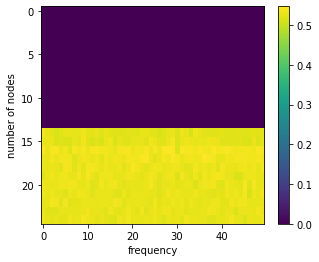

now = 2022-12-01 00:39:30.024509
551 0.5328206536603572


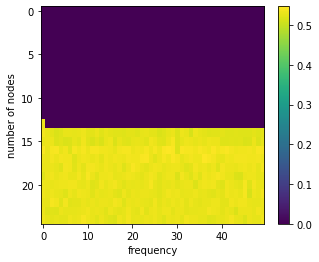

now = 2022-12-01 00:40:25.719041
552 0.5168756647846132


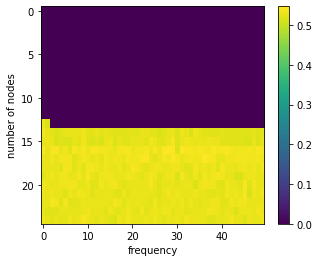

now = 2022-12-01 00:41:20.778661
553 0.5317644613472009


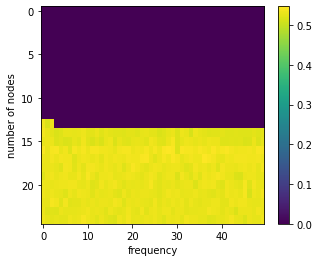

now = 2022-12-01 00:42:15.374118
554 0.5228227847184148


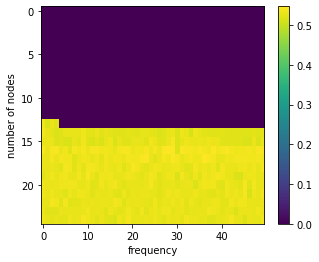

now = 2022-12-01 00:43:11.990428
555 0.5279865320754603


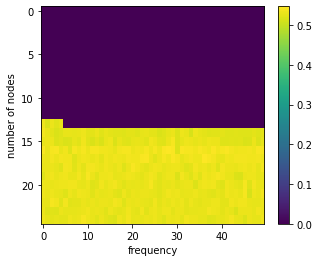

now = 2022-12-01 00:44:07.331781
556 0.5323401277690503


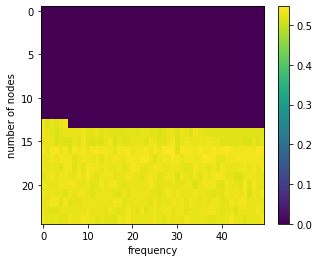

now = 2022-12-01 00:45:03.178276
557 0.5185691035273301


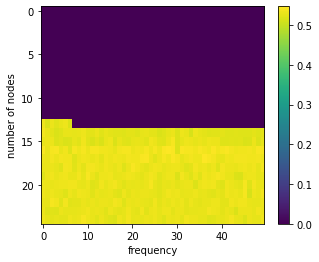

now = 2022-12-01 00:45:57.882812
558 0.5335453473768281


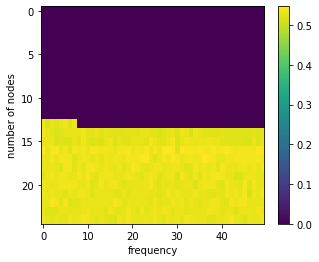

now = 2022-12-01 00:46:53.671367
559 0.5239590110080629


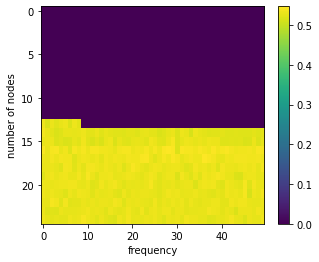

now = 2022-12-01 00:47:49.661925
560 0.5290675241958568


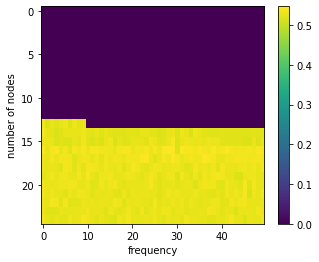

now = 2022-12-01 00:48:45.467961
561 0.533324266507838


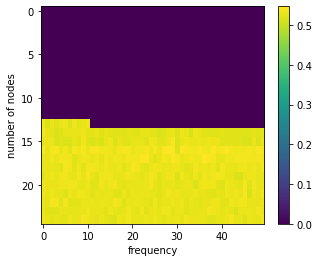

now = 2022-12-01 00:49:40.202669
562 0.5283650643011851


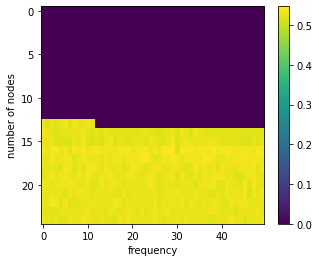

now = 2022-12-01 00:50:36.095590
563 0.5166488145761101


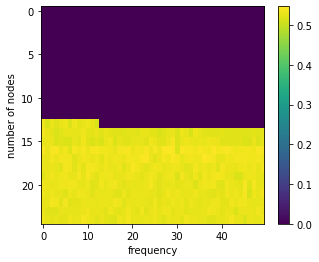

now = 2022-12-01 00:51:30.354627
564 0.5166815623822064


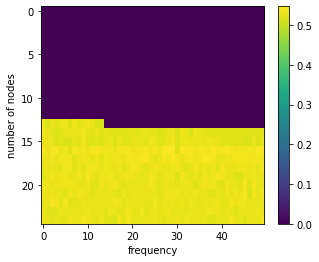

now = 2022-12-01 00:52:25.244251
565 0.5330114092577667


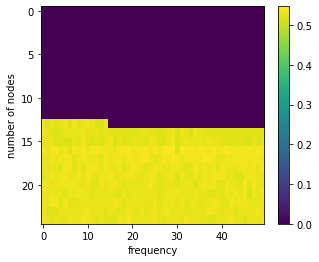

now = 2022-12-01 00:53:20.624227
566 0.5336834339461872


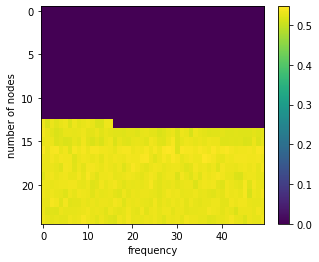

now = 2022-12-01 00:54:15.458059
567 0.5202897437336008


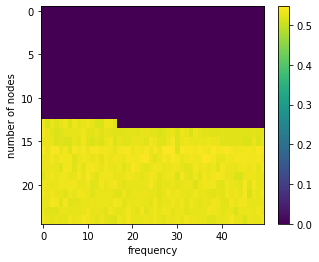

now = 2022-12-01 00:55:10.868461
568 0.5206039970241266


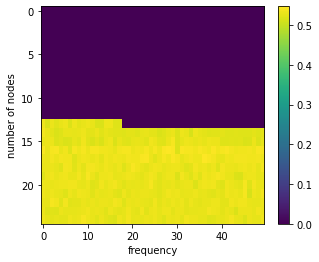

now = 2022-12-01 00:56:06.192530
569 0.5182593129492761


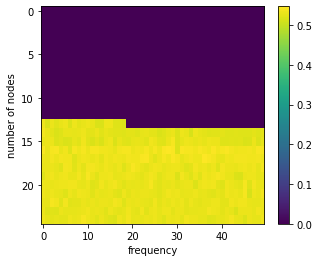

now = 2022-12-01 00:57:01.123622
570 0.5304080930898166


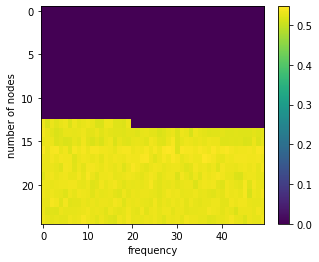

now = 2022-12-01 00:57:56.330664
571 0.5252775481228276


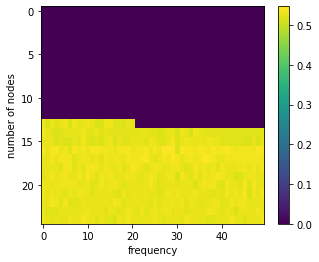

now = 2022-12-01 00:58:53.712689
572 0.5275240798867514


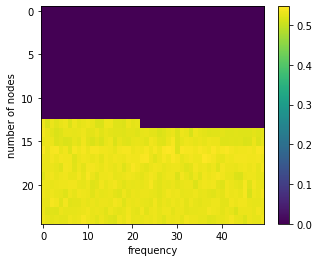

now = 2022-12-01 00:59:47.733672
573 0.522959290416386


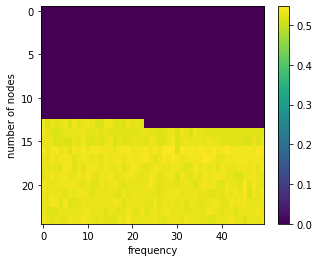

now = 2022-12-01 01:00:43.045576
574 0.5239416993729782


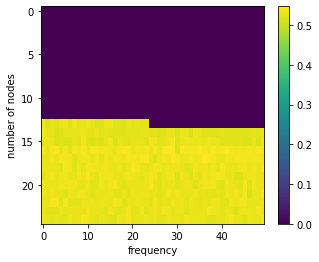

now = 2022-12-01 01:01:38.252772
575 0.5313398910746253


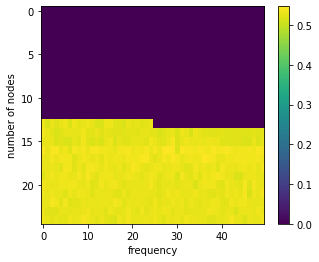

now = 2022-12-01 01:02:33.261472
576 0.5257686475958044


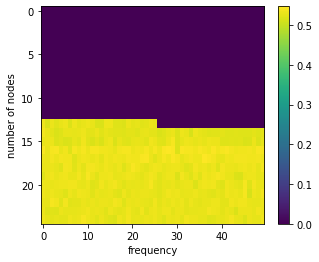

now = 2022-12-01 01:03:27.506799
577 0.5343695346151566


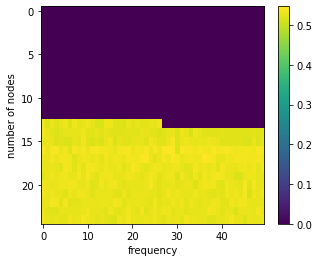

now = 2022-12-01 01:04:22.656472
578 0.5168419221078933


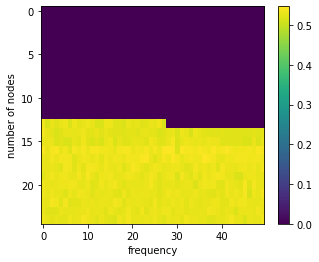

now = 2022-12-01 01:05:19.000301
579 0.5129144816376718


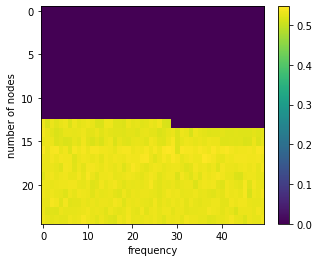

now = 2022-12-01 01:06:14.576753
580 0.5301249741365596


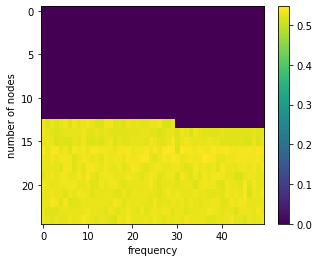

now = 2022-12-01 01:07:09.423640
581 0.5289075613683794


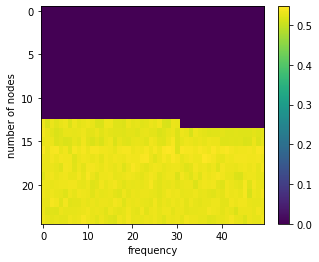

now = 2022-12-01 01:08:03.421384
582 0.5354333922859532


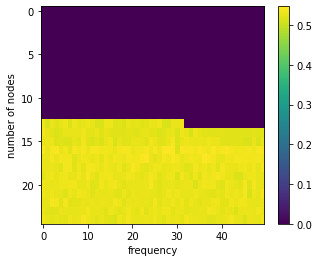

now = 2022-12-01 01:08:58.811601
583 0.5439028154328297


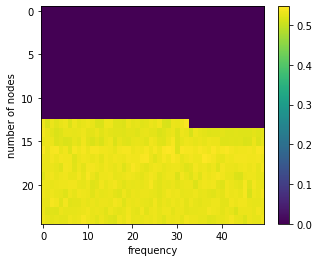

now = 2022-12-01 01:09:54.571137
584 0.5138951429701086


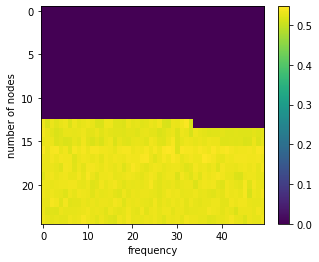

now = 2022-12-01 01:10:49.702608
585 0.5246475567757631


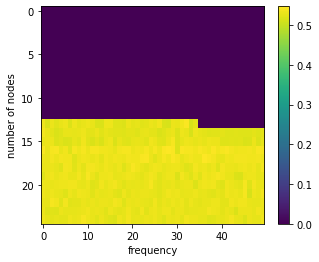

now = 2022-12-01 01:11:46.034137
586 0.5331202987922792


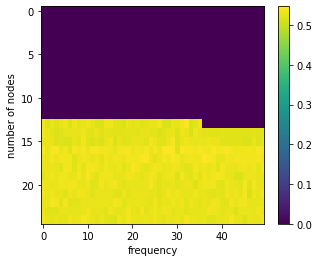

now = 2022-12-01 01:12:41.090798
587 0.5378113430186592


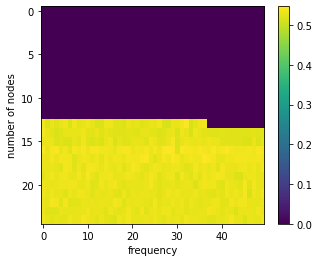

now = 2022-12-01 01:13:36.149131
588 0.5259627945011782


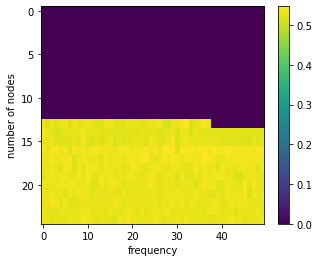

now = 2022-12-01 01:14:31.313897
589 0.5282273608886494


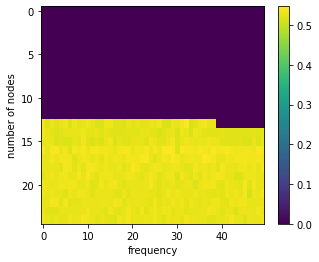

now = 2022-12-01 01:15:27.159050
590 0.5272831075842792


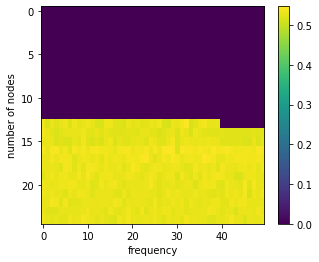

now = 2022-12-01 01:16:23.043371
591 0.5375214482986777


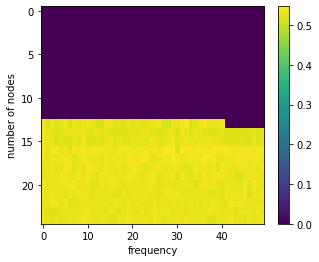

now = 2022-12-01 01:17:17.677841
592 0.5177553114928318


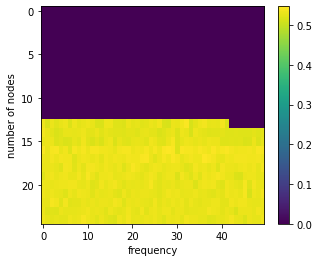

now = 2022-12-01 01:18:12.056550
593 0.5242690949248398


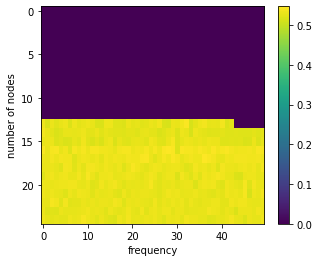

now = 2022-12-01 01:19:06.615385
594 0.5309510655601228


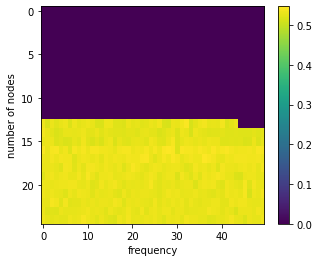

now = 2022-12-01 01:20:02.343406
595 0.5227795361165405


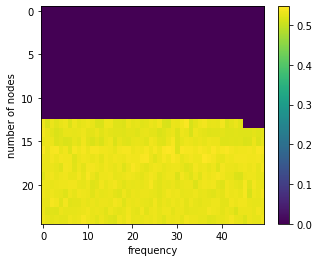

now = 2022-12-01 01:20:58.649911
596 0.5228266954321911


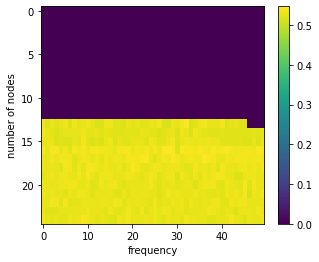

now = 2022-12-01 01:21:53.818686
597 0.5234565717231393


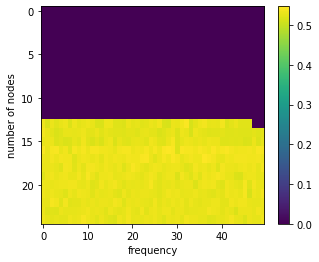

now = 2022-12-01 01:22:49.164493
598 0.5297609551561002


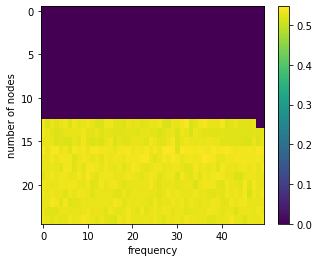

now = 2022-12-01 01:23:44.304038
599 0.532717439987098


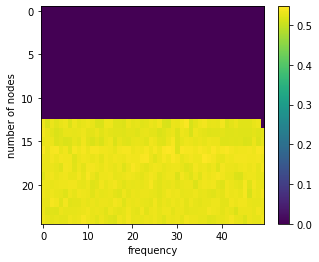

now = 2022-12-01 01:24:41.249399
600 0.529591488497433


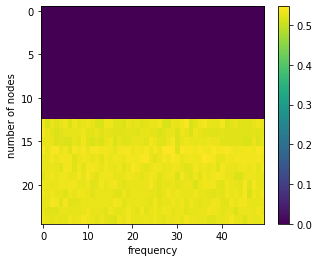

now = 2022-12-01 01:25:36.585359
601 0.5336204736267445


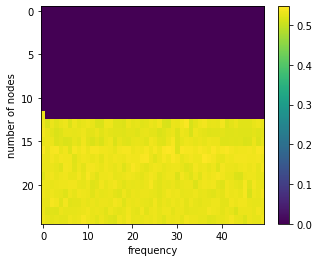

now = 2022-12-01 01:26:31.794280
602 0.5246833367165461


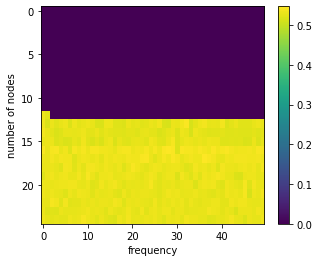

now = 2022-12-01 01:27:27.592612
603 0.5301182029664497


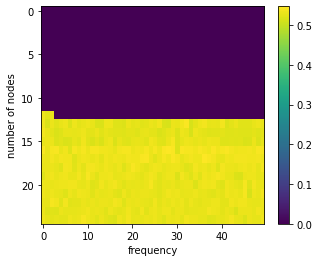

now = 2022-12-01 01:28:22.928447
604 0.5211384247319815


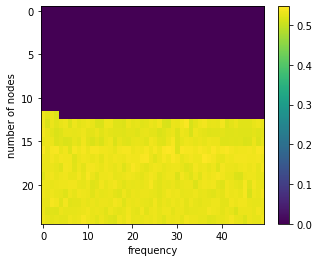

now = 2022-12-01 01:29:18.207061
605 0.5237129421166393


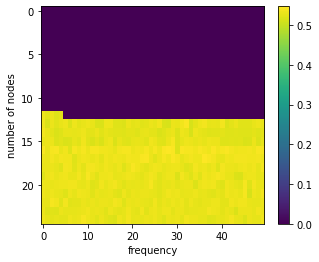

now = 2022-12-01 01:30:13.733586
606 0.5382807059213779


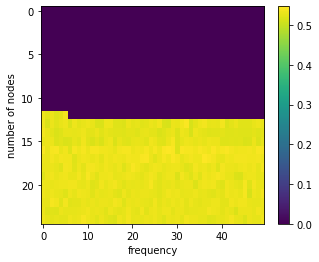

now = 2022-12-01 01:31:09.322682
607 0.5387928959932519


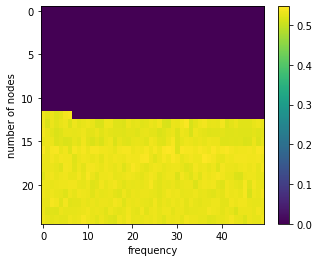

now = 2022-12-01 01:32:03.773381
608 0.5287947393540916


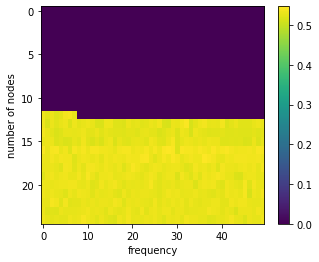

now = 2022-12-01 01:33:00.304132
609 0.5294726687083721


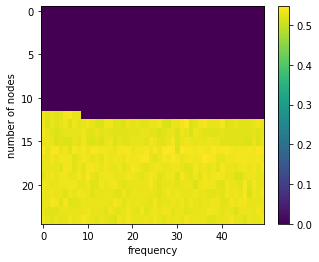

now = 2022-12-01 01:33:56.022412
610 0.5307605439060092


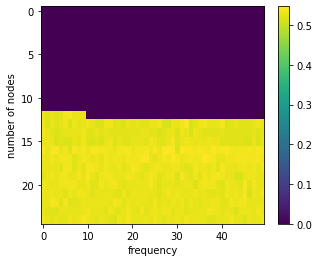

now = 2022-12-01 01:34:51.402623
611 0.530799969142372


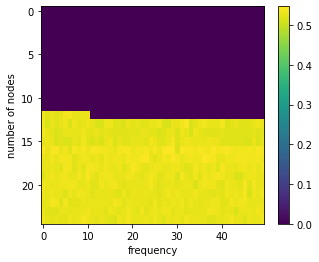

now = 2022-12-01 01:35:45.149690
612 0.5193844131997642


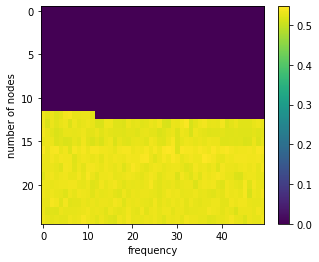

now = 2022-12-01 01:36:41.634349
613 0.5333126169412453


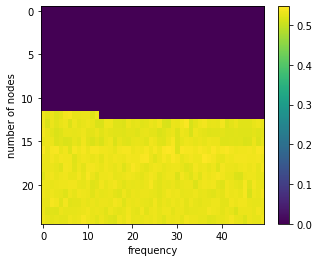

now = 2022-12-01 01:37:37.452582
614 0.5304643371277727


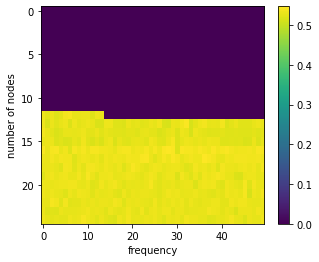

now = 2022-12-01 01:38:32.133694
615 0.5212575092849285


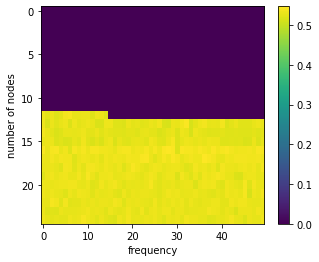

now = 2022-12-01 01:39:28.111724
616 0.5357130014854531


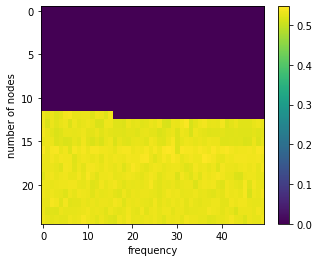

now = 2022-12-01 01:40:24.101763
617 0.528225605444539


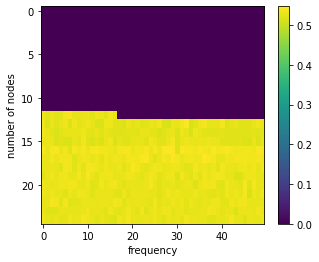

now = 2022-12-01 01:41:19.049269
618 0.517122977491534


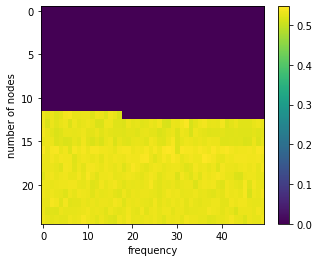

now = 2022-12-01 01:42:15.556516
619 0.5343944730632073


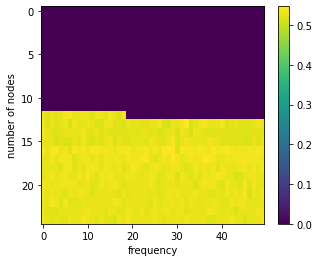

now = 2022-12-01 01:43:10.453049
620 0.5202619046096273


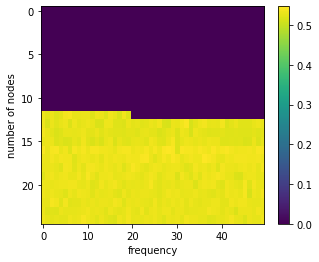

now = 2022-12-01 01:44:06.165500
621 0.5294927110853078


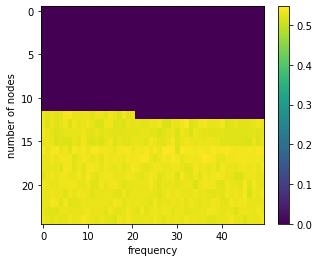

now = 2022-12-01 01:45:01.771108
622 0.5259367399999896


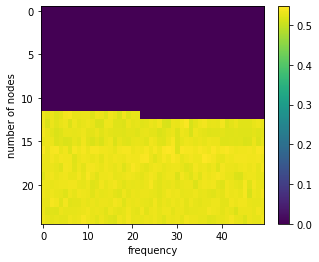

now = 2022-12-01 01:45:57.162711
623 0.5258435746327466


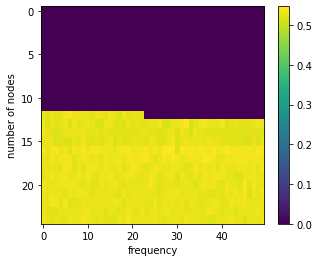

now = 2022-12-01 01:46:52.019174
624 0.5215184522337026


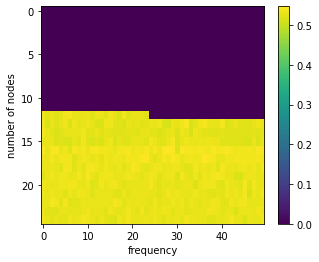

now = 2022-12-01 01:47:47.585718
625 0.5321347004414991


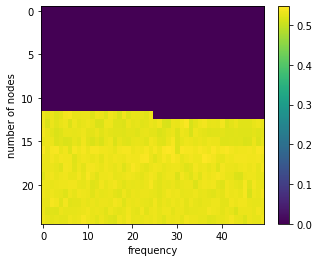

now = 2022-12-01 01:48:43.074898
626 0.527822703445097


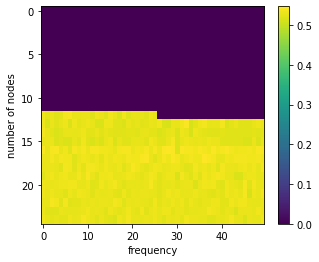

now = 2022-12-01 01:49:39.096913
627 0.5269966452587155


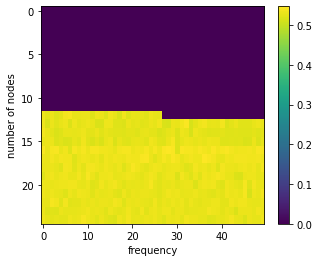

now = 2022-12-01 01:50:33.537937
628 0.5250859399125594


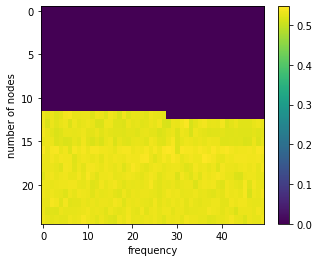

now = 2022-12-01 01:51:29.013256
629 0.5204307641973198


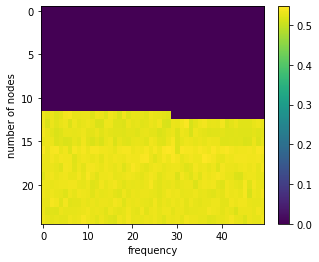

now = 2022-12-01 01:52:24.236763
630 0.536110327289284


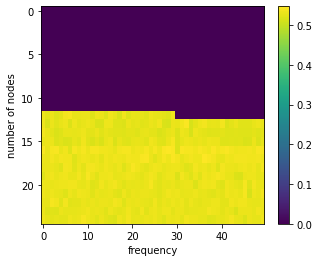

now = 2022-12-01 01:53:19.305420
631 0.5219058952789632


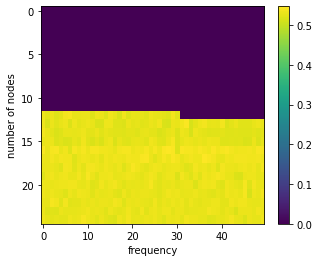

now = 2022-12-01 01:54:15.732658
632 0.5348136200380916


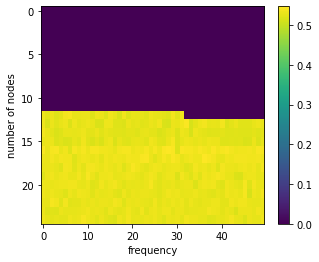

now = 2022-12-01 01:55:11.645945
633 0.5322238025217695


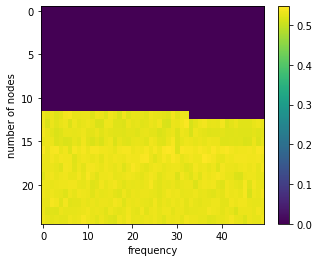

now = 2022-12-01 01:56:06.154169
634 0.534117810458317


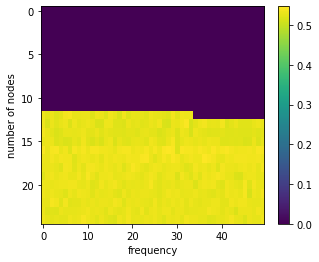

now = 2022-12-01 01:57:01.932187
635 0.5310445778942663


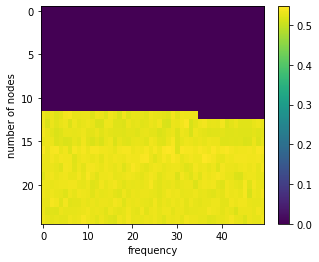

now = 2022-12-01 01:57:58.376687
636 0.5351004802664453


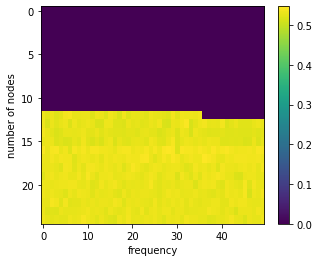

now = 2022-12-01 01:58:54.765722
637 0.5305043859603181


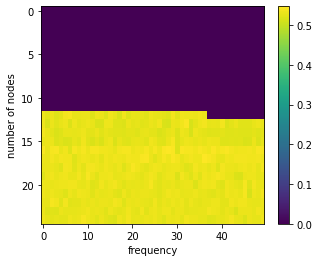

now = 2022-12-01 01:59:50.409295
638 0.5241638878354697


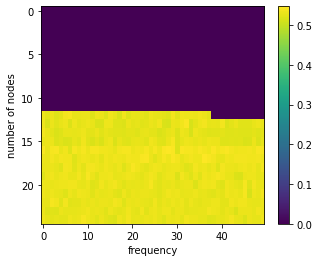

now = 2022-12-01 02:00:46.091537
639 0.526415110544838


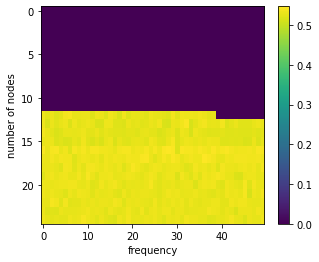

now = 2022-12-01 02:01:42.585362
640 0.5317251258094797


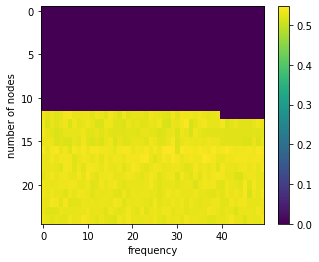

now = 2022-12-01 02:02:37.245429
641 0.520025051557945


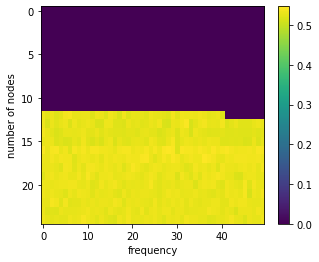

now = 2022-12-01 02:03:33.513531
642 0.5267639696031403


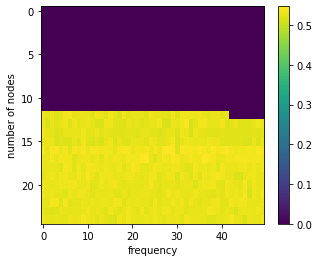

now = 2022-12-01 02:04:28.807578
643 0.5221222080832877


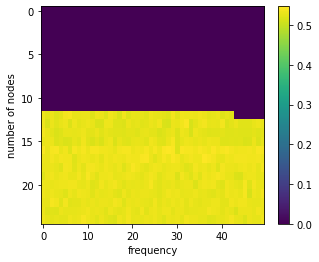

now = 2022-12-01 02:05:23.771565
644 0.5232363656102959


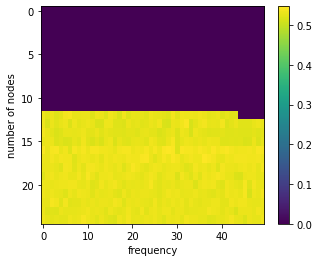

now = 2022-12-01 02:06:19.197467
645 0.5329334278618623


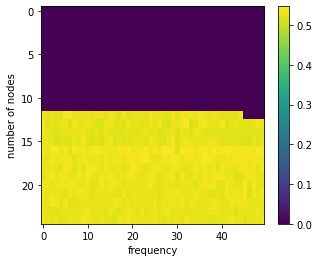

now = 2022-12-01 02:07:14.555932
646 0.5289902487869603


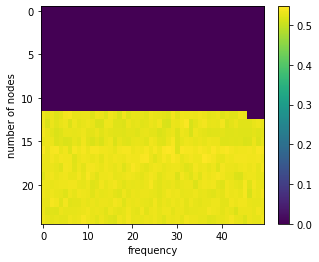

now = 2022-12-01 02:08:08.833256
647 0.5340667875917818


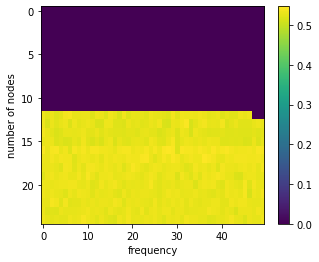

now = 2022-12-01 02:09:04.603763
648 0.5236813641411557


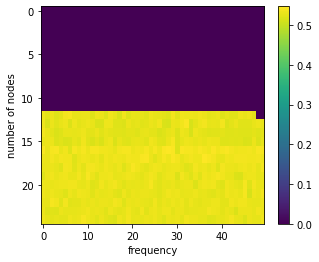

now = 2022-12-01 02:09:59.546943
649 0.5222757711565217


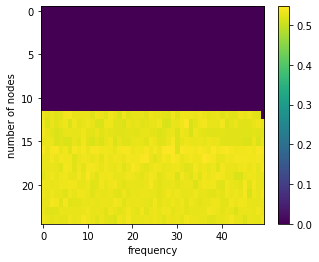

now = 2022-12-01 02:10:54.937536
650 0.5200029774205095


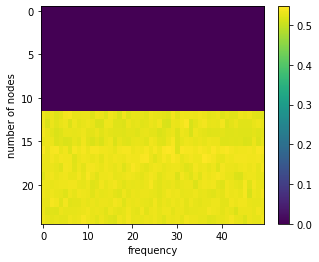

now = 2022-12-01 02:11:50.186621
651 0.5310779678235199


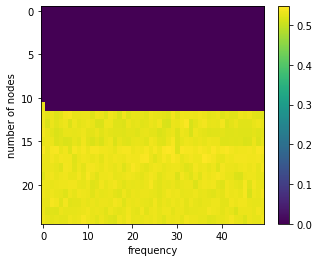

now = 2022-12-01 02:12:46.358788
652 0.5221034703887063


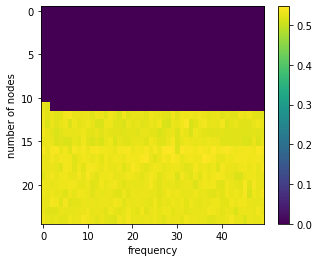

now = 2022-12-01 02:13:41.361073
653 0.5186420893684625


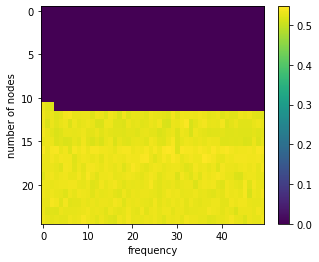

now = 2022-12-01 02:14:37.484530
654 0.5118876394791998


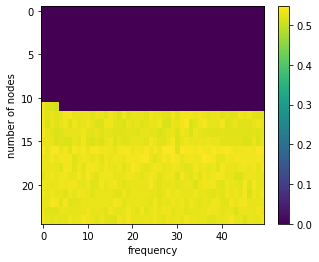

now = 2022-12-01 02:15:34.397777
655 0.5209456053069573


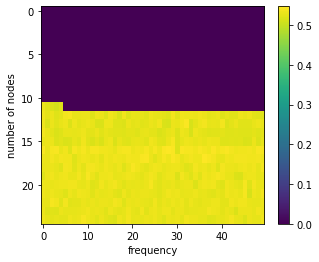

now = 2022-12-01 02:16:30.937248
656 0.5210532294730423


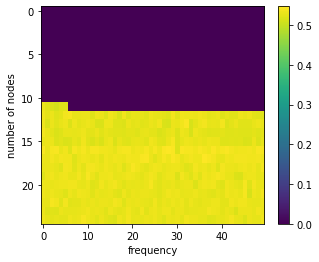

now = 2022-12-01 02:17:25.523307
657 0.5194600190200117


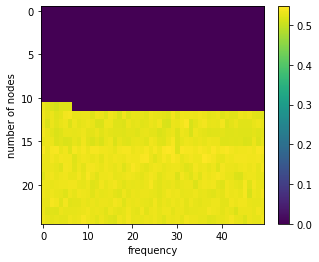

now = 2022-12-01 02:18:20.714195
658 0.5241712025059011


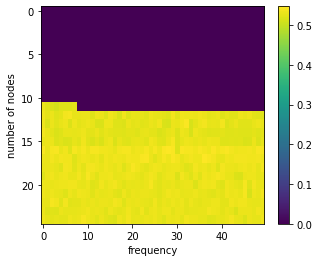

now = 2022-12-01 02:19:17.762562
659 0.5167091803596986


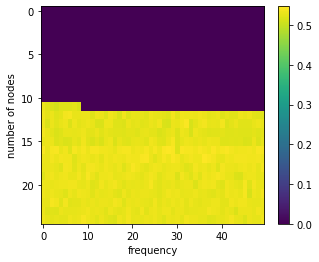

now = 2022-12-01 02:20:13.068446
660 0.5197749544967503


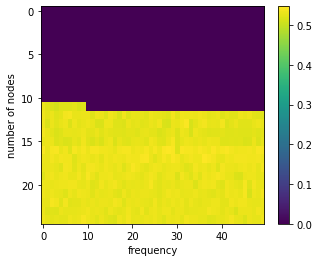

now = 2022-12-01 02:21:09.484810
661 0.5144922629638866


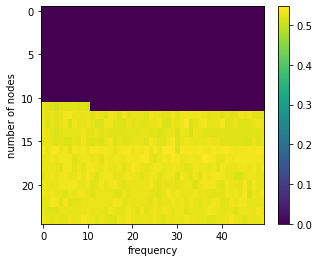

now = 2022-12-01 02:22:04.946834
662 0.5192217127217913


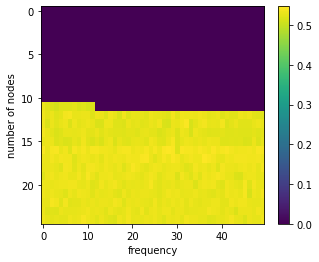

now = 2022-12-01 02:23:00.667426
663 0.5161143815808981


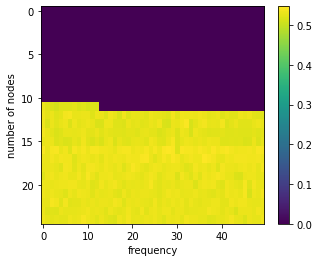

now = 2022-12-01 02:23:56.556043
664 0.5195593032014021


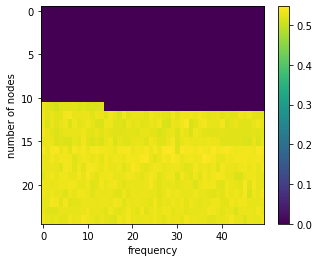

now = 2022-12-01 02:24:52.414048
665 0.5167162388145758


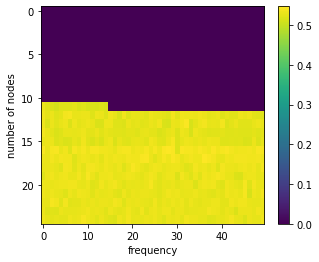

now = 2022-12-01 02:25:48.542076
666 0.5317940491374771


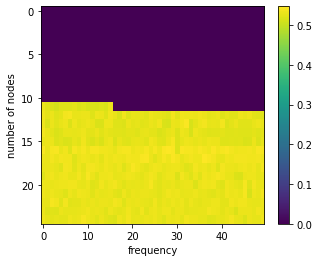

now = 2022-12-01 02:26:44.007742
667 0.5202532051658978


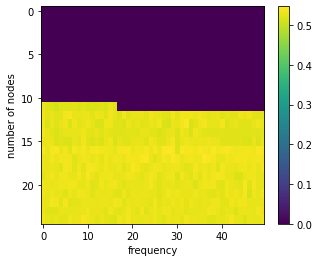

now = 2022-12-01 02:27:39.844102
668 0.5158957276883827


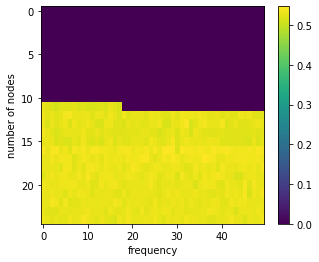

now = 2022-12-01 02:28:34.921270
669 0.5334901045307366


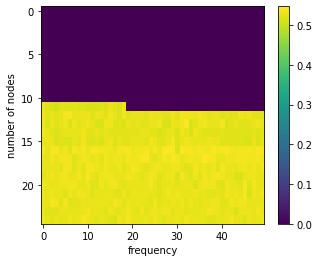

now = 2022-12-01 02:29:29.610705
670 0.520547164020698


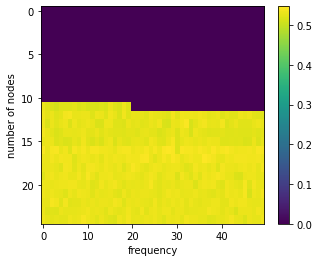

now = 2022-12-01 02:30:26.325256
671 0.5188745244218514


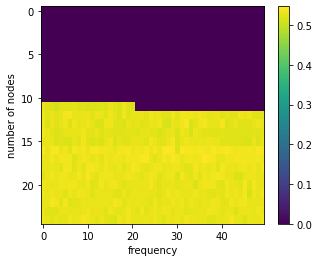

now = 2022-12-01 02:31:22.960607
672 0.521266263204146


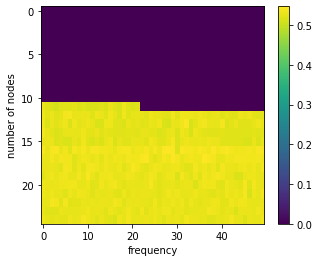

now = 2022-12-01 02:32:18.153527
673 0.5183382350084133


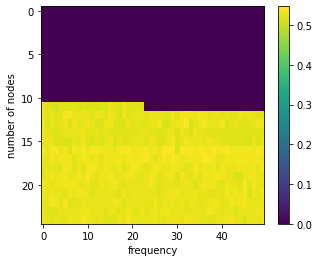

now = 2022-12-01 02:33:13.485147
674 0.5200606169099007


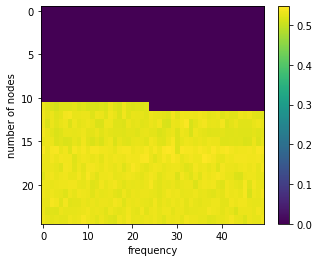

now = 2022-12-01 02:34:10.072907
675 0.5302725994947922


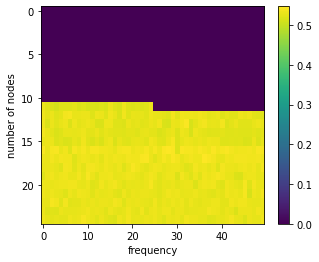

now = 2022-12-01 02:35:05.667896
676 0.5193924014291483


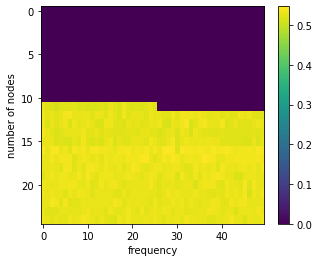

now = 2022-12-01 02:36:00.730159
677 0.5172181742422023


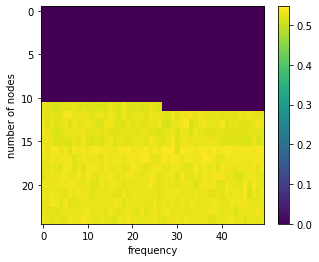

now = 2022-12-01 02:36:57.733157
678 0.5214019186874302


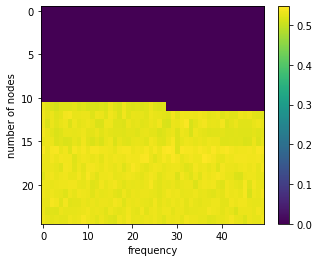

now = 2022-12-01 02:37:54.044382
679 0.5283274294201145


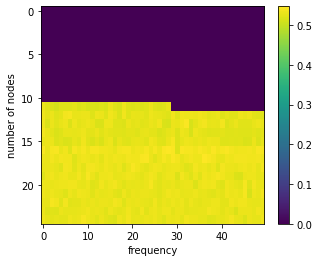

now = 2022-12-01 02:38:49.163959
680 0.5207290155336228


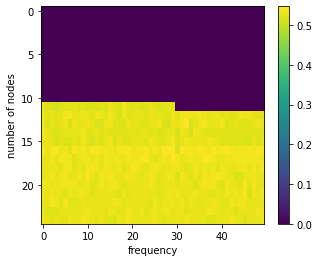

now = 2022-12-01 02:39:43.851818
681 0.5210760523634936


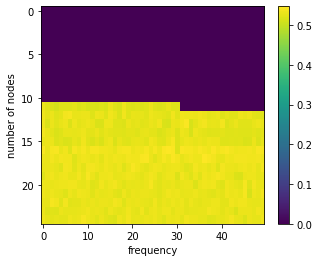

now = 2022-12-01 02:40:37.624020
682 0.5249267824562611


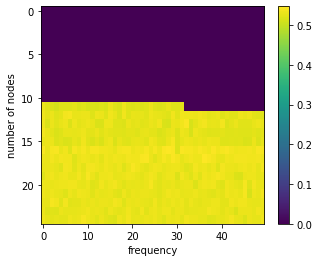

now = 2022-12-01 02:41:31.322965
683 0.5199669290775432


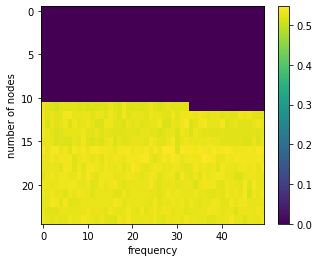

now = 2022-12-01 02:42:27.227089
684 0.5313265811685671


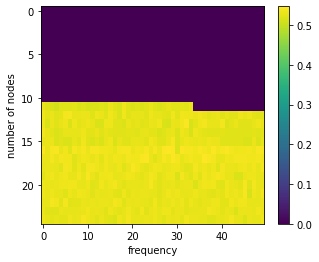

now = 2022-12-01 02:43:23.053033
685 0.5152610686554984


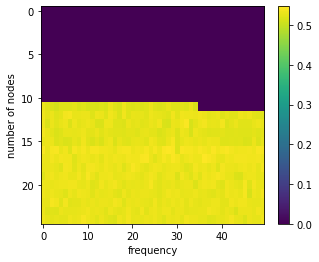

now = 2022-12-01 02:44:18.731007
686 0.5232303864106012


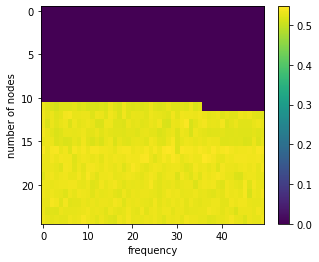

now = 2022-12-01 02:45:13.887799
687 0.5184740336198193


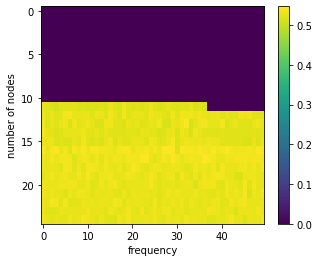

now = 2022-12-01 02:46:09.409379
688 0.5281193923515112


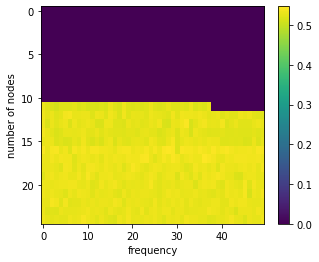

now = 2022-12-01 02:47:04.696511
689 0.5287459902158894


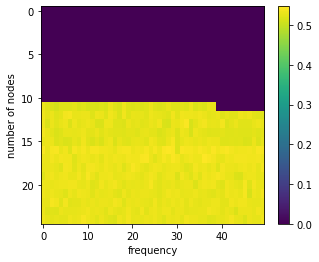

now = 2022-12-01 02:48:00.159655
690 0.5271584554348628


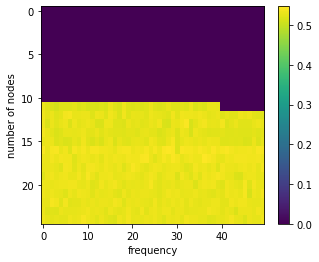

now = 2022-12-01 02:48:55.452467
691 0.5137065194964365


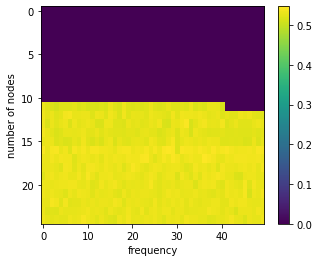

now = 2022-12-01 02:49:51.462825
692 0.5270351179026731


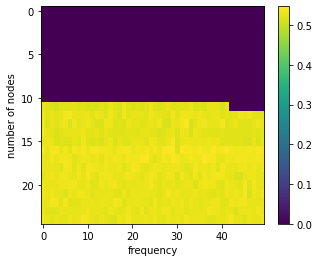

now = 2022-12-01 02:50:46.914726
693 0.5196974130428206


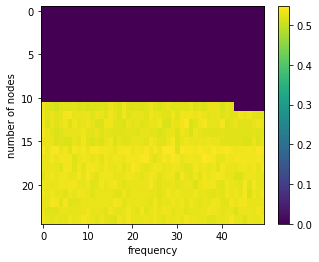

now = 2022-12-01 02:51:43.466482
694 0.5142053238204302


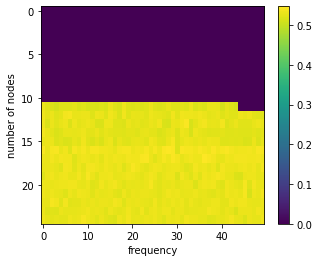

now = 2022-12-01 02:52:38.948235
695 0.5194975541933506


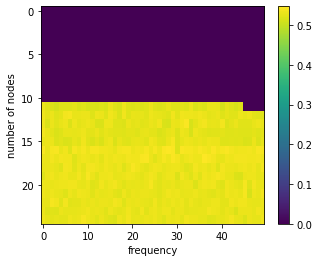

now = 2022-12-01 02:53:34.202497
696 0.5146969425303419


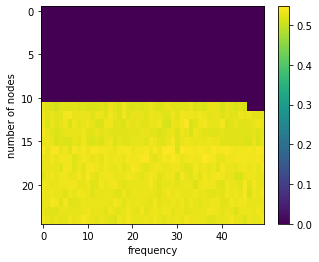

now = 2022-12-01 02:54:29.289258
697 0.5190971006854782


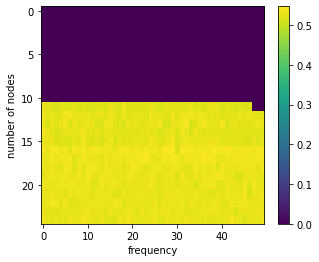

now = 2022-12-01 02:55:25.757672
698 0.5140263315538107


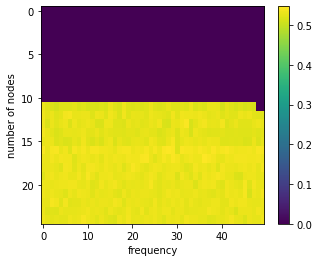

now = 2022-12-01 02:56:22.412110
699 0.5185528064192916


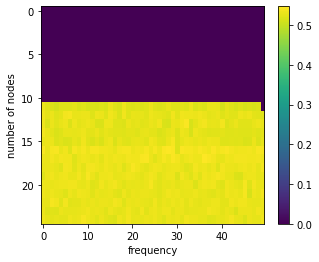

now = 2022-12-01 02:57:17.344910
700 0.5210854106926947


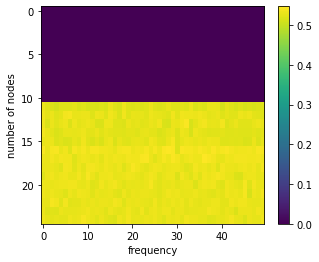

now = 2022-12-01 02:58:14.218051
701 0.5205850052595886


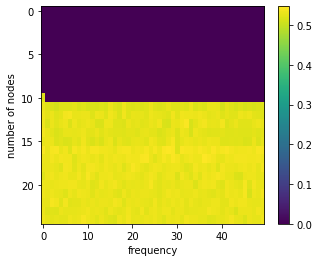

now = 2022-12-01 02:59:10.298979
702 0.53059424183787


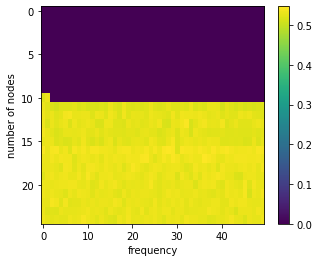

now = 2022-12-01 03:00:05.880832
703 0.5164858611778833


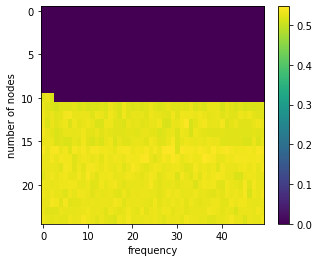

now = 2022-12-01 03:01:01.407163
704 0.5205030644050632


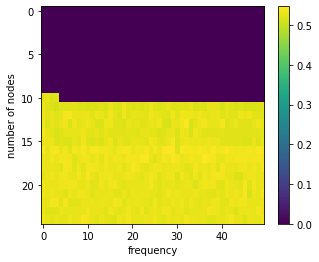

now = 2022-12-01 03:01:57.572035
705 0.5276396627029379


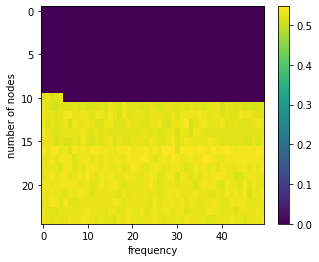

now = 2022-12-01 03:02:53.333810
706 0.5261120645780601


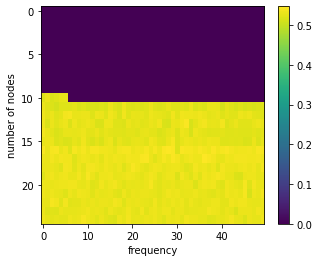

now = 2022-12-01 03:03:49.374146
707 0.5192646894268279


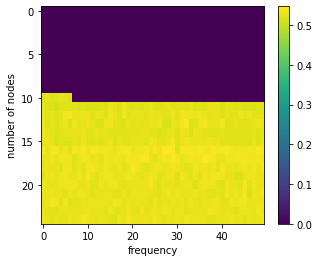

now = 2022-12-01 03:04:44.947796
708 0.5315329370134438


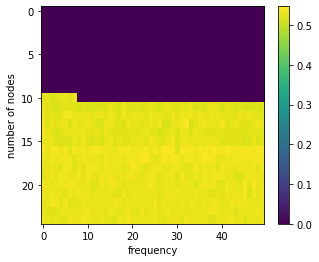

now = 2022-12-01 03:05:40.364073
709 0.5273834025650718


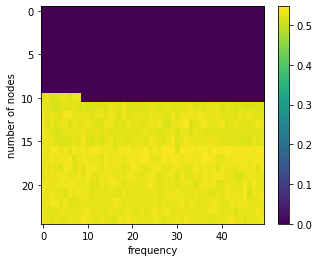

now = 2022-12-01 03:06:34.884029
710 0.537113603395162


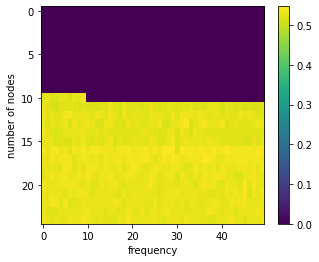

now = 2022-12-01 03:07:31.206324
711 0.5188627659396351


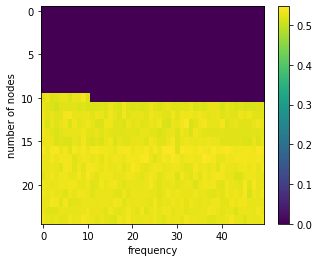

now = 2022-12-01 03:08:27.455995
712 0.5359691515901466


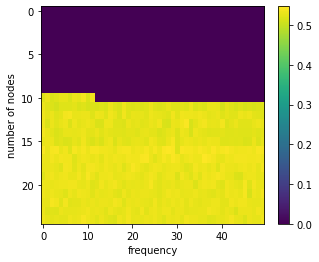

now = 2022-12-01 03:09:23.281773
713 0.5174978811668526


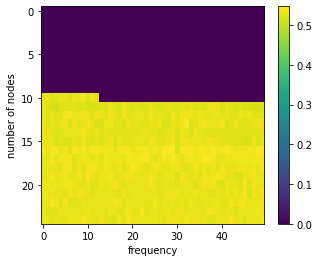

now = 2022-12-01 03:10:19.358322
714 0.5291466449035729


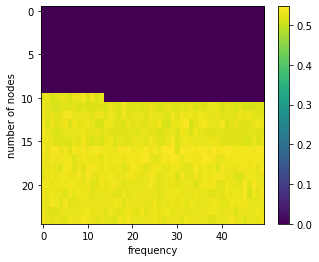

now = 2022-12-01 03:11:14.383200
715 0.5280584174878502


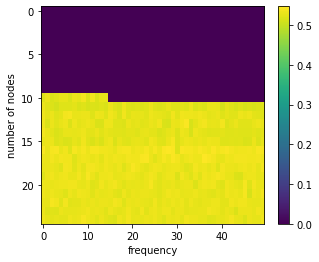

now = 2022-12-01 03:12:10.196379
716 0.5267143226848474


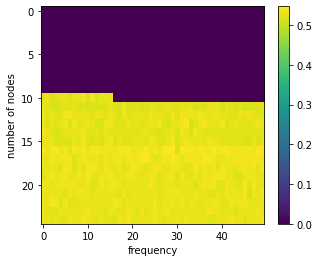

now = 2022-12-01 03:13:07.139497
717 0.5163248828970468


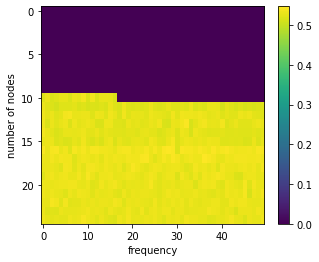

now = 2022-12-01 03:14:03.978413
718 0.51559089895978


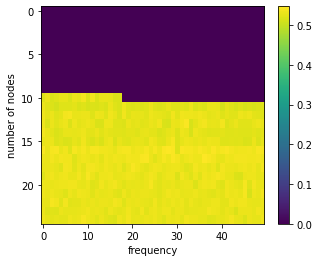

now = 2022-12-01 03:14:58.833336
719 0.5323798647409201


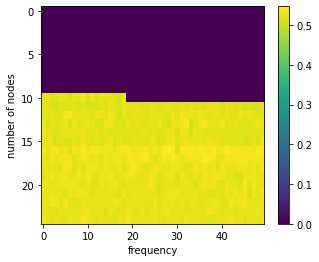

now = 2022-12-01 03:15:54.759041
720 0.5332536180400441


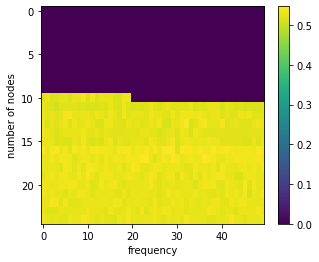

now = 2022-12-01 03:16:50.706023
721 0.5248322790472479


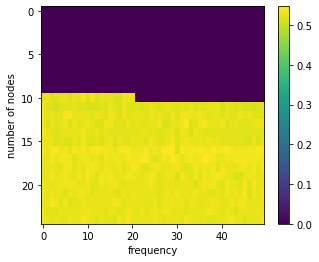

now = 2022-12-01 03:17:46.109947
722 0.5344186174607792


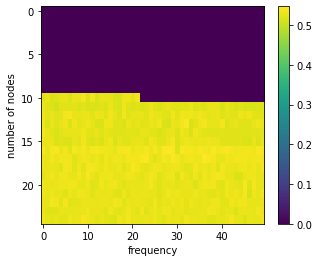

now = 2022-12-01 03:18:40.543389
723 0.5358110760953777


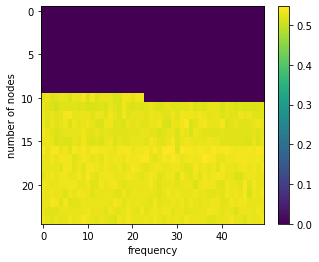

now = 2022-12-01 03:19:36.368650
724 0.5297750917087131


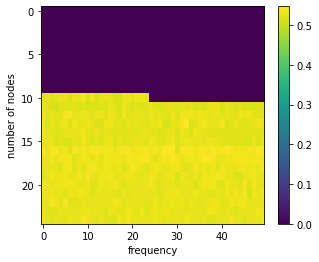

now = 2022-12-01 03:20:33.271983
725 0.5312521277567587


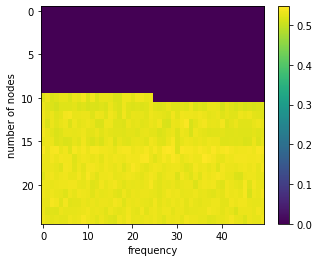

now = 2022-12-01 03:21:29.010161
726 0.5299471737302532


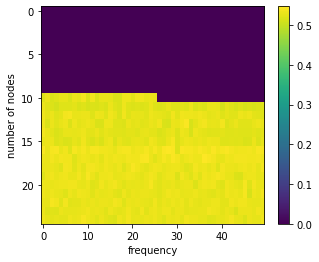

now = 2022-12-01 03:22:25.808359
727 0.5308093223037951


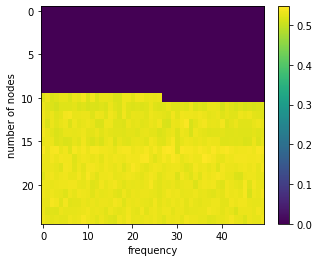

now = 2022-12-01 03:23:21.560875
728 0.5350069612785727


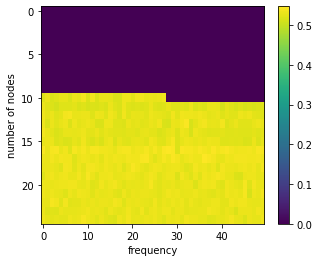

now = 2022-12-01 03:24:18.889426
729 0.5216520061305653


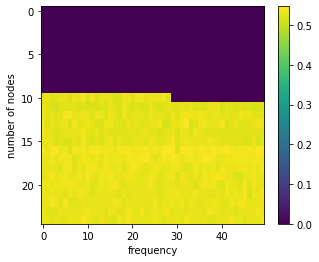

now = 2022-12-01 03:25:16.172407
730 0.5188822965075913


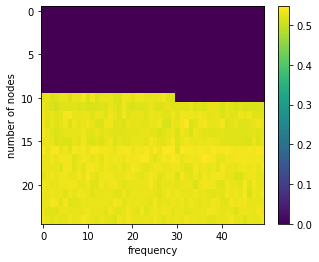

now = 2022-12-01 03:26:12.258055
731 0.5304545418782698


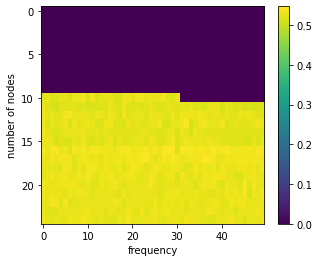

now = 2022-12-01 03:27:07.546999
732 0.5336019251502845


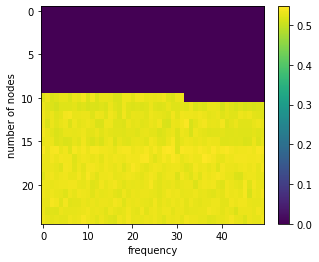

now = 2022-12-01 03:28:02.807948
733 0.5325512825901396


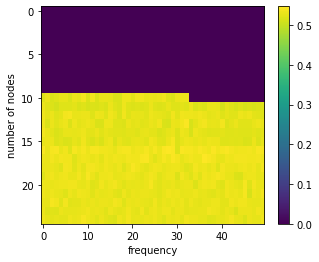

now = 2022-12-01 03:28:59.044528
734 0.5165187993269968


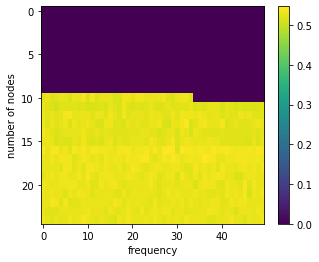

now = 2022-12-01 03:29:55.075253
735 0.5327604297344248


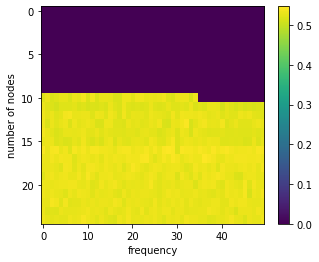

now = 2022-12-01 03:30:50.576892
736 0.5394374598715134


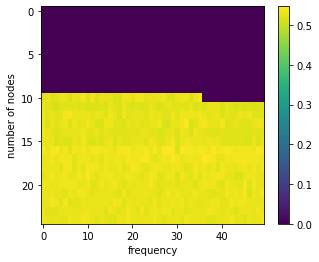

now = 2022-12-01 03:31:45.699005
737 0.5290795821428913


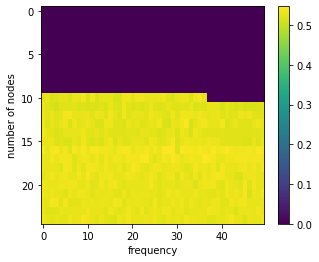

now = 2022-12-01 03:32:41.521900
738 0.5306741380500417


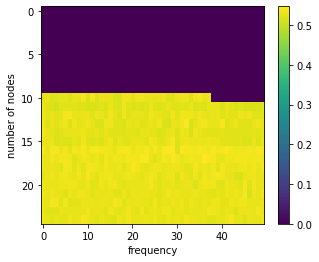

now = 2022-12-01 03:33:36.982622
739 0.5307041700922572


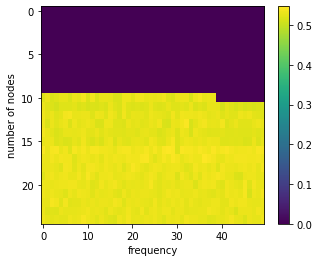

now = 2022-12-01 03:34:32.430143
740 0.5137673857578203


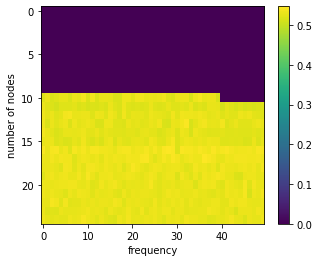

now = 2022-12-01 03:35:27.902723
741 0.5363858067261058


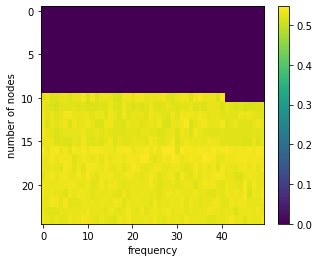

now = 2022-12-01 03:36:25.146082
742 0.5310327818619897


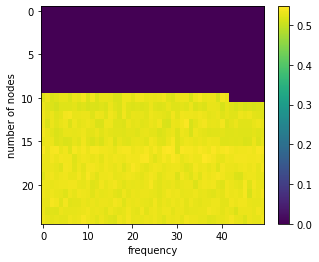

now = 2022-12-01 03:37:20.514170
743 0.5266621549040925


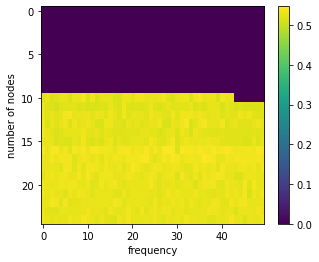

now = 2022-12-01 03:38:15.394750
744 0.5277536124712247


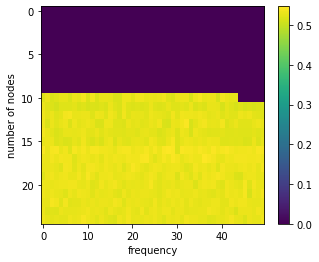

now = 2022-12-01 03:39:10.846133
745 0.523847150335551


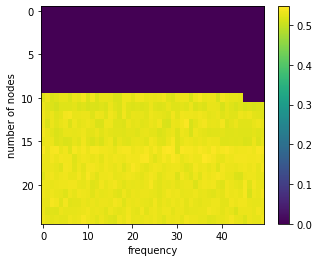

now = 2022-12-01 03:40:06.459221
746 0.5335679716922481


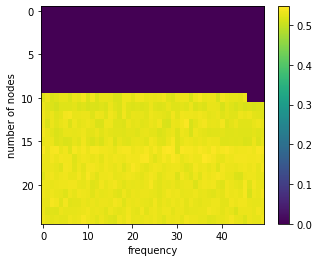

now = 2022-12-01 03:41:02.165593
747 0.5284304158909998


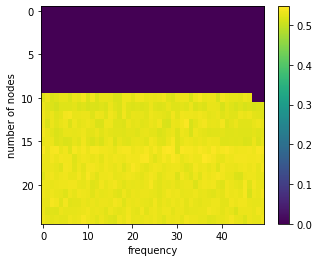

now = 2022-12-01 03:41:58.049647
748 0.5355232247501508


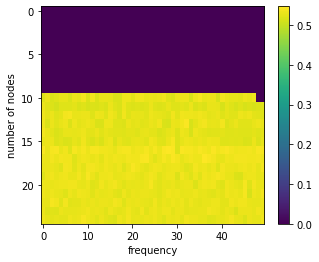

now = 2022-12-01 03:42:54.400040
749 0.5300366183419413


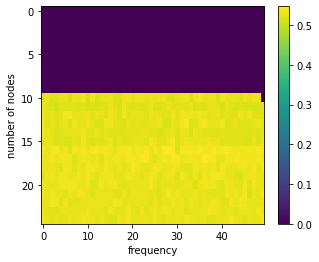

now = 2022-12-01 03:43:51.430590
750 0.5336848308975944


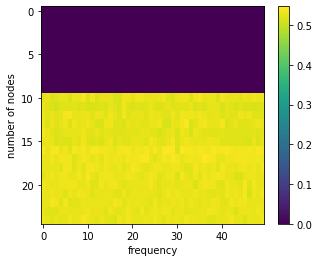

now = 2022-12-01 03:44:47.111136
751 0.531258442687722


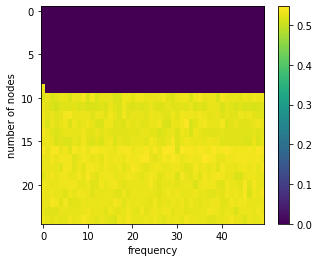

now = 2022-12-01 03:45:42.078715
752 0.5349441783513637


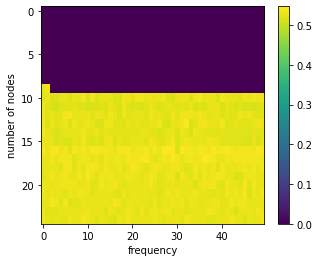

now = 2022-12-01 03:46:37.100016
753 0.539028376097301


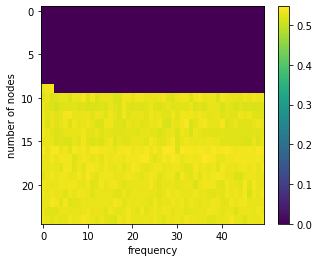

now = 2022-12-01 03:47:32.156405
754 0.5316646622681097


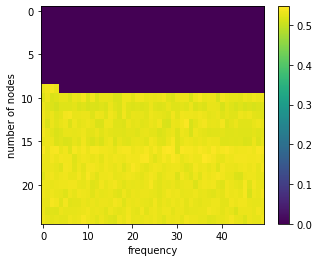

now = 2022-12-01 03:48:29.129253
755 0.5316879490060201


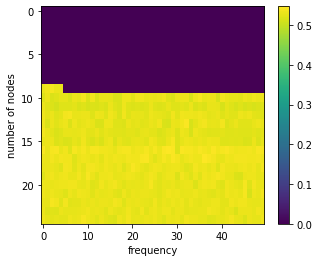

now = 2022-12-01 03:49:23.377640
756 0.5221005208240144


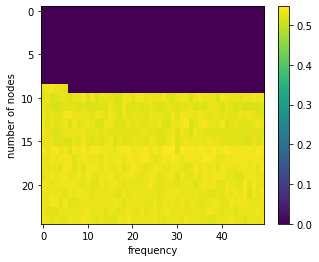

now = 2022-12-01 03:50:19.078910
757 0.5368429574187407


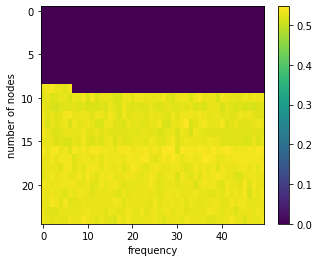

now = 2022-12-01 03:51:14.985952
758 0.5272612387401858


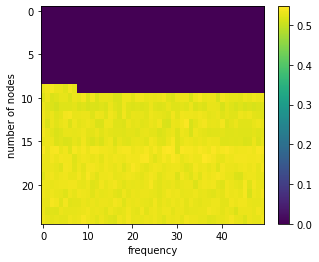

now = 2022-12-01 03:52:10.896691
759 0.5254544012913591


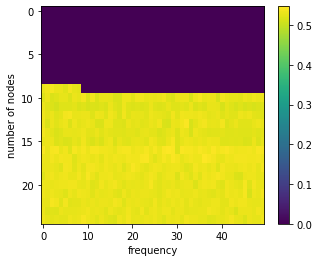

now = 2022-12-01 03:53:06.389243
760 0.531043592282262


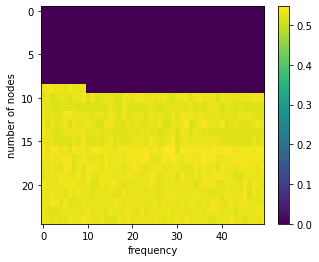

now = 2022-12-01 03:54:02.172732
761 0.538662921000117


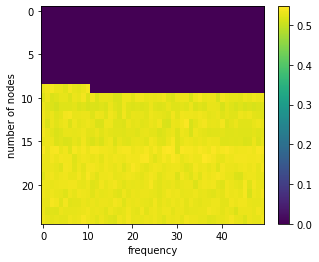

now = 2022-12-01 03:54:57.079823
762 0.5286978416236867


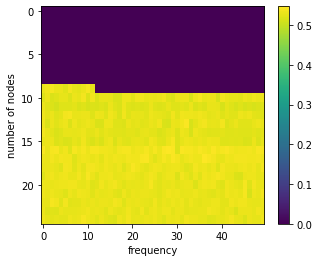

now = 2022-12-01 03:55:52.554743
763 0.5373032720694321


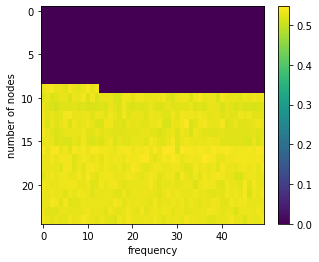

now = 2022-12-01 03:56:48.544894
764 0.5413985746062322


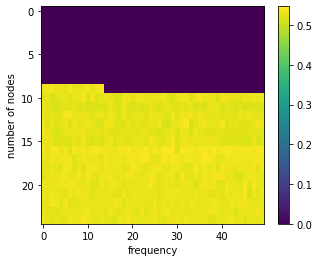

now = 2022-12-01 03:57:45.072290
765 0.5353167019424511


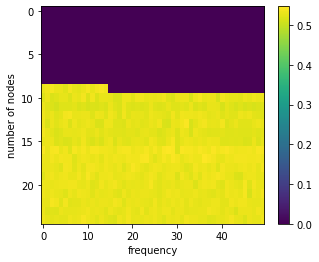

now = 2022-12-01 03:58:41.137333
766 0.5418982642765825


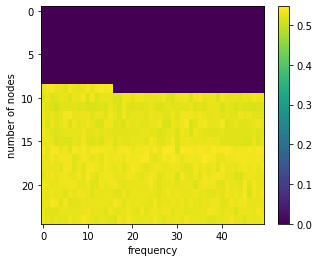

now = 2022-12-01 03:59:37.171950
767 0.54217713411137


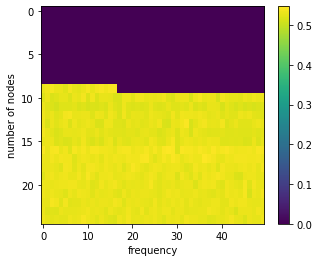

now = 2022-12-01 04:00:32.967559
768 0.5304530171060645


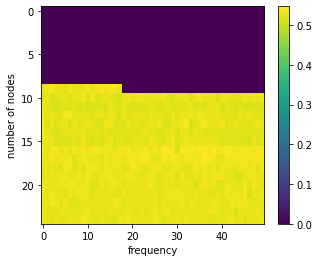

now = 2022-12-01 04:01:29.775537
769 0.5426697248854566


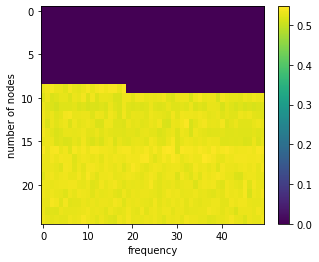

now = 2022-12-01 04:02:26.497602
770 0.5426901771314495


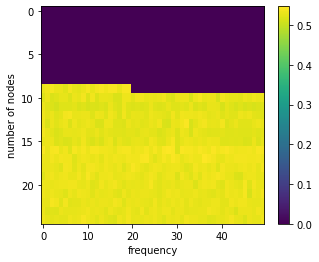

now = 2022-12-01 04:03:23.595997
771 0.5492410834469974


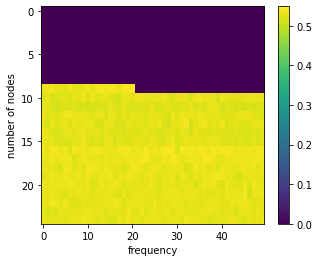

now = 2022-12-01 04:04:19.346065
772 0.5418945666440833


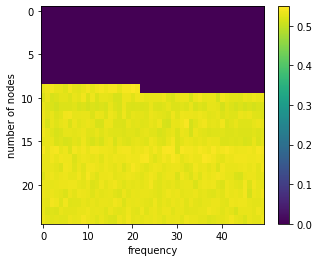

now = 2022-12-01 04:05:15.992207
773 0.5512839646780231


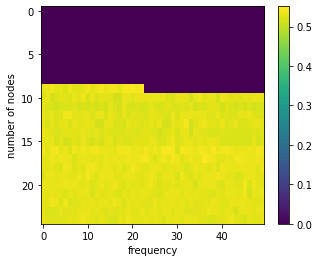

now = 2022-12-01 04:06:12.033817
774 0.5375463374213882


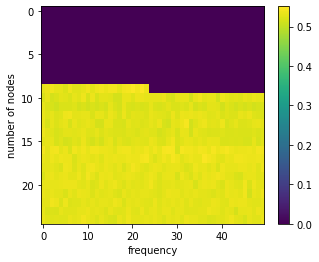

now = 2022-12-01 04:07:08.252287
775 0.5311032837829286


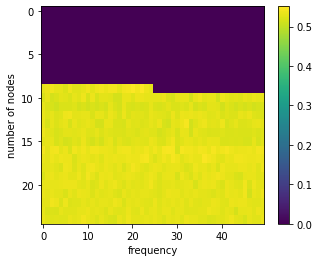

now = 2022-12-01 04:08:03.747302
776 0.5290370380323218


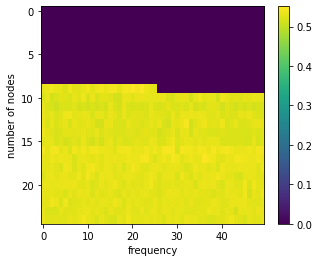

now = 2022-12-01 04:09:00.112719
777 0.5395207183114866


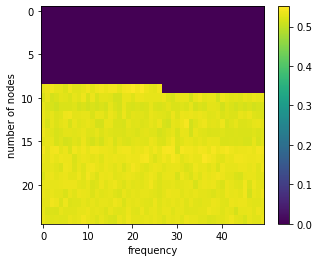

now = 2022-12-01 04:09:56.521763
778 0.5455000122537497


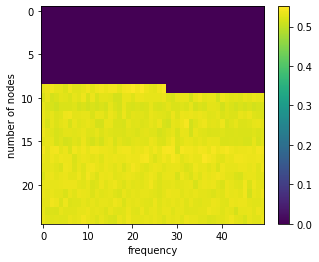

now = 2022-12-01 04:10:51.228013
779 0.5334861946870695


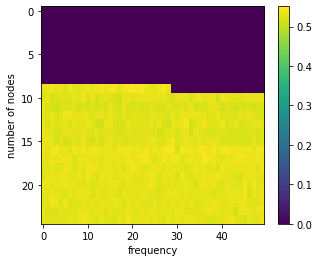

now = 2022-12-01 04:11:45.343665
780 0.5444045372001692


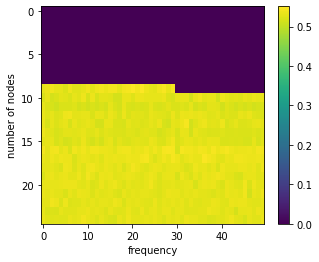

now = 2022-12-01 04:12:40.205620
781 0.5362150496951834


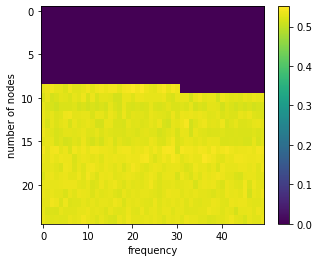

now = 2022-12-01 04:13:35.342582
782 0.5319822374461194


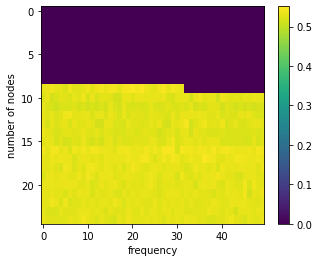

now = 2022-12-01 04:14:30.791969
783 0.5361258729775055


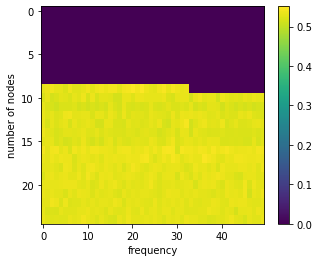

now = 2022-12-01 04:15:25.625725
784 0.5298388020972058


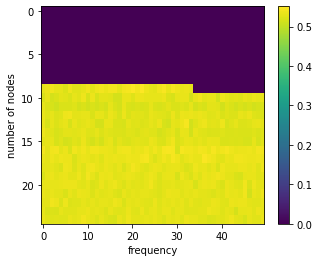

now = 2022-12-01 04:16:20.768186
785 0.539327494188757


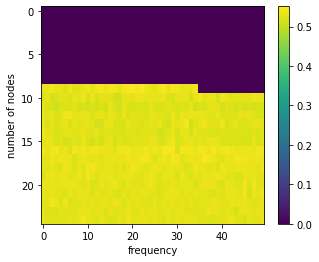

now = 2022-12-01 04:17:16.586889
786 0.5363887308187343


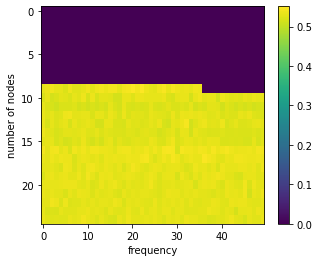

now = 2022-12-01 04:18:12.351359
787 0.5361510671884517


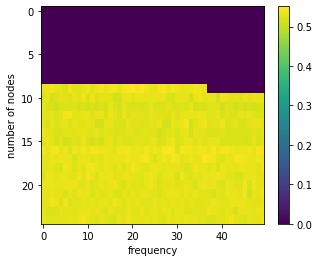

now = 2022-12-01 04:19:09.391080
788 0.5450689151607673


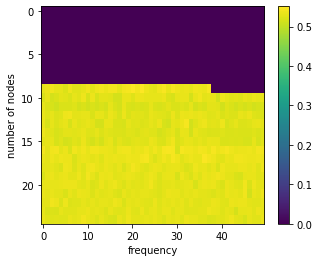

now = 2022-12-01 04:20:05.498844
789 0.5258315832788852


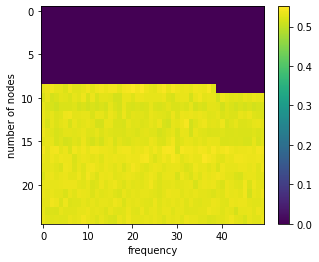

now = 2022-12-01 04:21:00.086863
790 0.5320152313311574


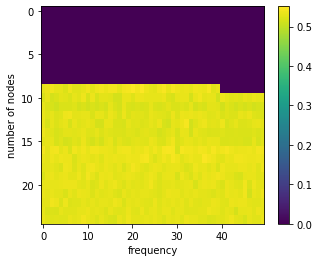

now = 2022-12-01 04:21:55.716299
791 0.5407725475762755


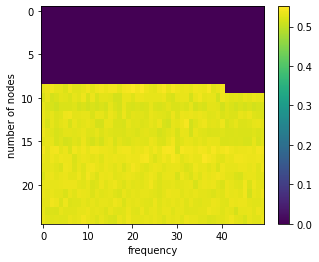

now = 2022-12-01 04:22:50.463299
792 0.5398686877000366


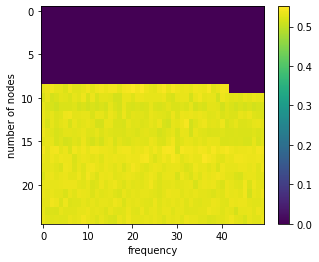

now = 2022-12-01 04:23:47.033879
793 0.5393663924268948


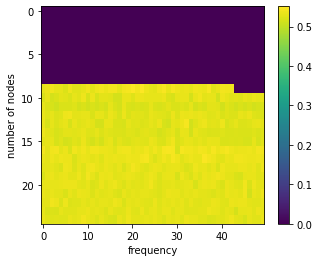

now = 2022-12-01 04:24:42.343933
794 0.5408050666382895


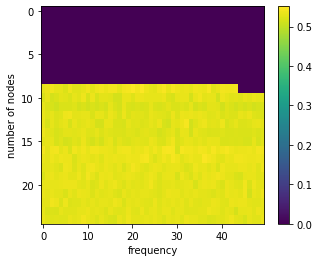

now = 2022-12-01 04:25:37.756778
795 0.535478447188325


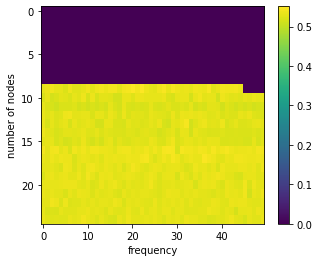

now = 2022-12-01 04:26:34.003069
796 0.5349352469591793


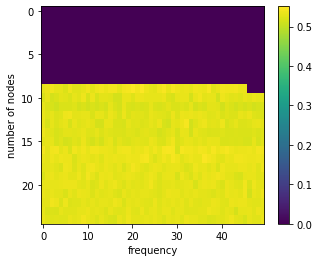

now = 2022-12-01 04:27:28.635804
797 0.538074175126155


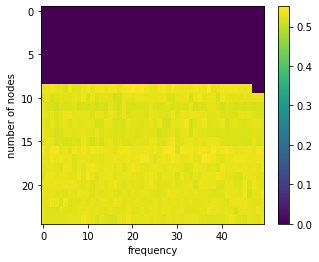

now = 2022-12-01 04:28:24.506581
798 0.5324107752272418


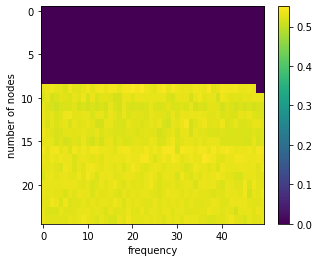

now = 2022-12-01 04:29:20.617044
799 0.5419262788658342


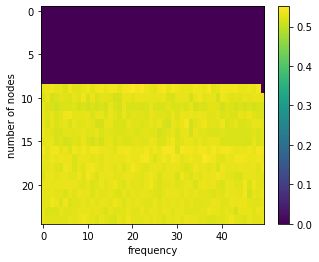

now = 2022-12-01 04:30:15.424378
800 0.5271340351782944


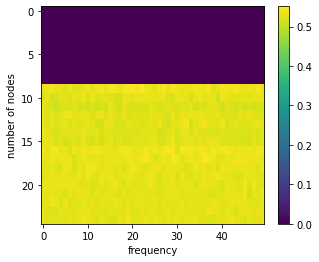

now = 2022-12-01 04:31:11.449857
801 0.5253140188226408


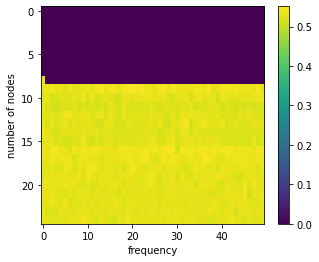

now = 2022-12-01 04:32:07.009070
802 0.5150336115714712


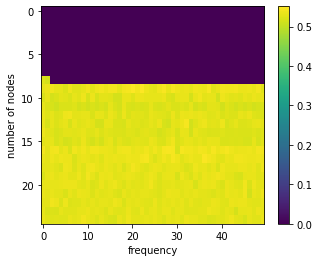

now = 2022-12-01 04:33:01.566605
803 0.5148743062375614


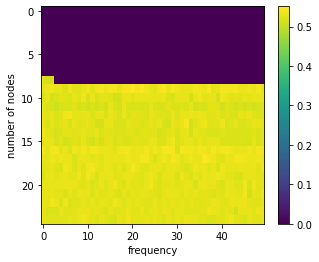

now = 2022-12-01 04:33:57.139334
804 0.5204570828049798


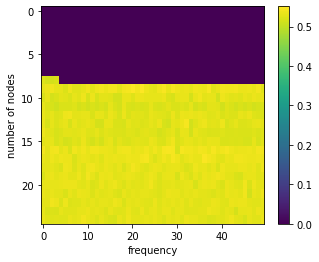

now = 2022-12-01 04:34:51.627237
805 0.516919312866912


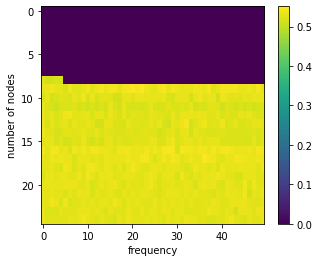

now = 2022-12-01 04:35:47.117250
806 0.5189588588669718


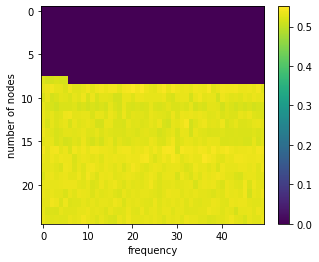

now = 2022-12-01 04:36:42.773972
807 0.5183198476245945


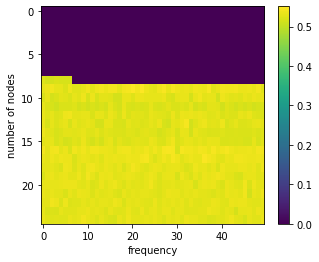

now = 2022-12-01 04:37:39.550692
808 0.515730673688847


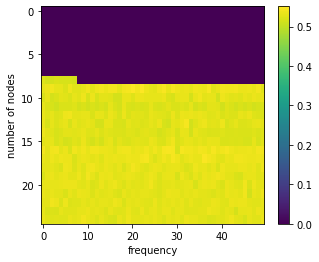

now = 2022-12-01 04:38:35.195727
809 0.5175450963017862


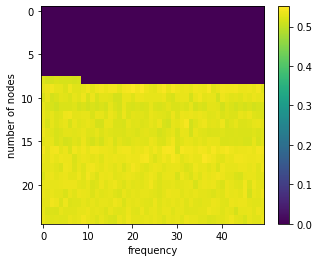

now = 2022-12-01 04:39:30.266339
810 0.5183655392208412


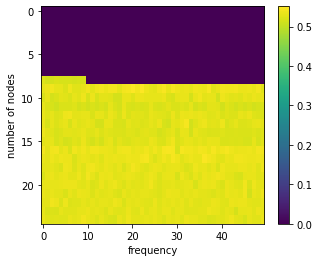

now = 2022-12-01 04:40:26.669868
811 0.5154661071280195


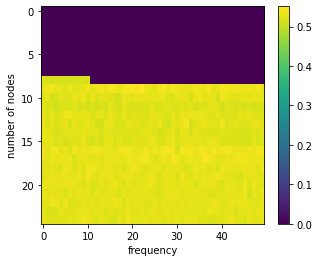

now = 2022-12-01 04:41:23.337777
812 0.5113793199106599


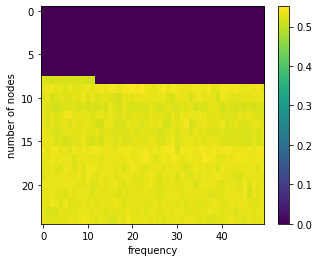

now = 2022-12-01 04:42:19.816727
813 0.520128069938429


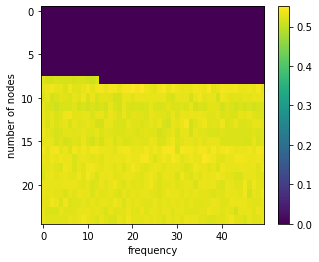

now = 2022-12-01 04:43:15.302798
814 0.5207410426135582


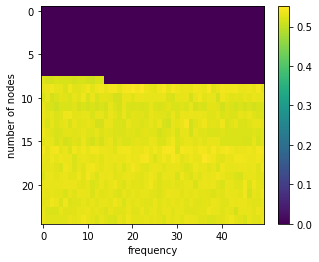

now = 2022-12-01 04:44:11.537701
815 0.5148400998918307


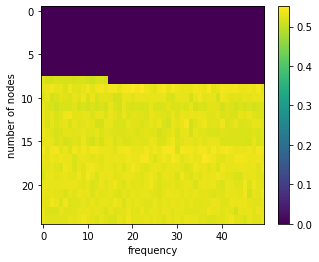

now = 2022-12-01 04:45:07.833217
816 0.5178268669729603


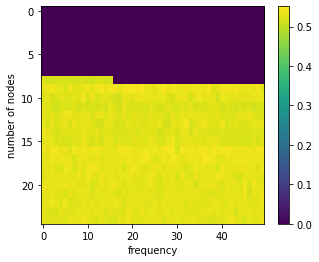

now = 2022-12-01 04:46:03.352001
817 0.5168162455644781


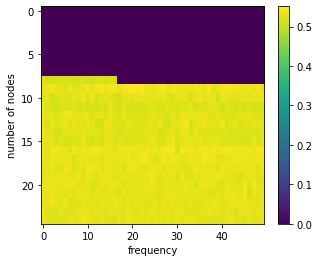

now = 2022-12-01 04:46:57.743906
818 0.5143483424482055


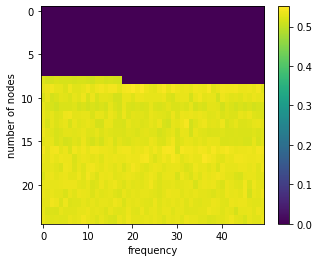

now = 2022-12-01 04:47:53.540388
819 0.5181313414880928


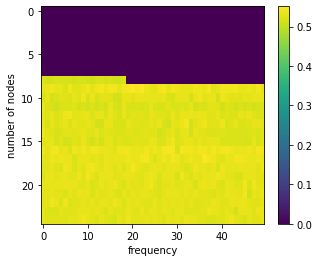

now = 2022-12-01 04:48:48.647347
820 0.518886854934984


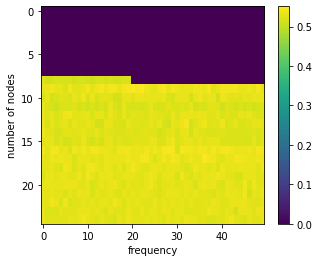

now = 2022-12-01 04:49:44.174242
821 0.5148111962300954


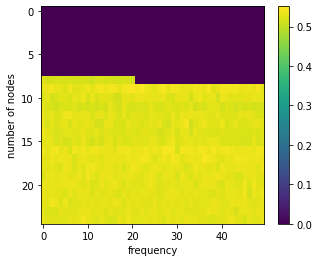

now = 2022-12-01 04:50:40.280277
822 0.5149652476961436


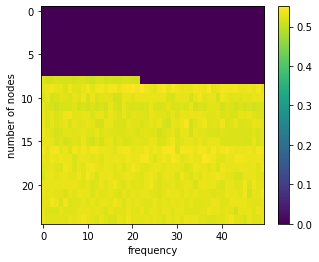

now = 2022-12-01 04:51:35.282699
823 0.5158827335081534


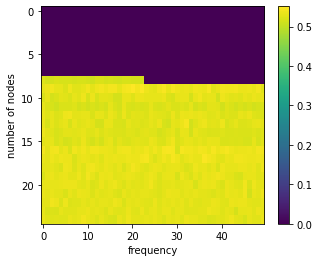

now = 2022-12-01 04:52:31.936540
824 0.5166775804187949


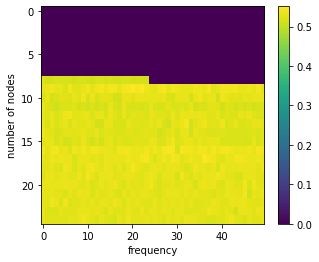

now = 2022-12-01 04:53:28.258890
825 0.5191326261352246


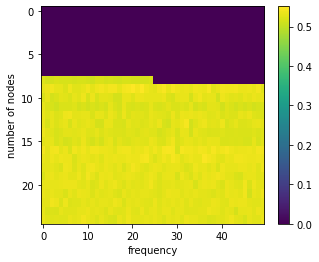

now = 2022-12-01 04:54:23.844736
826 0.5171989830425626


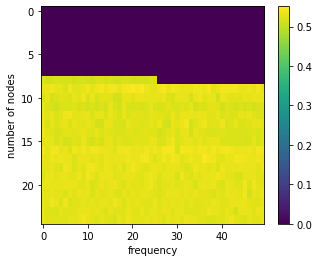

now = 2022-12-01 04:55:20.664025
827 0.5192867119454581


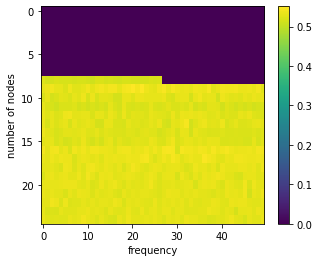

now = 2022-12-01 04:56:16.505040
828 0.5174657228355894


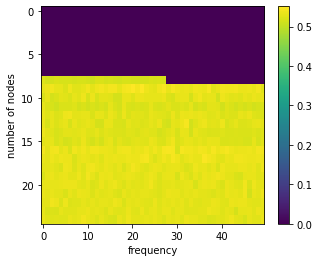

now = 2022-12-01 04:57:11.721450
829 0.5139589073457562


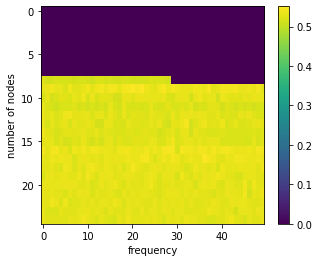

now = 2022-12-01 04:58:08.774975
830 0.5149149653527981


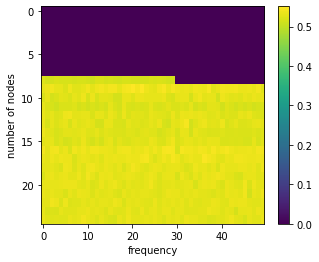

now = 2022-12-01 04:59:05.598855
831 0.5198469687205844


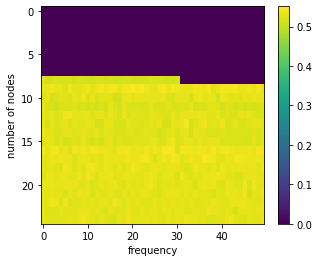

now = 2022-12-01 05:00:01.280528
832 0.5164359414622276


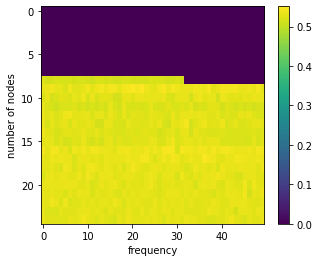

now = 2022-12-01 05:00:58.009865
833 0.5212929746981745


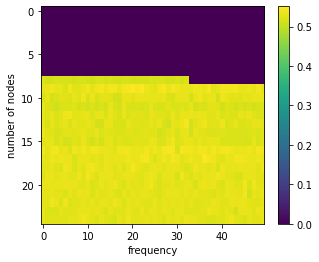

now = 2022-12-01 05:01:54.664415
834 0.5137795874634619


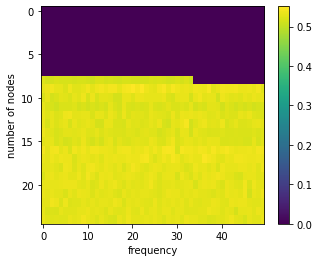

now = 2022-12-01 05:02:50.905549
835 0.5195155606324063


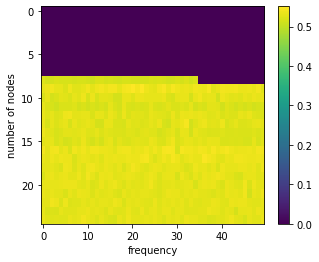

now = 2022-12-01 05:03:45.684154
836 0.5187776492441307


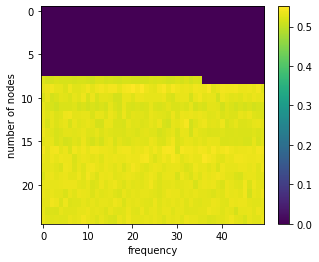

now = 2022-12-01 05:04:40.495495
837 0.5136767926323514


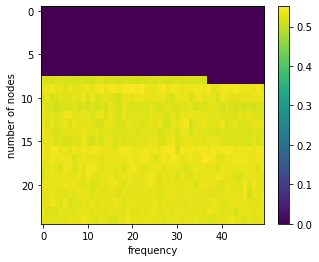

now = 2022-12-01 05:05:37.094912
838 0.5187265390849886


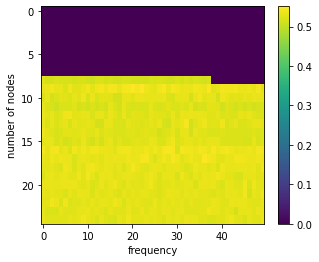

now = 2022-12-01 05:06:32.181634
839 0.5139910875090264


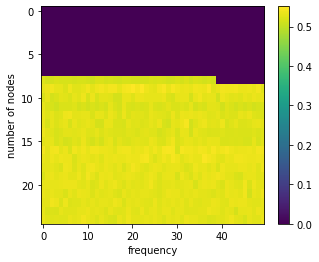

now = 2022-12-01 05:07:28.360526
840 0.5180715239759525


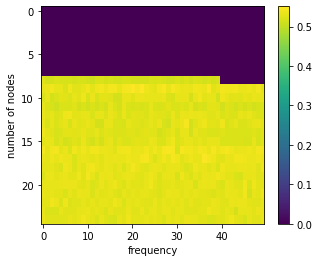

now = 2022-12-01 05:08:23.847799
841 0.5141224052932278


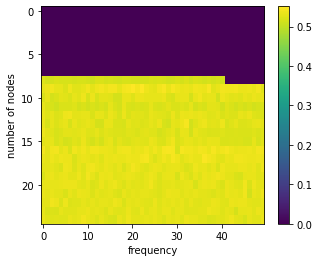

now = 2022-12-01 05:09:18.958667
842 0.5225727094193274


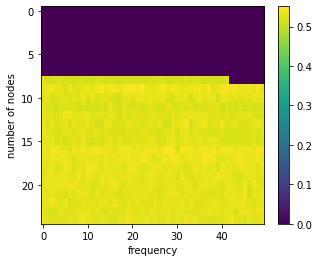

now = 2022-12-01 05:10:13.399878
843 0.5179714499885743


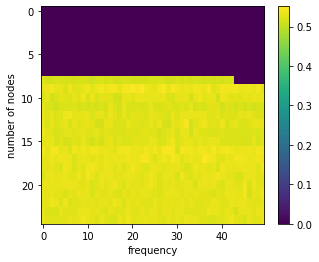

now = 2022-12-01 05:11:10.097845
844 0.5194853692468796


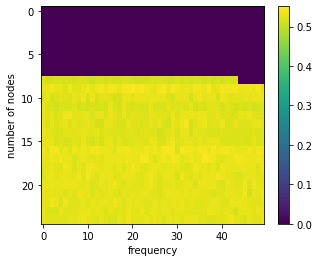

now = 2022-12-01 05:12:05.500516
845 0.5158033814844114


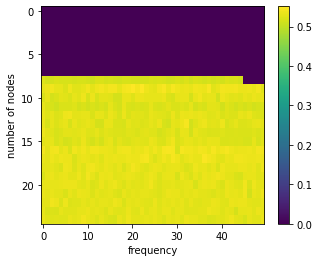

now = 2022-12-01 05:13:00.984396
846 0.5184260534913472


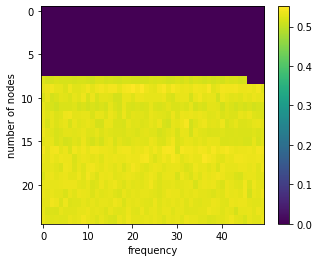

now = 2022-12-01 05:13:57.029162
847 0.5178625849234265


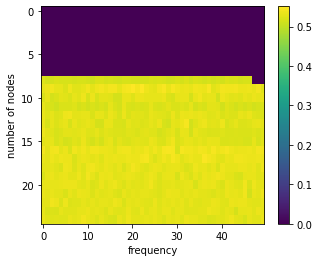

now = 2022-12-01 05:14:53.223531
848 0.5282419840840754


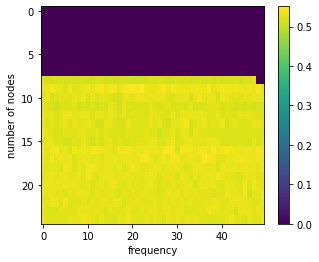

now = 2022-12-01 05:15:48.404206
849 0.5178227775699794


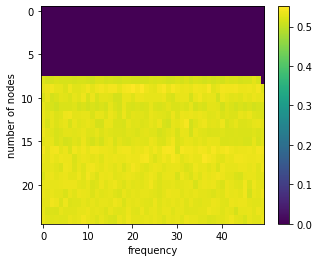

now = 2022-12-01 05:16:44.727670
850 0.5174796604693851


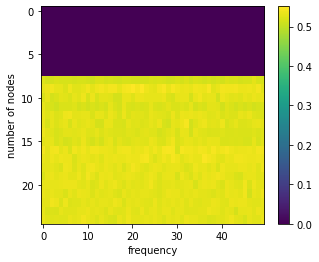

now = 2022-12-01 05:17:39.890951
851 0.5165313215064343


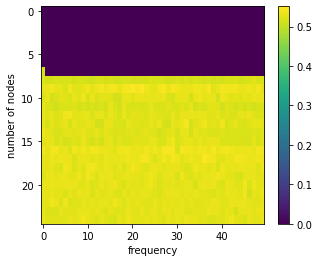

now = 2022-12-01 05:18:35.317015
852 0.5135017830899234


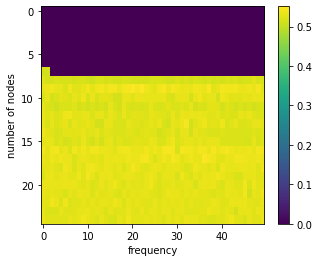

now = 2022-12-01 05:19:32.629085
853 0.5117579823372344


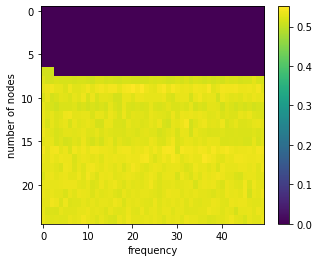

now = 2022-12-01 05:20:29.731092
854 0.5168088957965696


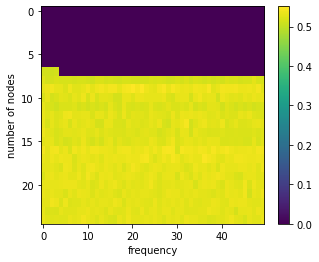

now = 2022-12-01 05:21:24.863706
855 0.5119532954933956


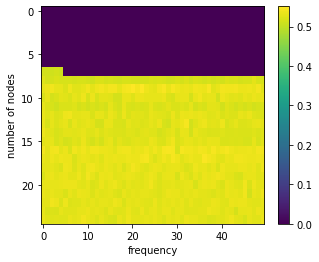

now = 2022-12-01 05:22:20.602415
856 0.5134009127108918


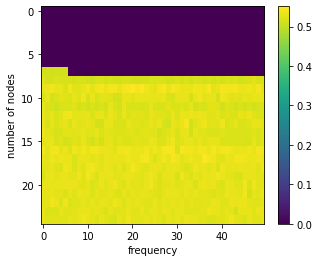

now = 2022-12-01 05:23:17.640227
857 0.5166257193850714


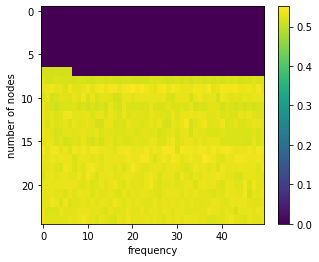

now = 2022-12-01 05:24:13.841651
858 0.5122309025992461


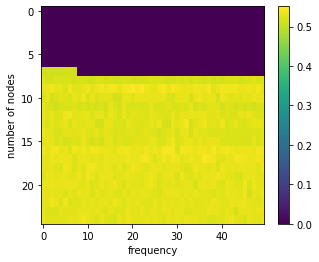

now = 2022-12-01 05:25:10.045508
859 0.5150531278195065


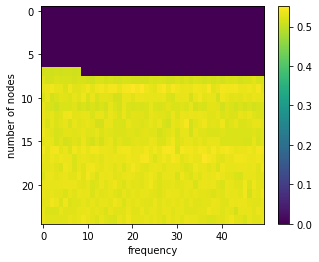

now = 2022-12-01 05:26:04.539294
860 0.5115900321534523


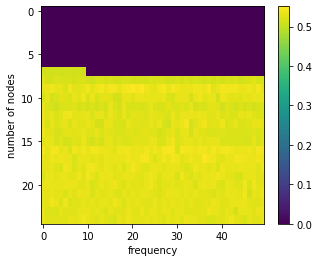

now = 2022-12-01 05:27:01.540948
861 0.5219591579406707


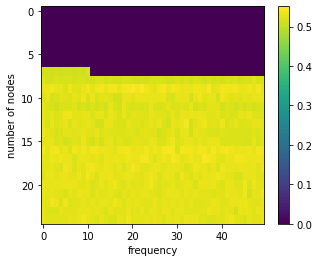

now = 2022-12-01 05:27:57.457760
862 0.5127110073172134


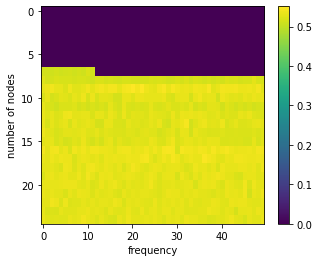

now = 2022-12-01 05:28:54.075073
863 0.5194365743877092


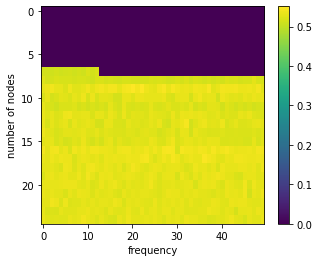

now = 2022-12-01 05:29:49.410465
864 0.5153887346844926


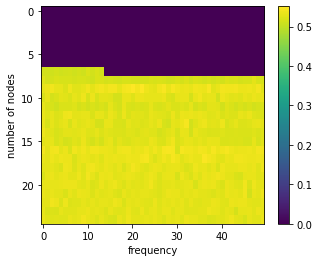

now = 2022-12-01 05:30:45.273476
865 0.5151942113373651


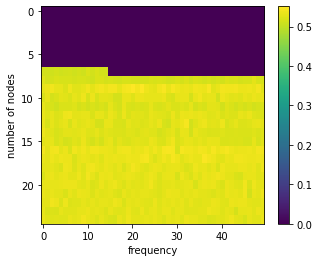

now = 2022-12-01 05:31:40.792899
866 0.512739925552377


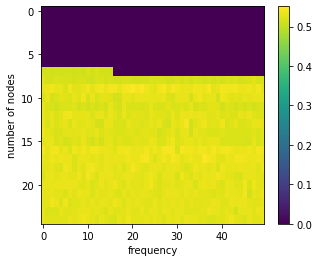

now = 2022-12-01 05:32:37.401564
867 0.5138744276290467


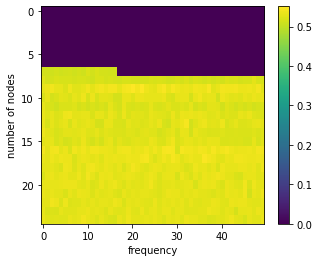

now = 2022-12-01 05:33:33.886586
868 0.5170773634439706


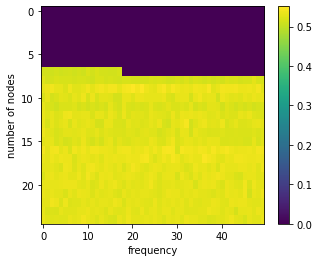

now = 2022-12-01 05:34:29.872215
869 0.5182271339862788


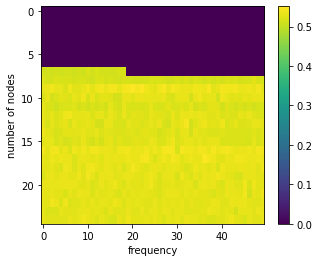

now = 2022-12-01 05:35:26.199205
870 0.5132345562609855


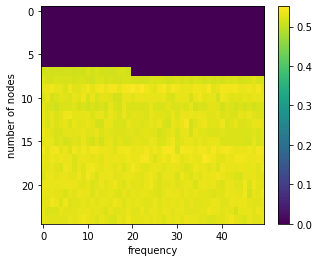

now = 2022-12-01 05:36:22.407649
871 0.5186934657263238


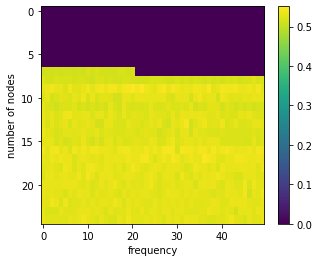

now = 2022-12-01 05:37:18.346216
872 0.5203203304010775


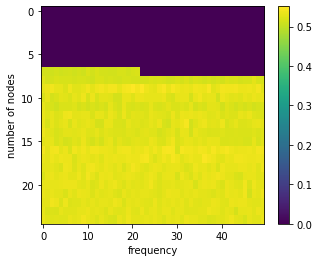

now = 2022-12-01 05:38:15.269258
873 0.5154837221150531


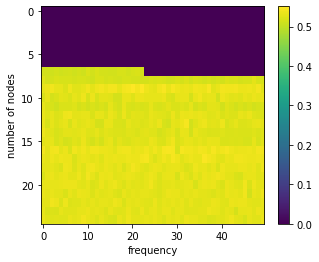

now = 2022-12-01 05:39:11.256570
874 0.5150603354651914


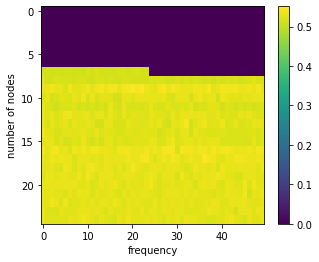

now = 2022-12-01 05:40:06.259184
875 0.5168881640179037


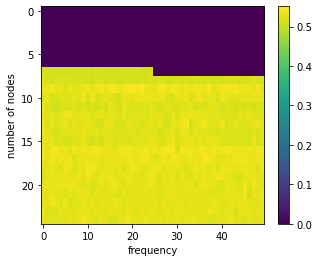

now = 2022-12-01 05:41:03.107622
876 0.5128947808578009


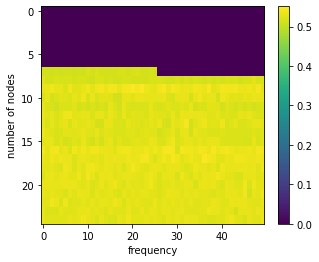

now = 2022-12-01 05:41:58.929557
877 0.5142271947520016


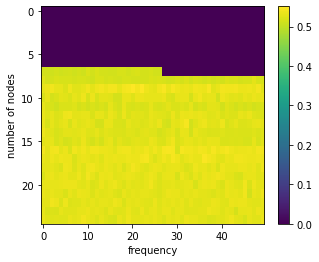

now = 2022-12-01 05:42:53.977430
878 0.5186143394602771


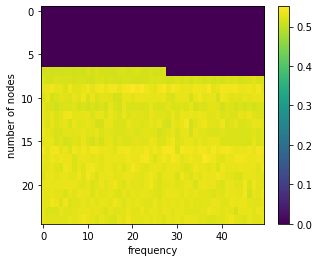

now = 2022-12-01 05:43:50.331074
879 0.5192575548041997


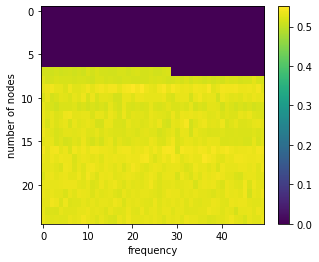

now = 2022-12-01 05:44:46.645622
880 0.5183407066370562


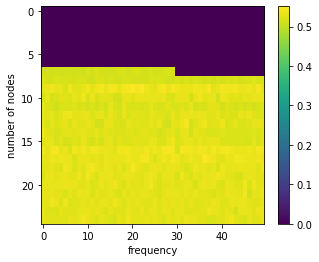

now = 2022-12-01 05:45:41.620977
881 0.5148869350946247


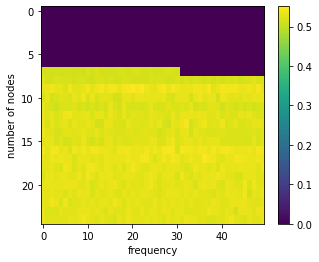

now = 2022-12-01 05:46:38.366535
882 0.5150813906472889


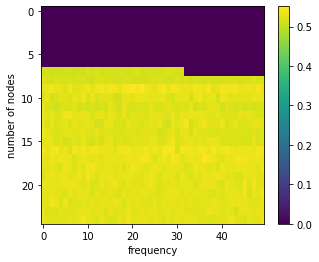

now = 2022-12-01 05:47:33.898822
883 0.5167562613830792


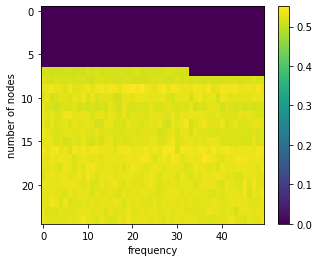

now = 2022-12-01 05:48:29.449677
884 0.516108010990398


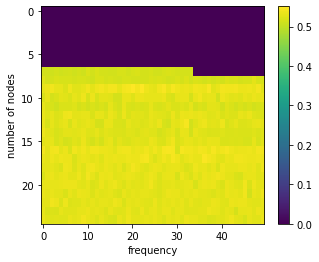

now = 2022-12-01 05:49:26.858453
885 0.5191421156895504


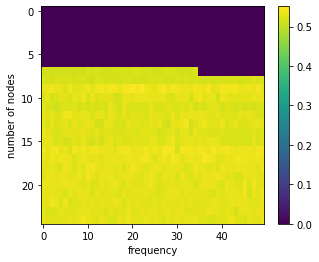

now = 2022-12-01 05:50:22.051750
886 0.5135722131074947


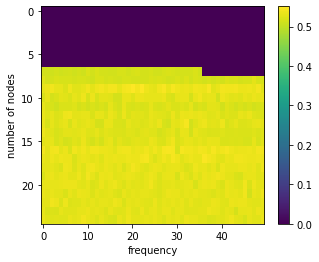

now = 2022-12-01 05:51:18.302947
887 0.5186236054769182


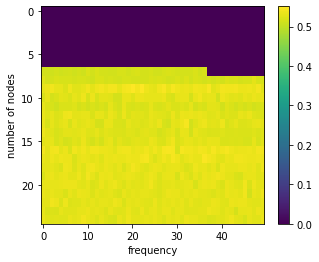

now = 2022-12-01 05:52:14.497183
888 0.5119162466648324


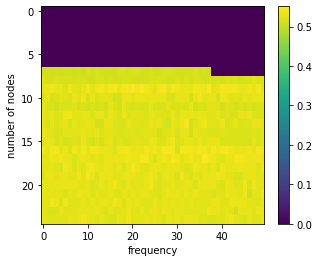

now = 2022-12-01 05:53:10.482123
889 0.5120427810040915


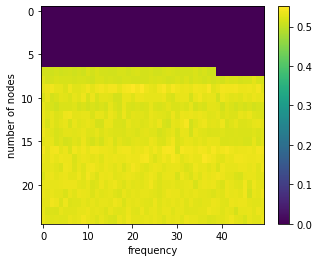

now = 2022-12-01 05:54:07.033074
890 0.5138641030576809


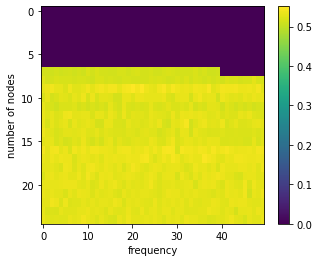

now = 2022-12-01 05:55:04.174894
891 0.5155503324577576


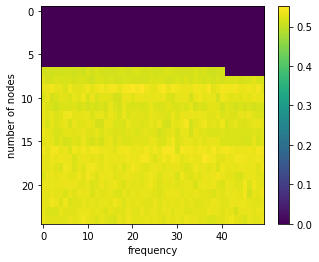

now = 2022-12-01 05:56:00.398576
892 0.5214060643129255


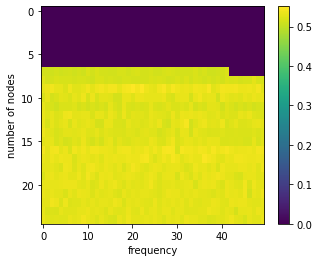

now = 2022-12-01 05:56:57.159945
893 0.5117843325377361


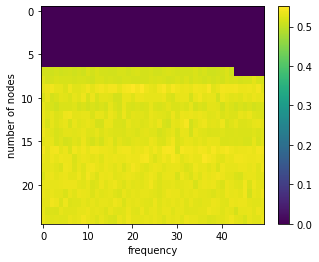

now = 2022-12-01 05:57:52.297895
894 0.5207780028828634


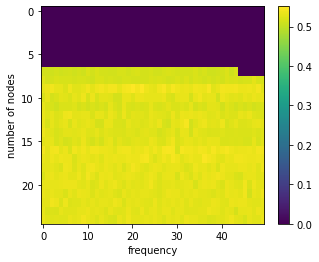

now = 2022-12-01 05:58:47.872395
895 0.5145396781121243


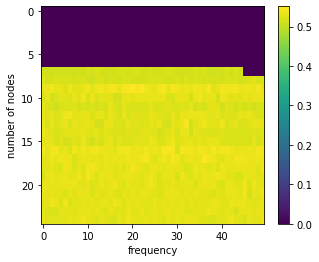

now = 2022-12-01 05:59:43.313124
896 0.5130946325409408


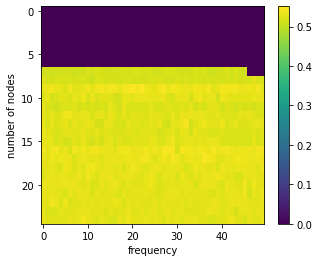

now = 2022-12-01 06:00:38.286934
897 0.5146696705086434


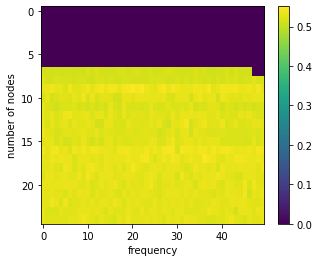

now = 2022-12-01 06:01:33.363179
898 0.5163631317028227


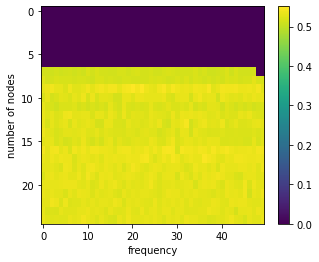

now = 2022-12-01 06:02:29.579238
899 0.5123115356970362


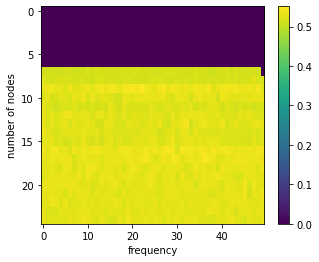

now = 2022-12-01 06:03:25.932984
900 0.519049187692932


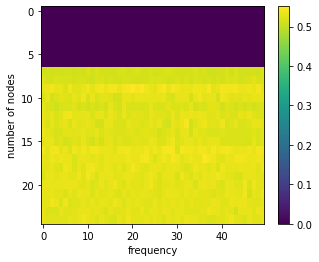

now = 2022-12-01 06:04:21.438309
901 0.5159880247837978


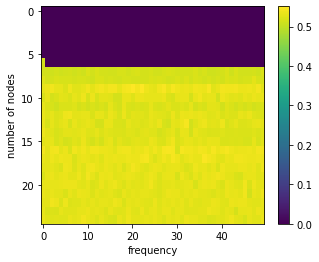

now = 2022-12-01 06:05:17.450159
902 0.5127453542910565


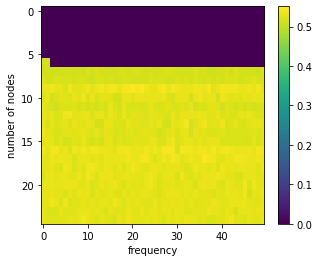

now = 2022-12-01 06:06:14.323433
903 0.5268276880791969


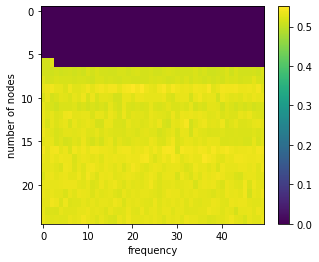

now = 2022-12-01 06:07:11.174369
904 0.5153161715843518


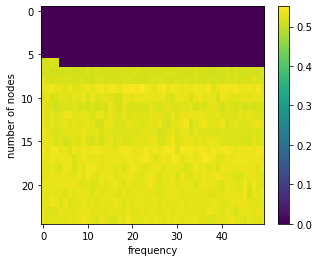

now = 2022-12-01 06:08:07.737555
905 0.5121287848079453


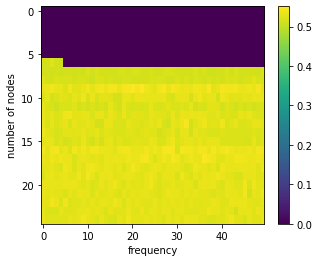

now = 2022-12-01 06:09:02.933874
906 0.5148861252797906


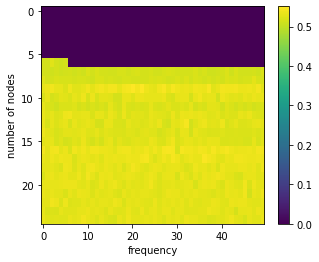

now = 2022-12-01 06:09:59.073748
907 0.5147384725848937


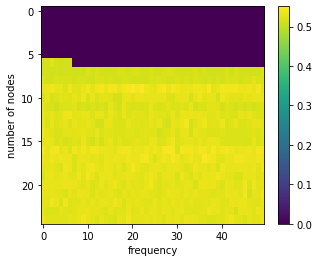

now = 2022-12-01 06:10:56.174304
908 0.5176413945307605


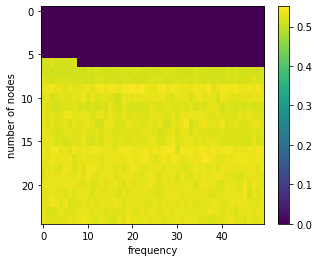

now = 2022-12-01 06:11:52.526132
909 0.513985141139267


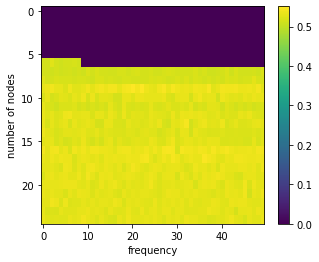

now = 2022-12-01 06:12:48.959396
910 0.5198225568319604


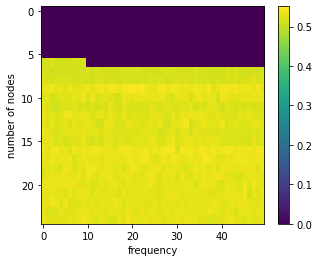

now = 2022-12-01 06:13:44.808960
911 0.5131116928129752


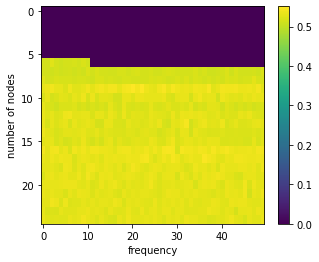

now = 2022-12-01 06:14:39.758343
912 0.515538704726116


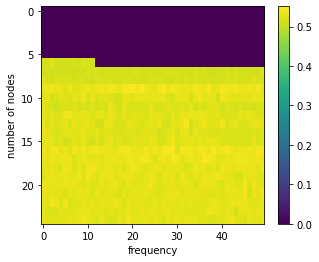

now = 2022-12-01 06:15:34.988980
913 0.5288420633900316


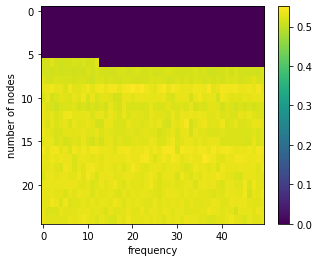

now = 2022-12-01 06:16:31.735370
914 0.5121451787598217


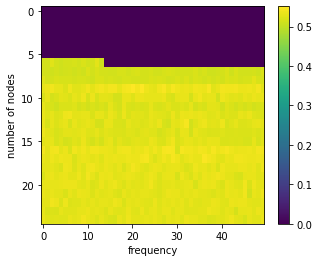

now = 2022-12-01 06:17:27.817219
915 0.5167000875760235


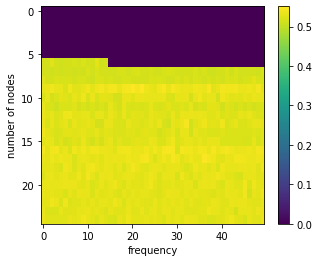

now = 2022-12-01 06:18:24.189791
916 0.5179151518894534


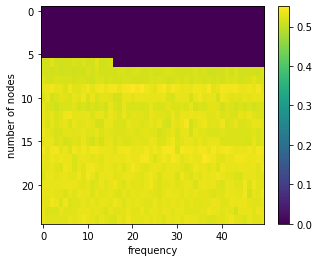

now = 2022-12-01 06:19:18.280160
917 0.5164407570586318


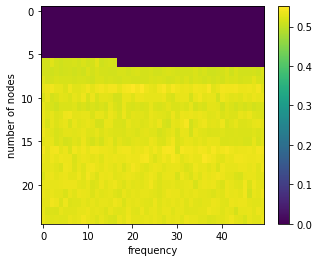

now = 2022-12-01 06:20:13.824897
918 0.513156976571986


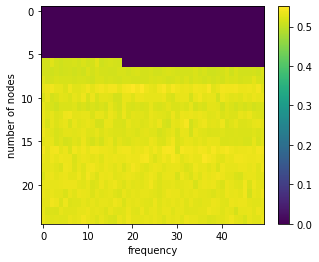

now = 2022-12-01 06:21:10.262737
919 0.5122613847488073


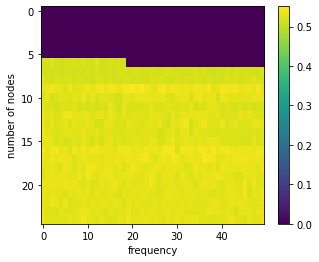

now = 2022-12-01 06:22:05.733084
920 0.5119277380615862


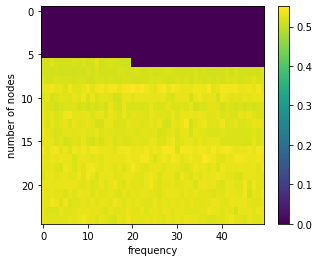

now = 2022-12-01 06:23:01.755980
921 0.5129015261683518


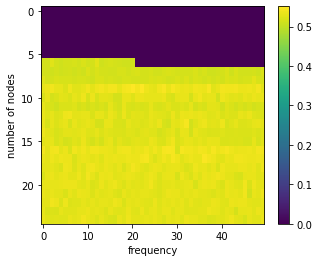

now = 2022-12-01 06:23:58.617212
922 0.5174078550945574


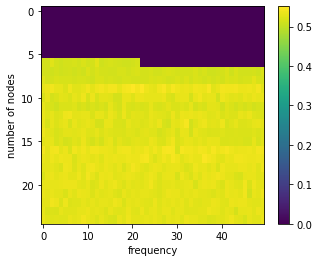

now = 2022-12-01 06:24:55.065098
923 0.5140891398160051


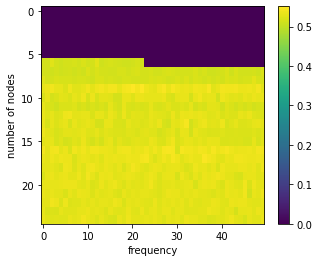

now = 2022-12-01 06:25:50.594741
924 0.5142373511433862


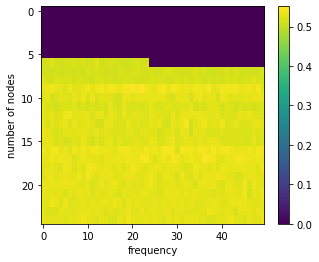

now = 2022-12-01 06:26:47.131049
925 0.5128605878871285


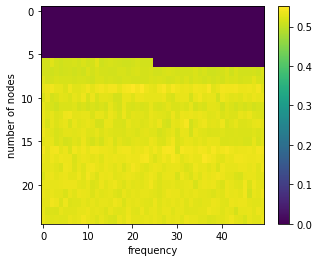

now = 2022-12-01 06:27:43.995120
926 0.5183419216613631


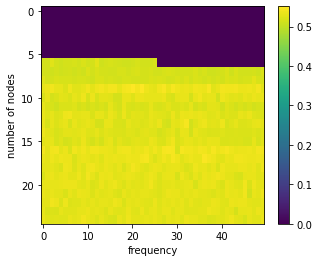

now = 2022-12-01 06:28:40.567022
927 0.5284516339121806


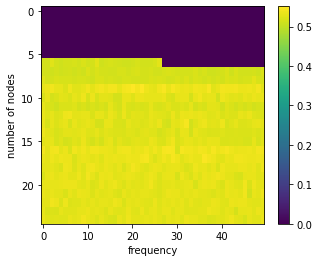

now = 2022-12-01 06:29:35.901741
928 0.517942555173036


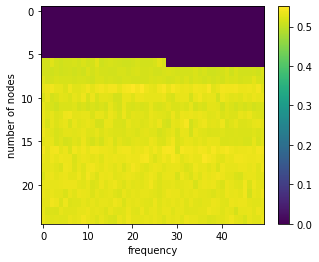

now = 2022-12-01 06:30:31.355801
929 0.5163926653435563


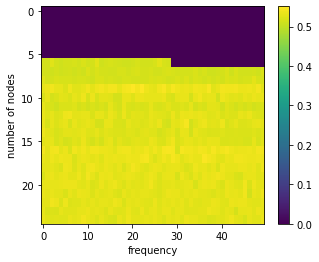

now = 2022-12-01 06:31:27.209450
930 0.517220421276977


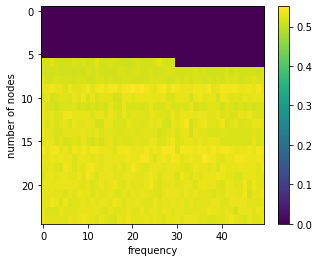

now = 2022-12-01 06:32:22.959289
931 0.5155792335776346


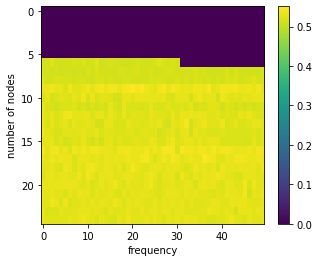

now = 2022-12-01 06:33:19.914100
932 0.5165058734269238


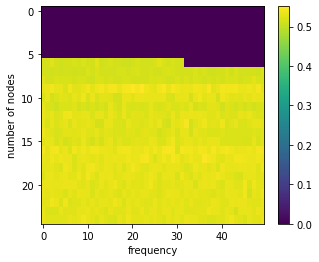

now = 2022-12-01 06:34:15.542243
933 0.5149492237512285


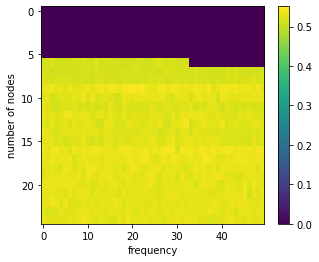

now = 2022-12-01 06:35:11.424571
934 0.5131427714340263


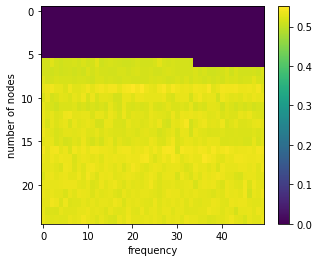

now = 2022-12-01 06:36:07.195699
935 0.5229830417279401


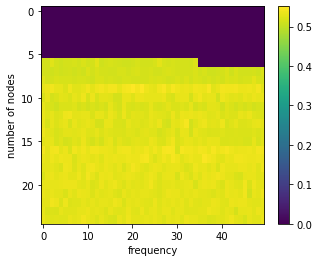

now = 2022-12-01 06:37:02.974484
936 0.5175976393663876


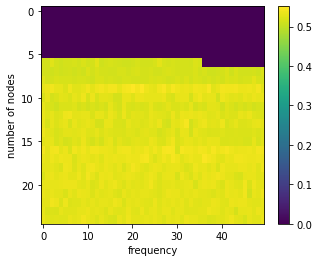

now = 2022-12-01 06:37:59.029944
937 0.515437639189911


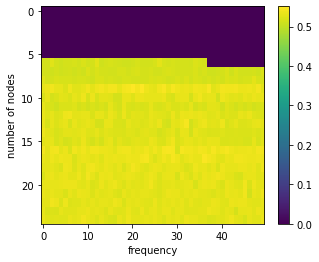

now = 2022-12-01 06:38:54.397528
938 0.5130953299621295


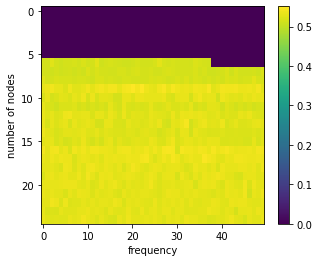

now = 2022-12-01 06:39:50.528933
939 0.5168981553071564


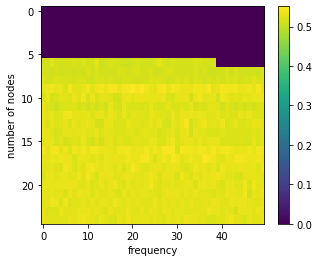

now = 2022-12-01 06:40:45.947426
940 0.5115485256925879


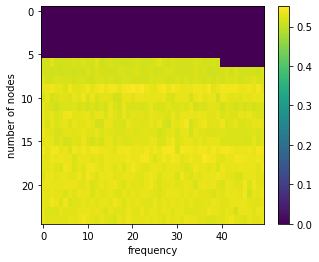

now = 2022-12-01 06:41:43.415990
941 0.5164324833840586


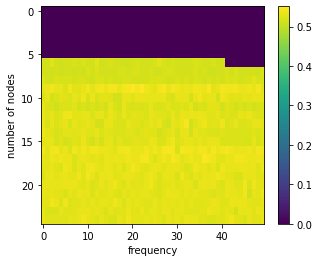

now = 2022-12-01 06:42:39.704505
942 0.5144112816832745


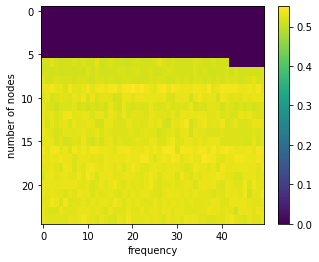

now = 2022-12-01 06:43:34.806429
943 0.5192082798597007


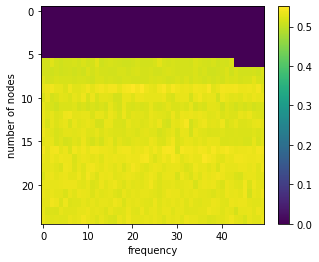

now = 2022-12-01 06:44:31.007840
944 0.5144740988999312


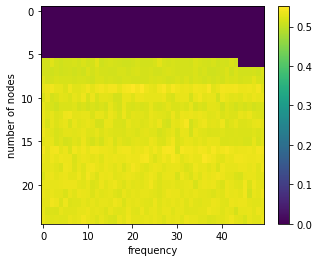

now = 2022-12-01 06:45:28.483059
945 0.5148281990182376


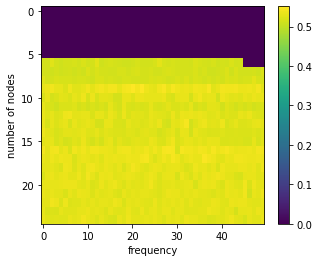

now = 2022-12-01 06:46:23.673874
946 0.5153765908465381


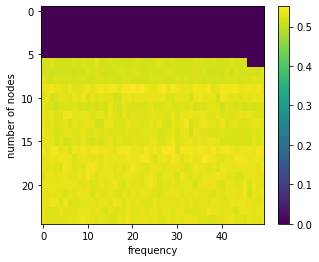

now = 2022-12-01 06:47:19.687145
947 0.5155066903703207


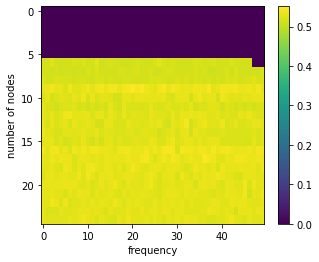

now = 2022-12-01 06:48:16.226329
948 0.517341865666284


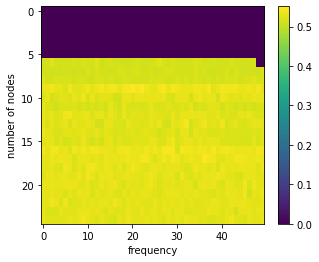

now = 2022-12-01 06:49:12.665422
949 0.5222678450315581


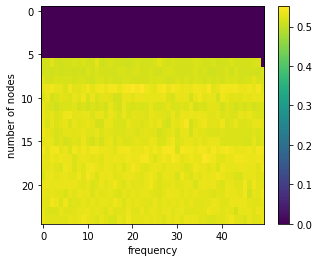

now = 2022-12-01 06:50:09.624981
950 0.5129552823909339


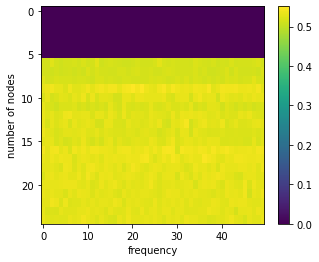

now = 2022-12-01 06:51:05.499695
951 0.5445721510209766


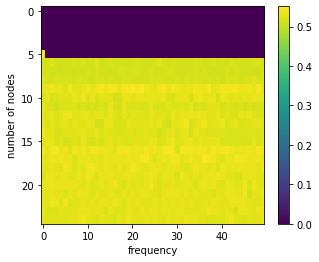

now = 2022-12-01 06:52:00.111192
952 0.5422883846132728


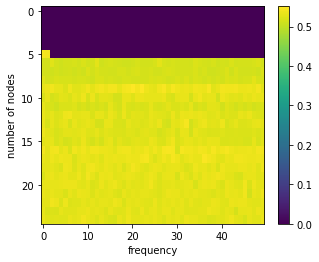

now = 2022-12-01 06:52:55.656442
953 0.5381583995935909


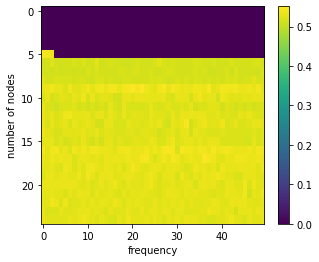

now = 2022-12-01 06:53:52.873177
954 0.5215534628589987


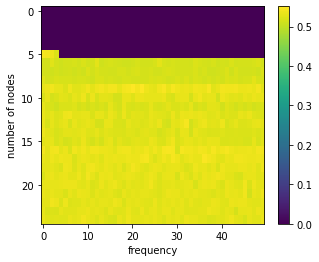

now = 2022-12-01 06:54:49.312092
955 0.5364832829979673


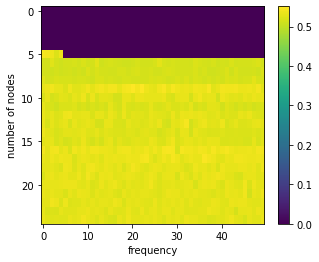

now = 2022-12-01 06:55:45.102215
956 0.5171168822600788


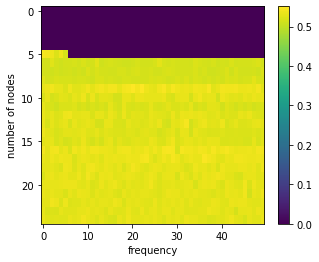

now = 2022-12-01 06:56:40.950085
957 0.5311787933037486


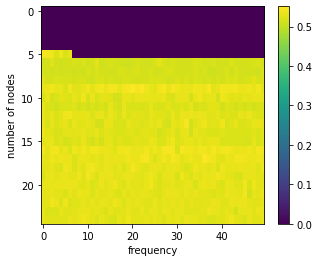

now = 2022-12-01 06:57:36.400007
958 0.5416712438189281


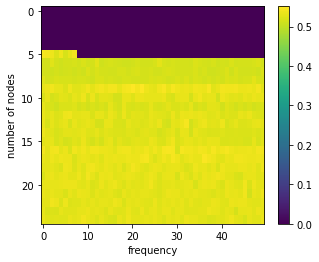

now = 2022-12-01 06:58:32.796558
959 0.5365448262777737


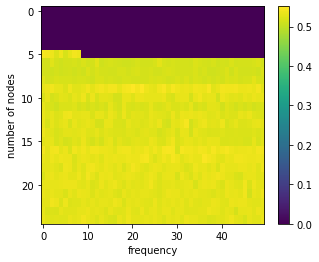

now = 2022-12-01 06:59:29.271041
960 0.533666320427388


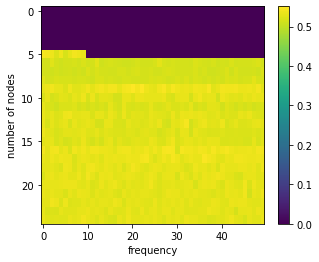

now = 2022-12-01 07:00:26.118082
961 0.5354507675545546


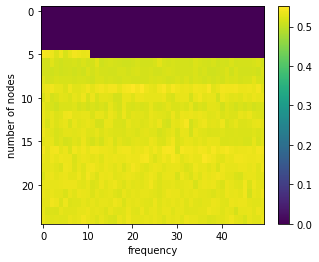

now = 2022-12-01 07:01:21.142914
962 0.5445895125484205


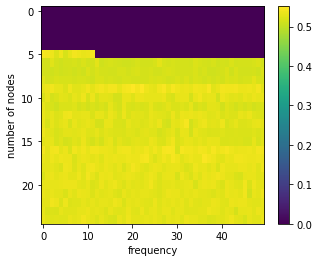

now = 2022-12-01 07:02:16.114483
963 0.541166987171339


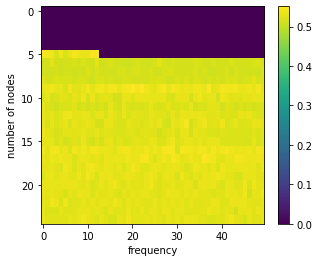

now = 2022-12-01 07:03:11.237847
964 0.5419137727370652


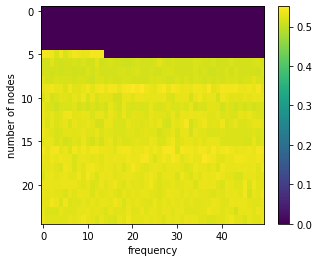

now = 2022-12-01 07:04:06.596209
965 0.5406025270532923


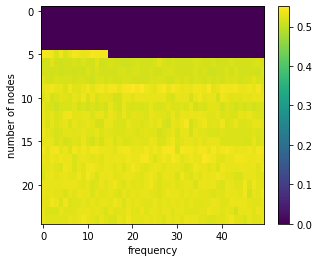

now = 2022-12-01 07:05:02.788883
966 0.5250271723409137


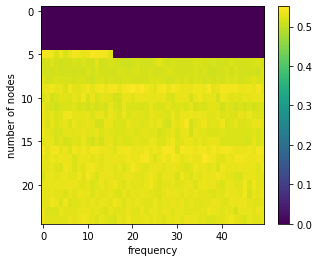

now = 2022-12-01 07:05:58.707090
967 0.5390176444211164


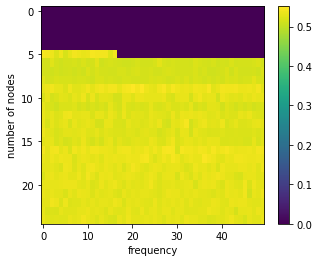

now = 2022-12-01 07:06:54.415070
968 0.5450242550785274


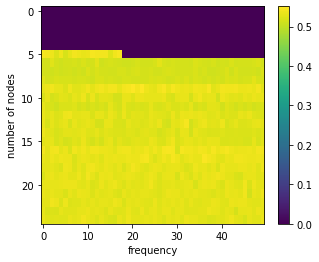

now = 2022-12-01 07:07:50.770685
969 0.5457272357224506


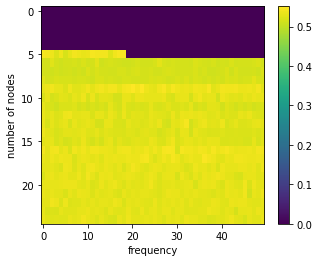

now = 2022-12-01 07:08:46.090306
970 0.5291217979733822


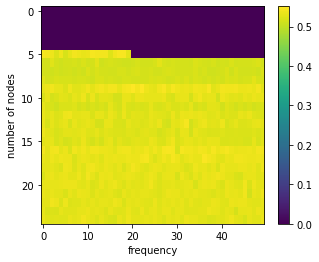

now = 2022-12-01 07:09:42.517465
971 0.5321594206672988


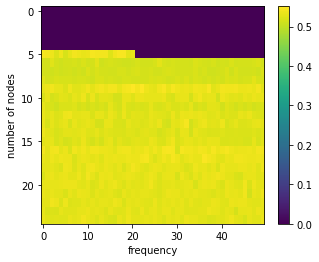

now = 2022-12-01 07:10:37.661527
972 0.5425491095709548


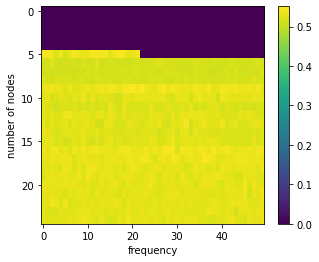

now = 2022-12-01 07:11:33.126057
973 0.5328963322331728


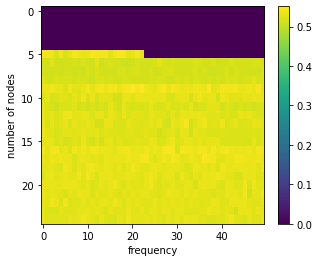

now = 2022-12-01 07:12:29.560737
974 0.5382389603208256


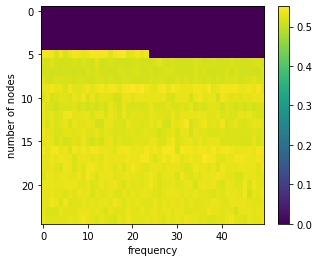

now = 2022-12-01 07:13:25.129690
975 0.534394070364239


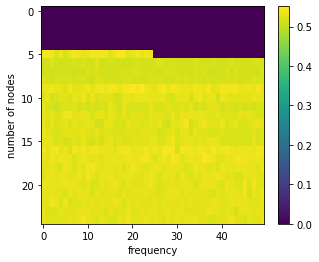

now = 2022-12-01 07:14:19.865993
976 0.52956203902564


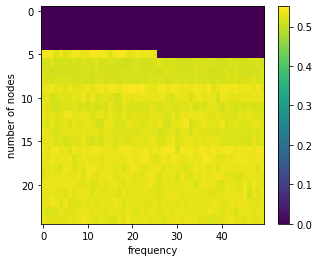

now = 2022-12-01 07:15:15.345383
977 0.5368547825158024


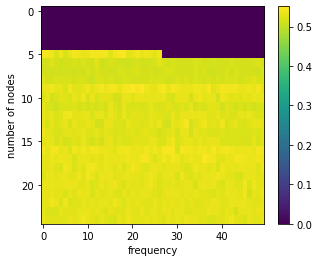

now = 2022-12-01 07:16:10.786186
978 0.538259580312978


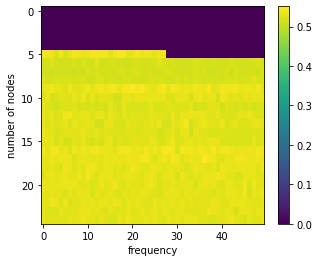

now = 2022-12-01 07:17:07.257441
979 0.5360619381316869


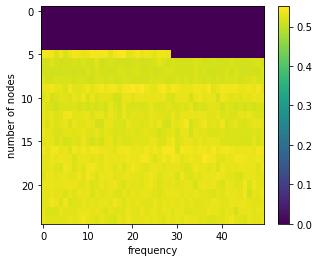

now = 2022-12-01 07:18:04.051303
980 0.5250287515194274


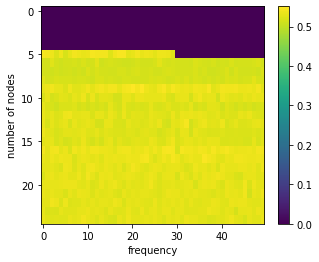

now = 2022-12-01 07:18:59.941380
981 0.5394475742595581


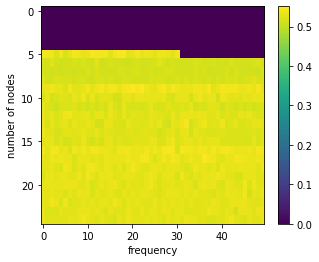

now = 2022-12-01 07:19:55.084177
982 0.5300857611877178


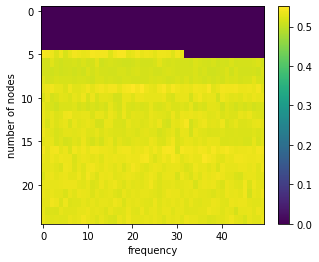

now = 2022-12-01 07:20:50.676026
983 0.5455210699508464


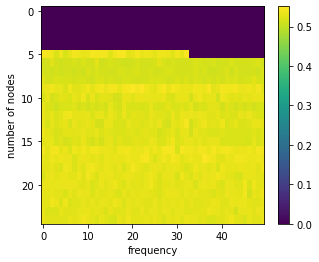

now = 2022-12-01 07:21:46.417065
984 0.5339168672243281


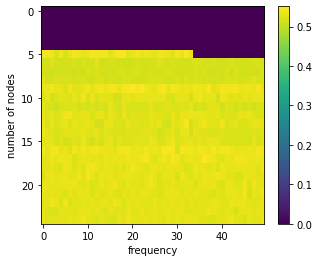

now = 2022-12-01 07:22:43.296506
985 0.5366431103876015


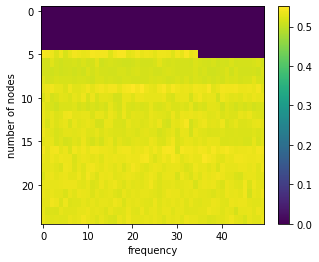

now = 2022-12-01 07:23:39.346646
986 0.5479044888411411


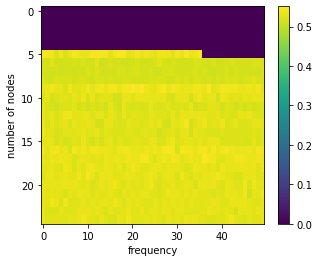

now = 2022-12-01 07:24:34.879455
987 0.5313483569551016


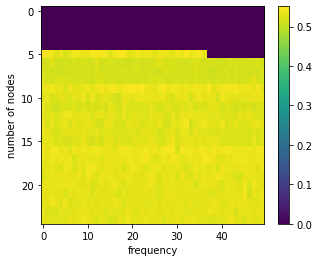

now = 2022-12-01 07:25:30.107834
988 0.531310148143172


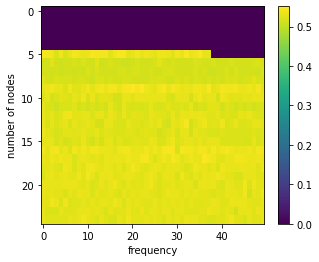

now = 2022-12-01 07:26:26.203068
989 0.5380469667434666


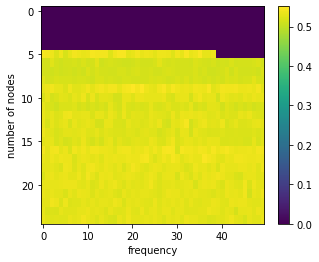

now = 2022-12-01 07:27:22.596820
990 0.5446957101177401


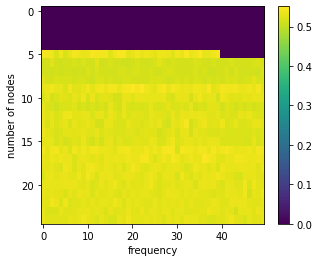

now = 2022-12-01 07:28:17.645420
991 0.5413916519030347


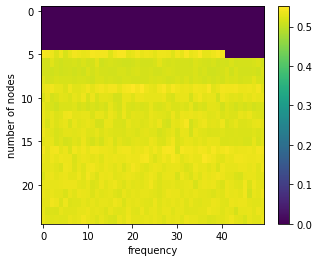

now = 2022-12-01 07:29:13.260862
992 0.529934014225848


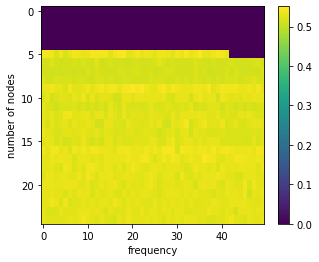

now = 2022-12-01 07:30:09.262665
993 0.5216705623250996


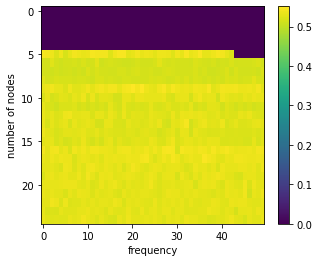

now = 2022-12-01 07:31:04.851197
994 0.5385792027737042


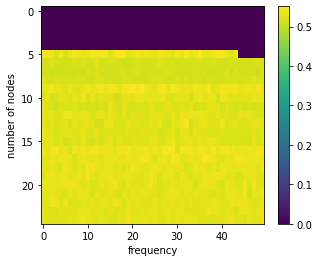

now = 2022-12-01 07:32:00.714828
995 0.5374618099031423


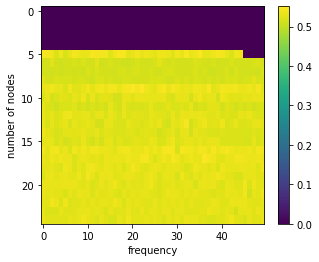

now = 2022-12-01 07:32:57.525335
996 0.5421994014099104


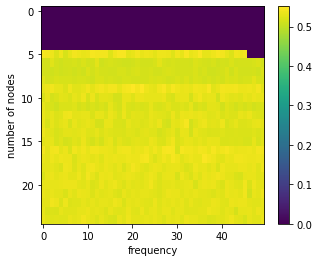

now = 2022-12-01 07:33:54.401089
997 0.5298509610250292


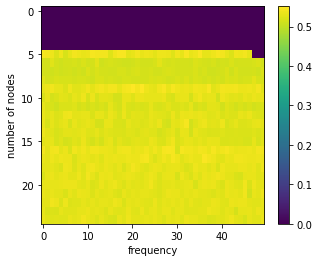

now = 2022-12-01 07:34:50.887584
998 0.5218330211896388


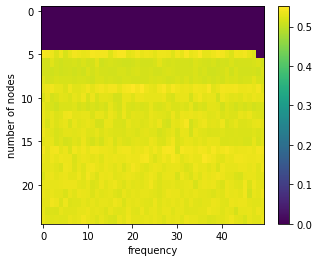

now = 2022-12-01 07:35:47.156124
999 0.5389062695291159


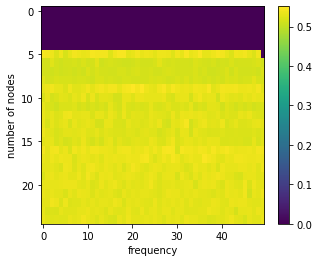

now = 2022-12-01 07:36:42.722436
1000 0.5439612663806941


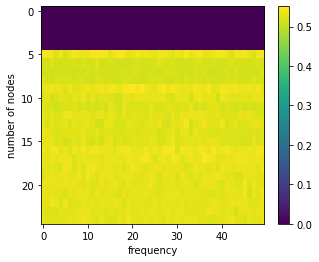

now = 2022-12-01 07:37:38.202926
1001 0.552013910734199


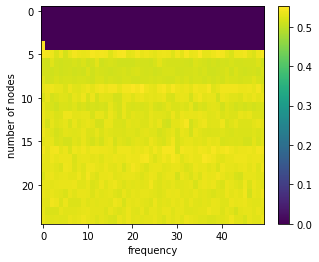

now = 2022-12-01 07:38:33.722636
1002 0.5453251680238882


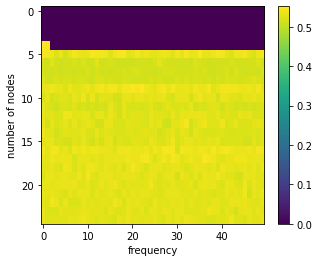

now = 2022-12-01 07:39:29.147617
1003 0.5457323930723202


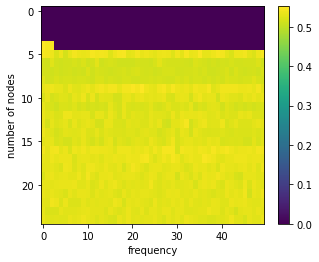

now = 2022-12-01 07:40:25.699087
1004 0.5491967050192373


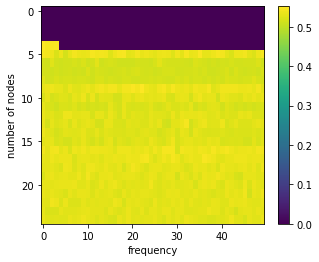

now = 2022-12-01 07:41:22.425276
1005 0.5469524892676947


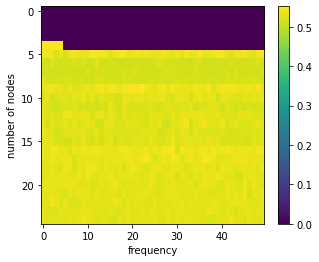

now = 2022-12-01 07:42:17.697542
1006 0.5429821882538712


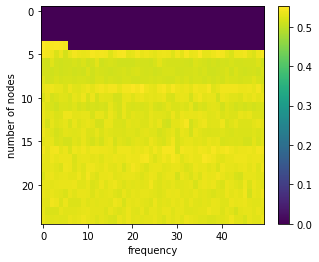

now = 2022-12-01 07:43:11.923452
1007 0.531724961485978


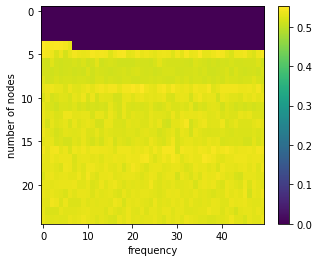

now = 2022-12-01 07:44:08.018680
1008 0.5424739562936687


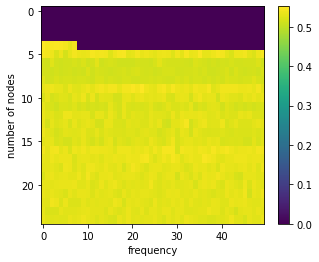

now = 2022-12-01 07:45:04.456119
1009 0.5497891809739021


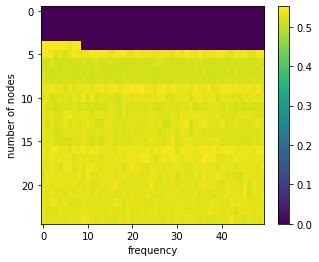

now = 2022-12-01 07:46:01.180852
1010 0.5504634463246643


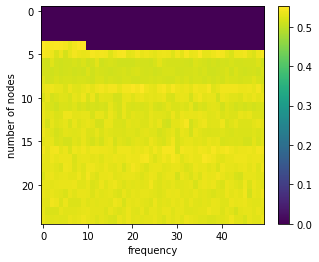

now = 2022-12-01 07:46:56.418655
1011 0.5296805850102754


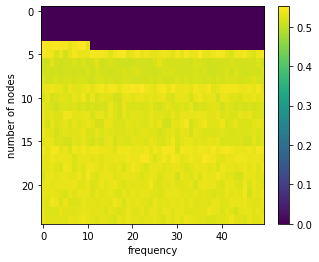

now = 2022-12-01 07:47:50.799728
1012 0.5406903160263086


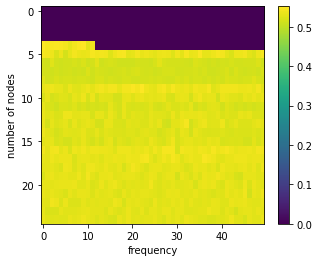

now = 2022-12-01 07:48:46.097729
1013 0.5528780537545517


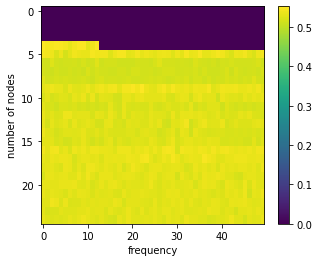

now = 2022-12-01 07:49:42.045541
1014 0.5421410986928811


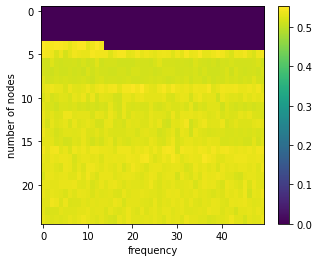

now = 2022-12-01 07:50:38.180207
1015 0.5445400618160282


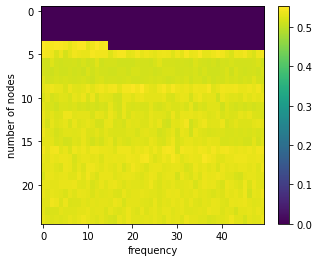

now = 2022-12-01 07:51:34.557250
1016 0.552694055235628


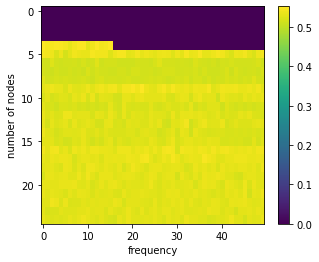

now = 2022-12-01 07:52:29.685809
1017 0.543302258034471


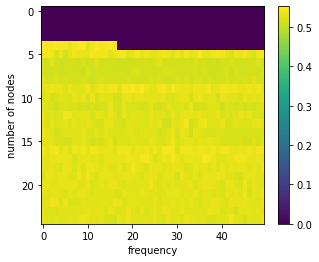

now = 2022-12-01 07:53:25.631429
1018 0.5421454300821701


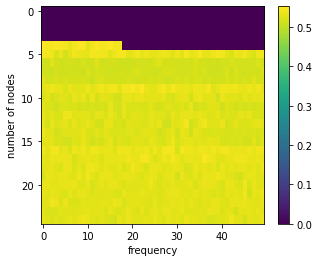

now = 2022-12-01 07:54:20.856036
1019 0.54683377774843


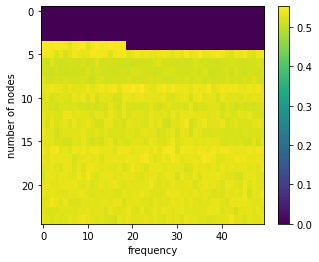

now = 2022-12-01 07:55:17.055616
1020 0.5407177211028309


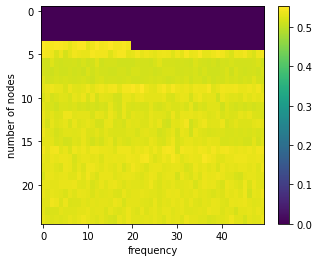

now = 2022-12-01 07:56:13.229925
1021 0.5464804747959461


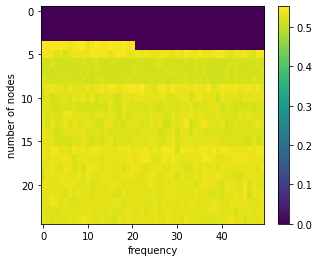

now = 2022-12-01 07:57:08.499251
1022 0.5369650423772696


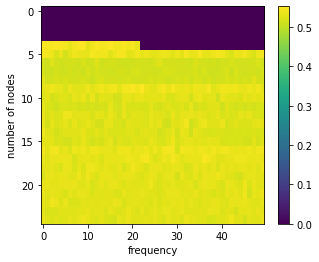

now = 2022-12-01 07:58:04.498660
1023 0.5450012047133714


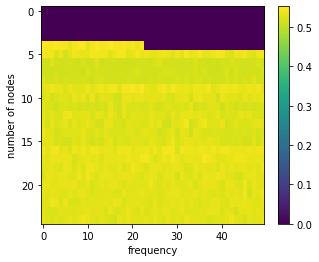

now = 2022-12-01 07:58:59.667752
1024 0.5442254314217293


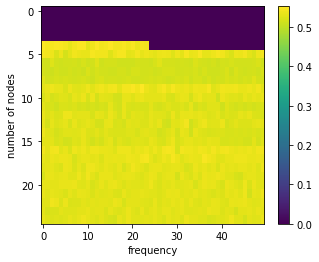

now = 2022-12-01 07:59:55.567117
1025 0.5436551322245823


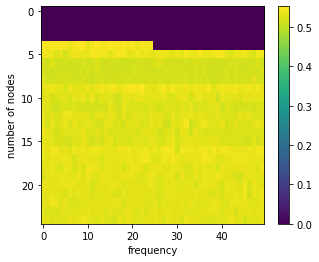

now = 2022-12-01 08:00:51.000458
1026 0.5412953032017266


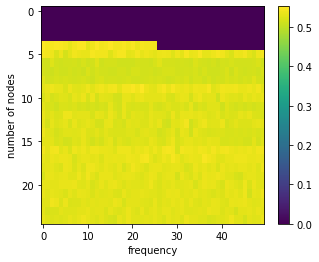

now = 2022-12-01 08:01:46.426673
1027 0.5500297220805742


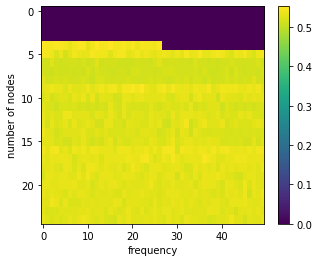

now = 2022-12-01 08:02:42.265092
1028 0.5415532194319254


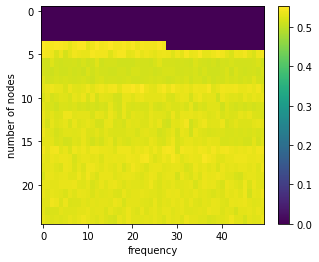

now = 2022-12-01 08:03:37.711116
1029 0.5455756105788988


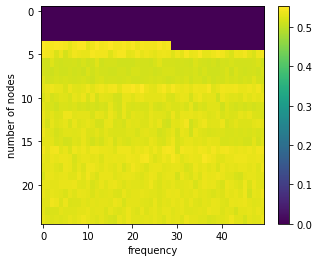

now = 2022-12-01 08:04:32.963671
1030 0.5408743617492899


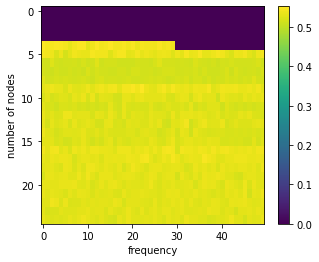

now = 2022-12-01 08:05:29.073682
1031 0.5425339901382811


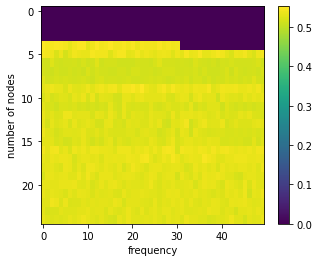

now = 2022-12-01 08:06:24.672791
1032 0.5439318861107799


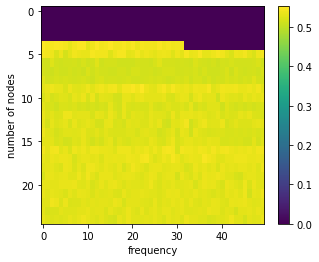

now = 2022-12-01 08:07:20.393652
1033 0.5390061471064347


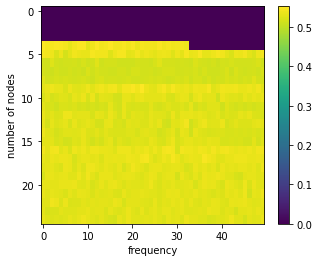

now = 2022-12-01 08:08:17.262638
1034 0.5454668313001867


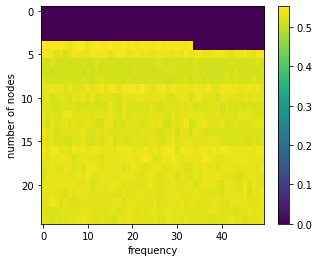

now = 2022-12-01 08:09:13.371838
1035 0.5479704030707194


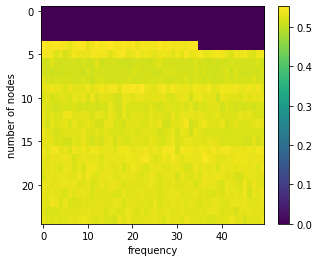

now = 2022-12-01 08:10:10.029895
1036 0.539111858445579


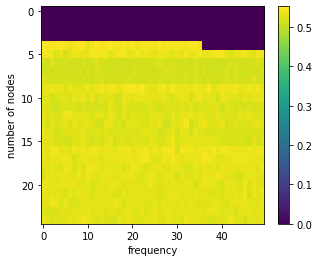

now = 2022-12-01 08:11:06.686871
1037 0.553095744006036


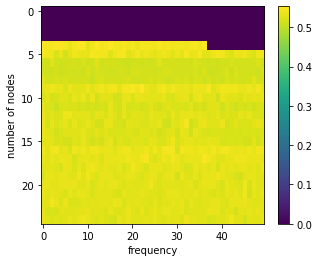

now = 2022-12-01 08:12:02.399558
1038 0.5393985386955866


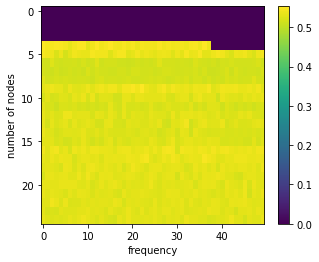

now = 2022-12-01 08:12:58.825578
1039 0.5459519245326726


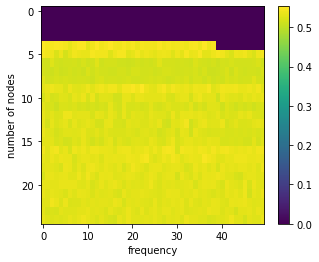

now = 2022-12-01 08:13:54.594254
1040 0.5457600648053277


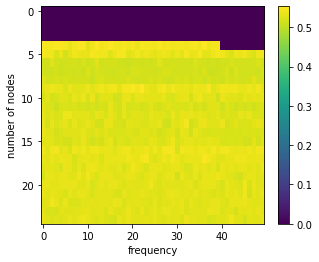

now = 2022-12-01 08:14:50.500461
1041 0.5394809224395926


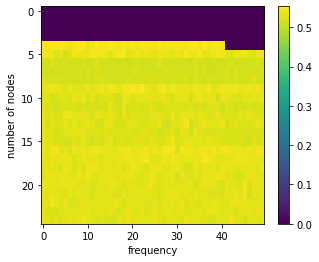

now = 2022-12-01 08:15:46.843262
1042 0.5520940478003997


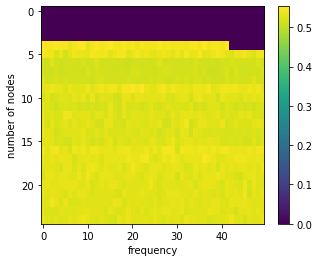

now = 2022-12-01 08:16:42.324494
1043 0.5408269866529601


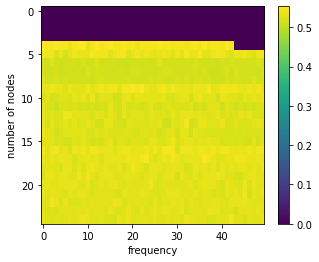

now = 2022-12-01 08:17:38.432510
1044 0.5493029047481893


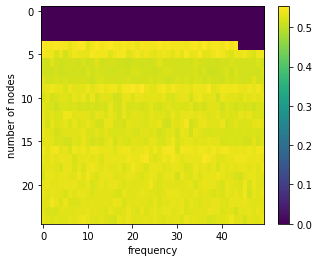

now = 2022-12-01 08:18:34.805108
1045 0.547263550024936


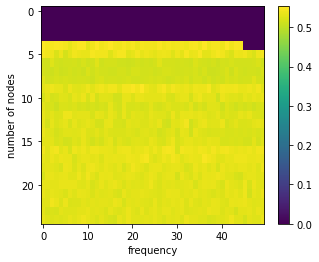

now = 2022-12-01 08:19:30.261125
1046 0.5466145111139522


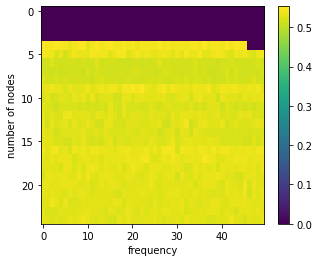

now = 2022-12-01 08:20:24.606451
1047 0.537404684650547


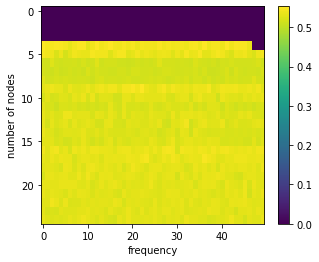

now = 2022-12-01 08:21:19.853324
1048 0.5415290355100552


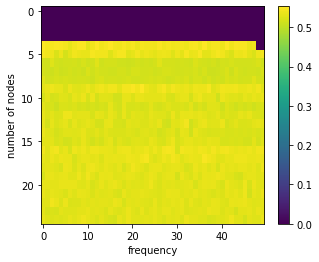

now = 2022-12-01 08:22:15.961095
1049 0.5413890178871241


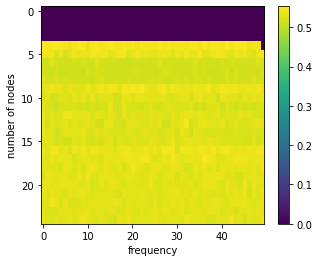

now = 2022-12-01 08:23:11.015540
1050 0.549815241283848


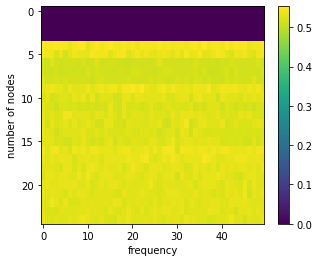

now = 2022-12-01 08:24:06.635935
1051 0.5328975025545536


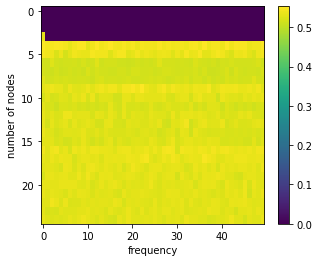

now = 2022-12-01 08:25:03.086335
1052 0.5200323488479434


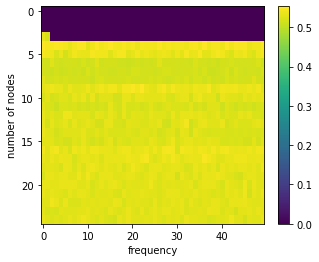

now = 2022-12-01 08:25:59.189668
1053 0.5299949341484668


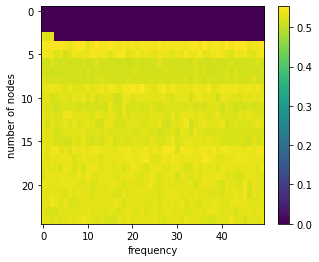

now = 2022-12-01 08:26:55.468436
1054 0.5343757644485155


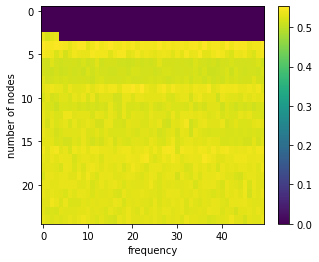

now = 2022-12-01 08:27:51.200996
1055 0.5260211599663157


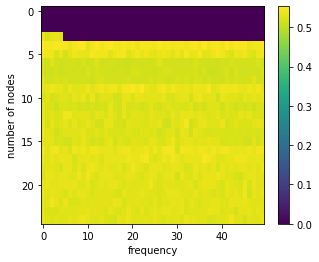

now = 2022-12-01 08:28:48.110479
1056 0.5305036210570597


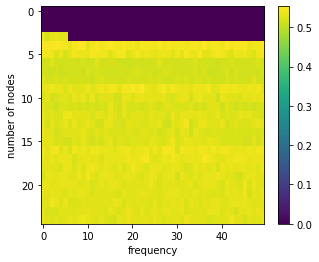

now = 2022-12-01 08:29:44.782975
1057 0.530319149248751


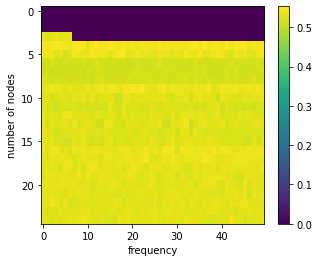

now = 2022-12-01 08:30:41.548227
1058 0.5240150776460312


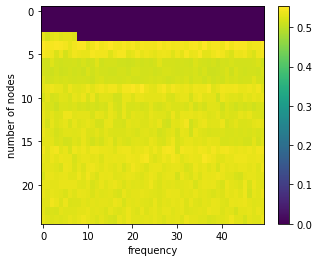

now = 2022-12-01 08:31:37.195426
1059 0.5269958211421665


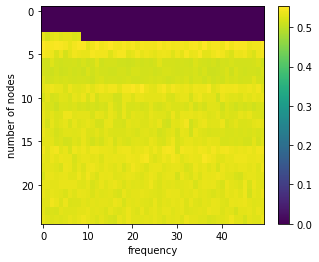

now = 2022-12-01 08:32:32.702596
1060 0.5256262740713462


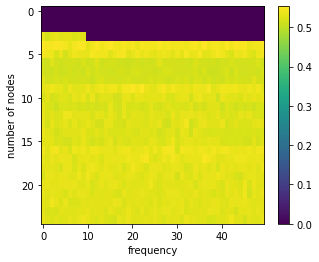

now = 2022-12-01 08:33:28.961811
1061 0.5204824633127921


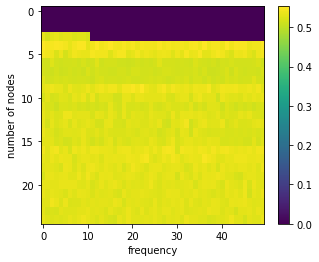

now = 2022-12-01 08:34:25.620533
1062 0.5226311603156014


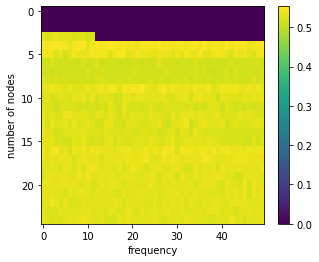

now = 2022-12-01 08:35:20.818162
1063 0.5178139290842144


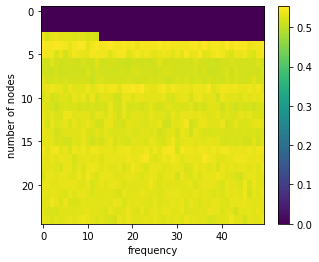

now = 2022-12-01 08:36:16.980366
1064 0.5336493816765083


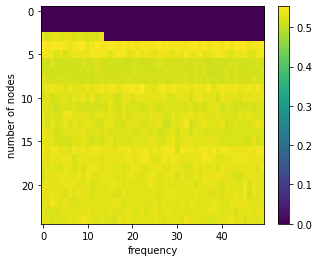

now = 2022-12-01 08:37:12.846926
1065 0.5214185043790914


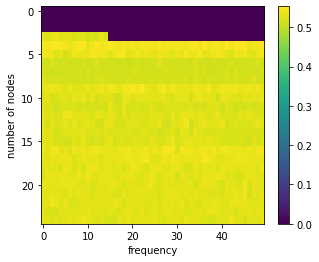

now = 2022-12-01 08:38:08.096496
1066 0.5218728430775617


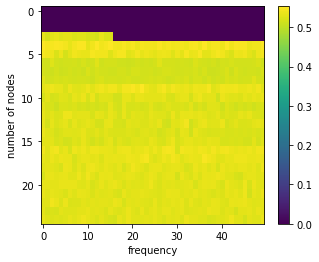

now = 2022-12-01 08:39:04.341621
1067 0.5264098341766118


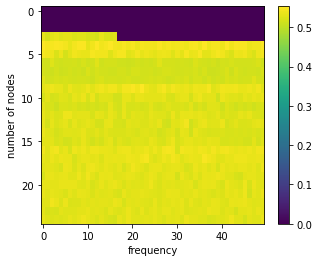

now = 2022-12-01 08:40:01.119407
1068 0.5198654678465314


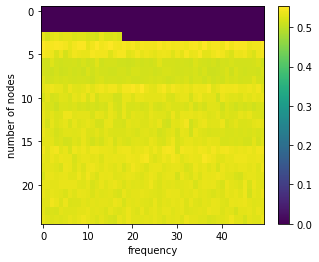

now = 2022-12-01 08:40:57.611668
1069 0.5177386717665702


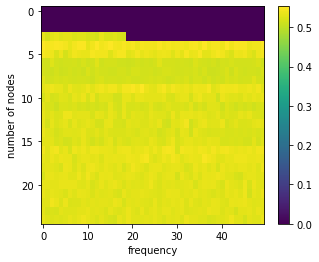

now = 2022-12-01 08:41:53.271726
1070 0.5281660031858741


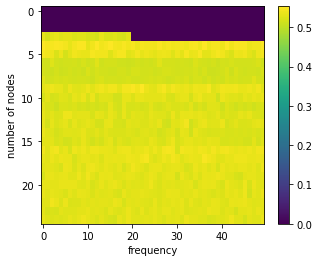

now = 2022-12-01 08:42:47.949679
1071 0.5222655326153864


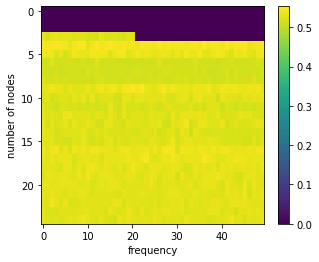

now = 2022-12-01 08:43:45.349268
1072 0.5233418861067988


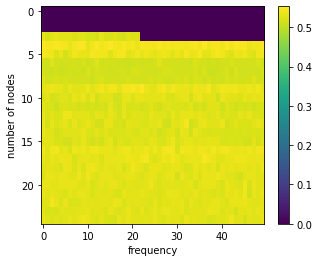

now = 2022-12-01 08:44:41.144848
1073 0.5225986400646003


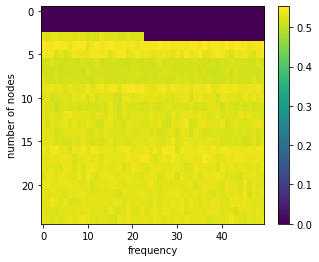

now = 2022-12-01 08:45:37.627643
1074 0.5273308677022099


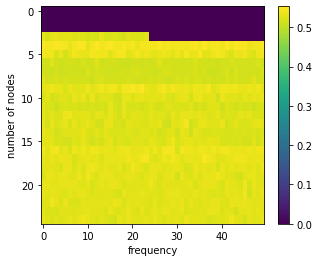

now = 2022-12-01 08:46:34.844869
1075 0.5229136634228304


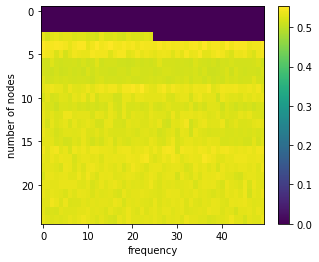

now = 2022-12-01 08:47:30.905035
1076 0.5220551107588246


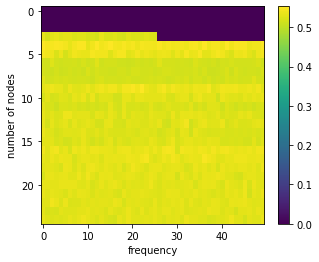

now = 2022-12-01 08:48:26.671038
1077 0.5229018774080009


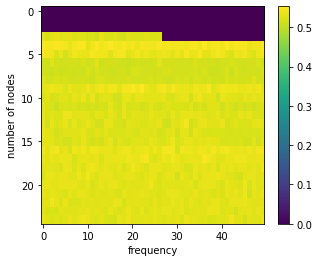

now = 2022-12-01 08:49:22.052036
1078 0.5242158251553373


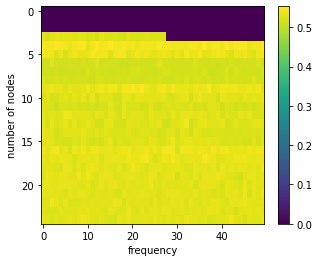

now = 2022-12-01 08:50:18.226684
1079 0.51975123096143


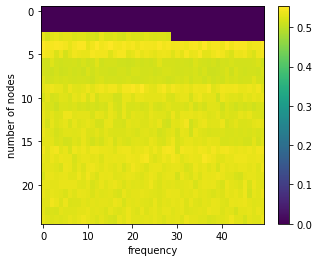

now = 2022-12-01 08:51:14.730093
1080 0.5370189819977494


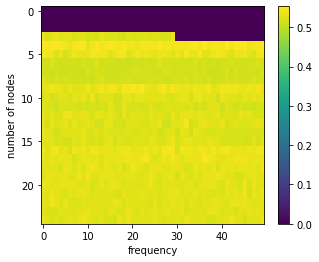

now = 2022-12-01 08:52:11.662554
1081 0.5228846044214588


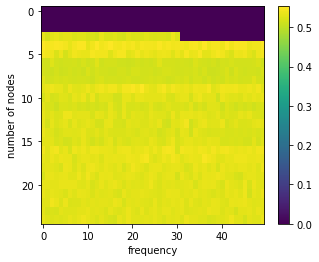

now = 2022-12-01 08:53:07.442775
1082 0.5218375849244875


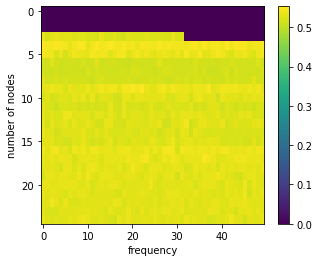

now = 2022-12-01 08:54:02.987395
1083 0.5224016919340463


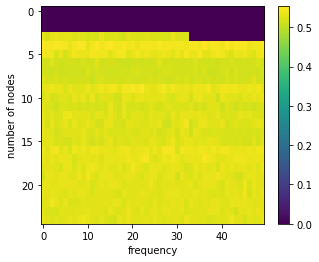

now = 2022-12-01 08:54:58.730178
1084 0.5246930340839355


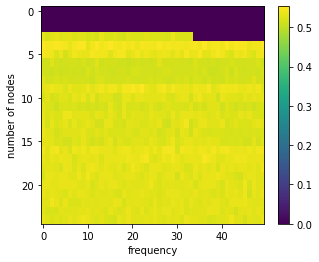

now = 2022-12-01 08:55:54.968034
1085 0.5228428348087969


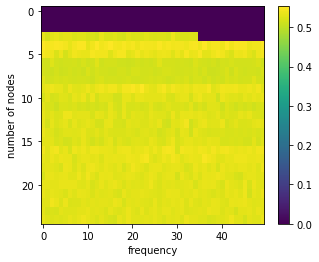

now = 2022-12-01 08:56:50.084386
1086 0.5238606776207939


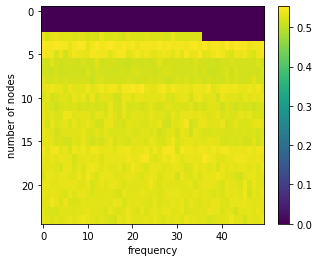

now = 2022-12-01 08:57:46.971700
1087 0.524913226885456


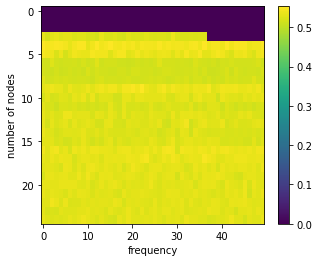

now = 2022-12-01 08:58:42.703339
1088 0.5252485888892107


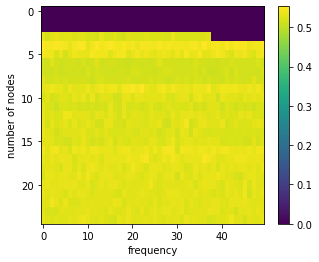

now = 2022-12-01 08:59:36.794895
1089 0.518322364728677


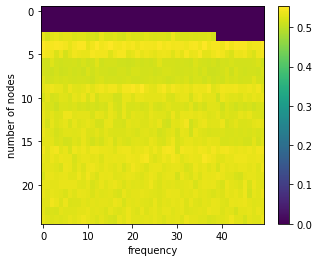

now = 2022-12-01 09:00:32.426586
1090 0.5256103856191611


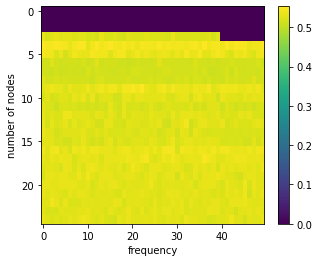

now = 2022-12-01 09:01:29.280734
1091 0.5215462044274415


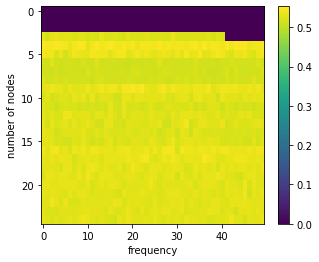

now = 2022-12-01 09:02:26.795985
1092 0.5347649911994939


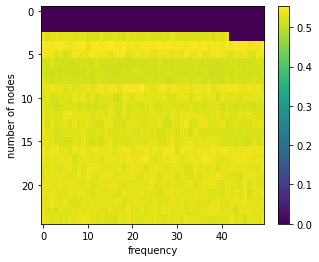

now = 2022-12-01 09:03:21.933825
1093 0.5211196340739684


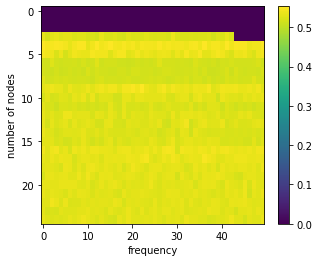

now = 2022-12-01 09:04:17.626414
1094 0.5322288634241518


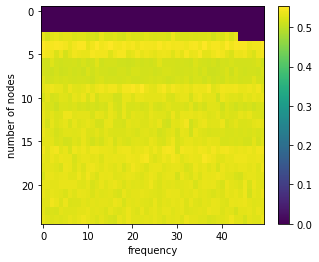

now = 2022-12-01 09:05:15.349367
1095 0.5239616077150179


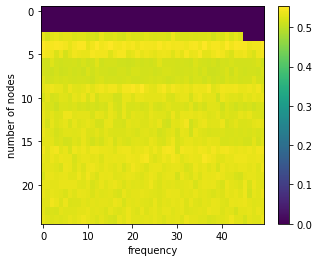

now = 2022-12-01 09:06:11.285633
1096 0.5168554198439037


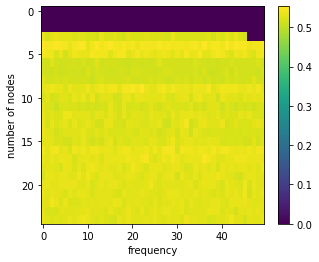

now = 2022-12-01 09:07:07.289192
1097 0.5216831881803818


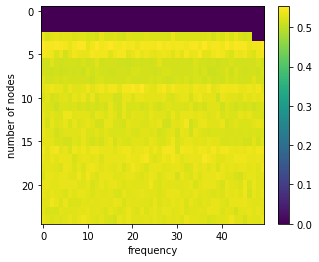

now = 2022-12-01 09:08:02.563056
1098 0.5195025124895188


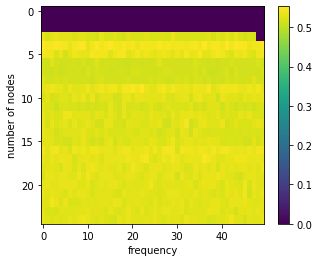

now = 2022-12-01 09:08:59.064315
1099 0.521112007131172


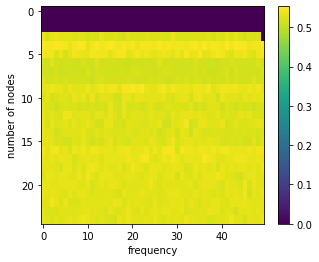

now = 2022-12-01 09:09:54.148330
1100 0.5217761914848718


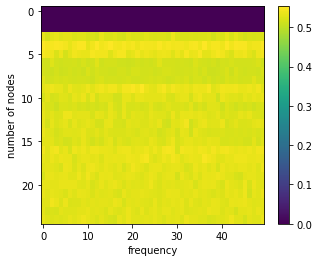

now = 2022-12-01 09:10:50.585344
1101 0.5165020946871411


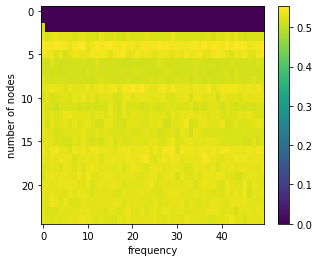

now = 2022-12-01 09:11:47.231908
1102 0.5172359707067125


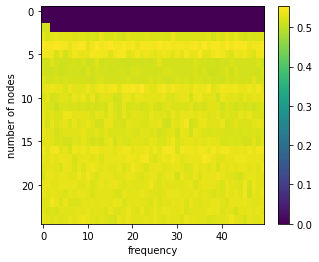

now = 2022-12-01 09:12:43.066406
1103 0.5150223594964951


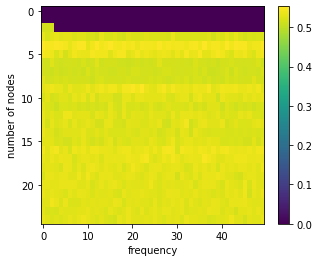

now = 2022-12-01 09:13:39.688778
1104 0.5156748605722655


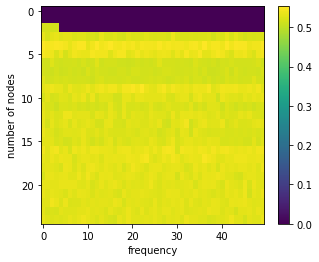

now = 2022-12-01 09:14:34.490490
1105 0.5178370389734085


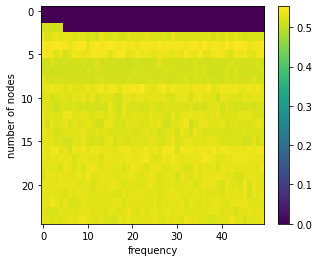

now = 2022-12-01 09:15:30.241013
1106 0.5216732910698396


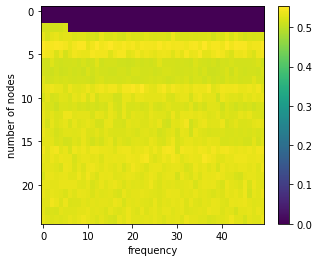

now = 2022-12-01 09:16:26.327313
1107 0.513498717211917


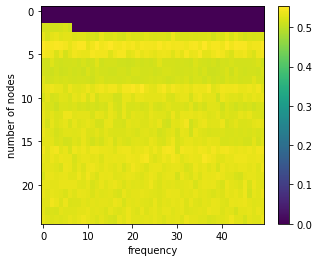

now = 2022-12-01 09:17:22.516972
1108 0.5193034260007432


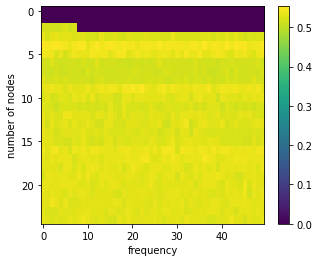

now = 2022-12-01 09:18:17.962141
1109 0.5090221975053664


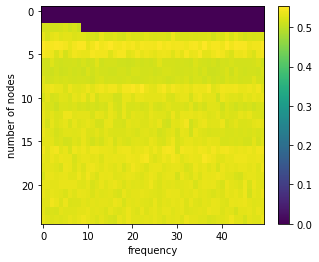

now = 2022-12-01 09:19:14.410714
1110 0.5131991360885783


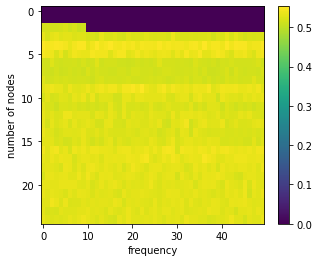

now = 2022-12-01 09:20:09.930775
1111 0.5152167115260523


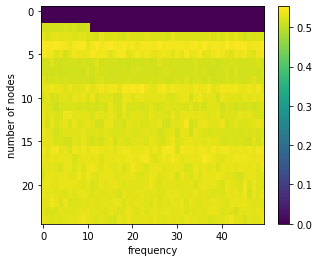

now = 2022-12-01 09:21:06.317894
1112 0.5152256124602573


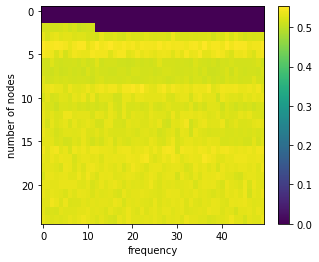

now = 2022-12-01 09:22:02.763319
1113 0.5178054574121441


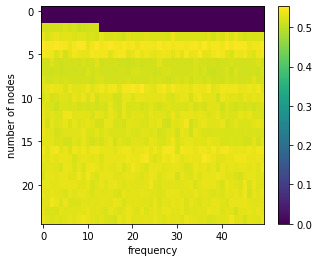

now = 2022-12-01 09:22:59.400635
1114 0.5149042893910722


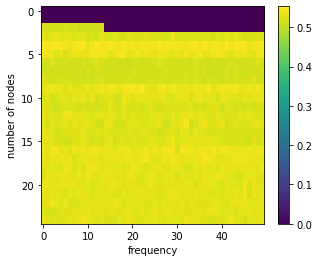

now = 2022-12-01 09:23:56.772812
1115 0.5159127383893085


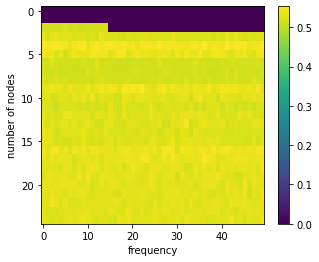

now = 2022-12-01 09:24:52.908983
1116 0.5157010218963295


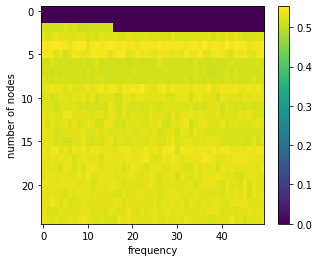

now = 2022-12-01 09:25:48.799434
1117 0.5130251942116324


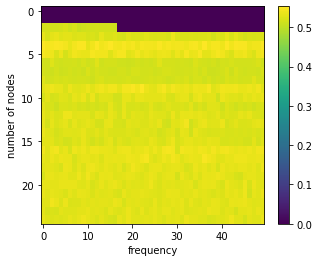

now = 2022-12-01 09:26:46.233229
1118 0.5103809601195458


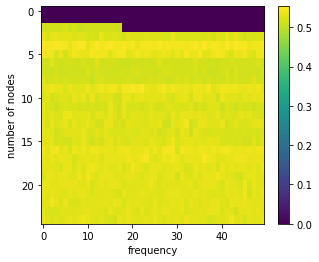

now = 2022-12-01 09:27:42.429932
1119 0.5160859817026778


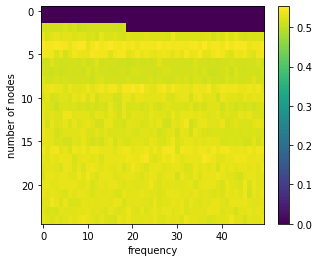

now = 2022-12-01 09:28:37.307228
1120 0.5160455673670707


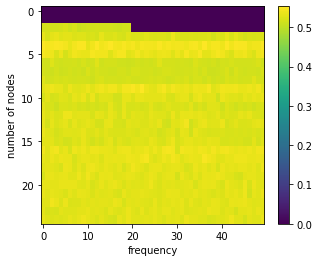

now = 2022-12-01 09:29:32.914158
1121 0.5172759744811889


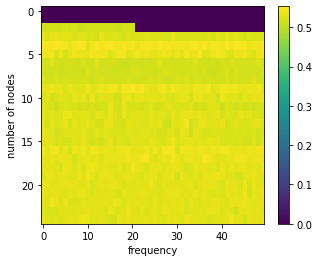

now = 2022-12-01 09:30:27.845563
1122 0.5167200757607671


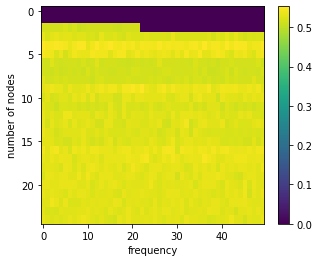

now = 2022-12-01 09:31:23.608417
1123 0.5177057493591355


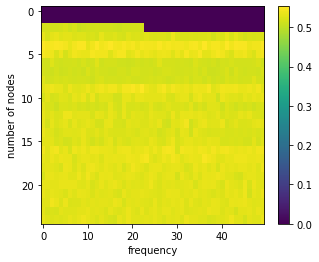

now = 2022-12-01 09:32:18.835417
1124 0.5152409666532026


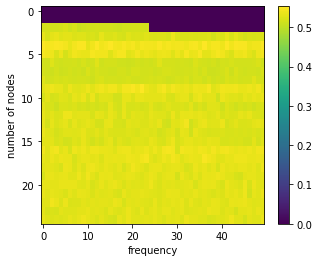

now = 2022-12-01 09:33:15.722409
1125 0.5147956097252576


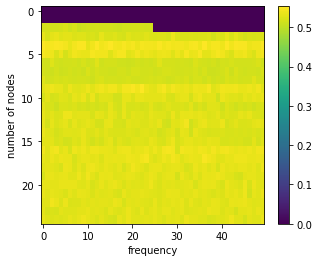

now = 2022-12-01 09:34:10.683260
1126 0.5094916360868562


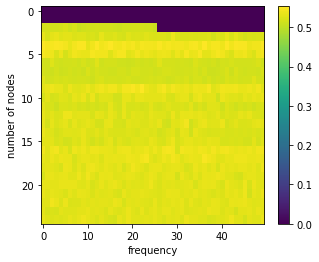

now = 2022-12-01 09:35:06.981672
1127 0.5124320501547839


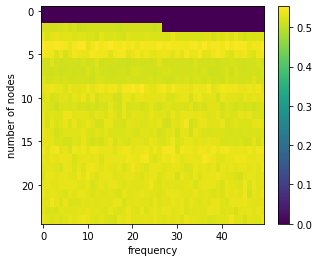

now = 2022-12-01 09:36:02.226540
1128 0.5138267268648385


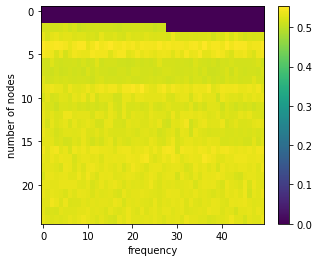

now = 2022-12-01 09:36:58.528427
1129 0.5150780857085921


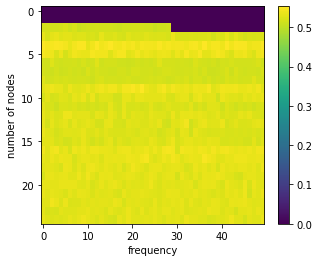

now = 2022-12-01 09:37:54.851116
1130 0.512672689975158


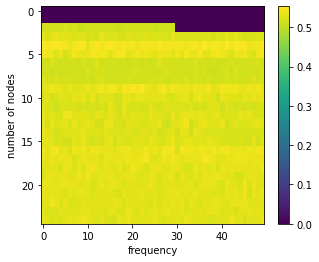

now = 2022-12-01 09:38:50.840178
1131 0.5148408921842519


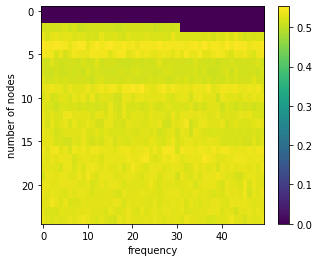

now = 2022-12-01 09:39:46.304648
1132 0.5134175770081671


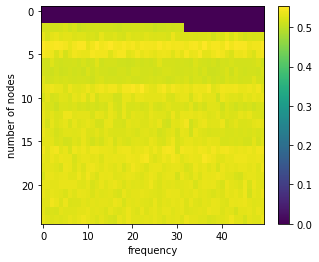

now = 2022-12-01 09:40:43.808249
1133 0.5167410790111113


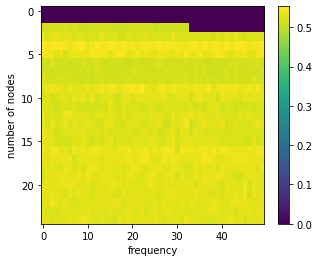

now = 2022-12-01 09:41:39.829539
1134 0.5121899681773833


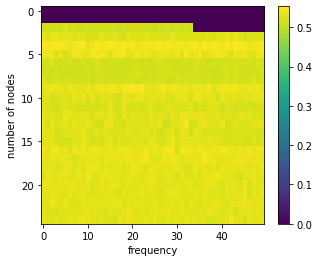

now = 2022-12-01 09:42:35.088048
1135 0.5134828695498986


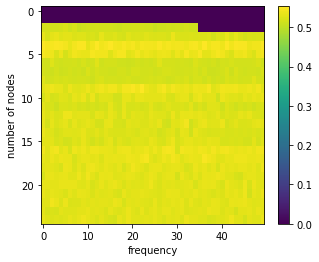

now = 2022-12-01 09:43:31.826829
1136 0.5164286545131208


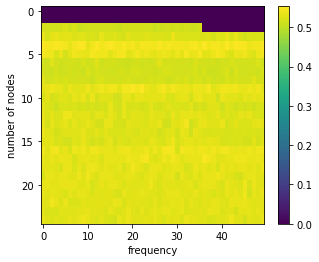

now = 2022-12-01 09:44:29.256613
1137 0.5126622346205514


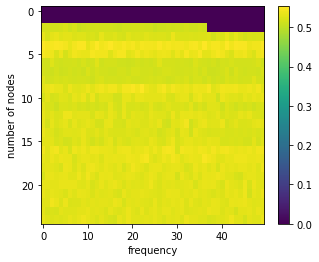

now = 2022-12-01 09:45:25.575218
1138 0.5156557268634253


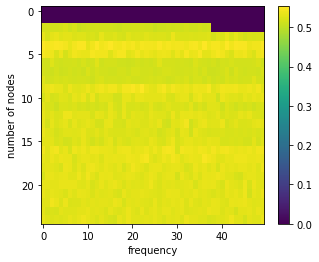

now = 2022-12-01 09:46:20.968414
1139 0.5159830801642359


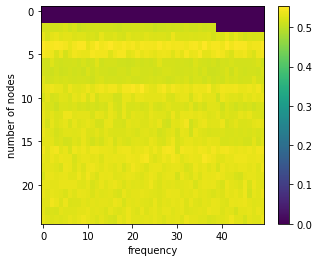

now = 2022-12-01 09:47:16.580212
1140 0.5106327525763484


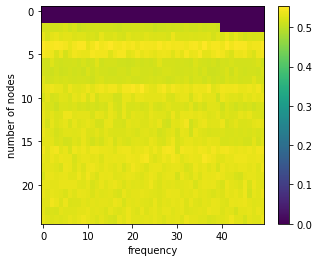

now = 2022-12-01 09:48:13.718936
1141 0.5139362025319453


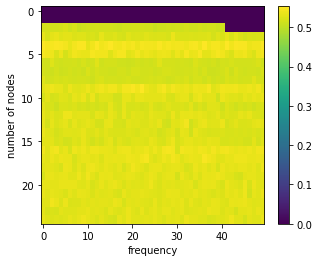

now = 2022-12-01 09:49:08.914828
1142 0.5160454542857952


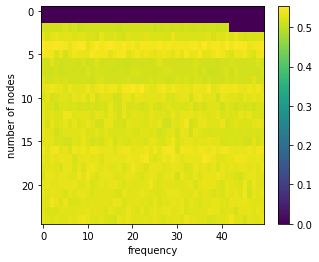

now = 2022-12-01 09:50:04.589516
1143 0.5146115986282698


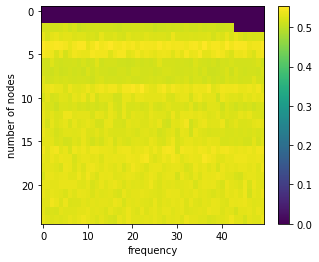

now = 2022-12-01 09:51:00.588880
1144 0.5162718543584084


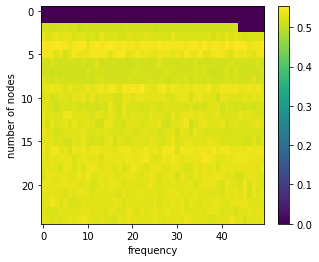

now = 2022-12-01 09:51:55.743216
1145 0.5151221802365044


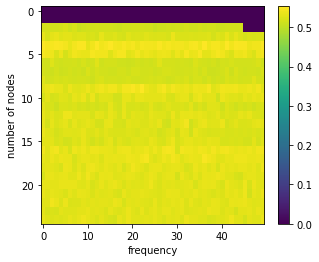

now = 2022-12-01 09:52:51.886971
1146 0.5170537236471922


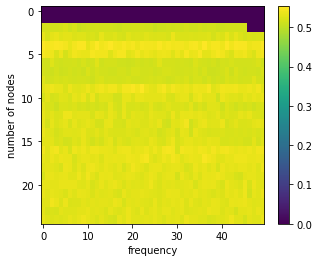

now = 2022-12-01 09:53:47.740018
1147 0.5173768385100181


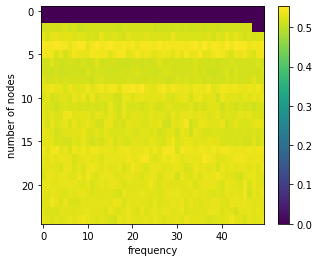

now = 2022-12-01 09:54:43.691233
1148 0.5129848533555734


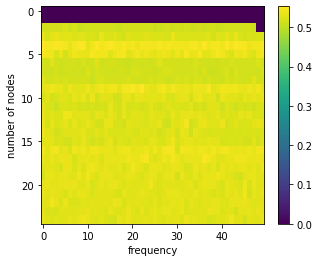

now = 2022-12-01 09:55:39.246285
1149 0.5139779844976293


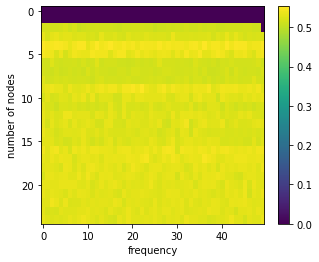

now = 2022-12-01 09:56:35.554330
1150 0.5154665641106332


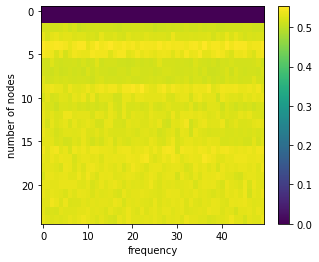

now = 2022-12-01 09:57:57.980364
1151 0.5126309838779796


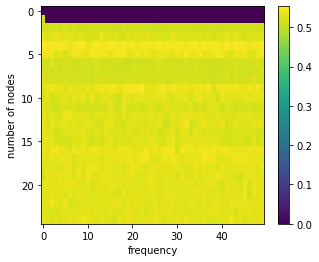

now = 2022-12-01 09:59:26.313802
1152 0.5082969926195503


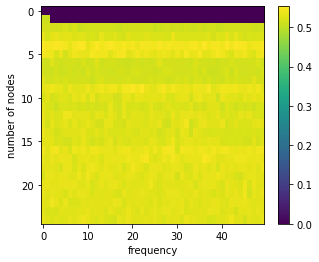

now = 2022-12-01 10:01:02.199423
1153 0.5183537647994071


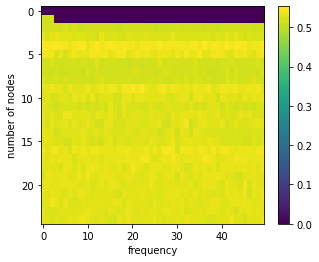

now = 2022-12-01 10:02:46.543185
1154 0.5127188701336184


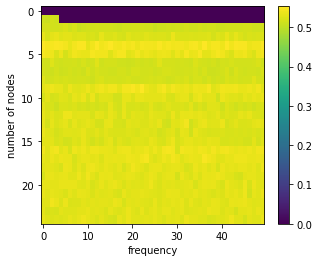

now = 2022-12-01 10:04:25.843853
1155 0.5124911203905229


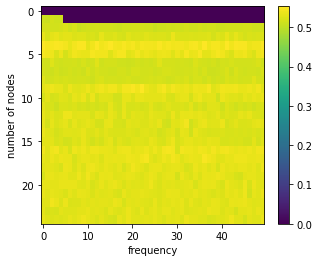

now = 2022-12-01 10:05:24.329376
1156 0.5159187330628845


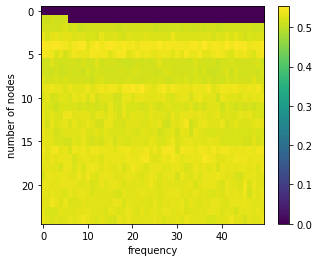

now = 2022-12-01 10:06:19.175481
1157 0.5162532416454156


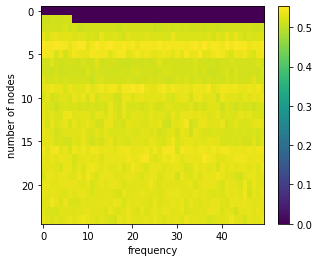

now = 2022-12-01 10:07:14.123525
1158 0.5171176615994492


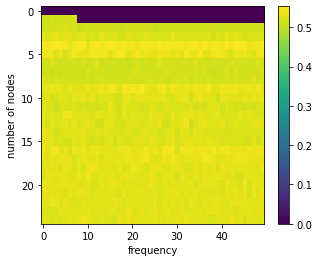

now = 2022-12-01 10:08:10.035125
1159 0.5115929991776449


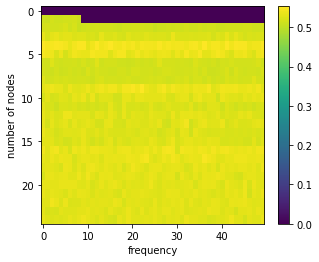

now = 2022-12-01 10:09:05.478183
1160 0.5133837195234846


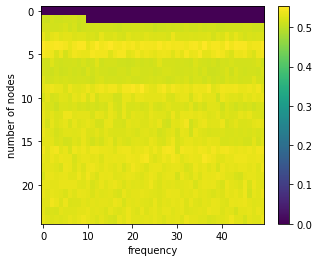

now = 2022-12-01 10:09:59.936373
1161 0.5119217193384573


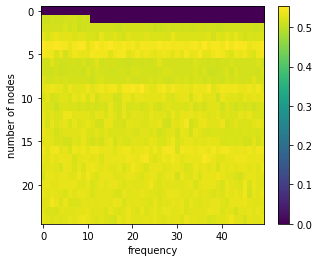

now = 2022-12-01 10:10:54.342109
1162 0.5094818080890259


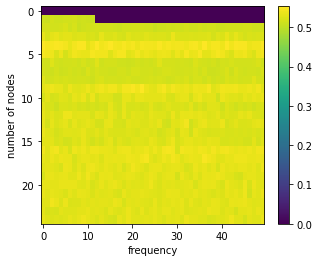

now = 2022-12-01 10:11:49.541136
1163 0.5128201406972587


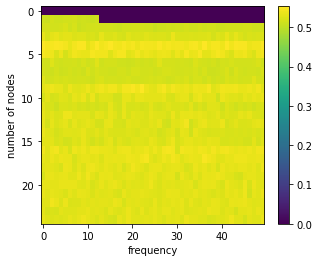

now = 2022-12-01 10:12:44.917333
1164 0.5127090402212063


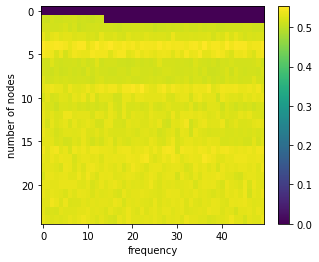

now = 2022-12-01 10:13:40.082648
1165 0.5154808787663403


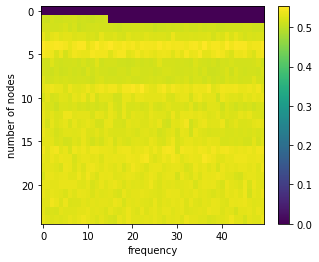

now = 2022-12-01 10:14:35.577618
1166 0.5107602161131513


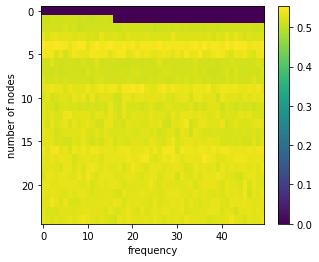

now = 2022-12-01 10:15:31.557827
1167 0.5109688747307465


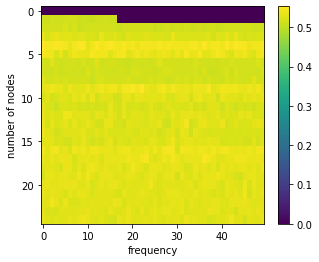

now = 2022-12-01 10:16:27.234061
1168 0.5137271547381662


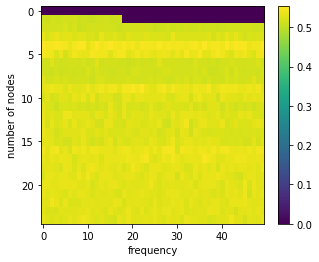

now = 2022-12-01 10:17:22.810681
1169 0.5105923729205243


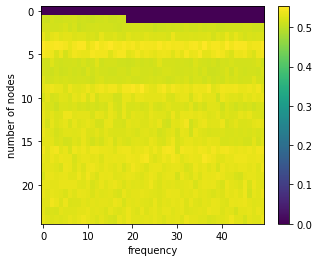

now = 2022-12-01 10:18:18.578558
1170 0.5142041992287797


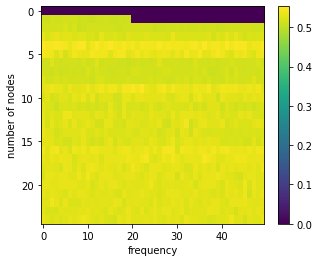

now = 2022-12-01 10:19:14.480051
1171 0.5111247768916569


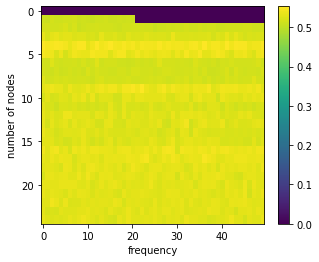

now = 2022-12-01 10:20:09.917676
1172 0.5129080796457911


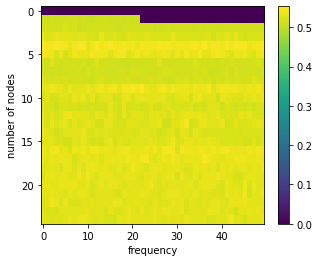

now = 2022-12-01 10:21:04.337628
1173 0.5107377975670155


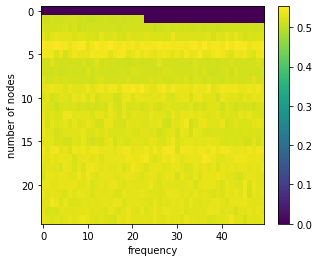

now = 2022-12-01 10:22:00.620182
1174 0.5124199457794041


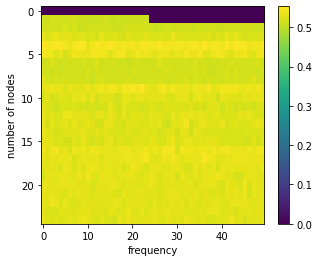

now = 2022-12-01 10:22:56.842384
1175 0.5167312647755127


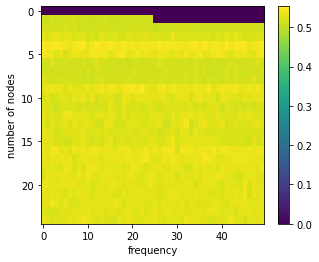

now = 2022-12-01 10:23:50.989670
1176 0.5122658325008377


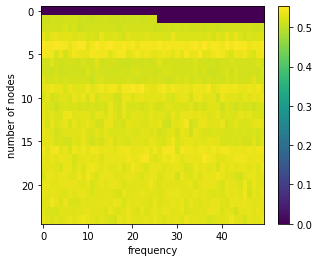

now = 2022-12-01 10:24:46.827993
1177 0.5075971313086166


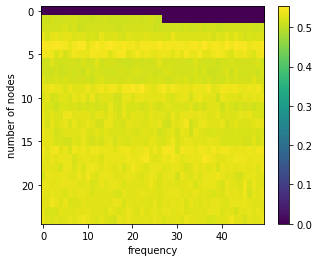

now = 2022-12-01 10:25:42.357706
1178 0.5143034170979935


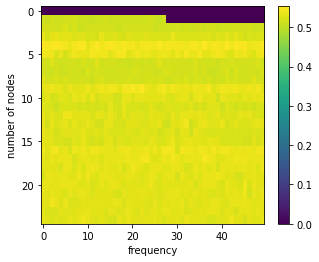

now = 2022-12-01 10:26:36.895629
1179 0.5131968469770863


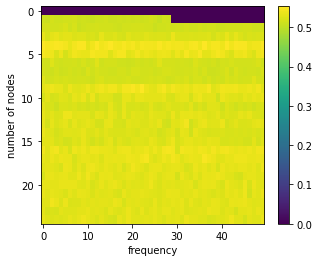

now = 2022-12-01 10:27:31.543347
1180 0.514899177183733


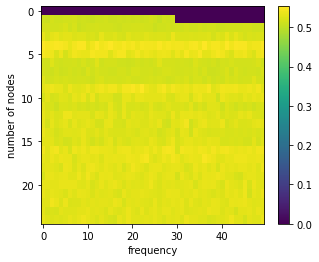

now = 2022-12-01 10:28:27.037304
1181 0.5134922866138809


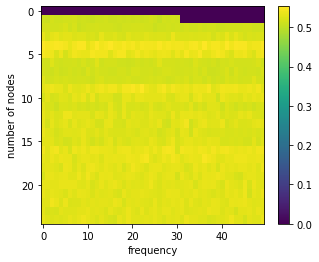

now = 2022-12-01 10:29:23.316206
1182 0.5117305454346672


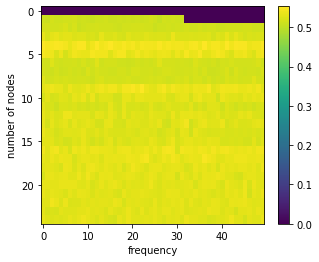

now = 2022-12-01 10:30:18.164107
1183 0.5118795246943731


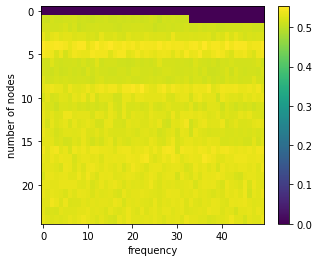

now = 2022-12-01 10:31:14.728745
1184 0.5108758223801169


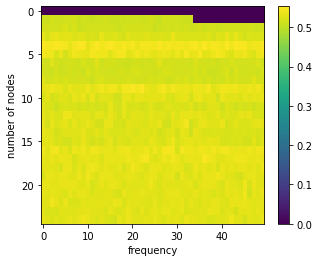

now = 2022-12-01 10:32:17.015404
1185 0.5097739669305817


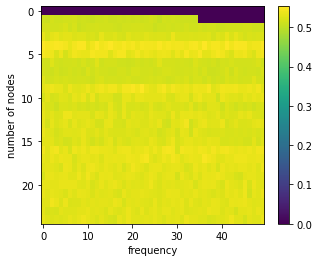

now = 2022-12-01 10:33:18.133226
1186 0.508597650616994


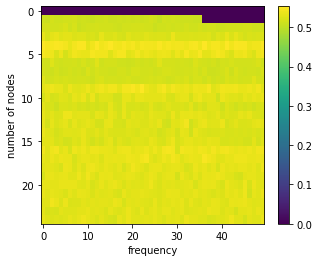

now = 2022-12-01 10:34:16.337253
1187 0.5133333910099412


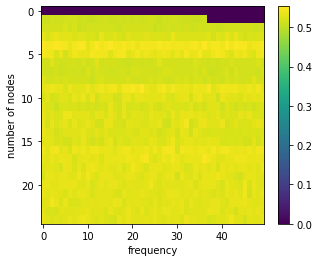

now = 2022-12-01 10:35:12.810438
1188 0.5136879320864757


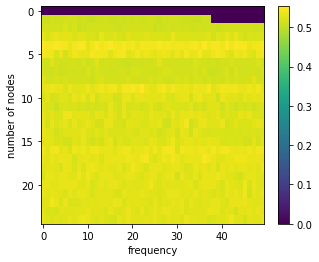

now = 2022-12-01 10:36:08.093239
1189 0.5152894419045138


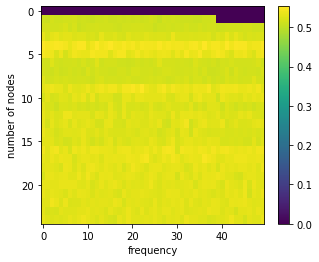

now = 2022-12-01 10:37:03.465940
1190 0.5144683734285457


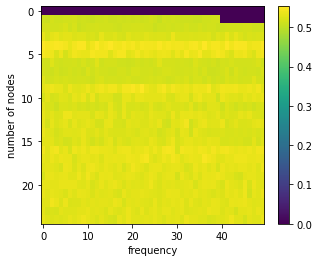

now = 2022-12-01 10:37:59.124421
1191 0.5130751191610458


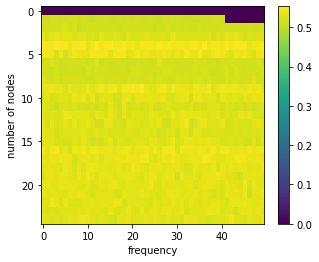

now = 2022-12-01 10:38:56.454166
1192 0.5121612200892062


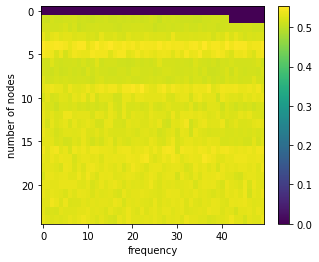

now = 2022-12-01 10:39:55.429044
1193 0.5155635177215823


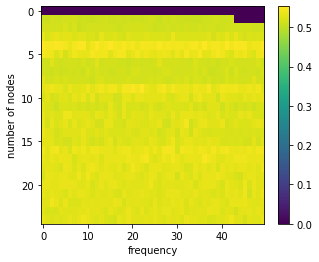

now = 2022-12-01 10:40:58.859601
1194 0.5161659399425197


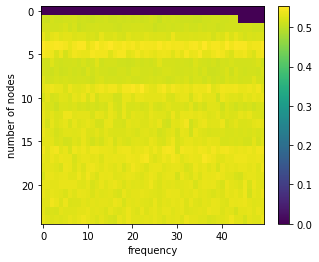

now = 2022-12-01 10:42:00.648721
1195 0.5156237138149982


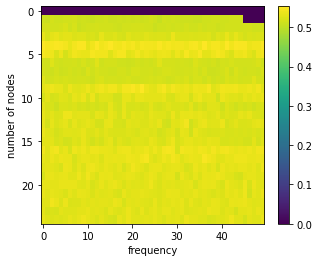

now = 2022-12-01 10:43:03.335305
1196 0.508606031601447


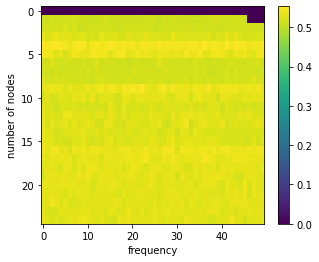

now = 2022-12-01 10:44:05.578567
1197 0.5121371876001614


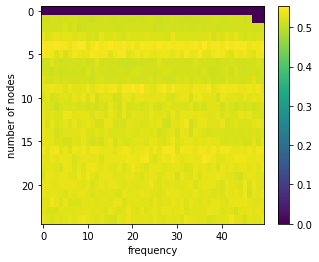

now = 2022-12-01 10:45:23.118920
1198 0.514673294653117


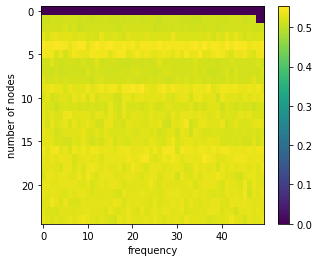

now = 2022-12-01 10:46:46.349925
1199 0.5111733521109608


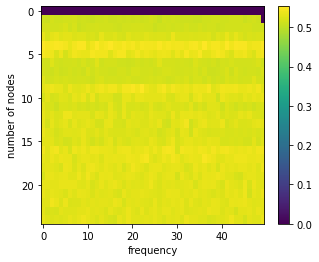

now = 2022-12-01 10:48:07.822836
1200 0.5123430290264962


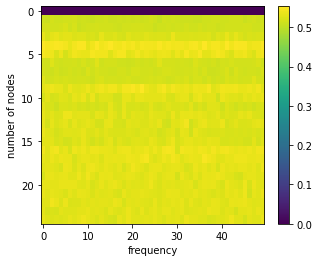

now = 2022-12-01 10:49:30.620379
1201 0.5092255862231007


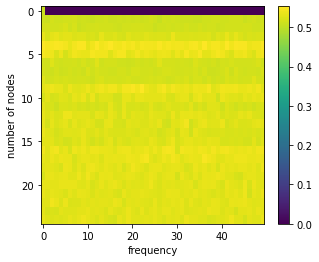

now = 2022-12-01 10:50:53.821783
1202 0.5113867034458544


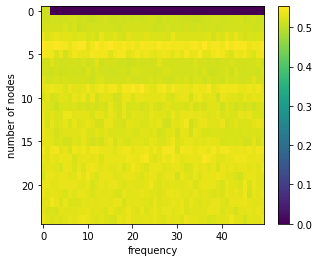

now = 2022-12-01 10:52:17.904441
1203 0.5119058119949776


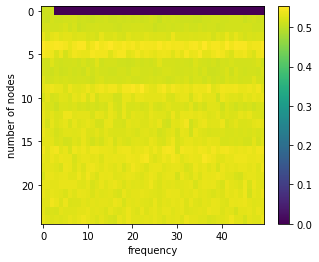

now = 2022-12-01 10:53:43.304360
1204 0.5124474231068461


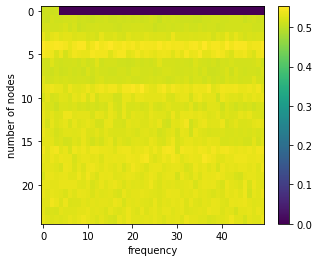

now = 2022-12-01 10:55:04.795942
1205 0.5137611423953768


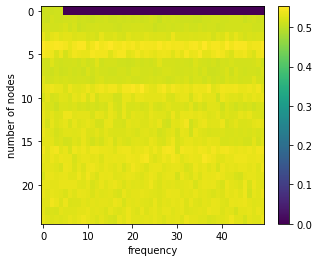

now = 2022-12-01 10:56:27.718596
1206 0.5099436666829317


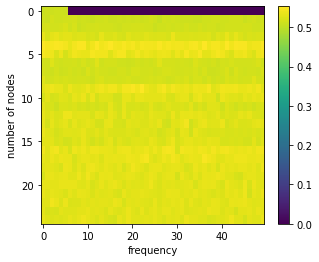

now = 2022-12-01 10:57:50.953802
1207 0.511181187117591


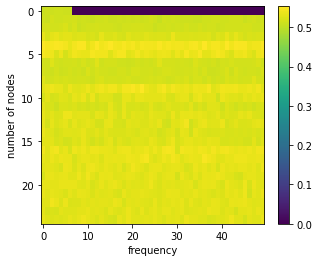

now = 2022-12-01 10:59:17.388550
1208 0.5109441793009316


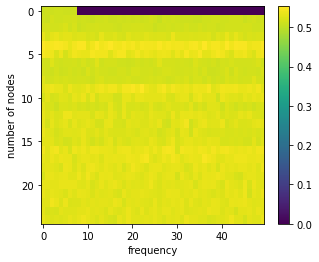

now = 2022-12-01 11:00:39.572631
1209 0.507914647771968


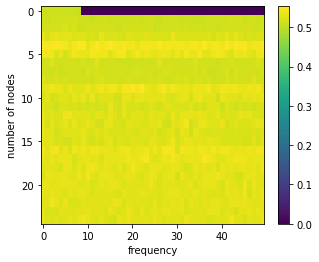

now = 2022-12-01 11:02:01.224027
1210 0.5127083342838057


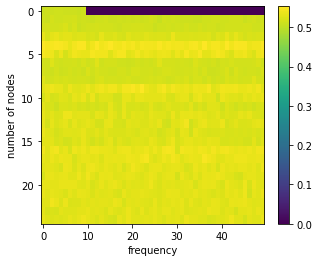

now = 2022-12-01 11:03:25.394000
1211 0.5118221559220356


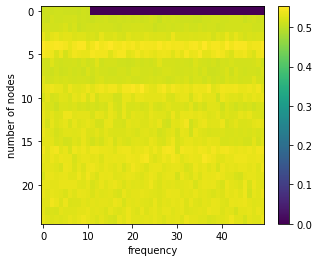

now = 2022-12-01 11:04:47.445975
1212 0.5105803384873121


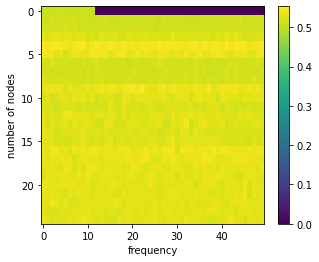

now = 2022-12-01 11:06:12.266768
1213 0.5099964692667927


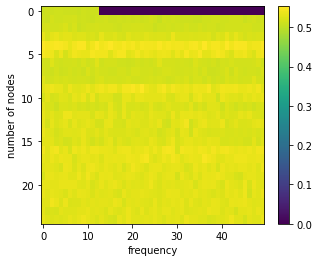

now = 2022-12-01 11:07:33.690490
1214 0.5119798824377366


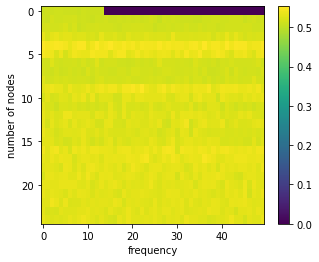

now = 2022-12-01 11:08:54.487880
1215 0.5100343218287701


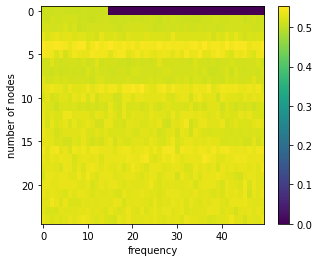

now = 2022-12-01 11:10:15.444267
1216 0.514341005362317


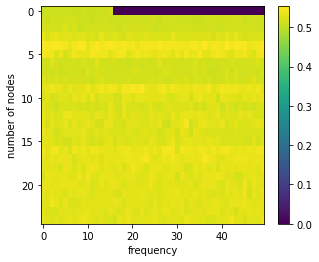

now = 2022-12-01 11:11:34.966774
1217 0.5123032179574291


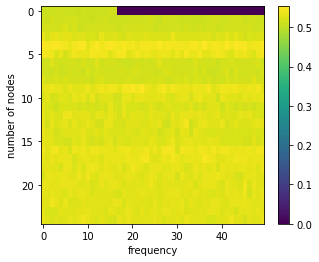

now = 2022-12-01 11:12:55.734374
1218 0.5090470068885963


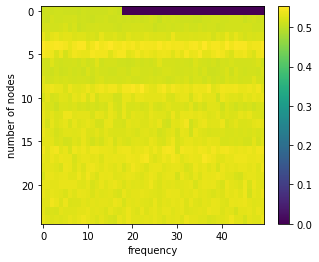

now = 2022-12-01 11:14:17.246163
1219 0.5082182237116604


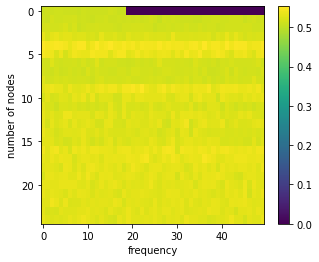

now = 2022-12-01 11:15:39.277142
1220 0.5123826939770894


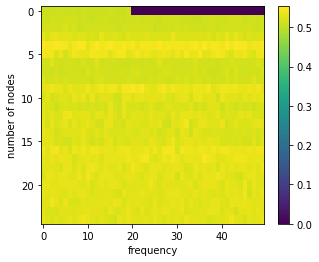

now = 2022-12-01 11:16:59.907246
1221 0.5122709192558652


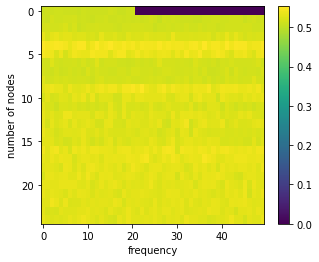

now = 2022-12-01 11:18:22.312604
1222 0.5087006109676605


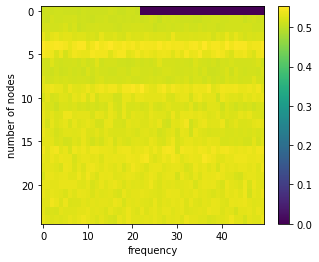

now = 2022-12-01 11:19:44.952114
1223 0.5116208291835989


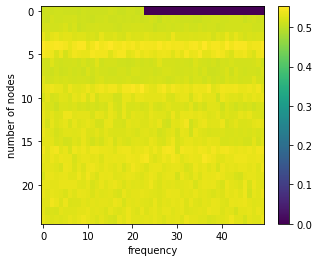

now = 2022-12-01 11:21:06.518994
1224 0.5124680129774385


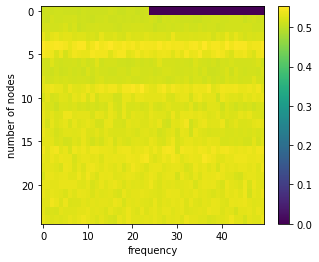

now = 2022-12-01 11:22:29.788194
1225 0.5089887553990626


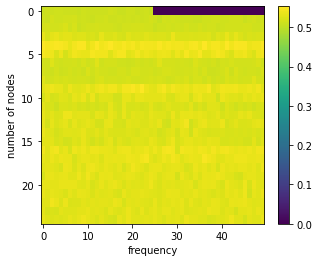

now = 2022-12-01 11:23:51.347572
1226 0.5108504368231235


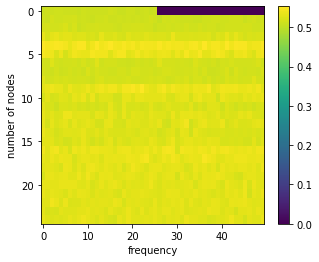

now = 2022-12-01 11:25:12.564744
1227 0.5133360787634624


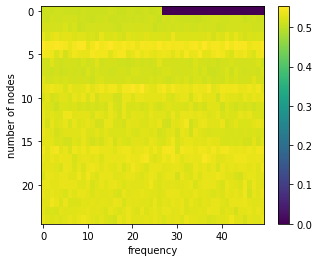

now = 2022-12-01 11:26:33.515925
1228 0.5155611684212331


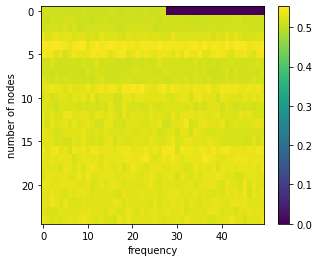

now = 2022-12-01 11:27:54.174783
1229 0.5094426933063064


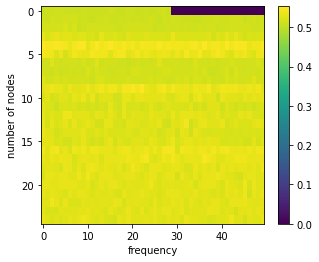

now = 2022-12-01 11:29:15.386324
1230 0.5079357094685771


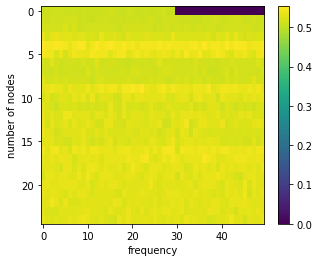

now = 2022-12-01 11:30:36.752383
1231 0.5133910004127178


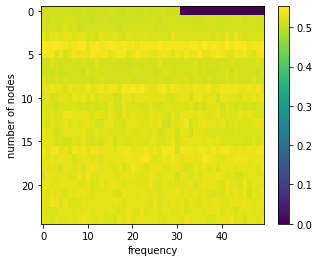

now = 2022-12-01 11:31:57.627010
1232 0.5126418669908351


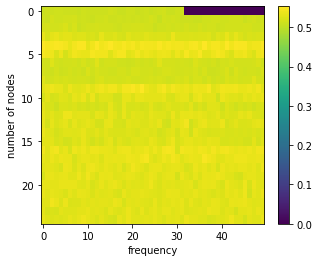

now = 2022-12-01 11:33:19.329865
1233 0.5172722719524101


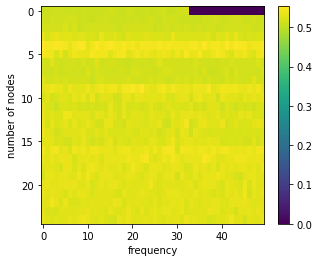

now = 2022-12-01 11:34:38.377915
1234 0.512621909072493


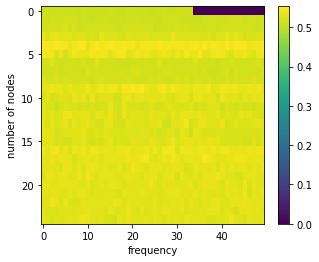

now = 2022-12-01 11:36:01.625381
1235 0.5121239499985425


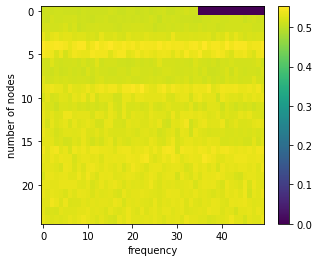

now = 2022-12-01 11:37:25.887918
1236 0.5105549124922687


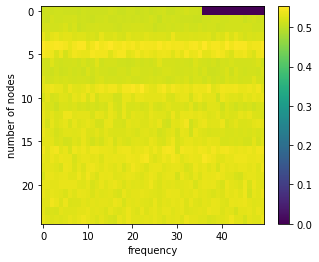

now = 2022-12-01 11:38:48.243547
1237 0.5134576157820259


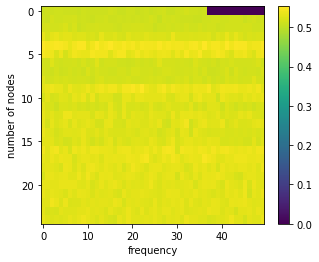

now = 2022-12-01 11:40:11.716313
1238 0.5144787934705289


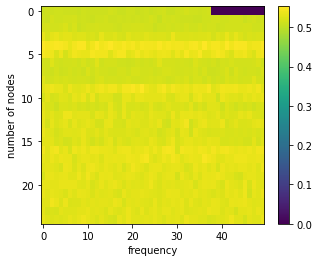

now = 2022-12-01 11:41:36.400024
1239 0.5113521430828188


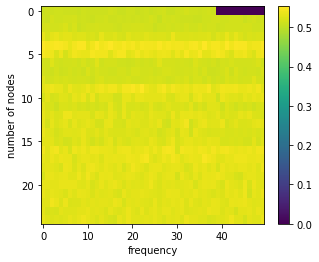

now = 2022-12-01 11:42:59.524292
1240 0.5124554921784946


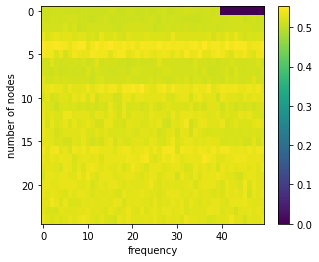

now = 2022-12-01 11:44:25.200736
1241 0.514281821355296


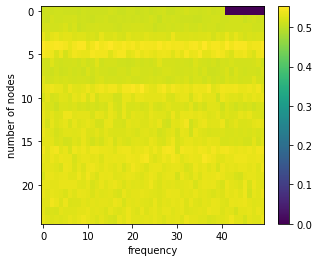

now = 2022-12-01 11:45:50.613036
1242 0.5119273875383115


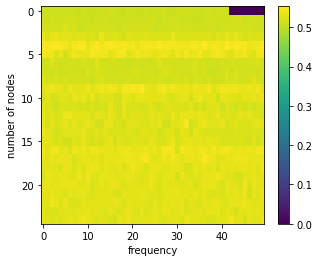

now = 2022-12-01 11:47:14.803375
1243 0.5104354165031043


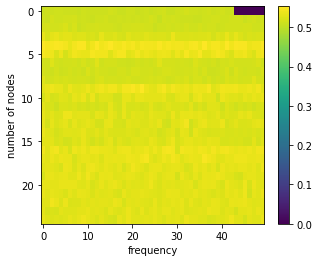

now = 2022-12-01 11:48:39.772992
1244 0.508820404872921


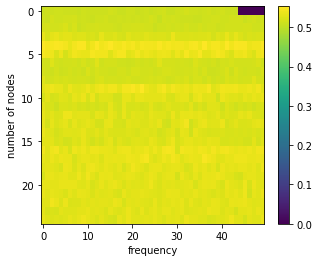

now = 2022-12-01 11:50:04.107518
1245 0.5112842647180048


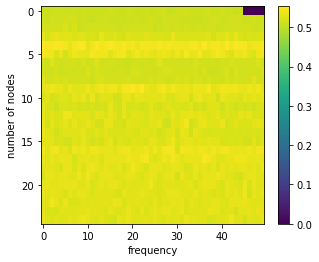

now = 2022-12-01 11:51:26.508576
1246 0.5138759051794085


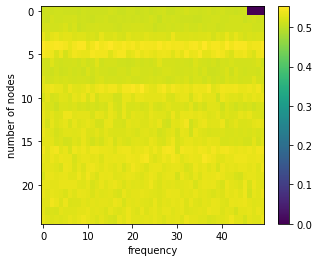

now = 2022-12-01 11:52:37.421157
1247 0.5081270785641212


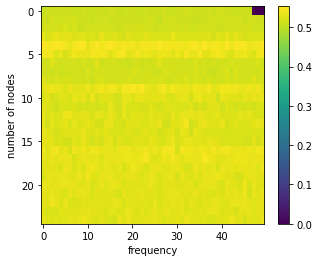

now = 2022-12-01 11:53:49.163171
1248 0.5099374390307332


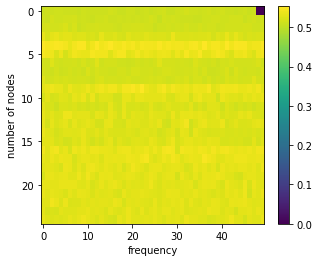

now = 2022-12-01 11:55:00.460457
1249 0.515736023129517


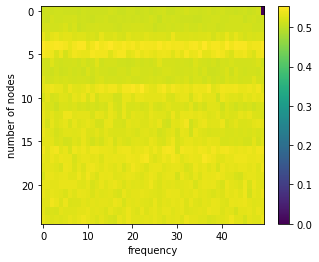

now = 2022-12-01 11:56:09.619014
1250 0.5117038379700262


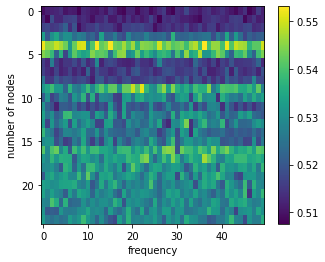

In [47]:

x = []
y = []
from datetime import datetime

# datetime object containing current date and time
now = datetime.now()
 
print("now =", now) 

results_matrix = np.zeros([25,50])
ii = -1
jj = -1
hj=0

for k in range(1,51,2):
  ii = ii+1
  jj=-1
  for o in range(1, 100, 2):
    jj = jj+1
    for i in range(1):
      nof = k
      n = 200
      d=[]
      LIF = LIF_Network(n_neurons=n)
      dt = LIF.dt

      T = 300000
      I = np.zeros(shape = [T,n])
      # add impulses to the outside actvity
      stim = np.zeros([T,nof]) 
      ConnStimNetwork = np.zeros([nof,n])
      probability = 0.2

      for c in range(n):
        for c2 in range(nof):
          Q = np.random.randint(0, high=99)
          if Q/100 < probability:
            ConnStimNetwork[c2,c] = 1

      stimorder = np.arange(nof)
      np.random.shuffle(stimorder)

      freq = o
      num = int((T/freq)/dt)
      stim_length = int(T/nof)

      for j in range(0,nof):
        for i in range(j*stim_length,(j+1)*stim_length,num): 
          if i<T:
            stim[i][stimorder[j]] = 1 
            I[i] [ConnStimNetwork[j,:]>0] = 1

      %matplotlib inline
      fig = plt.figure()
      #fig.set_size_inches(22, 15)
      #ax = fig.add_subplot()
      #plt.imshow(I.T,aspect='equal',interpolation='none')
      #ax.set_aspect('auto')
      #plt.ylabel('Neuron index')
      #plt.xlabel('Connectivity to other neurons')
      #plt.title('Connectivity map')
      #plt.colorbar()
      #plt.show()

      W1 = np.copy(LIF.network_W)
      mean_W1 = np.mean(W1[W1 > 0].flatten())

      plotter2(LIF,T*dt, I, pN = 5)

      W2 = np.copy(LIF.network_W)
      mean_W2 = np.mean(W2[W1 > 0].flatten())

      mean_W3 = mean_W2-mean_W1
      d.append(mean_W3)
      now = datetime.now()
      print("now =", now)

    #print(o,  mean_W3)
    h=sum(d) / len(d)
    x.append(o)
    y.append(h)
    results_matrix[ii][jj]=mean_W2
    #print(results_matrix)
    #print(o)
    #plt.plot(x,y)
    #plt.show()
    hj = hj+1
    print(hj, mean_W2)
    
    %matplotlib inline
    fig = plt.figure()
    fig.set_size_inches(5, 4)
    ax = fig.add_subplot()
    plt.imshow(np.flipud(results_matrix),aspect='equal',interpolation='none', cmap='jet')
    plt.colorbar()
    ax.set_aspect('auto')
    plt.ylabel('number of nodes')
    plt.xlabel('frequency')
    plt.show()

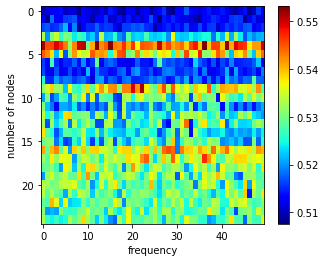

In [49]:
%matplotlib inline
fig = plt.figure()
fig.set_size_inches(5, 4)
ax = fig.add_subplot()
plt.imshow(np.flipud(results_matrix),aspect='equal',interpolation='none', cmap='jet')
plt.colorbar()
ax.set_aspect('auto')
plt.ylabel('number of nodes')
plt.xlabel('frequency')
plt.show()

1 0.5061378671962152


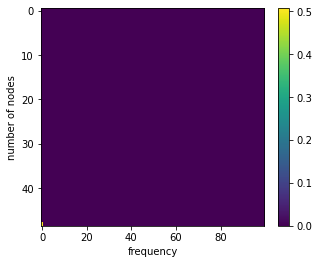

1 0.5294587887194612


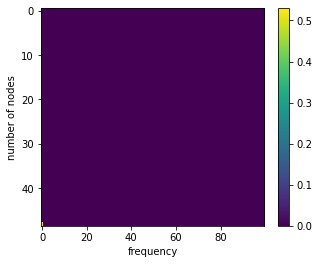

In [19]:
x = []
y = []

results_matrix = np.zeros([49,100])
ii = -1
jj = -1
hj=0

for k in range(45,46,1):
  ii = ii+1
  jj=-1
  for o in range(25,26,1):
    jj = jj+1
    for i in range(1):
      nof = k
      n = 200
      d=[]
      LIF = LIF_Network(n_neurons=n)
      dt = LIF.dt

      T = 100000
      I = np.zeros(shape = [T,n])
      # add impulses to the outside actvity
      stim = np.zeros([T,nof]) 
      ConnStimNetwork = np.zeros([nof,n])
      probability = 0.2

      for c in range(n):
        for c2 in range(nof):
          Q = np.random.randint(0, high=99)
          if Q/100 < probability:
            ConnStimNetwork[c2,c] = 1

      stimorder = np.arange(nof)
      np.random.shuffle(stimorder)

      freq = o
      num = int((T/freq)/dt)
      stim_length = int(T/nof)

      for j in range(0,nof):
        for i in range(j*stim_length,(j+1)*stim_length,num): 
          if i<T:
            stim[i][stimorder[j]] = 1 
            I[i] [ConnStimNetwork[j,:]>0] = 1

      %matplotlib inline
      fig = plt.figure()
      #fig.set_size_inches(22, 15)
      #ax = fig.add_subplot()
      #plt.imshow(I.T,aspect='equal',interpolation='none')
      #ax.set_aspect('auto')
      #plt.ylabel('Neuron index')
      #plt.xlabel('Connectivity to other neurons')
      #plt.title('Connectivity map')
      #plt.colorbar()
      #plt.show()

      W1 = np.copy(LIF.network_W)
      mean_W1 = np.mean(W1[W1 > 0].flatten())

      plotter2(LIF,T*dt, I, pN = 5)

      W2 = np.copy(LIF.network_W)
      mean_W2 = np.mean(W2[W1 > 0].flatten())

      mean_W3 = mean_W2-mean_W1
      d.append(mean_W3)

    #print(o,  mean_W3)
    h=sum(d) / len(d)
    x.append(o)
    y.append(h)
    results_matrix[ii][jj]=mean_W2
    #print(results_matrix)
    #print(o)
    #plt.plot(x,y)
    #plt.show()
    hj = hj+1
    print(hj, mean_W2)
  %matplotlib inline
  fig = plt.figure()
  fig.set_size_inches(5, 4)
  ax = fig.add_subplot()
  plt.imshow(np.flipud(results_matrix),aspect='equal',interpolation='none')
  plt.colorbar()
  ax.set_aspect('auto')
  plt.ylabel('number of nodes')
  plt.xlabel('frequency')
  plt.show()

<Figure size 432x288 with 0 Axes>

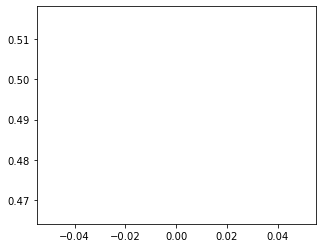

<Figure size 432x288 with 0 Axes>

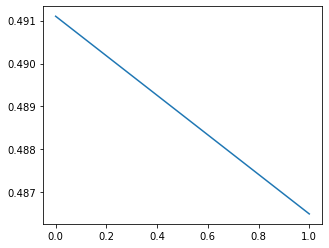

<Figure size 432x288 with 0 Axes>

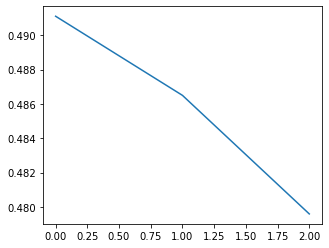

<Figure size 432x288 with 0 Axes>

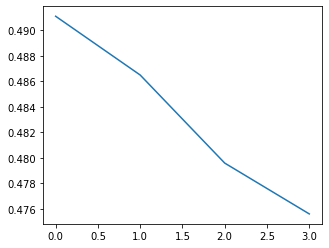

<Figure size 432x288 with 0 Axes>

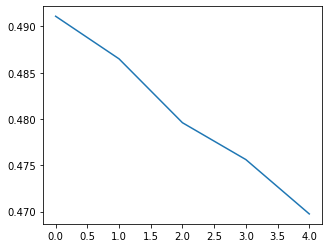

<Figure size 432x288 with 0 Axes>

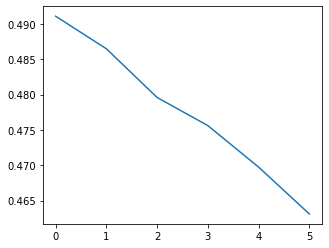

<Figure size 432x288 with 0 Axes>

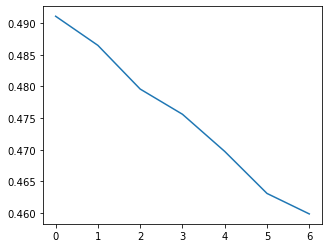

<Figure size 432x288 with 0 Axes>

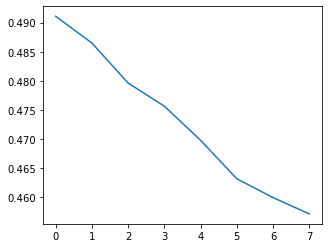

<Figure size 432x288 with 0 Axes>

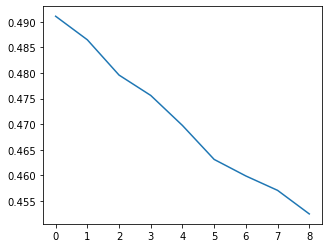

<Figure size 432x288 with 0 Axes>

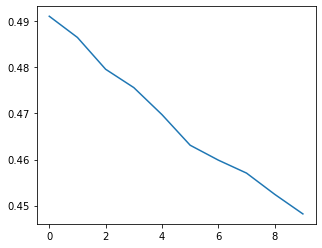

<Figure size 432x288 with 0 Axes>

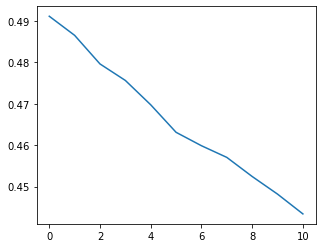

<Figure size 432x288 with 0 Axes>

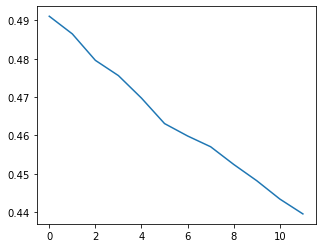

<Figure size 432x288 with 0 Axes>

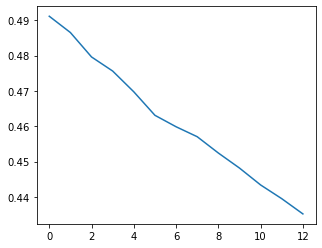

<Figure size 432x288 with 0 Axes>

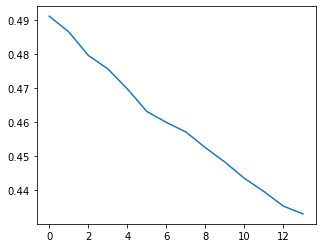

<Figure size 432x288 with 0 Axes>

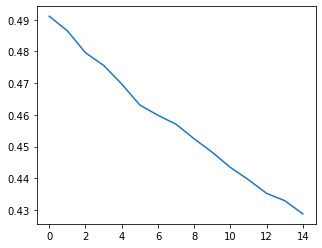

<Figure size 432x288 with 0 Axes>

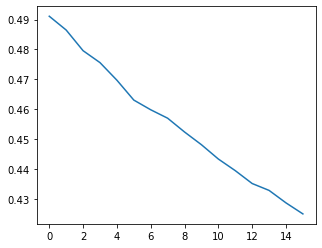

<Figure size 432x288 with 0 Axes>

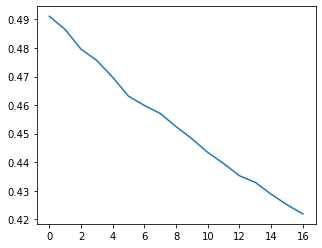

<Figure size 432x288 with 0 Axes>

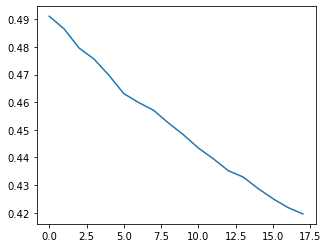

<Figure size 432x288 with 0 Axes>

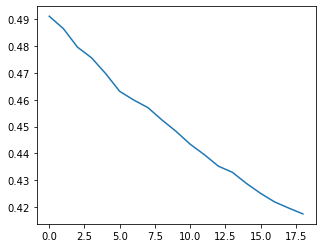

<Figure size 432x288 with 0 Axes>

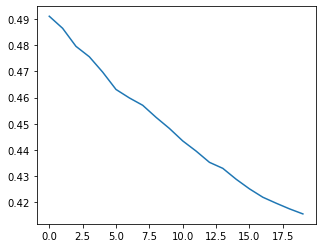

<Figure size 432x288 with 0 Axes>

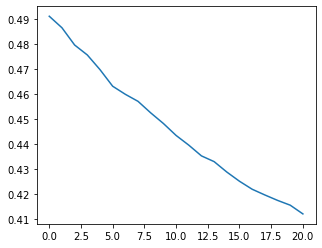

<Figure size 432x288 with 0 Axes>

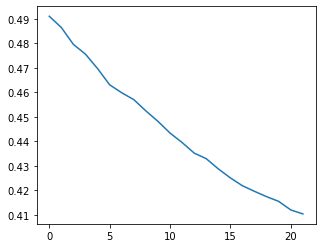

<Figure size 432x288 with 0 Axes>

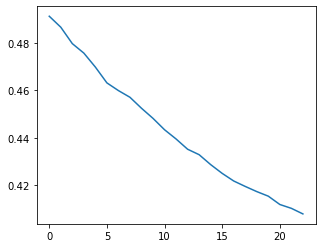

<Figure size 432x288 with 0 Axes>

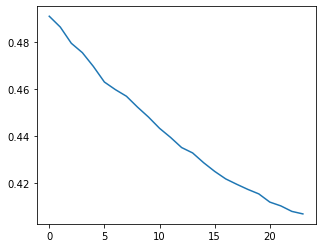

<Figure size 432x288 with 0 Axes>

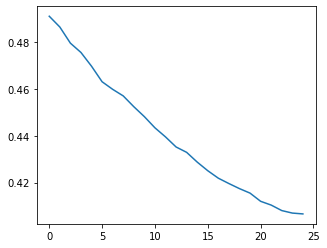

<Figure size 432x288 with 0 Axes>

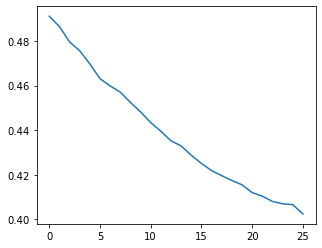

<Figure size 432x288 with 0 Axes>

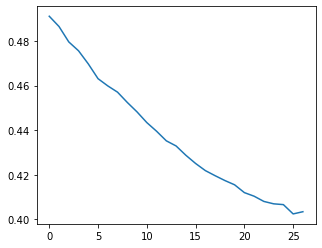

<Figure size 432x288 with 0 Axes>

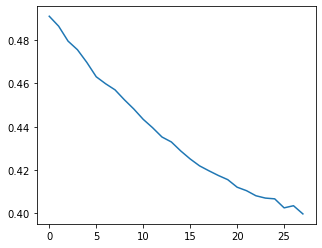

<Figure size 432x288 with 0 Axes>

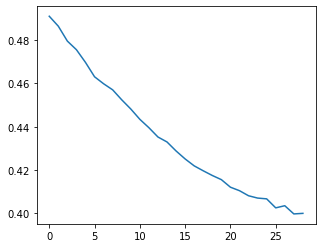

<Figure size 432x288 with 0 Axes>

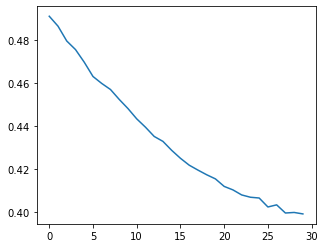

<Figure size 432x288 with 0 Axes>

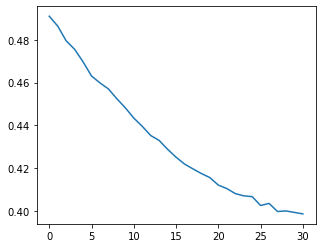

<Figure size 432x288 with 0 Axes>

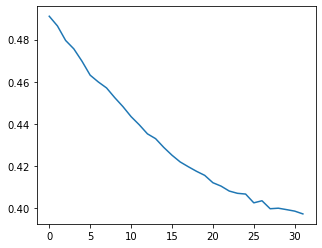

<Figure size 432x288 with 0 Axes>

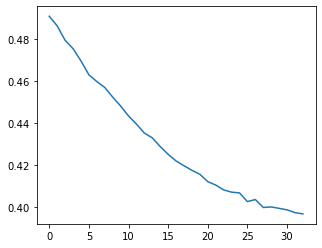

<Figure size 432x288 with 0 Axes>

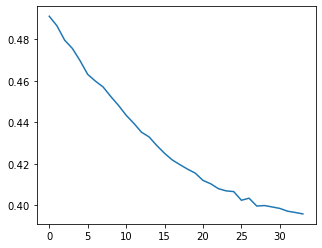

<Figure size 432x288 with 0 Axes>

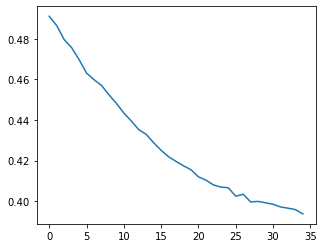

<Figure size 432x288 with 0 Axes>

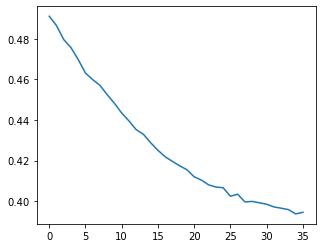

<Figure size 432x288 with 0 Axes>

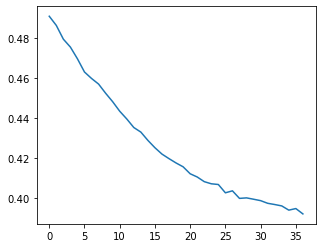

<Figure size 432x288 with 0 Axes>

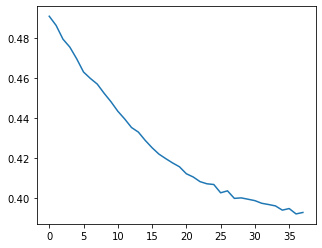

<Figure size 432x288 with 0 Axes>

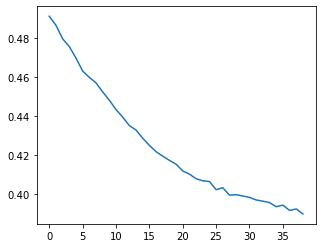

<Figure size 432x288 with 0 Axes>

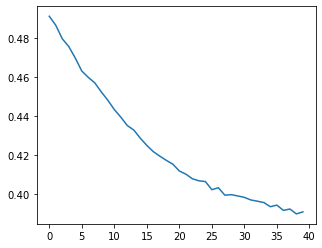

<Figure size 432x288 with 0 Axes>

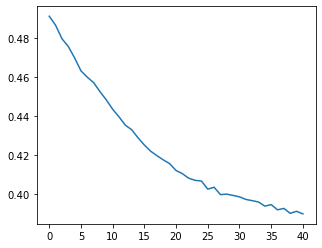

<Figure size 432x288 with 0 Axes>

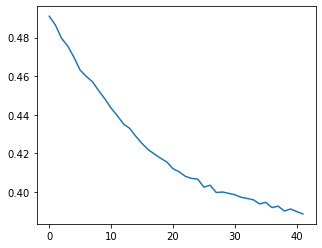

<Figure size 432x288 with 0 Axes>

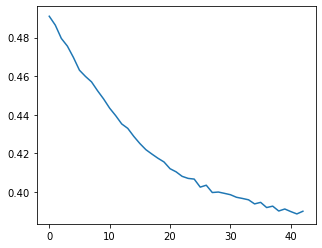

<Figure size 432x288 with 0 Axes>

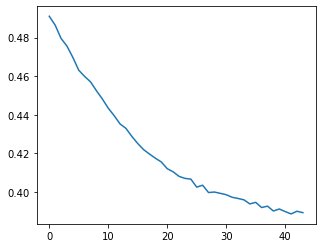

<Figure size 432x288 with 0 Axes>

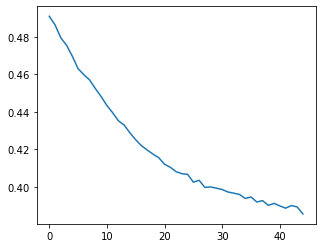

<Figure size 432x288 with 0 Axes>

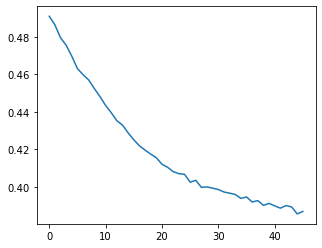

<Figure size 432x288 with 0 Axes>

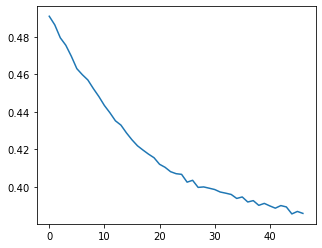

<Figure size 432x288 with 0 Axes>

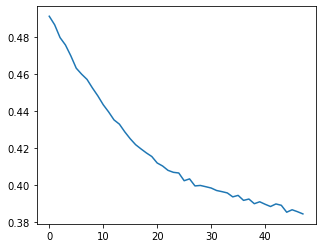

<Figure size 432x288 with 0 Axes>

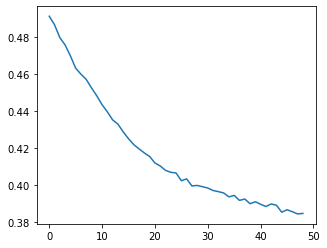

<Figure size 432x288 with 0 Axes>

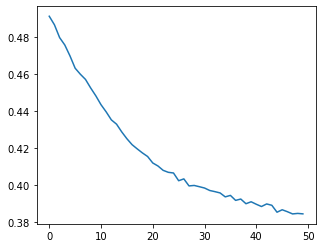

<Figure size 432x288 with 0 Axes>

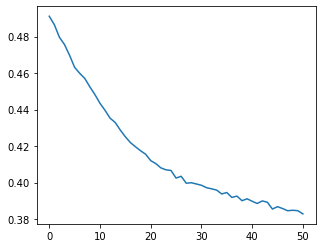

<Figure size 432x288 with 0 Axes>

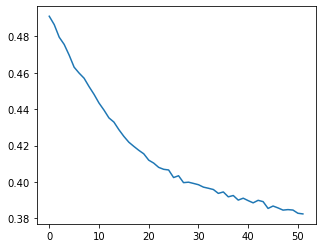

<Figure size 432x288 with 0 Axes>

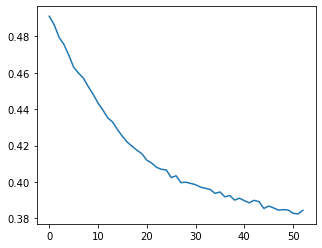

<Figure size 432x288 with 0 Axes>

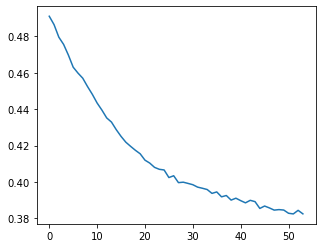

<Figure size 432x288 with 0 Axes>

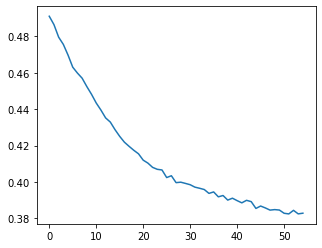

<Figure size 432x288 with 0 Axes>

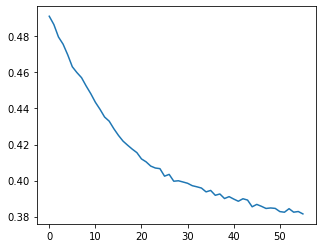

<Figure size 432x288 with 0 Axes>

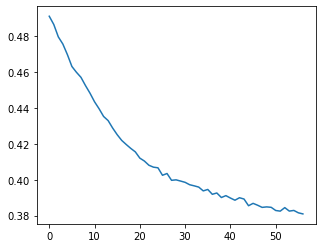

<Figure size 432x288 with 0 Axes>

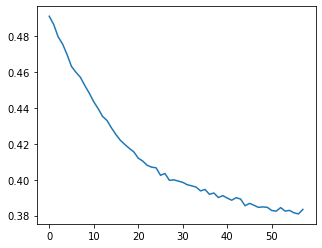

<Figure size 432x288 with 0 Axes>

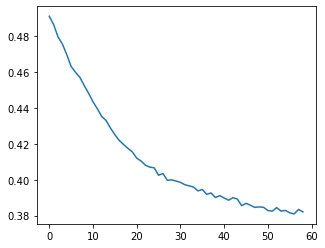

<Figure size 432x288 with 0 Axes>

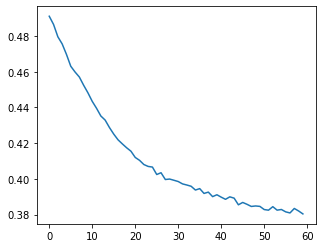

<Figure size 432x288 with 0 Axes>

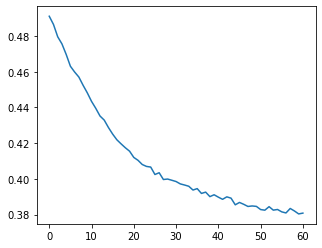

<Figure size 432x288 with 0 Axes>

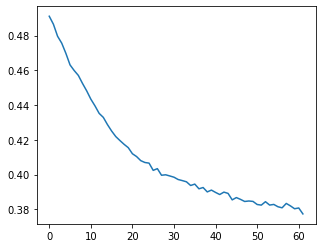

<Figure size 432x288 with 0 Axes>

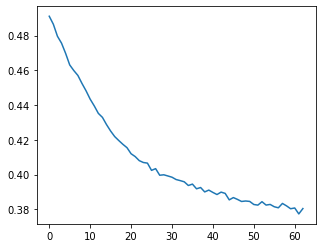

<Figure size 432x288 with 0 Axes>

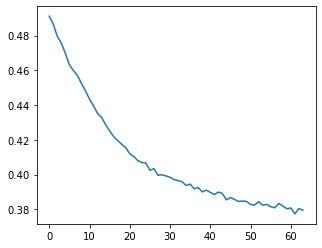

<Figure size 432x288 with 0 Axes>

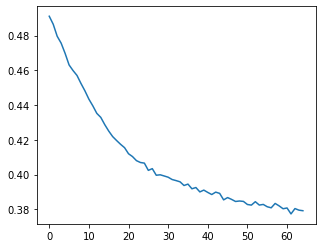

<Figure size 432x288 with 0 Axes>

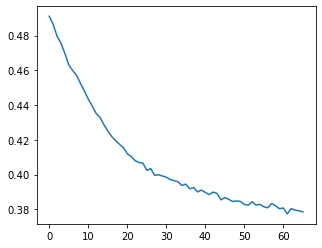

<Figure size 432x288 with 0 Axes>

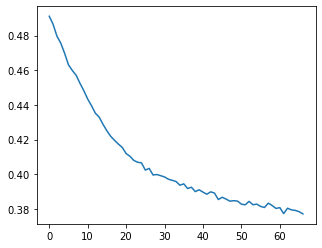

<Figure size 432x288 with 0 Axes>

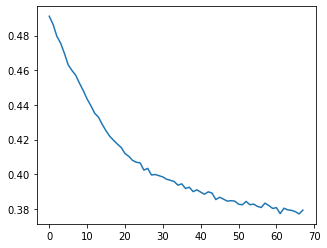

<Figure size 432x288 with 0 Axes>

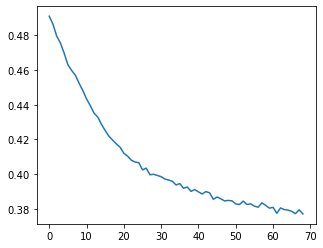

<Figure size 432x288 with 0 Axes>

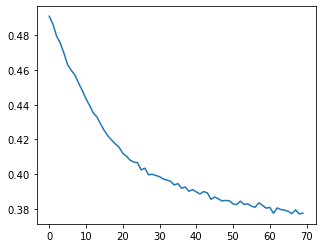

<Figure size 432x288 with 0 Axes>

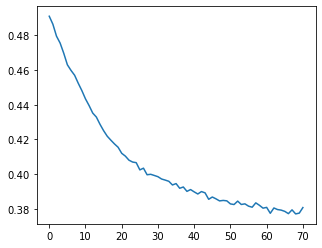

<Figure size 432x288 with 0 Axes>

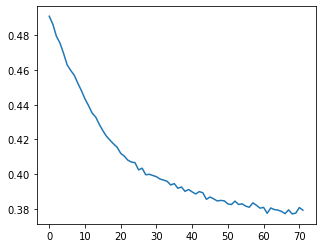

<Figure size 432x288 with 0 Axes>

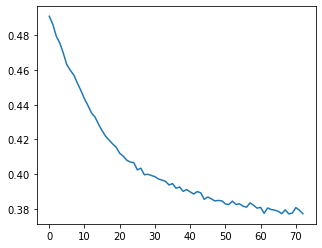

<Figure size 432x288 with 0 Axes>

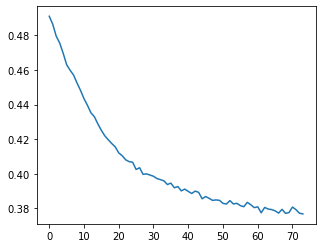

<Figure size 432x288 with 0 Axes>

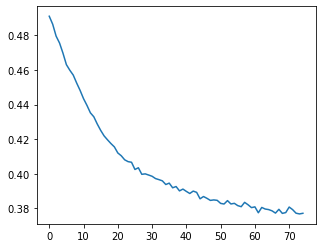

<Figure size 432x288 with 0 Axes>

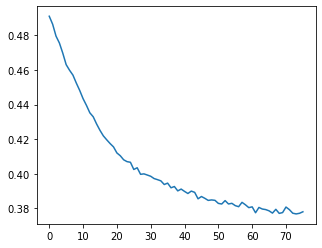

<Figure size 432x288 with 0 Axes>

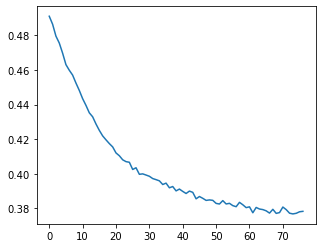

<Figure size 432x288 with 0 Axes>

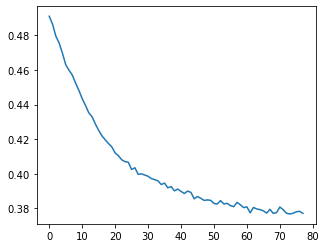

<Figure size 432x288 with 0 Axes>

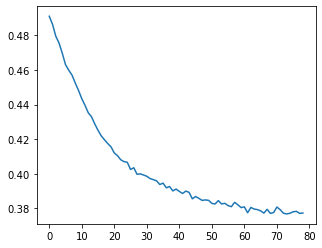

<Figure size 432x288 with 0 Axes>

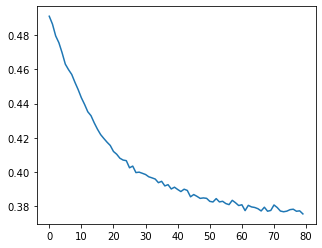

<Figure size 432x288 with 0 Axes>

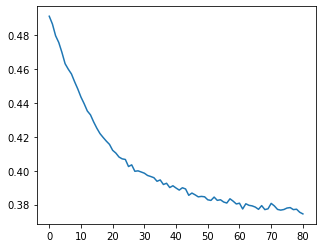

<Figure size 432x288 with 0 Axes>

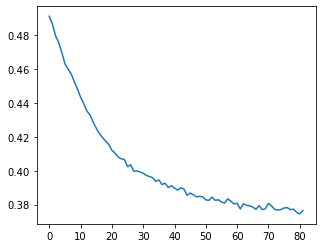

<Figure size 432x288 with 0 Axes>

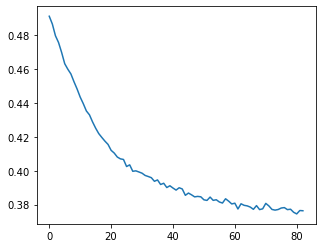

<Figure size 432x288 with 0 Axes>

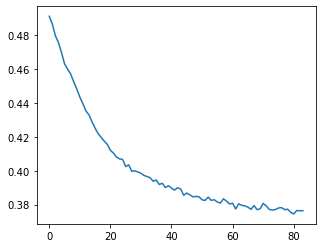

<Figure size 432x288 with 0 Axes>

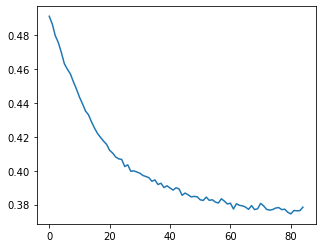

<Figure size 432x288 with 0 Axes>

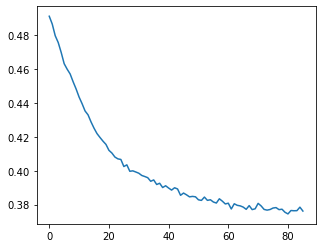

<Figure size 432x288 with 0 Axes>

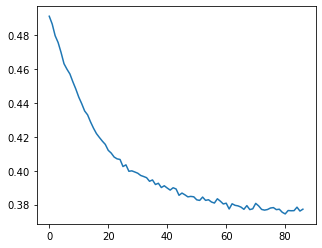

<Figure size 432x288 with 0 Axes>

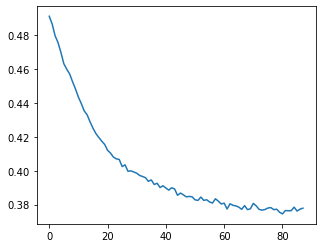

<Figure size 432x288 with 0 Axes>

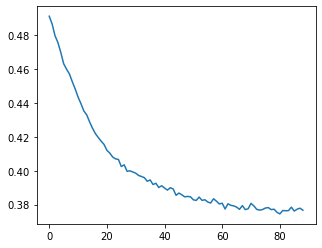

<Figure size 432x288 with 0 Axes>

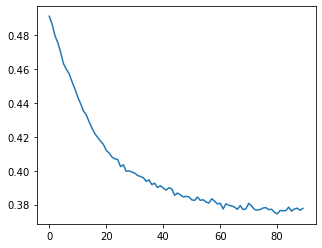

<Figure size 432x288 with 0 Axes>

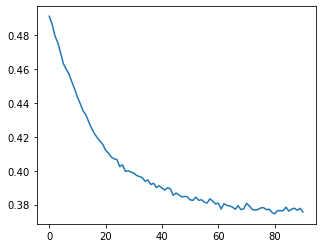

<Figure size 432x288 with 0 Axes>

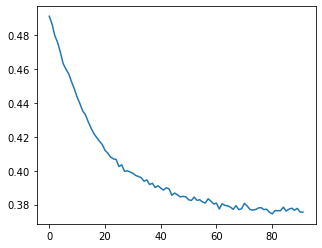

<Figure size 432x288 with 0 Axes>

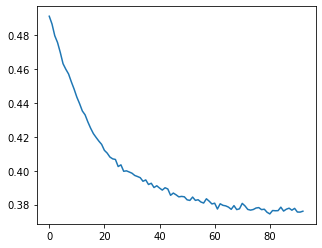

<Figure size 432x288 with 0 Axes>

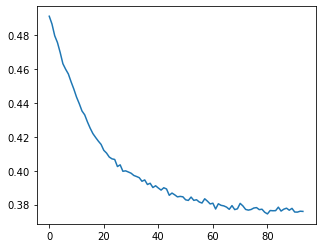

<Figure size 432x288 with 0 Axes>

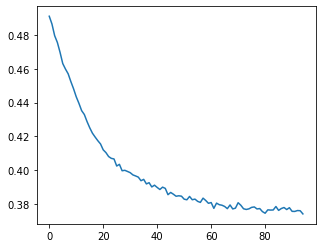

<Figure size 432x288 with 0 Axes>

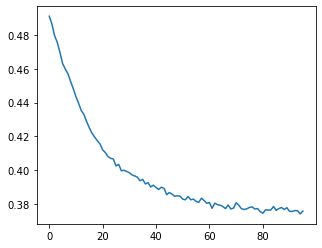

<Figure size 432x288 with 0 Axes>

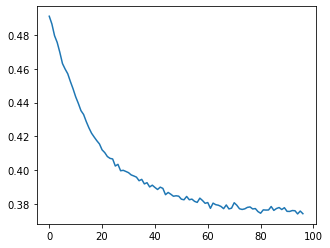

<Figure size 432x288 with 0 Axes>

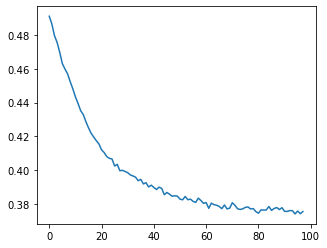

<Figure size 432x288 with 0 Axes>

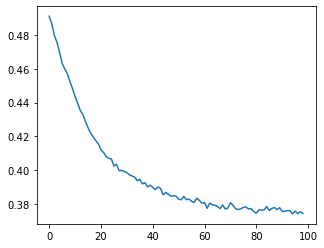

<Figure size 432x288 with 0 Axes>

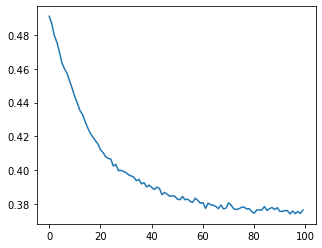

<Figure size 432x288 with 0 Axes>

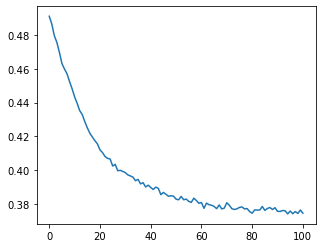

<Figure size 432x288 with 0 Axes>

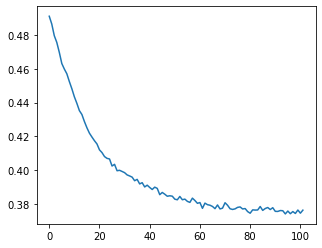

<Figure size 432x288 with 0 Axes>

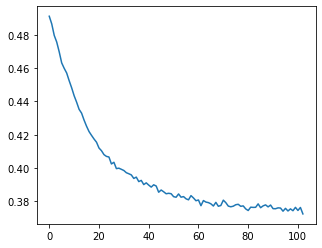

<Figure size 432x288 with 0 Axes>

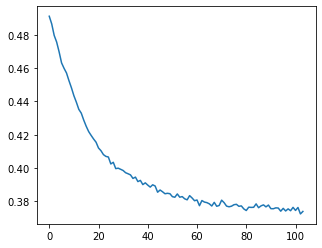

<Figure size 432x288 with 0 Axes>

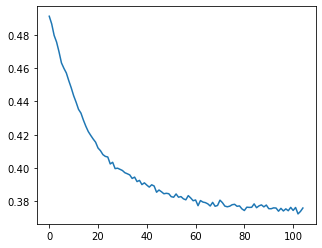

<Figure size 432x288 with 0 Axes>

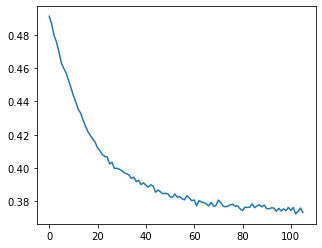

<Figure size 432x288 with 0 Axes>

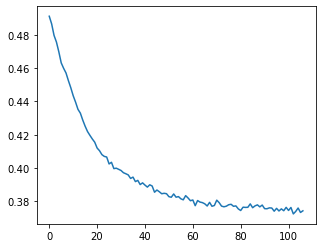

<Figure size 432x288 with 0 Axes>

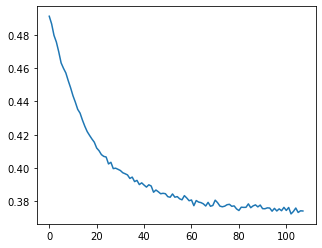

<Figure size 432x288 with 0 Axes>

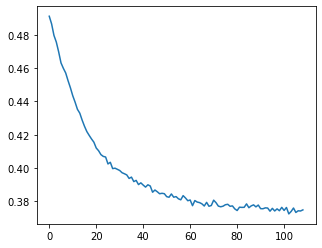

<Figure size 432x288 with 0 Axes>

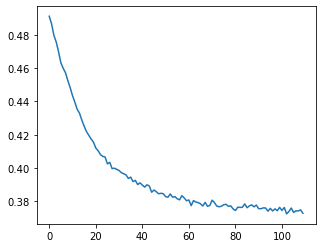

<Figure size 432x288 with 0 Axes>

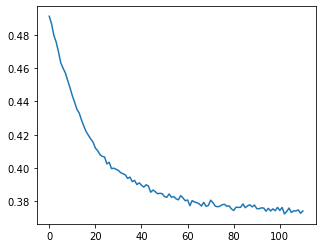

<Figure size 432x288 with 0 Axes>

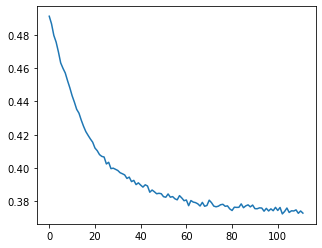

<Figure size 432x288 with 0 Axes>

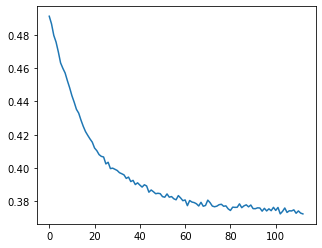

<Figure size 432x288 with 0 Axes>

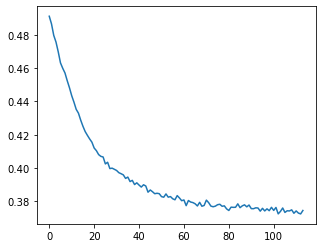

<Figure size 432x288 with 0 Axes>

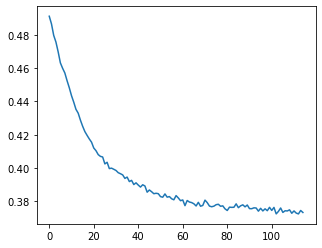

<Figure size 432x288 with 0 Axes>

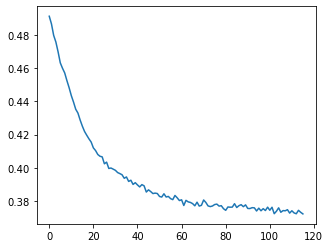

<Figure size 432x288 with 0 Axes>

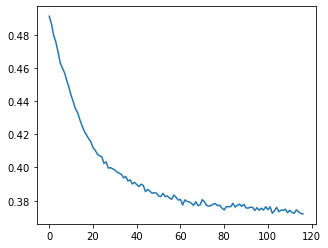

<Figure size 432x288 with 0 Axes>

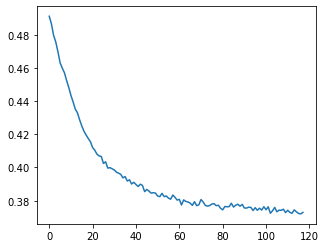

<Figure size 432x288 with 0 Axes>

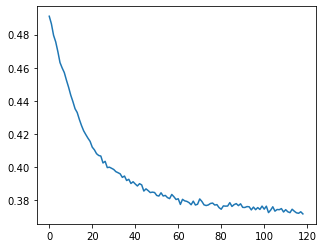

<Figure size 432x288 with 0 Axes>

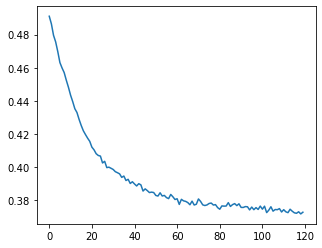

<Figure size 432x288 with 0 Axes>

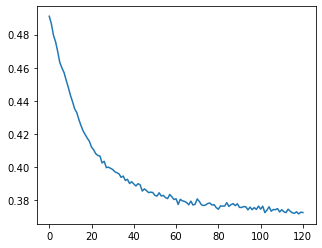

<Figure size 432x288 with 0 Axes>

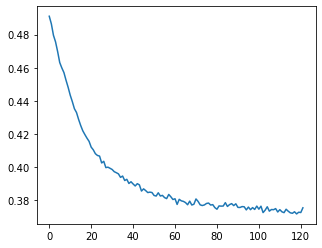

<Figure size 432x288 with 0 Axes>

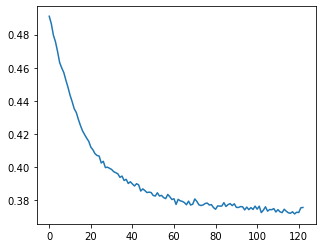

<Figure size 432x288 with 0 Axes>

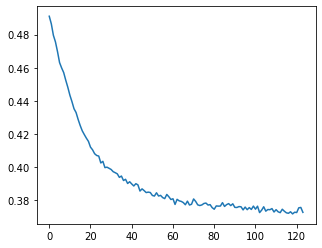

<Figure size 432x288 with 0 Axes>

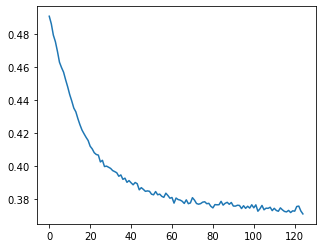

<Figure size 432x288 with 0 Axes>

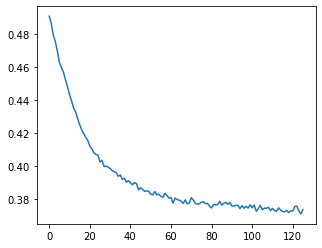

<Figure size 432x288 with 0 Axes>

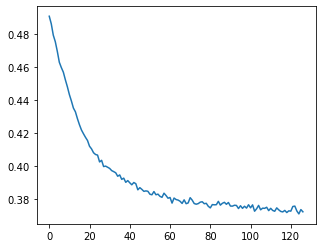

<Figure size 432x288 with 0 Axes>

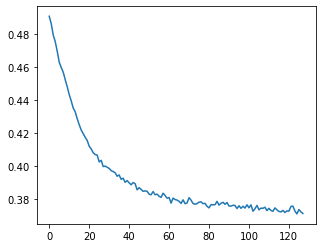

<Figure size 432x288 with 0 Axes>

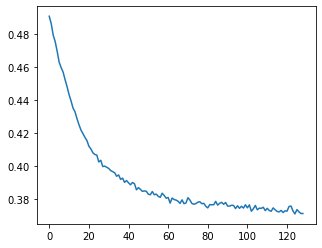

<Figure size 432x288 with 0 Axes>

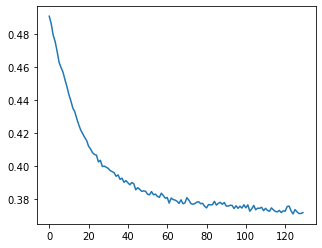

<Figure size 432x288 with 0 Axes>

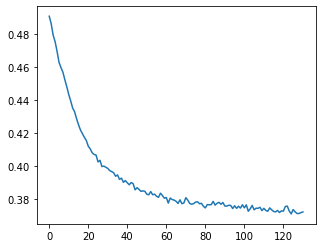

<Figure size 432x288 with 0 Axes>

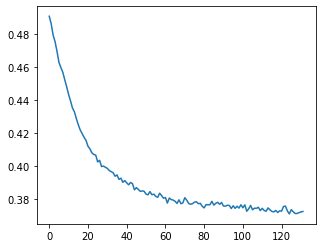

<Figure size 432x288 with 0 Axes>

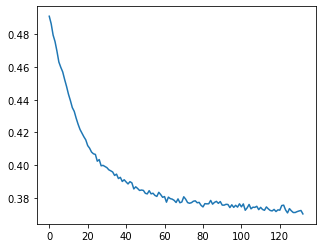

<Figure size 432x288 with 0 Axes>

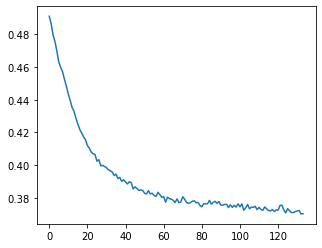

<Figure size 432x288 with 0 Axes>

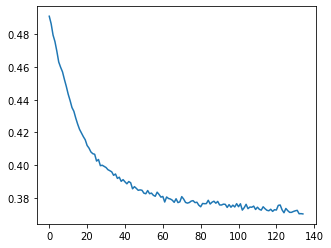

<Figure size 432x288 with 0 Axes>

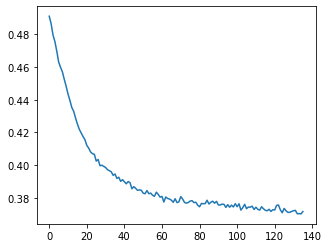

<Figure size 432x288 with 0 Axes>

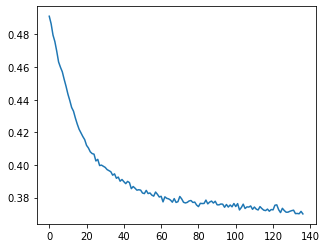

<Figure size 432x288 with 0 Axes>

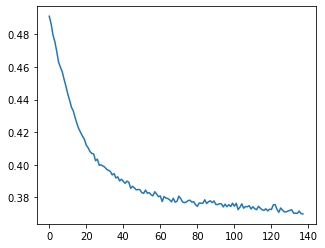

<Figure size 432x288 with 0 Axes>

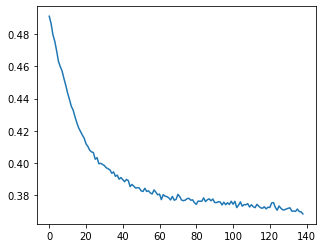

<Figure size 432x288 with 0 Axes>

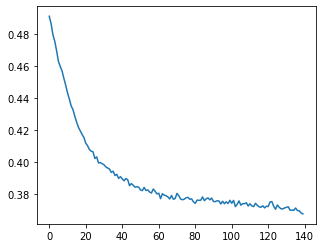

<Figure size 432x288 with 0 Axes>

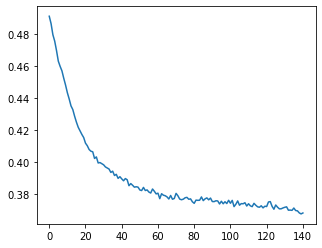

<Figure size 432x288 with 0 Axes>

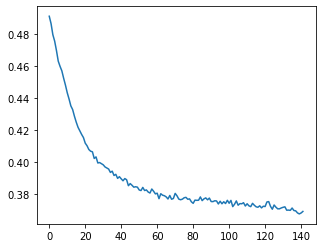

<Figure size 432x288 with 0 Axes>

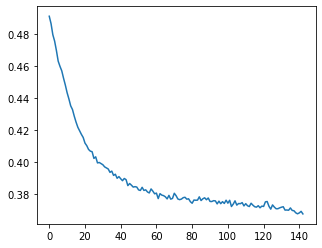

<Figure size 432x288 with 0 Axes>

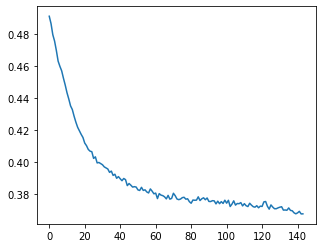

<Figure size 432x288 with 0 Axes>

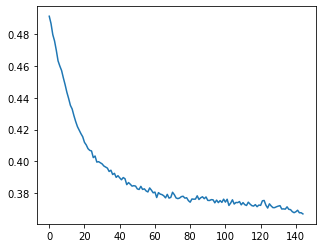

<Figure size 432x288 with 0 Axes>

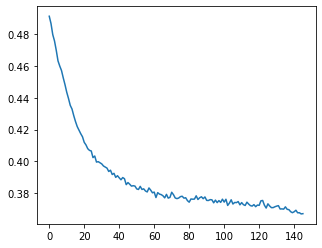

<Figure size 432x288 with 0 Axes>

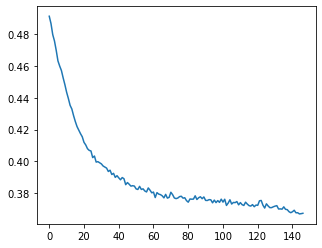

<Figure size 432x288 with 0 Axes>

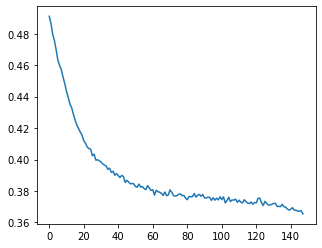

<Figure size 432x288 with 0 Axes>

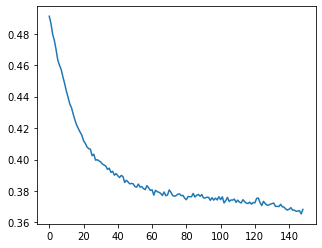

<Figure size 432x288 with 0 Axes>

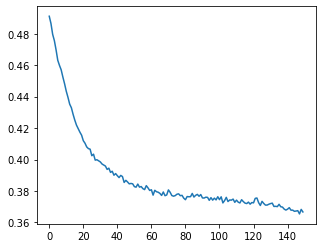

<Figure size 432x288 with 0 Axes>

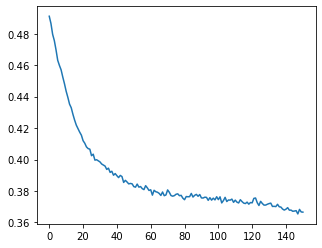

<Figure size 432x288 with 0 Axes>

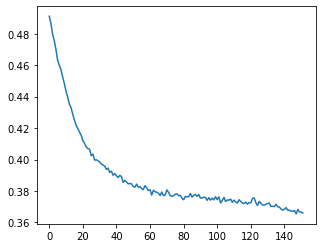

<Figure size 432x288 with 0 Axes>

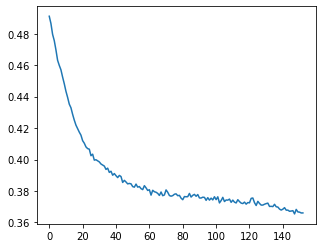

<Figure size 432x288 with 0 Axes>

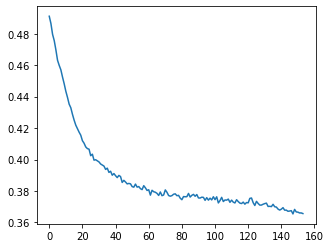

<Figure size 432x288 with 0 Axes>

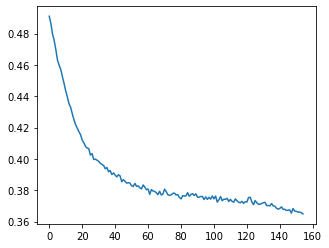

<Figure size 432x288 with 0 Axes>

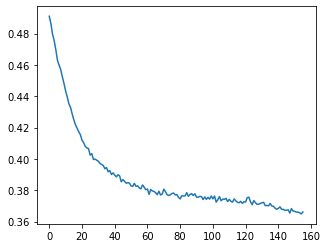

<Figure size 432x288 with 0 Axes>

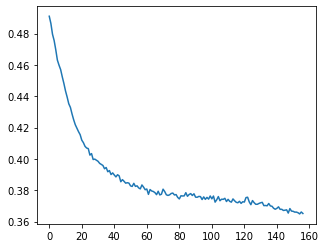

<Figure size 432x288 with 0 Axes>

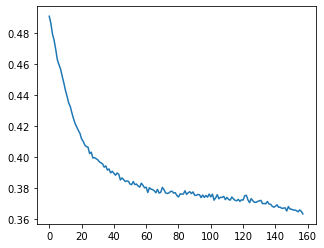

<Figure size 432x288 with 0 Axes>

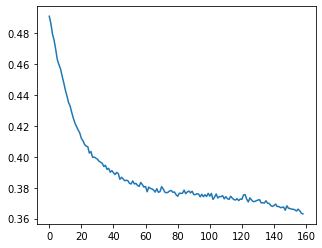

<Figure size 432x288 with 0 Axes>

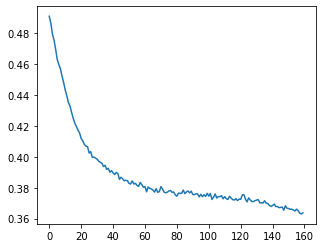

<Figure size 432x288 with 0 Axes>

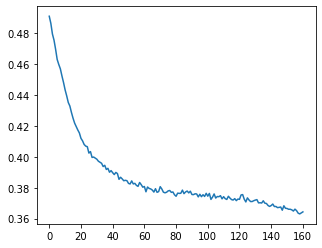

<Figure size 432x288 with 0 Axes>

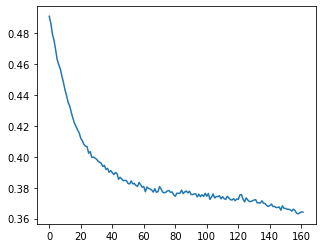

<Figure size 432x288 with 0 Axes>

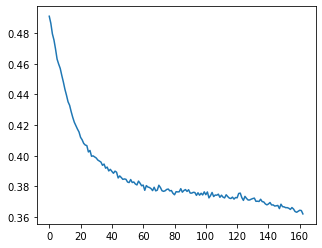

<Figure size 432x288 with 0 Axes>

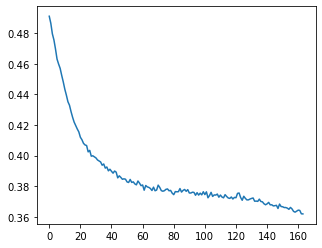

<Figure size 432x288 with 0 Axes>

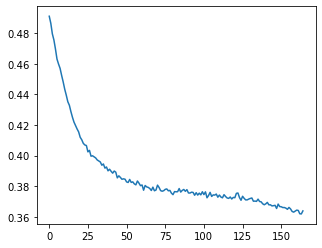

<Figure size 432x288 with 0 Axes>

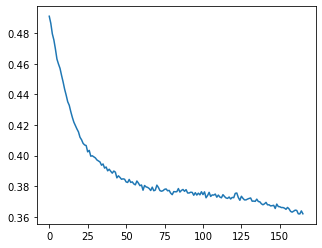

<Figure size 432x288 with 0 Axes>

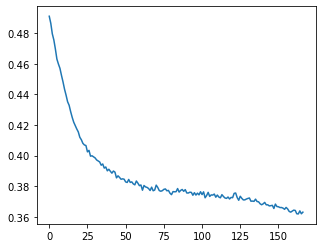

<Figure size 432x288 with 0 Axes>

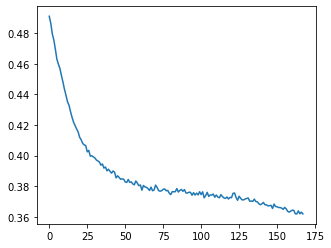

<Figure size 432x288 with 0 Axes>

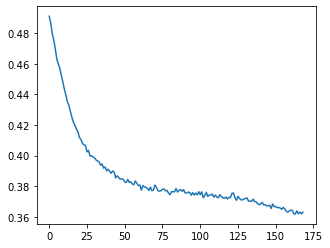

<Figure size 432x288 with 0 Axes>

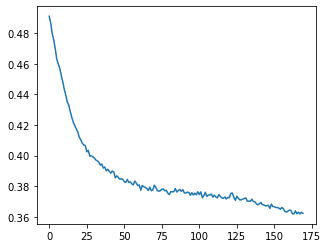

<Figure size 432x288 with 0 Axes>

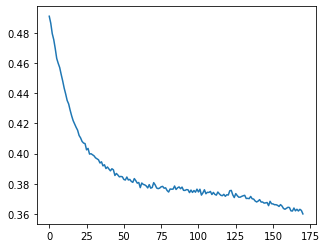

<Figure size 432x288 with 0 Axes>

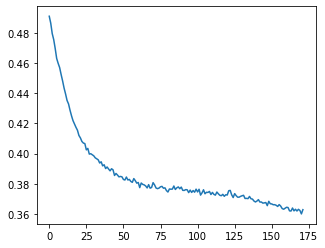

<Figure size 432x288 with 0 Axes>

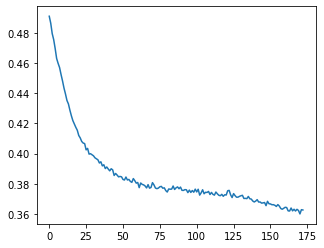

<Figure size 432x288 with 0 Axes>

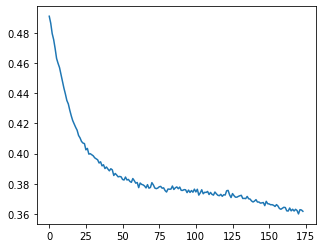

<Figure size 432x288 with 0 Axes>

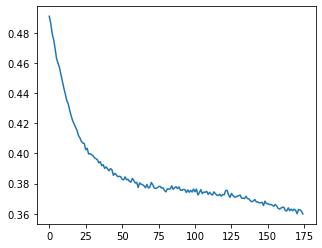

<Figure size 432x288 with 0 Axes>

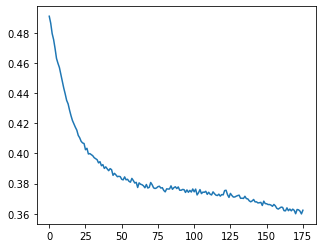

<Figure size 432x288 with 0 Axes>

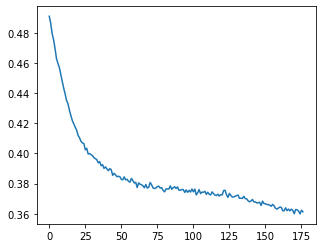

<Figure size 432x288 with 0 Axes>

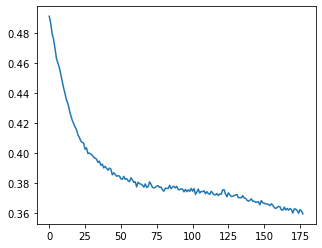

<Figure size 432x288 with 0 Axes>

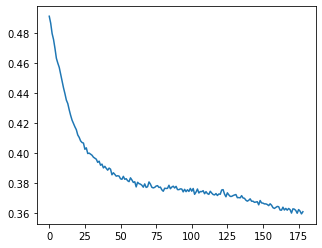

<Figure size 432x288 with 0 Axes>

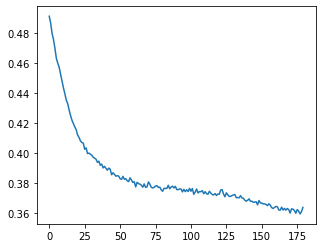

<Figure size 432x288 with 0 Axes>

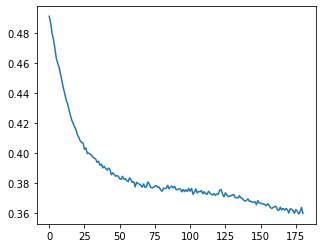

<Figure size 432x288 with 0 Axes>

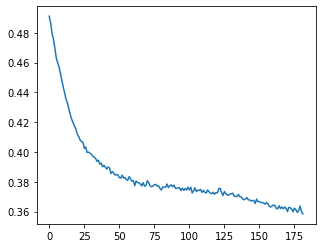

<Figure size 432x288 with 0 Axes>

KeyboardInterrupt: 

In [41]:
x = []
y = []

results_matrix = np.zeros([49,100])
ii = -1
jj = -1
hj=0

for k in range(45,46,1):
    ii = ii+1
    jj=-1
    for o in range(25,26,1):
        jj = jj+1
        for i in range(1):
            nof = k
            n = 200
            d=[]
            c=[]
            LIF = LIF_Network(n_neurons=n)
            dt = LIF.dt

            T = 5000
            I = np.zeros(shape = [T,n])
            # add impulses to the outside actvity
            stim = np.zeros([T,nof]) 
            ConnStimNetwork = np.zeros([nof,n])
            probability = 0.2

            for c in range(n):
                for c2 in range(nof):
                    Q = np.random.randint(0, high=99)
                    if Q/100 < probability:
                        ConnStimNetwork[c2,c] = 1

            stimorder = np.arange(nof)
            np.random.shuffle(stimorder)

            freq = o
            num = int((T/freq)/dt)
            stim_length = int(T/nof)

            for j in range(0,nof):
                for i in range(j*stim_length,(j+1)*stim_length,num): 
                    if i<T:
                        stim[i][stimorder[j]] = 1 
                        I[i] [ConnStimNetwork[j,:]>0] = 1

            %matplotlib inline
            fig = plt.figure()
            #fig.set_size_inches(22, 15)
            #ax = fig.add_subplot()
          #plt.imshow(I.T,aspect='equal',interpolation='none')
          #ax.set_aspect('auto')
          #plt.ylabel('Neuron index')
          #plt.xlabel('Connectivity to other neurons')
          #plt.title('Connectivity map')
          #plt.colorbar()
          #plt.show()
            c=[]
            f=[]
            for simcount in range(200):
                W1 = np.copy(LIF.network_W)
                mean_W1 = np.mean(W1[W1 > 0].flatten())

                plotter2(LIF,T*dt, I, pN = 5)

                W2 = np.copy(LIF.network_W)
                mean_W2 = np.mean(W2[W1 > 0].flatten())
                c.append(mean_W2)

                mean_W3 = mean_W2-mean_W1
                d.append(mean_W3)
                f.append(simcount)
                fig = plt.figure()
                fig.set_size_inches(5, 4)
                ax = fig.add_subplot()
                plt.plot(f,c)
                plt.show()


        #print(o,  mean_W3)
        h=sum(d) / len(d)
        x.append(o)
        y.append(h)
        results_matrix[ii][jj]=mean_W2
        #print(results_matrix)
        #print(o)
        #plt.plot(x,y)
        #plt.show()
        hj = hj+1
        print(hj, mean_W2)
        %matplotlib inline
        fig = plt.figure()
        fig.set_size_inches(5, 4)
        ax = fig.add_subplot()
        plt.imshow(np.flipud(results_matrix),aspect='equal',interpolation='none')
        plt.colorbar()
        ax.set_aspect('auto')
        plt.ylabel('number of nodes')
        plt.xlabel('frequency')
        plt.show()

<Figure size 432x288 with 0 Axes>

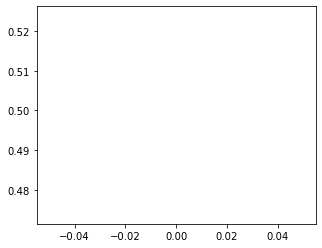

<Figure size 432x288 with 0 Axes>

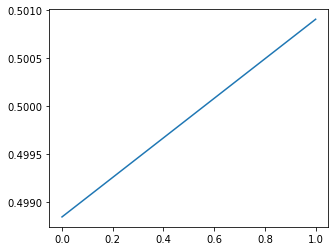

<Figure size 432x288 with 0 Axes>

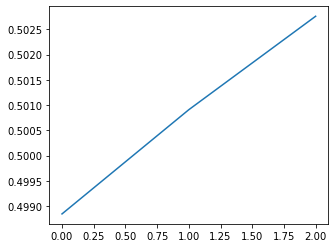

<Figure size 432x288 with 0 Axes>

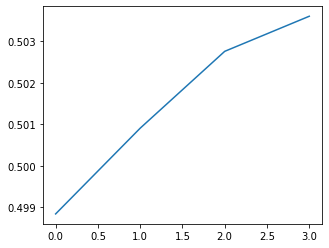

<Figure size 432x288 with 0 Axes>

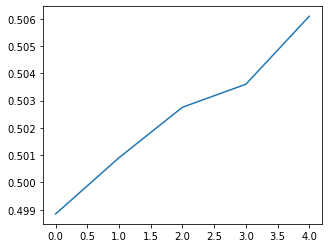

<Figure size 432x288 with 0 Axes>

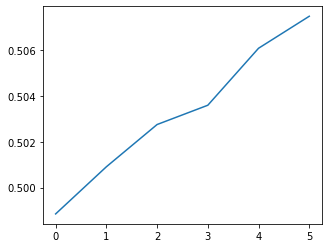

<Figure size 432x288 with 0 Axes>

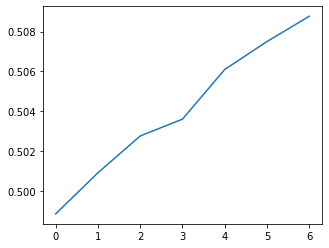

<Figure size 432x288 with 0 Axes>

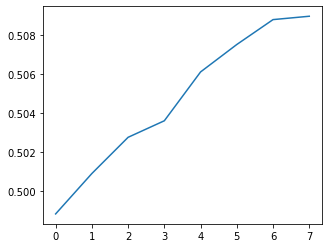

<Figure size 432x288 with 0 Axes>

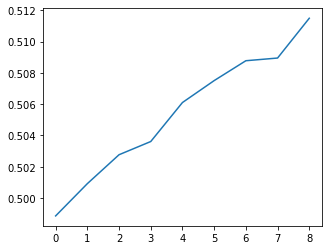

<Figure size 432x288 with 0 Axes>

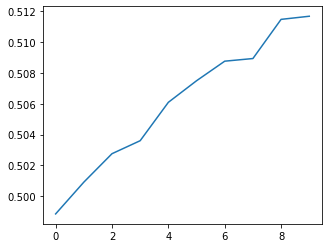

<Figure size 432x288 with 0 Axes>

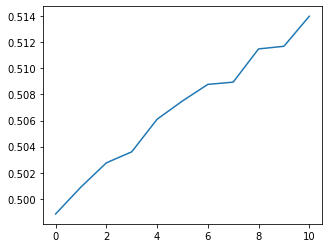

<Figure size 432x288 with 0 Axes>

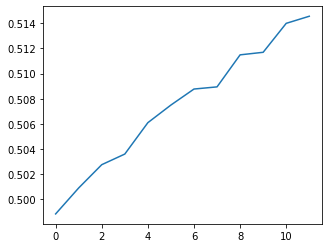

<Figure size 432x288 with 0 Axes>

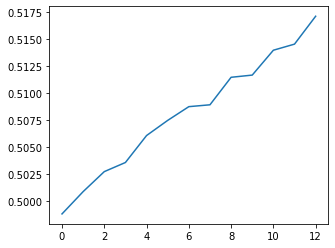

<Figure size 432x288 with 0 Axes>

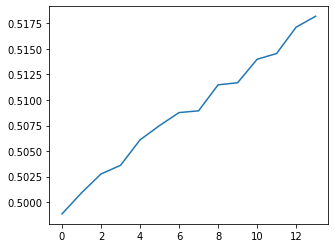

<Figure size 432x288 with 0 Axes>

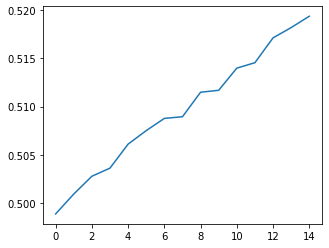

<Figure size 432x288 with 0 Axes>

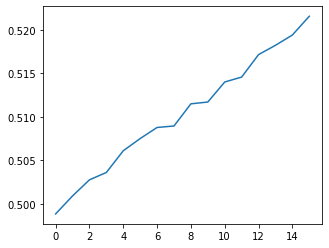

<Figure size 432x288 with 0 Axes>

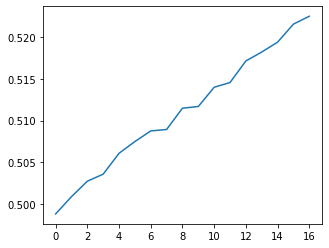

<Figure size 432x288 with 0 Axes>

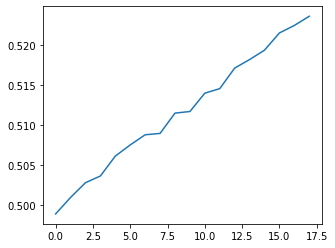

<Figure size 432x288 with 0 Axes>

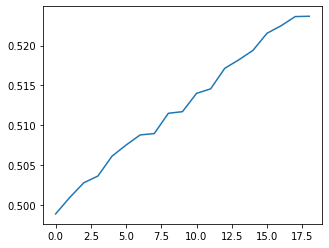

<Figure size 432x288 with 0 Axes>

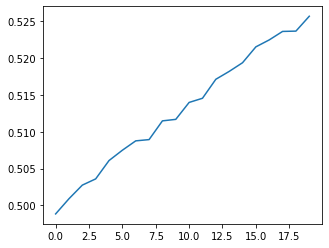

<Figure size 432x288 with 0 Axes>

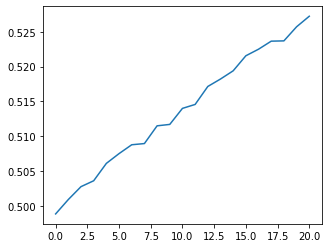

<Figure size 432x288 with 0 Axes>

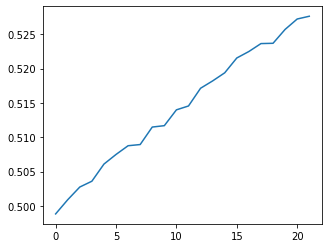

<Figure size 432x288 with 0 Axes>

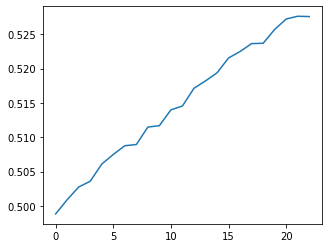

<Figure size 432x288 with 0 Axes>

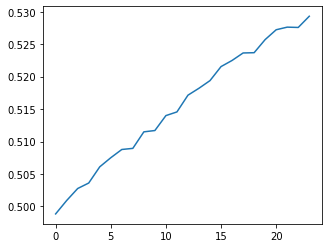

<Figure size 432x288 with 0 Axes>

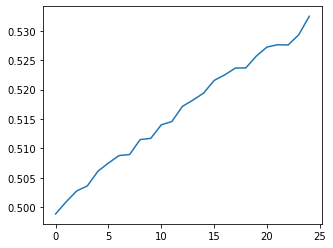

<Figure size 432x288 with 0 Axes>

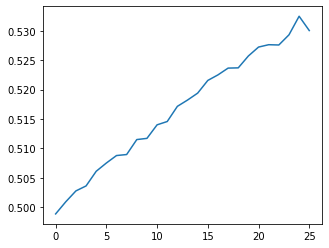

<Figure size 432x288 with 0 Axes>

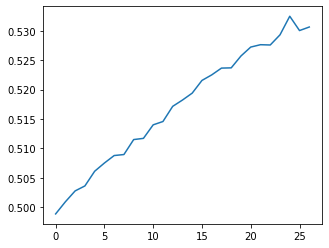

<Figure size 432x288 with 0 Axes>

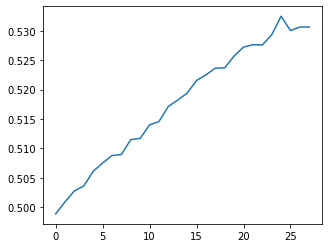

<Figure size 432x288 with 0 Axes>

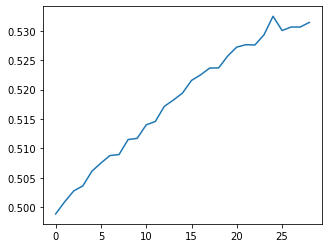

<Figure size 432x288 with 0 Axes>

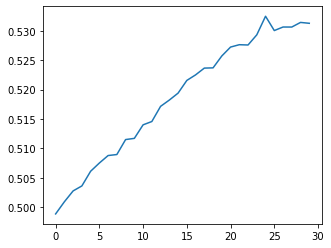

<Figure size 432x288 with 0 Axes>

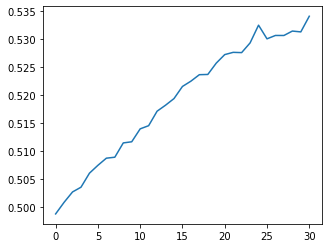

<Figure size 432x288 with 0 Axes>

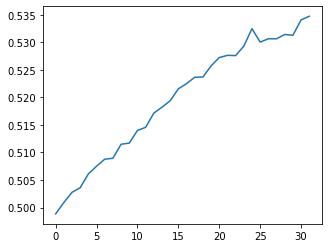

<Figure size 432x288 with 0 Axes>

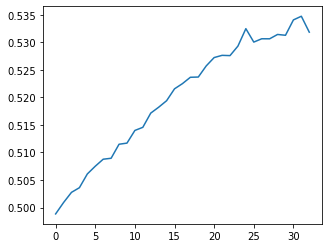

<Figure size 432x288 with 0 Axes>

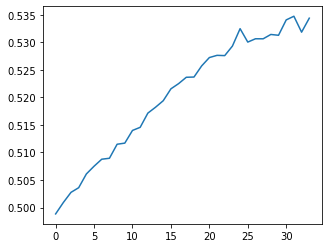

<Figure size 432x288 with 0 Axes>

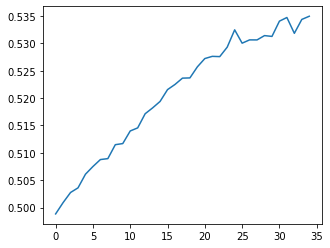

<Figure size 432x288 with 0 Axes>

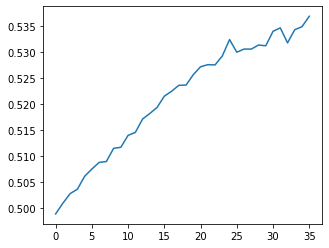

<Figure size 432x288 with 0 Axes>

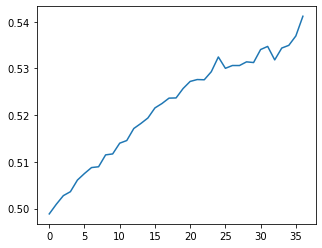

<Figure size 432x288 with 0 Axes>

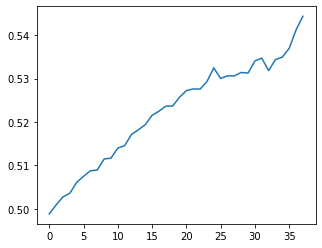

<Figure size 432x288 with 0 Axes>

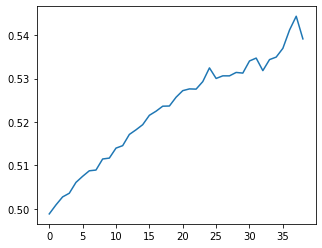

<Figure size 432x288 with 0 Axes>

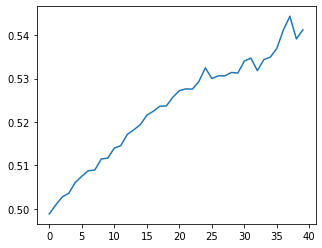

<Figure size 432x288 with 0 Axes>

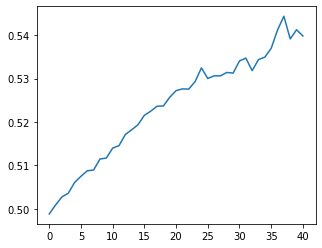

<Figure size 432x288 with 0 Axes>

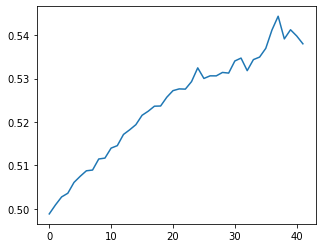

<Figure size 432x288 with 0 Axes>

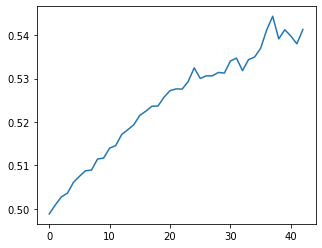

<Figure size 432x288 with 0 Axes>

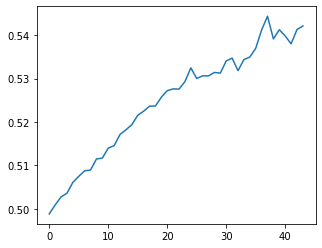

<Figure size 432x288 with 0 Axes>

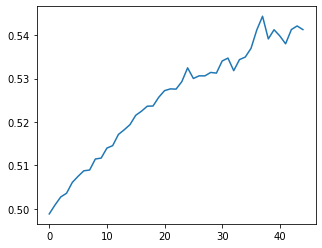

<Figure size 432x288 with 0 Axes>

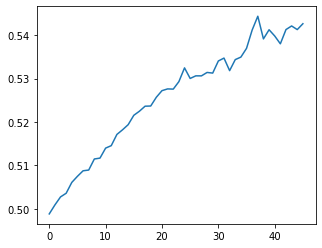

<Figure size 432x288 with 0 Axes>

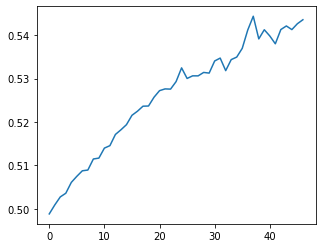

<Figure size 432x288 with 0 Axes>

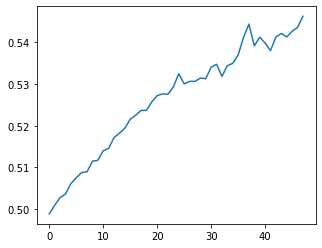

<Figure size 432x288 with 0 Axes>

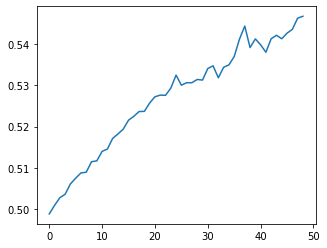

<Figure size 432x288 with 0 Axes>

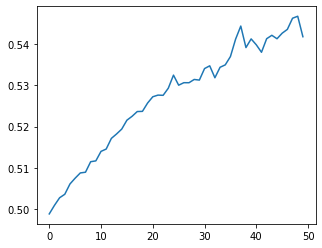

<Figure size 432x288 with 0 Axes>

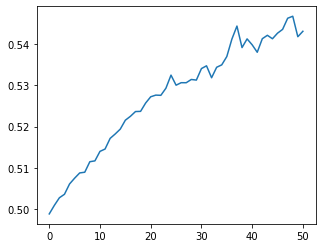

<Figure size 432x288 with 0 Axes>

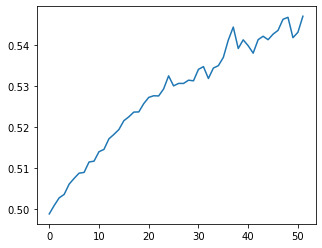

<Figure size 432x288 with 0 Axes>

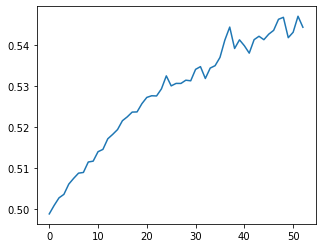

<Figure size 432x288 with 0 Axes>

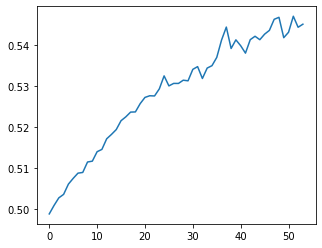

<Figure size 432x288 with 0 Axes>

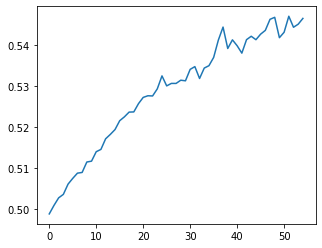

<Figure size 432x288 with 0 Axes>

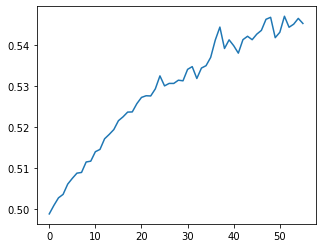

<Figure size 432x288 with 0 Axes>

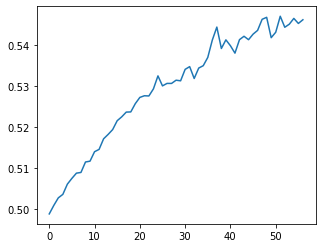

<Figure size 432x288 with 0 Axes>

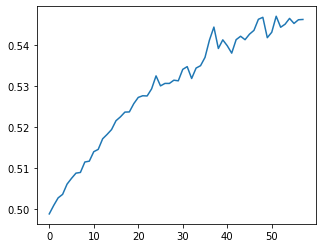

<Figure size 432x288 with 0 Axes>

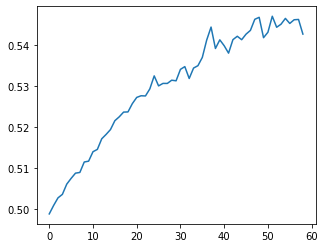

<Figure size 432x288 with 0 Axes>

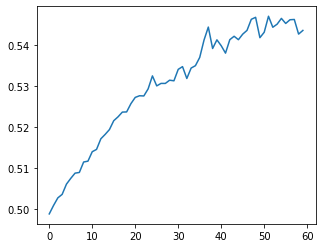

<Figure size 432x288 with 0 Axes>

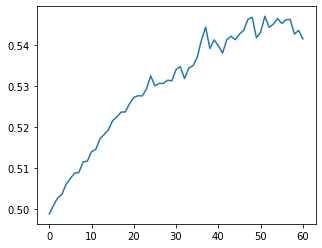

<Figure size 432x288 with 0 Axes>

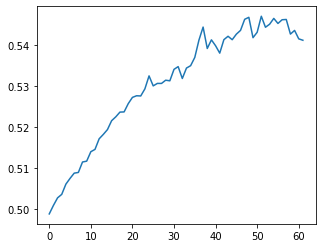

<Figure size 432x288 with 0 Axes>

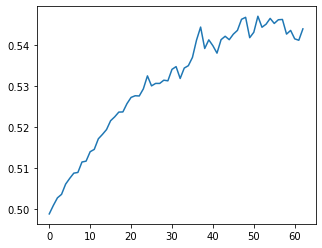

<Figure size 432x288 with 0 Axes>

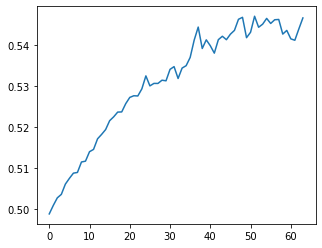

<Figure size 432x288 with 0 Axes>

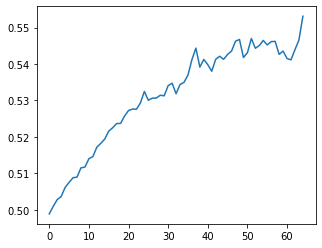

<Figure size 432x288 with 0 Axes>

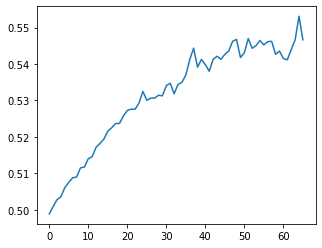

<Figure size 432x288 with 0 Axes>

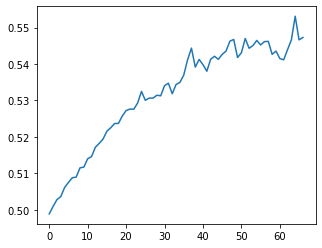

<Figure size 432x288 with 0 Axes>

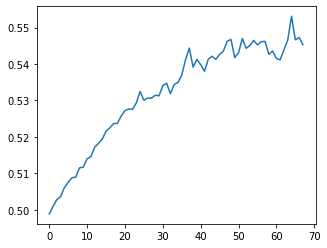

<Figure size 432x288 with 0 Axes>

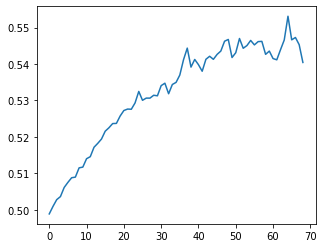

<Figure size 432x288 with 0 Axes>

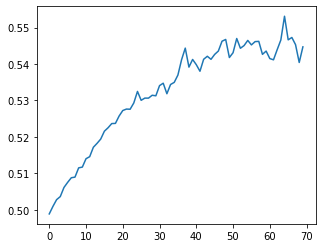

<Figure size 432x288 with 0 Axes>

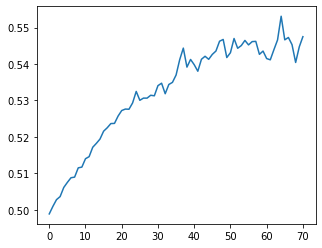

<Figure size 432x288 with 0 Axes>

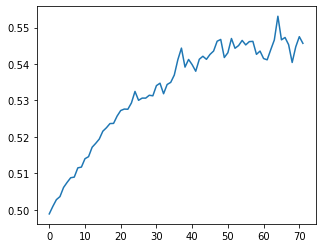

<Figure size 432x288 with 0 Axes>

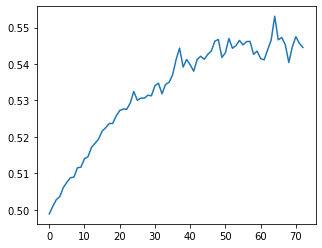

<Figure size 432x288 with 0 Axes>

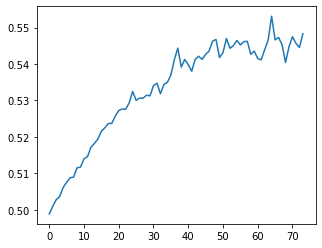

<Figure size 432x288 with 0 Axes>

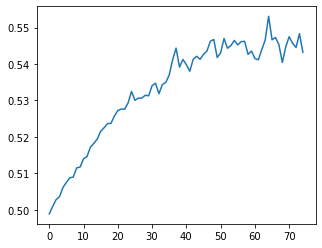

<Figure size 432x288 with 0 Axes>

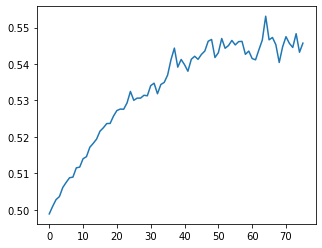

<Figure size 432x288 with 0 Axes>

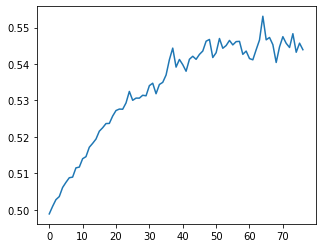

<Figure size 432x288 with 0 Axes>

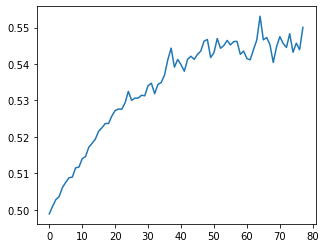

<Figure size 432x288 with 0 Axes>

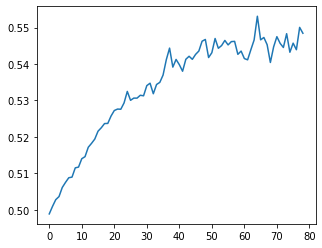

<Figure size 432x288 with 0 Axes>

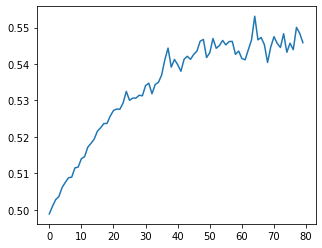

<Figure size 432x288 with 0 Axes>

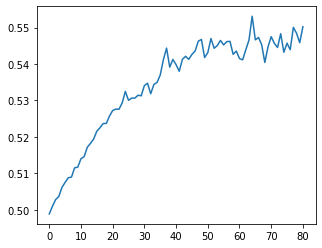

<Figure size 432x288 with 0 Axes>

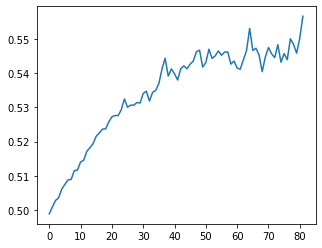

<Figure size 432x288 with 0 Axes>

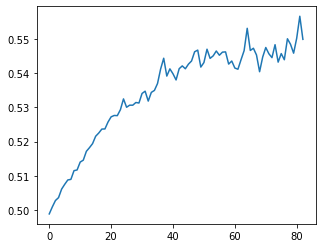

<Figure size 432x288 with 0 Axes>

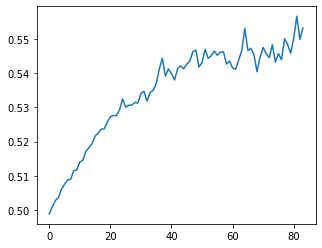

<Figure size 432x288 with 0 Axes>

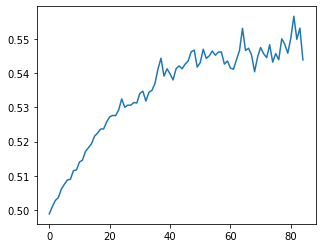

<Figure size 432x288 with 0 Axes>

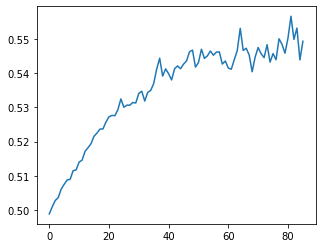

<Figure size 432x288 with 0 Axes>

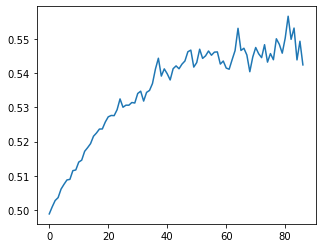

<Figure size 432x288 with 0 Axes>

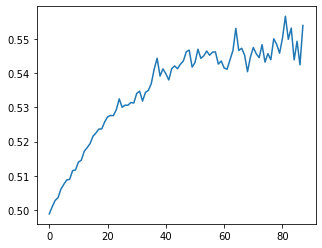

<Figure size 432x288 with 0 Axes>

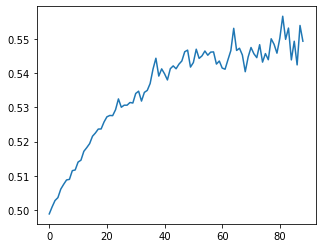

<Figure size 432x288 with 0 Axes>

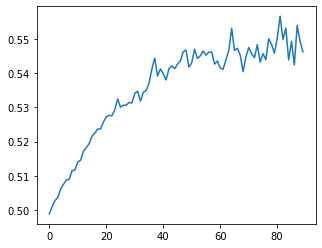

<Figure size 432x288 with 0 Axes>

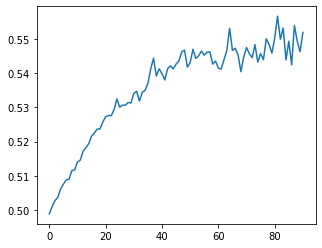

<Figure size 432x288 with 0 Axes>

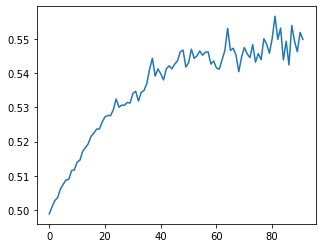

<Figure size 432x288 with 0 Axes>

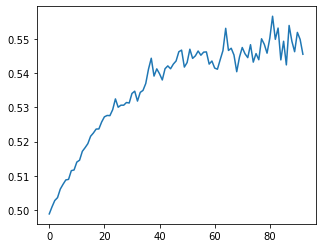

<Figure size 432x288 with 0 Axes>

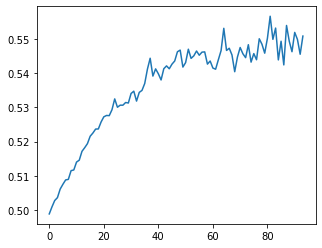

<Figure size 432x288 with 0 Axes>

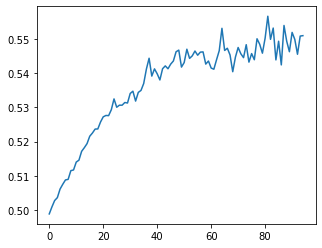

<Figure size 432x288 with 0 Axes>

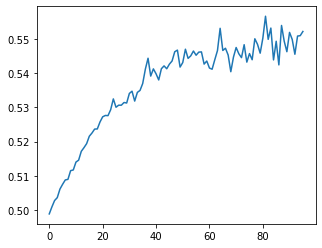

<Figure size 432x288 with 0 Axes>

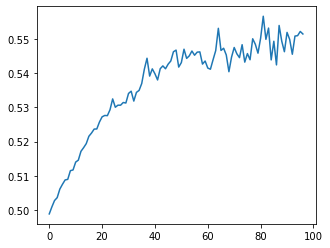

<Figure size 432x288 with 0 Axes>

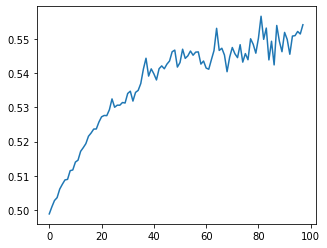

<Figure size 432x288 with 0 Axes>

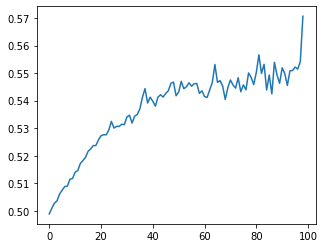

<Figure size 432x288 with 0 Axes>

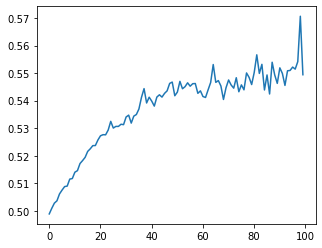

<Figure size 432x288 with 0 Axes>

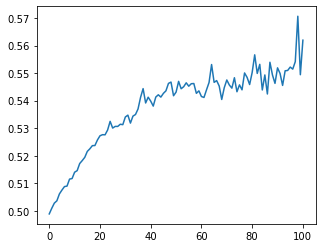

<Figure size 432x288 with 0 Axes>

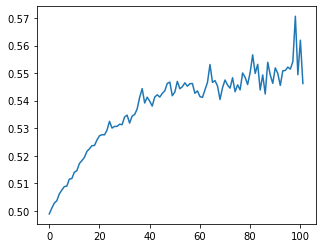

<Figure size 432x288 with 0 Axes>

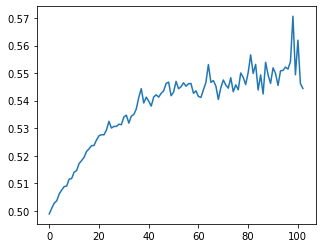

<Figure size 432x288 with 0 Axes>

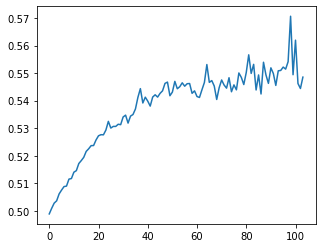

<Figure size 432x288 with 0 Axes>

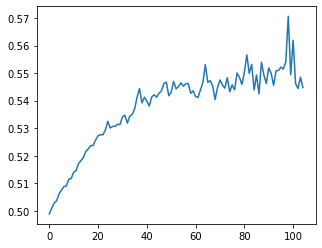

<Figure size 432x288 with 0 Axes>

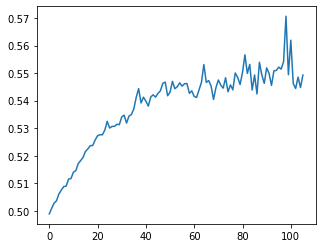

KeyboardInterrupt: 

In [40]:
x = []
y = []

results_matrix = np.zeros([49,100])
ii = -1
jj = -1
hj=0

for k in range(2,3,1):
    ii = ii+1
    jj=-1
    for o in range(10,11,1):
        jj = jj+1
        for i in range(1):
            nof = k
            n = 200
            d=[]
            c=[]
            LIF = LIF_Network(n_neurons=n)
            dt = LIF.dt

            T = 5000
            I = np.zeros(shape = [T,n])
            # add impulses to the outside actvity
            stim = np.zeros([T,nof]) 
            ConnStimNetwork = np.zeros([nof,n])
            probability = 0.2

            for c in range(n):
                for c2 in range(nof):
                    Q = np.random.randint(0, high=99)
                    if Q/100 < probability:
                        ConnStimNetwork[c2,c] = 1

            stimorder = np.arange(nof)
            np.random.shuffle(stimorder)

            freq = o
            num = int((T/freq)/dt)
            stim_length = int(T/nof)

            for j in range(0,nof):
                for i in range(j*stim_length,(j+1)*stim_length,num): 
                    if i<T:
                        stim[i][stimorder[j]] = 1 
                        I[i] [ConnStimNetwork[j,:]>0] = 1

            %matplotlib inline
            fig = plt.figure()
            #fig.set_size_inches(22, 15)
            #ax = fig.add_subplot()
          #plt.imshow(I.T,aspect='equal',interpolation='none')
          #ax.set_aspect('auto')
          #plt.ylabel('Neuron index')
          #plt.xlabel('Connectivity to other neurons')
          #plt.title('Connectivity map')
          #plt.colorbar()
          #plt.show()
            c=[]
            f=[]
            for simcount in range(200):
                W1 = np.copy(LIF.network_W)
                mean_W1 = np.mean(W1[W1 > 0].flatten())

                plotter2(LIF,T*dt, I, pN = 5)

                W2 = np.copy(LIF.network_W)
                mean_W2 = np.mean(W2[W1 > 0].flatten())
                c.append(mean_W2)

                mean_W3 = mean_W2-mean_W1
                d.append(mean_W3)
                f.append(simcount)
                fig = plt.figure()
                fig.set_size_inches(5, 4)
                ax = fig.add_subplot()
                plt.plot(f,c)
                plt.show()


        #print(o,  mean_W3)
        h=sum(d) / len(d)
        x.append(o)
        y.append(h)
        results_matrix[ii][jj]=mean_W2
        #print(results_matrix)
        #print(o)
        #plt.plot(x,y)
        #plt.show()
        hj = hj+1
        print(hj, mean_W2)
        %matplotlib inline
        fig = plt.figure()
        fig.set_size_inches(5, 4)
        ax = fig.add_subplot()
        plt.imshow(np.flipud(results_matrix),aspect='equal',interpolation='none')
        plt.colorbar()
        ax.set_aspect('auto')
        plt.ylabel('number of nodes')
        plt.xlabel('frequency')
        plt.show()

In [3]:
#@title Plotting function
def plotter(LIF,time,pN = 5):

  fig = plt.figure()
  ax = fig.add_subplot(projection='3d')
  ax.scatter(LIF.x,LIF.y,LIF.z)
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('Z')
  ax.set_title('Location of cells')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  fig.set_size_inches(20, 16)
  ax = fig.add_subplot()
  plt.imshow(LIF.network_conn,aspect='equal',interpolation='none')
  ax.set_aspect('auto')
  plt.ylabel('Neuron index')
  plt.xlabel('Connectivity to other neurons')
  plt.title('Connectivity map')
  
  plt.show()
  print(np.mean(LIF.network_conn.flatten()))

  %matplotlib inline
  fig = plt.figure()
  fig.set_size_inches(20, 16)
  ax = fig.add_subplot()
  plt.imshow(LIF.network_W,aspect='equal',interpolation='none')
  plt.colorbar()
  ax.set_aspect('auto')
  plt.ylabel('Neuron index')
  plt.xlabel('Weight to other neurons')
  plt.title('Weights pre-training')
  plt.show()

  W = np.copy(LIF.network_W)
  Wf = W.flatten()
  %matplotlib inline
  fig = plt.figure()
  plt.plot(np.sort(Wf[Wf>0]))
  plt.xlabel('order of weights')
  plt.ylabel('weight')
  plt.title('Sorted weights pre-training')
  plt.show()
  print(np.mean(W[W > 0].flatten()))

  h = LIF.simulate(timesteps = time)
  [v,g,p,t,inp,dw] = h
  W2 = LIF.network_W
  
  %matplotlib inline
  fig = plt.figure()
  ax = fig.add_subplot()
  fig.set_size_inches(20, 16)
  plt.imshow(W2,aspect='equal',interpolation='none')
  plt.colorbar()
  ax.set_aspect('auto')
  plt.ylabel('Neuron index')
  plt.xlabel('Weight to other neurons')
  plt.title('Weights after-training')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  ax = fig.add_subplot()
  fig.set_size_inches(20, 16)
  plt.imshow((W2-W),aspect='equal',interpolation='none')
  plt.colorbar()
  ax.set_aspect('auto')
  plt.ylabel('Neuron index')
  plt.xlabel('Weight to other neurons')
  plt.title('Change in Weights after-training')
  plt.show()

  print(np.mean(W2[W2 > 0].flatten()))
  Wf2 = W2.flatten()
  %matplotlib inline
  fig = plt.figure()
  plt.plot(np.sort(Wf[Wf>0]))
  plt.plot(np.sort(Wf2[Wf>0]))
  plt.xlabel('order of weights')
  plt.ylabel('weight')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  for i in range(pN):
    plt.plot(t,v[:,i]-i*100)
  plt.xlabel('time [ms]')
  plt.ylabel('neural voltage (offset by index)')
  plt.title('example neural activity')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  for i in range(pN):
    plt.plot(t,g[:,i]-i*50)
  plt.xlabel('time [ms]')
  plt.ylabel('syaptic current (offset by index)')
  plt.title('example neural currents')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  for i in range(pN):
    plt.plot(t,p[:,i]-i*1)
  plt.xlabel('time [ms]')
  plt.ylabel('poisson spikes (offset by index)')
  plt.title('example external inputs')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  for i in range(2):
    plt.plot(t,inp[:,i])
  plt.xlabel('time [ms]')
  plt.ylabel('poisson spikes (offset by index)')
  plt.title('example internal inputs')
  plt.show()

  %matplotlib inline
  fig = plt.figure()
  plt.plot(t,dw)
  plt.xlabel('time [ms]')
  plt.ylabel('weight changes')
  plt.title('dW')
  plt.show()

In [37]:
#@title Plotting function 2
def plotter2(LIF,time,I,pN = 5):

  LIF.simulate(timesteps = time,I=I)
  #[v,g,p,t,inp,dw] = h
  W2 = LIF.network_W

  %matplotlib inline
  fig = plt.figure()
  #for i in range(pN):
    #plt.plot(t,g[:,i]-i*50)
  #plt.xlabel('time [ms]')
  #plt.ylabel('syaptic current (offset by index)')
  #plt.title('example neural currents')
  #plt.show()

We can view our STDP function by running assaySTDP() on the LIF class:

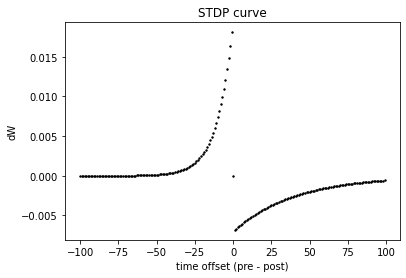

In [ ]:
LIF = LIF_Network(n_neurons=10)
LIF.assaySTDP()

Let's examine a very small network so we can observe the STDP events and line them up with spiking events. This will help us verify that the learning rule is working as we expect it to:

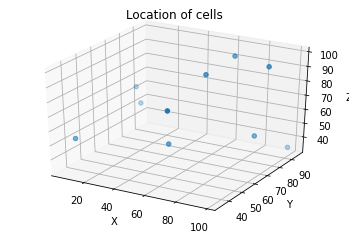

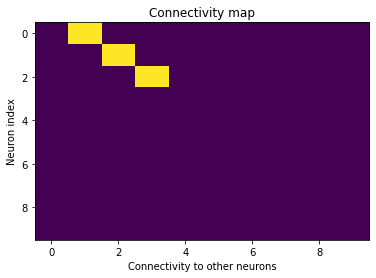

0.03


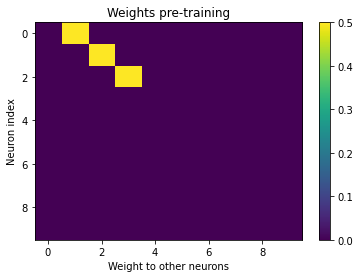

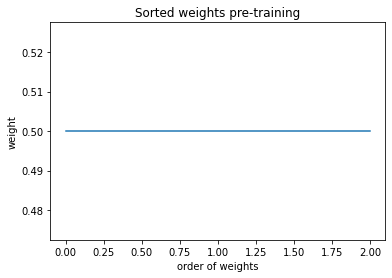

0.5


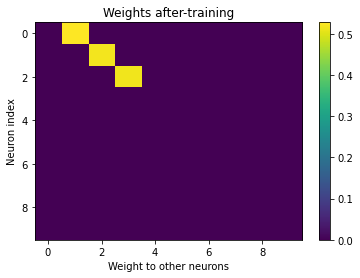

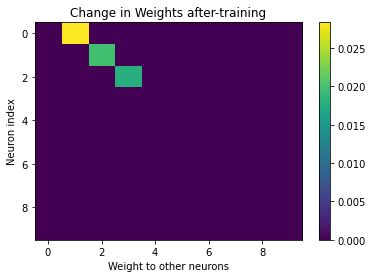

0.5220221929587102


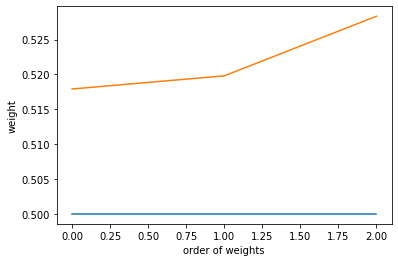

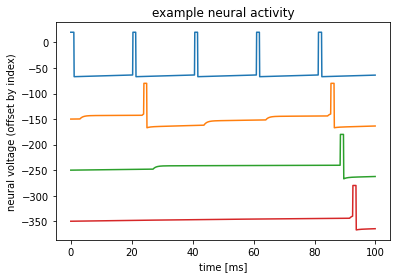

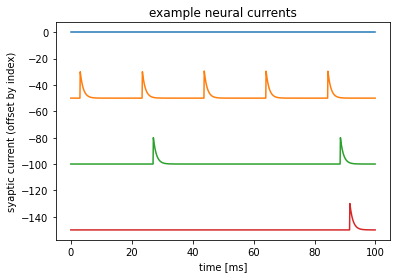

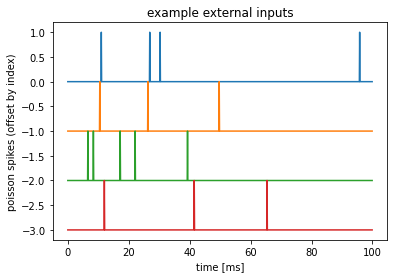

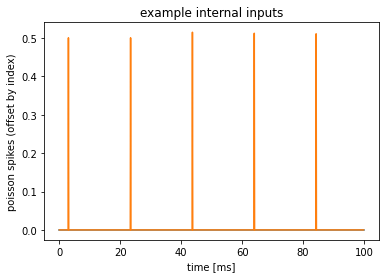

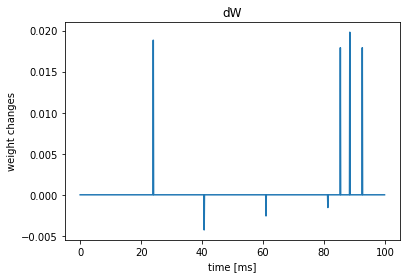

In [ ]:
LIF = LIF_Network(n_neurons=10)
LIF.v = LIF.v * 0 - 50
LIF.v_thr[0] = -70
LIF.v_rf_thr[0] = -65

LIF.network_conn = LIF.network_conn * 0
LIF.network_W = LIF.network_W * 0
for i in range(1,4):
  LIF.network_conn[i-1][i] = 1
  LIF.network_W[i-1][i] = .5

LIF.g_poisson = 0
print(LIF)

plotter(LIF,100,pN = 4)

That seems reasonable. Now lets see what happens when when the first neuron is weakly connected to all other neurons. It should generate some negative plasticity because it is constatly firing without causing spikes in the post-synaptic cells:

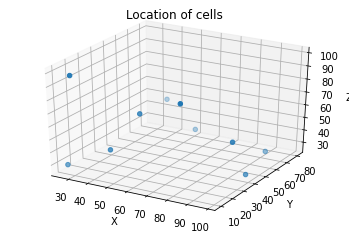

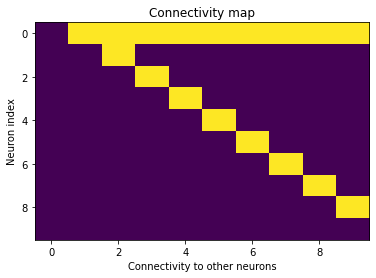

0.17


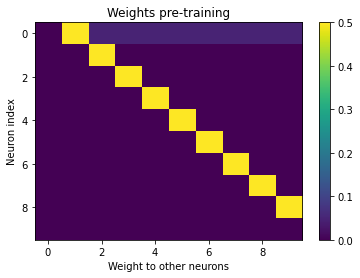

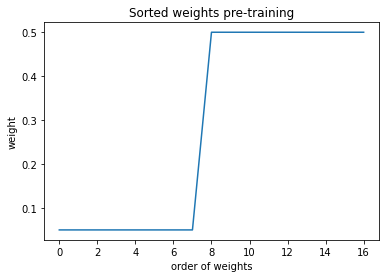

0.2882352941176471


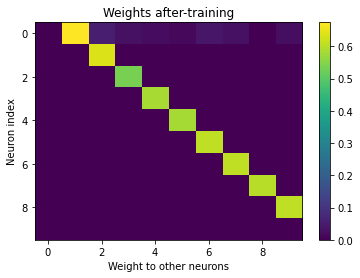

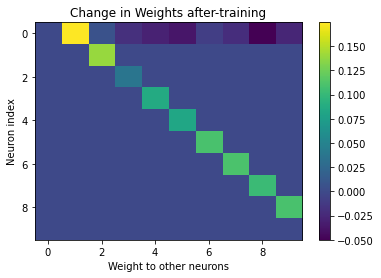

0.3546676136841518


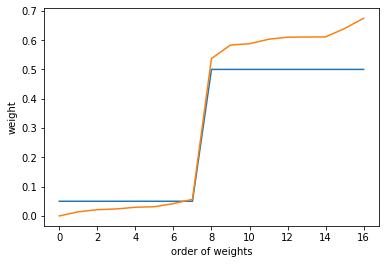

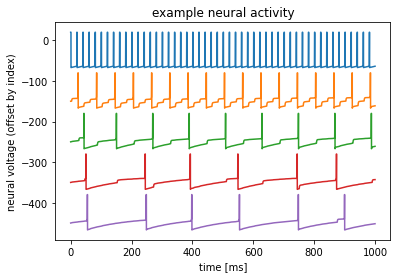

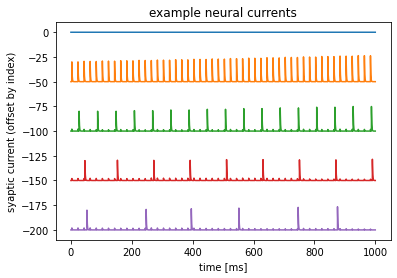

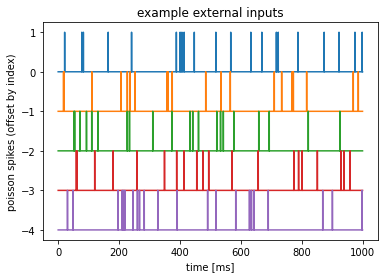

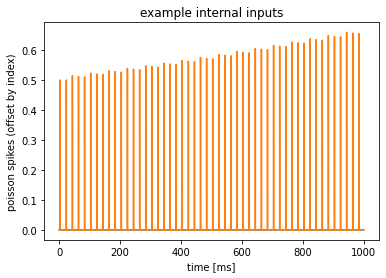

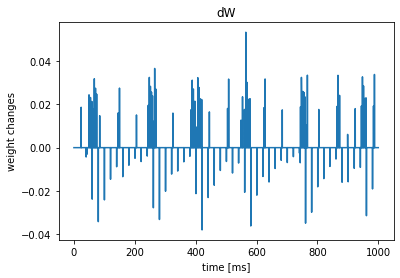

In [ ]:
LIF = LIF_Network(n_neurons=10)

LIF.v = LIF.v * 0 - 50
LIF.v_thr[0] = -70
LIF.v_rf_thr[0] = -65

LIF.network_conn = LIF.network_conn * 0
LIF.network_W = LIF.network_W * 0
for i in range(1,10):
  LIF.network_conn[i-1][i] = 1
  LIF.network_conn[0][i] = 1
  LIF.network_W[i-1][i] = .5
  LIF.network_W[0][i] = .05
LIF.network_W[0][1] = .5 
LIF.network_W[0][0] = 0
LIF.g_poisson = 0
print(LIF)

plotter(LIF,1000)

Great! We see a train of negative weight updates alligned with the firing of cell one. Let's now examine how Beta affects the learning curve, and then try out a LTP biased system vs a LTP biased system:

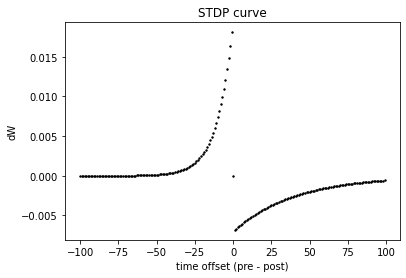

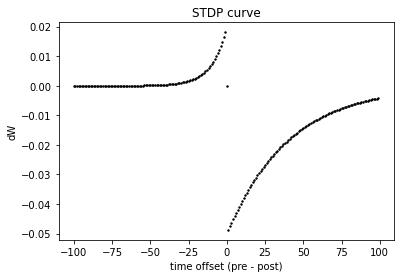

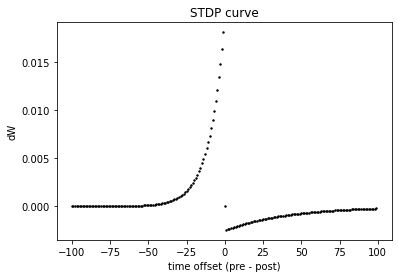

In [ ]:
LIF = LIF_Network(n_neurons=10)
LIF.assaySTDP()

LIF = LIF_Network(n_neurons=10)
LIF.stdp_beta = 10
LIF.assaySTDP()

LIF = LIF_Network(n_neurons=10)
LIF.stdp_beta = .5
LIF.assaySTDP()


We can see that beta affects the magnitude of LTP, so let's see what happens when beta is small:

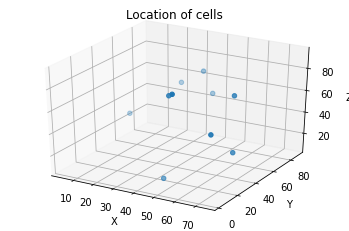

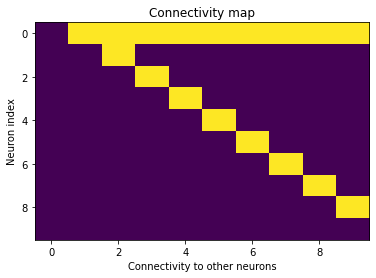

0.17


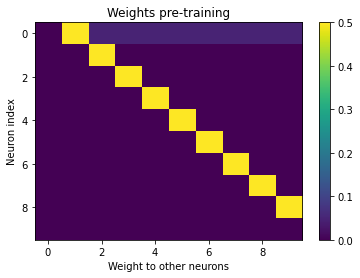

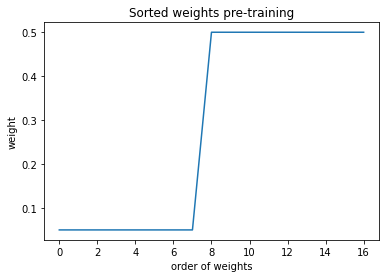

0.2882352941176471


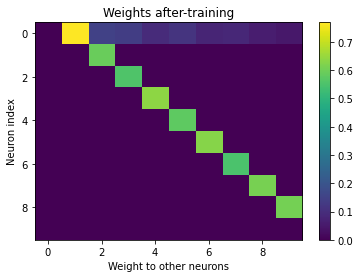

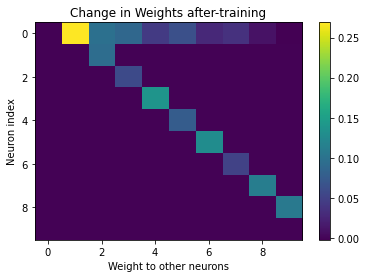

0.3711147420157425


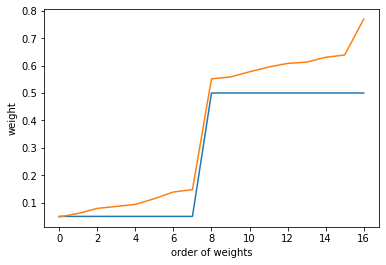

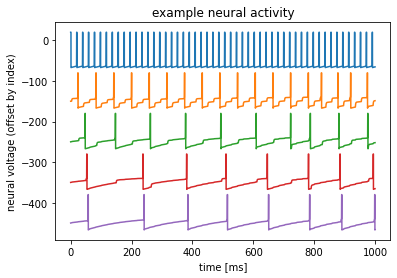

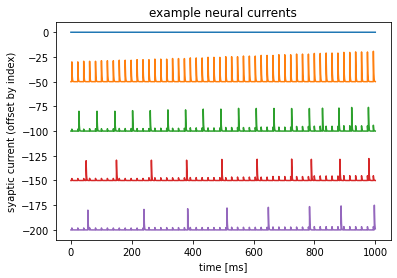

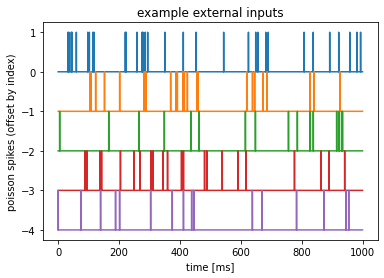

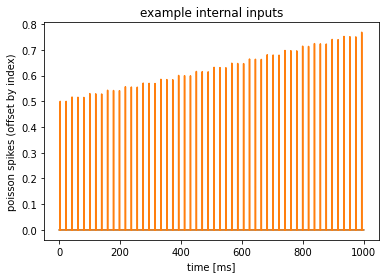

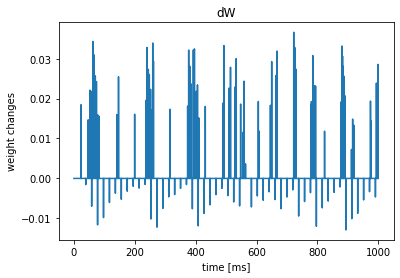

In [ ]:
LIF = LIF_Network(n_neurons=10)
LIF.stdp_beta = .5

LIF.v = LIF.v * 0 - 50
LIF.v_thr[0] = -70
LIF.v_rf_thr[0] = -65

LIF.network_conn = LIF.network_conn * 0
LIF.network_W = LIF.network_W * 0
for i in range(1,10):
  LIF.network_conn[i-1][i] = 1
  LIF.network_conn[0][i] = 1
  LIF.network_W[i-1][i] = .5
  LIF.network_W[0][i] = .05
  
LIF.network_W[0][1] = .5 
LIF.network_W[0][0] = 0
LIF.g_poisson = 0

plotter(LIF,1000)

Even though cell one is not contributing to firing in cells 2-10, it still undergoes LTP because of the learning bias.

Now let's see what happens when beta is large, meaning that LTD is favored:

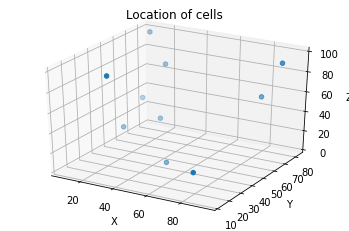

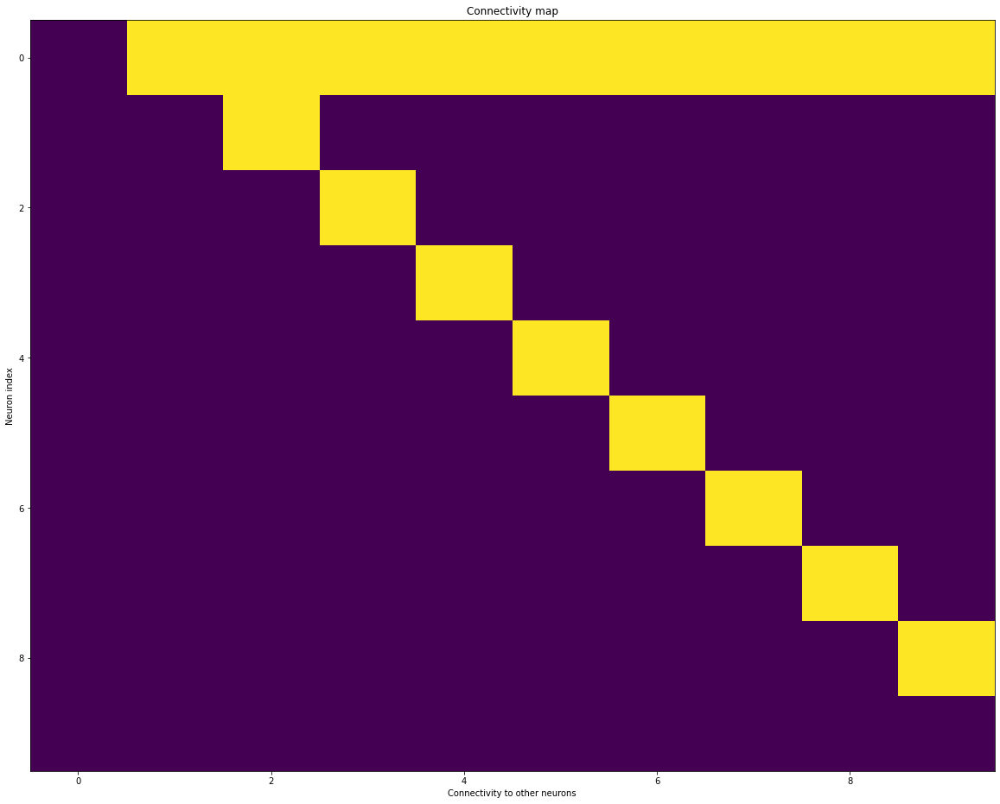

0.17


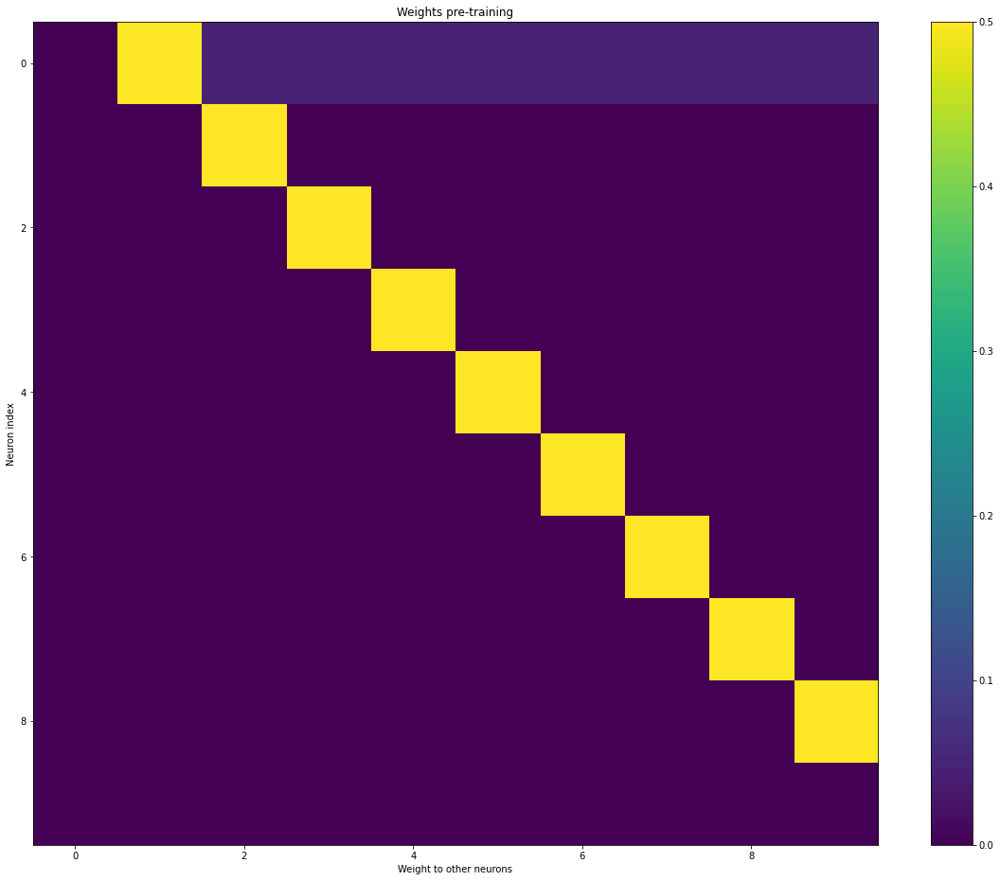

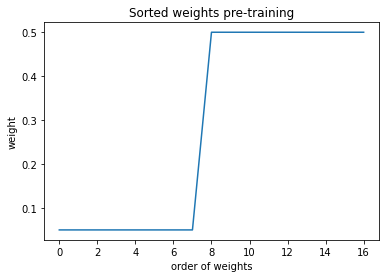

0.2882352941176471


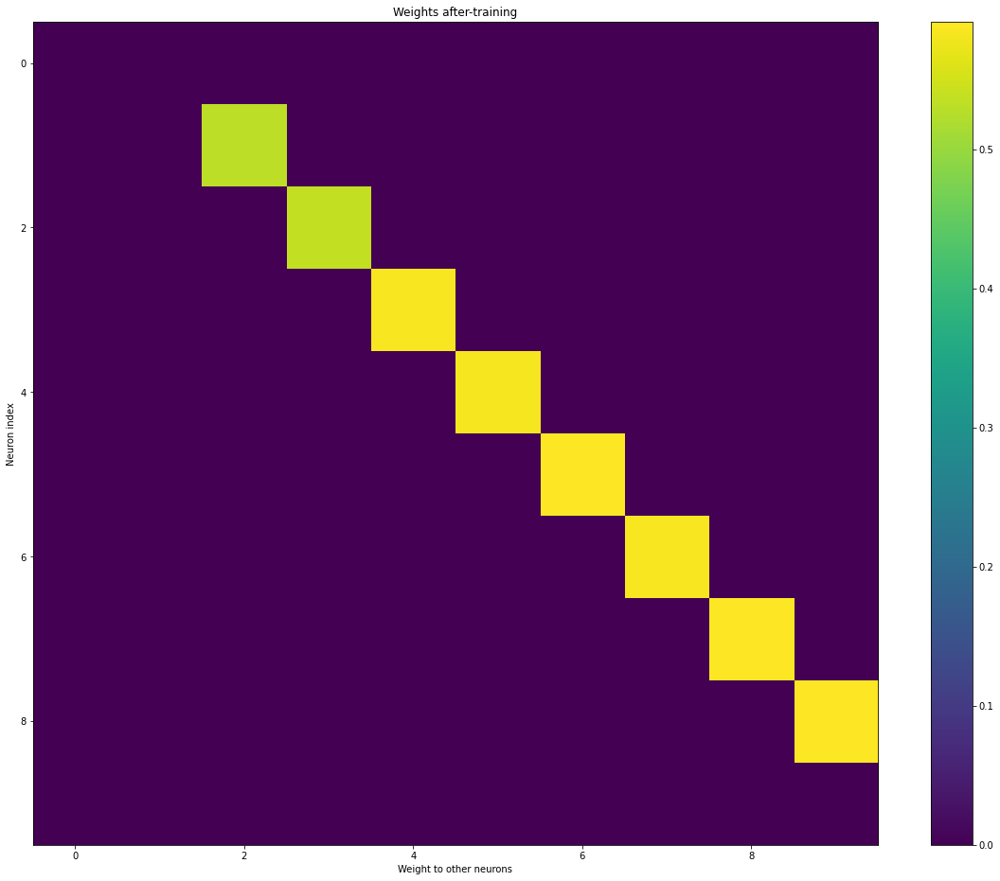

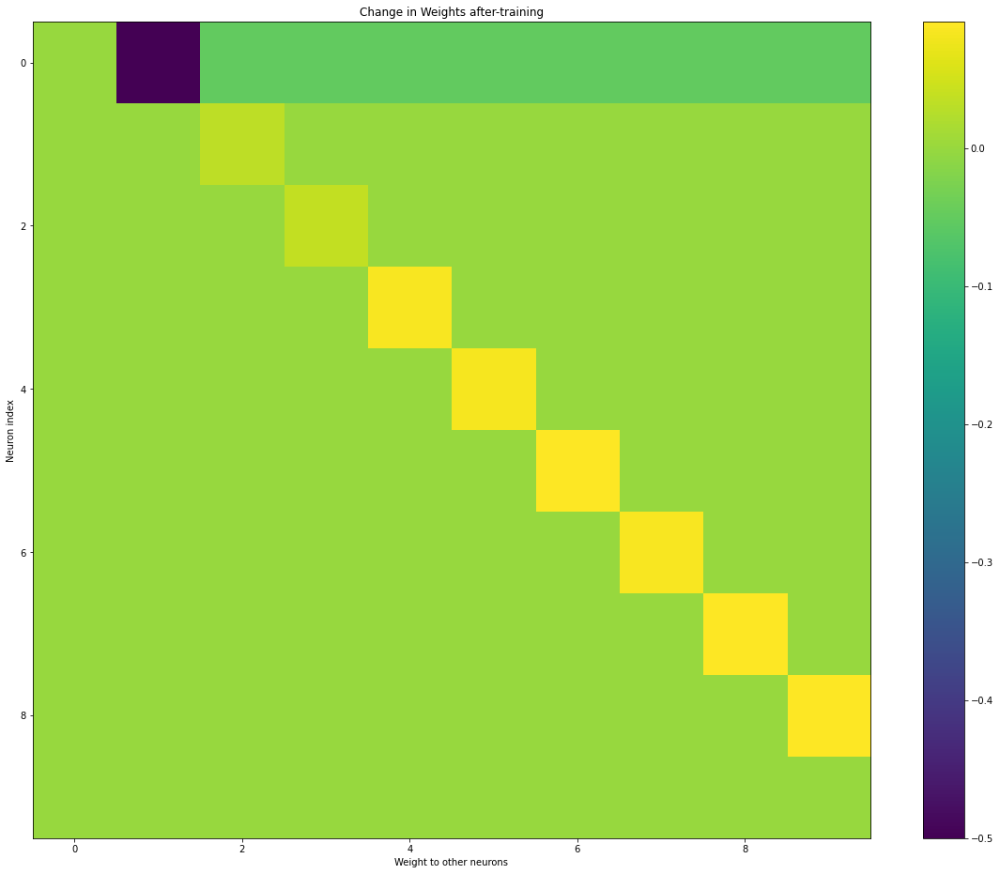

0.574519354857518


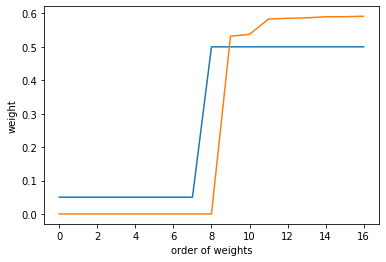

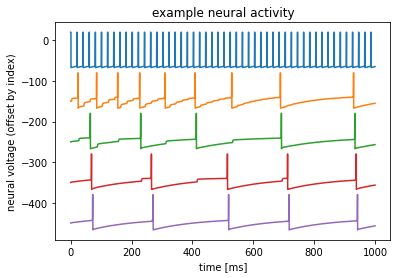

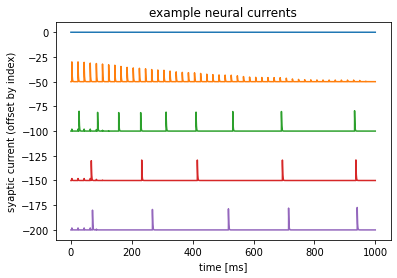

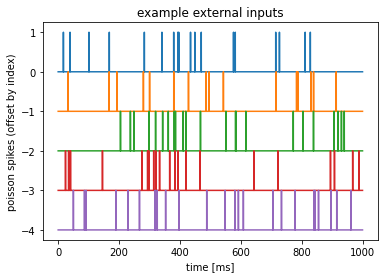

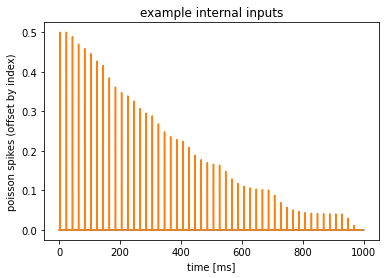

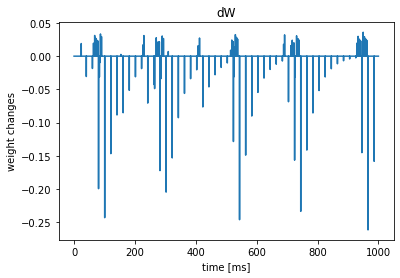

In [ ]:
LIF = LIF_Network(n_neurons=10)
LIF.stdp_beta = 10

LIF.v = LIF.v * 0 - 50
LIF.v_thr[0] = -70
LIF.v_rf_thr[0] = -65

LIF.network_conn = LIF.network_conn * 0
LIF.network_W = LIF.network_W * 0
for i in range(1,10):
  LIF.network_conn[i-1][i] = 1
  LIF.network_conn[0][i] = 1
  LIF.network_W[i-1][i] = .5
  LIF.network_W[0][i] = .05
  
LIF.network_W[0][1] = .5 
LIF.network_W[0][0] = 0
LIF.g_poisson = 0

plotter(LIF,1000)

Looks like we see a massive decrease in weights across the board, as expected.

\Let's now use a more realistic network and run it for 20 seconds to see if we see an overall increase in weights.

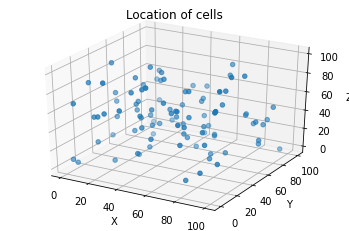

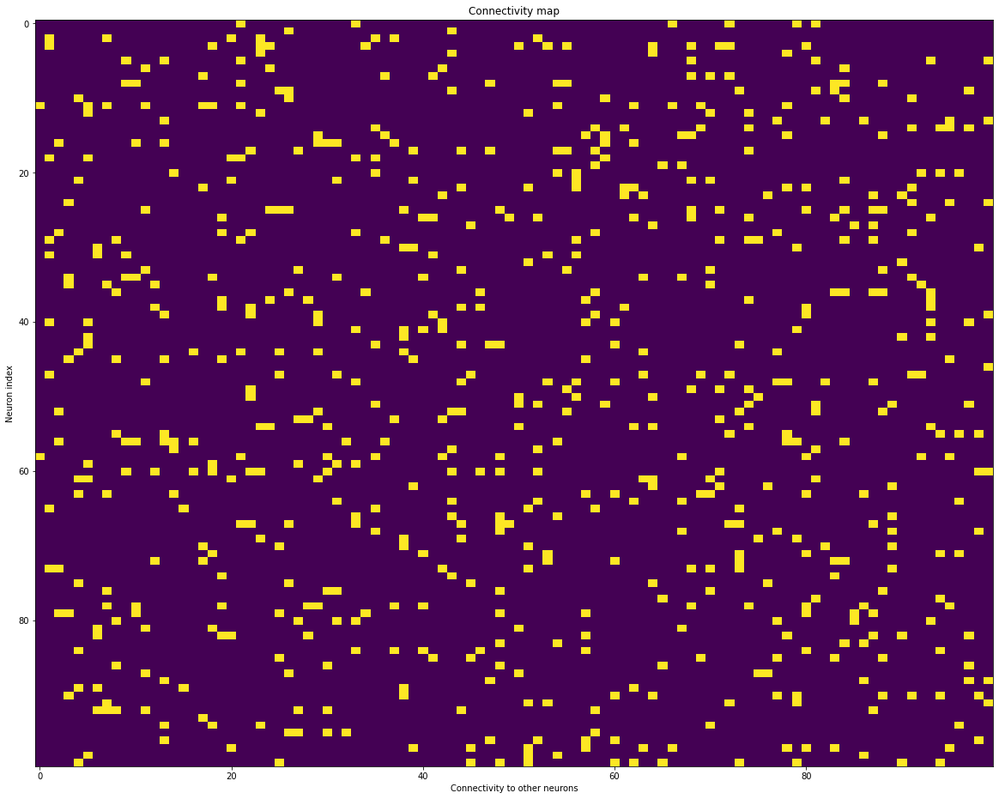

0.0685


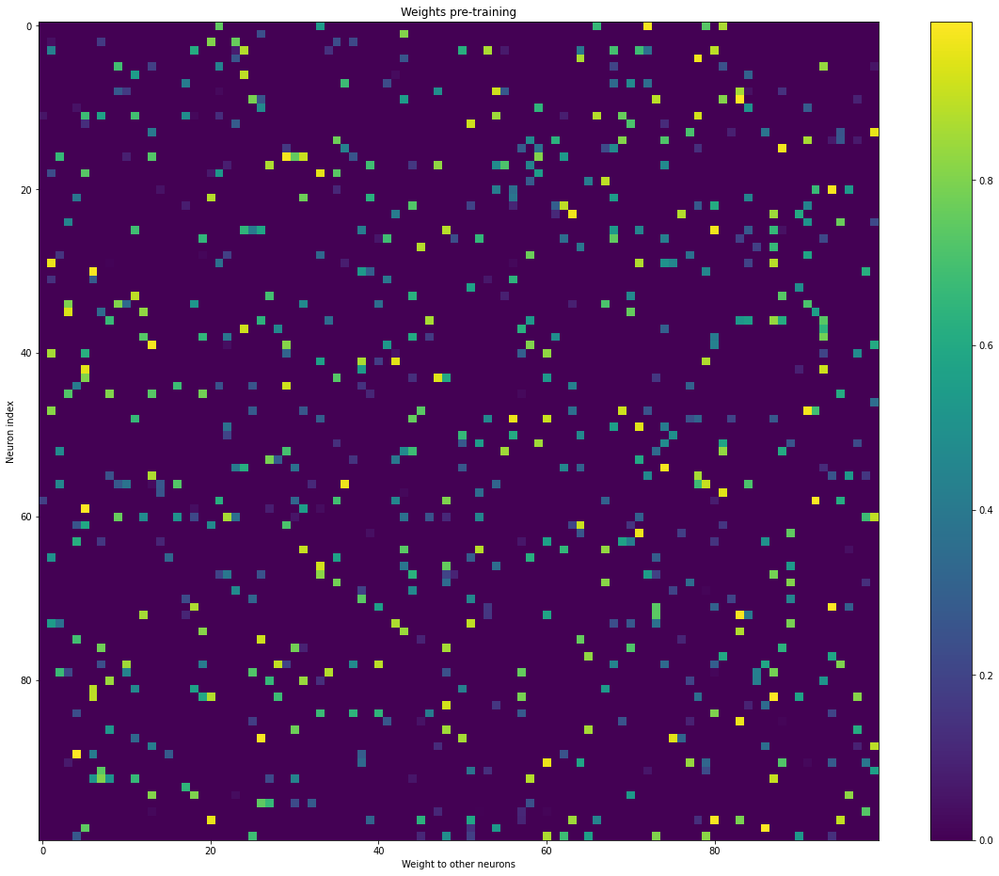

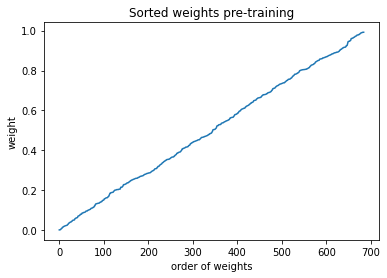

0.49999999999999994


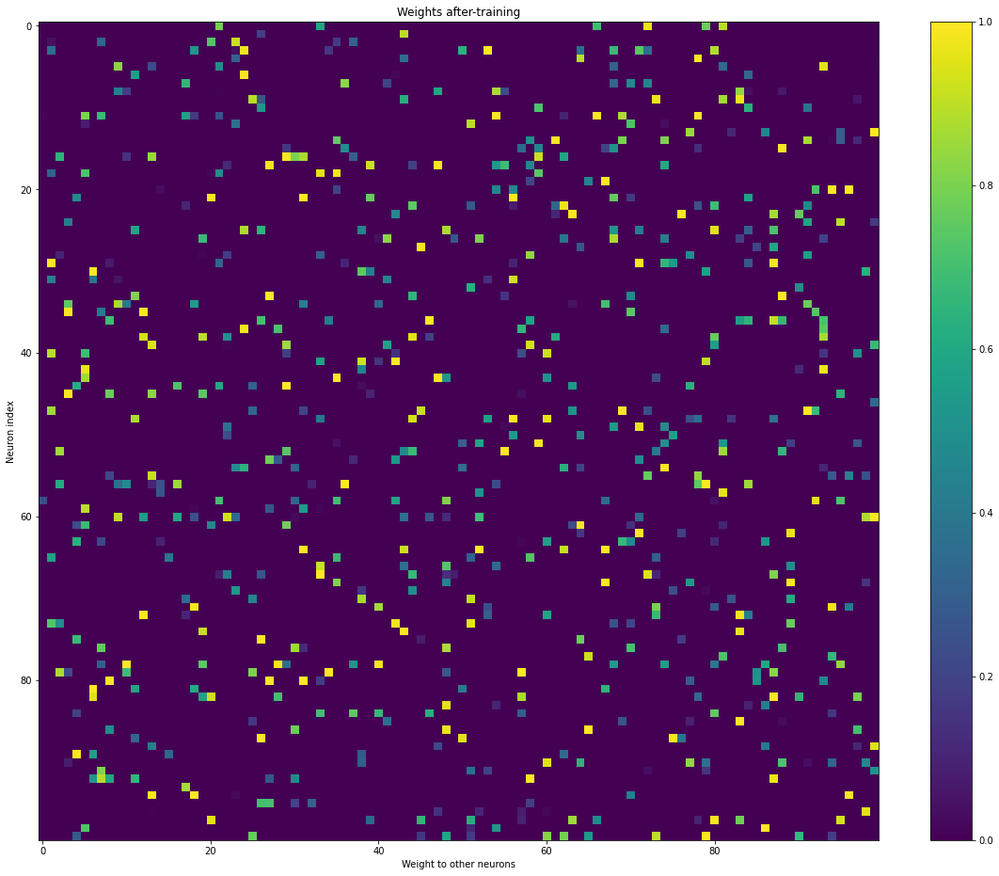

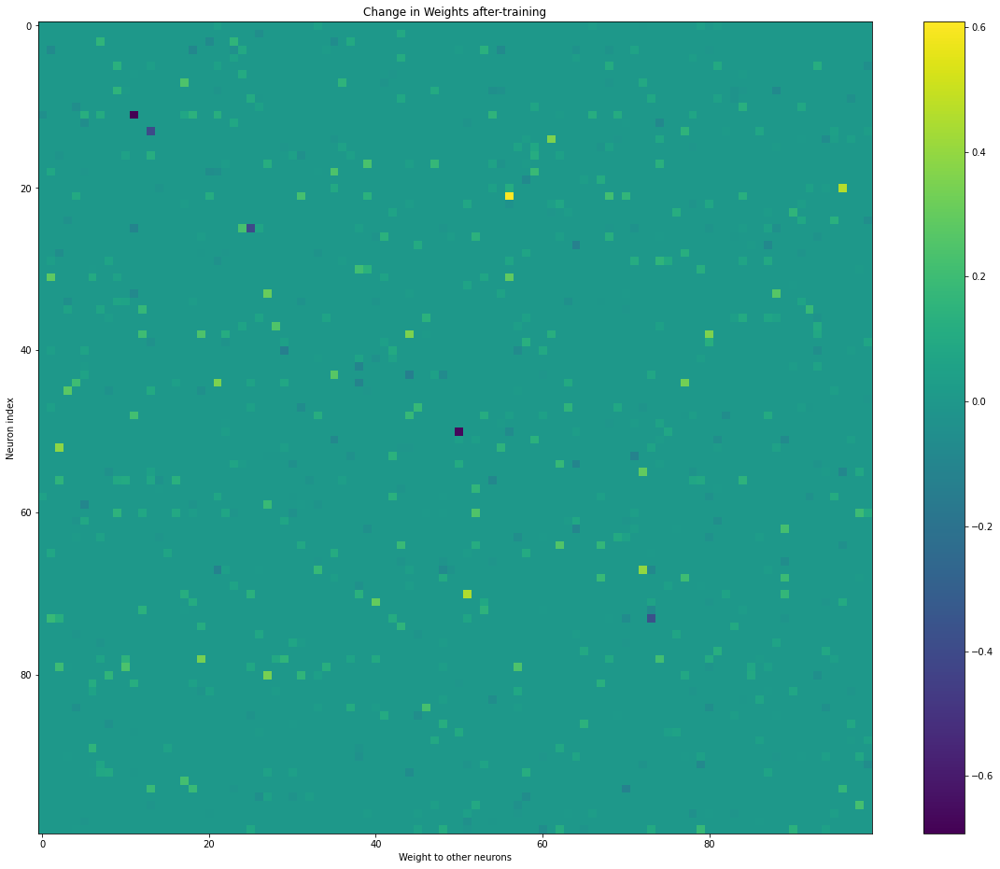

0.5589328190911


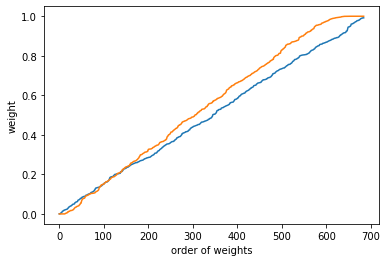

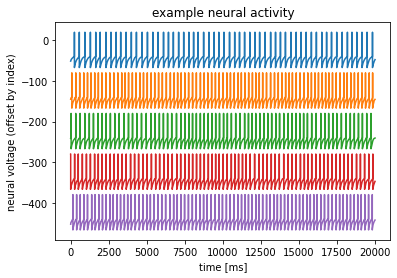

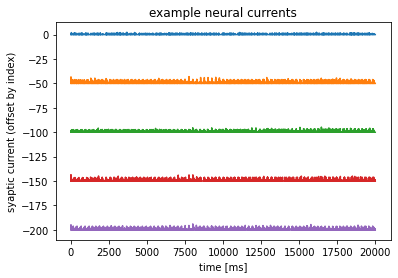

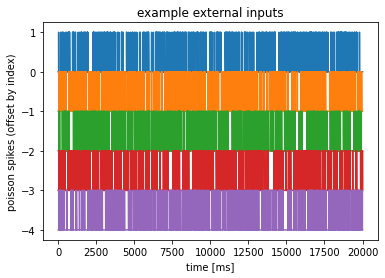

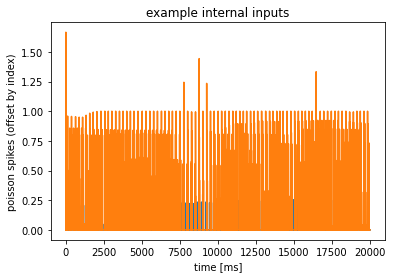

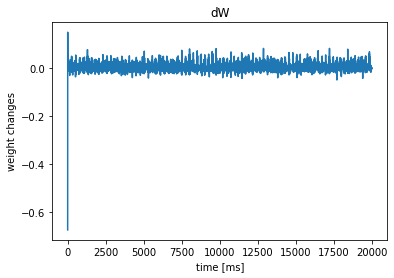

In [ ]:
LIF = LIF_Network(n_neurons= 100)
plotter(LIF,20000)

Seems like there is an overall trend towards increased weights between connected neurons, though some weakly connected neurons seem to be eliminating their weights too.